# All Filters As Autoencoders CNN Experiments Performed using Google Colab's T4 GPU

In [1]:
#now running jobs with integrated colab for vscode...
!nvidia-smi

Mon Aug 24 09:22:20 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   48C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [1]:
from psutil import *
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 85
model name	: Intel(R) Xeon(R) CPU @ 2.00GHz
stepping	: 3
microcode	: 0xffffffff
cpu MHz		: 2000.176
cache size	: 39424 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm mpx avx512f avx512dq rdseed adx smap clflushopt clwb avx512cd avx512bw avx512vl xsaveopt xsavec xgetbv1 xsaves arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data re

In [1]:
!cat /etc/os-release

'cat' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
!cat /etc/os-release

PRETTY_NAME="Ubuntu 22.04.5 LTS"
NAME="Ubuntu"
VERSION_ID="22.04"
VERSION="22.04.5 LTS (Jammy Jellyfish)"
VERSION_CODENAME=jammy
ID=ubuntu
ID_LIKE=debian
HOME_URL="https://www.ubuntu.com/"
SUPPORT_URL="https://help.ubuntu.com/"
BUG_REPORT_URL="https://bugs.launchpad.net/ubuntu/"
PRIVACY_POLICY_URL="https://www.ubuntu.com/legal/terms-and-policies/privacy-policy"
UBUNTU_CODENAME=jammy


In [1]:
!git clone https://github.com/henrybattley/neurons-as-autoencoders.git

Cloning into 'neurons-as-autoencoders'...
remote: Enumerating objects: 1284, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 1284 (delta 38), reused 34 (delta 20), pack-reused 1229 (from 1)
Receiving objects: 100% (1284/1284), 3.64 MiB | 4.90 MiB/s, done.
Resolving deltas: 100% (986/986), done.


In [2]:
#once we have already cloned the repo we can pull it down
%cd neurons-as-autoencoders
!git pull

/content/neurons-as-autoencoders
Already up to date.


In [ ]:
import sys
import os
from pathlib import Path

project_root = Path.cwd().parent
sys.path.append(str(project_root))

In [4]:
#get model
from src.models import nan_cnn

#get experiment
from src.experiments import nan_cnn_experiment


In [1]:
import random
import numpy as np
import pandas as pd
import torch, torchvision
import torch.nn as nn
from torchsummary import summary
import importlib
import matplotlib.pyplot as plt

# Parameter counting...

In [5]:
#count how many params of the model...

#just to make sure we are getting the most current file version 
importlib.reload(nan_cnn)  

device = torch.device('cpu')


model = nan_cnn.FilterCNN(
        input_dims=28,
        pool_kernel_size=2,
        pool_stride=2,
        kernel_size=3,
        stride=1,
        padding=1,
        n_filters=16,
        bias=True,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

filters.0.encoder.weight (1, 1, 3, 3) -> 9
filters.0.encoder.bias (1,) -> 1
filters.0.decoder.weight (1, 1, 3, 3) -> 9
filters.0.decoder.bias (1,) -> 1
filters.1.encoder.weight (1, 1, 3, 3) -> 9
filters.1.encoder.bias (1,) -> 1
filters.1.decoder.weight (1, 1, 3, 3) -> 9
filters.1.decoder.bias (1,) -> 1
filters.2.encoder.weight (1, 1, 3, 3) -> 9
filters.2.encoder.bias (1,) -> 1
filters.2.decoder.weight (1, 1, 3, 3) -> 9
filters.2.decoder.bias (1,) -> 1
filters.3.encoder.weight (1, 1, 3, 3) -> 9
filters.3.encoder.bias (1,) -> 1
filters.3.decoder.weight (1, 1, 3, 3) -> 9
filters.3.decoder.bias (1,) -> 1
filters.4.encoder.weight (1, 1, 3, 3) -> 9
filters.4.encoder.bias (1,) -> 1
filters.4.decoder.weight (1, 1, 3, 3) -> 9
filters.4.decoder.bias (1,) -> 1
filters.5.encoder.weight (1, 1, 3, 3) -> 9
filters.5.encoder.bias (1,) -> 1
filters.5.decoder.weight (1, 1, 3, 3) -> 9
filters.5.decoder.bias (1,) -> 1
filters.6.encoder.weight (1, 1, 3, 3) -> 9
filters.6.encoder.bias (1,) -> 1
filters.6.de

# Thinking about MACs (Multiply accumulate operations)

In [6]:
!pip install thop
from thop import profile

In [9]:
dummy = torch.randn(1, 1, 28, 28)

macs, params = profile(model, inputs=(dummy,))

print(f"MACs   : {macs:,}")

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.ConvTranspose2d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.activation.ReLU'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.pooling.MaxPool2d'>.
[INFO] Register count_linear() for <class 'torch.nn.modules.linear.Linear'>.
MACs   : 144,256.0


In [ ]:
print(f"The above gives the MACs of the forward computation (at inference), that is the classification, which excludes the decoder... In reality the model training as a whole is: \n")

print(f"The encoder: \n {profile(model.filters[0].encoder, inputs=(dummy,))} x 16 for the 16 feature maps \n +")

print(f"The decoder: \n {profile(model.filters[0].decoder, inputs=(dummy,))} x 16 for the 16 feature maps \n +")

print(f"The fully connected layer: \n {profile(model.fc, inputs=(torch.randn(1,3136),))} \n =")


print(f"macs are {7056*2*16+31360}")



The above gives the MACs of the forward computation, that is the classification, which excludes the decoder... In reality the model training as a whole is roughly: 

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
The encoder: 
 (7056.0, 0) x 16 for the 16 feature maps 
 +
[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.ConvTranspose2d'>.
The decoder: 
 (7056.0, 0) x 16 for the 16 feature maps 
 +
[INFO] Register count_linear() for <class 'torch.nn.modules.linear.Linear'>.
The fully connected layer: 
 (31360.0, 0) 
 =
macs are 257152


---------------------Explaining MACS for Kernel-Autoencoding CNN---------------
<br>
for one filter: <br>
28x28 outputs x 3x3 kernels = 784 x 9 = 7056
<br>
For the decoder it's the same = 7056
<br>
so that's 7056 x 2 x 16 for the 16 feature maps = 225,792
<br>
then the classifier does 3136×10 (for the flattened input for each class)
<br>
so this gives 31,360 + 225,792 = 257,152
<br>
<br>

# Getting MNIST Data...

In [5]:
seed = 42

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

In [6]:
# getting data
print("Loading MNIST dataset...")
mnist_raw = torchvision.datasets.MNIST(
    root="./data",
    train=True,
    download=True,
)

#dataset to a GPU-ready float tensor 
# Extract raw PIL data (.data is a 60000x28x28 unit8 tensor)
mnist_images = mnist_raw.data.float() / 255.0  # Scale to [0.0, 1.0]
mnist_images = mnist_images.unsqueeze(1)        # Shape becomes (60000, 1, 28, 28)
mnist_labels = mnist_raw.targets                # Shape (60000,)

#TensorDataset
mnist = torch.utils.data.TensorDataset(mnist_images, mnist_labels)

Loading MNIST dataset...


# Initial Filters as Autoencoders Model Training...
### (Autoencoding cycle and Task cycle computed at every epoch)

In [7]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1881
Epoch [1/1], Task Training Loss: 0.4304, Accuracy: 88.63%
peak memory from train : 56.7958984375
memory now reset and is: 17.552734375 MB
time elapsed: 9.353845809000063
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1944
Epoch [1/100], Task Training Loss: 0.4411, Accuracy: 88.17%
Epoch [2/100], Encoder Training Loss: 0.1170
Epoch [2/100], Task Training Loss: 0.2304, Accuracy: 93.24%
Epoch [3/100], Encoder Training Loss: 0.0850
Epoch [3/100], Task Training Loss: 0.2310, Accuracy: 93.24%
Epoch [4/100], Encoder Training Loss: 0.0665
Epoch [4/100], Task Training Loss: 0.2314, Accuracy: 93.23%
Epoch [5/100], Encoder Training Loss: 0.0534
Epoch [5/100], Task Training Loss: 0.2325, Accuracy: 93.22%
Epoch [6/100], Encoder Training Loss: 0.0436
Epoch [6/100], Task Training Loss: 0.2300, Accuracy: 93.42%
Epoch [7/100], Encoder Training Loss: 0.0360
Epoch [7/100], Task Training Loss: 0.2290, Accuracy: 9

In [8]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

In [12]:
epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

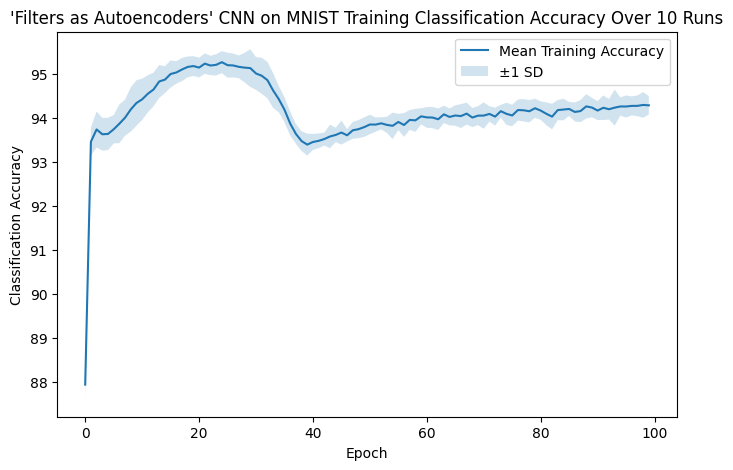

In [20]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

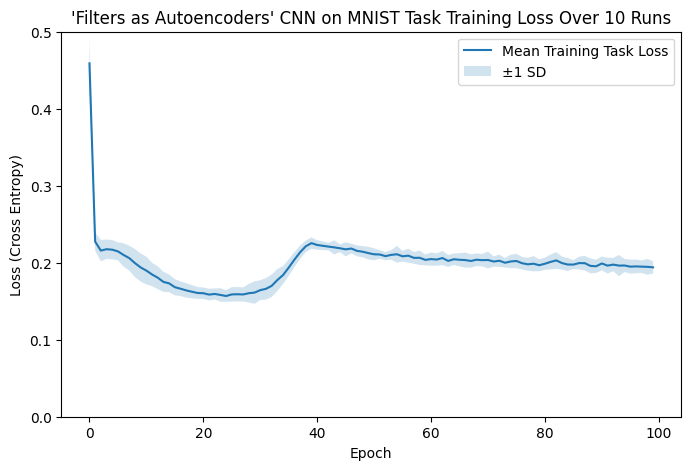

In [21]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

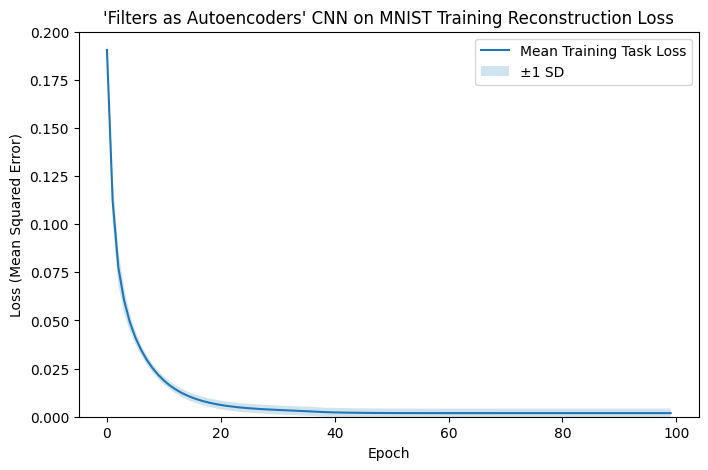

In [22]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Memory overhead and Runtime

In [16]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 57.0986328125
All peak memories (including the warm up run):


[56.7958984375,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125]

In [17]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 649.6544796323999 
All training times for the 100 epochs over the 10 runs:


array([652.01569961, 646.1017519 , 650.00784711, 653.12220827,
       656.06329748, 649.51704895, 648.17946956, 646.09073583,
       641.55629224, 653.89044538])

# Cutting Down The CNN
### Reduce number of filters to 1

# Parameter count

In [ ]:
#count how many params of the model...

#just to make sure we are getting the most current file version 
importlib.reload(nan_cnn)  

device = torch.device('cpu')


model = nan_cnn.FilterCNN(
        input_dims=28,
        pool_kernel_size=2,
        pool_stride=2,
        kernel_size=3,
        stride=1,
        padding=1,
        n_filters=1,
        bias=True,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

filters.0.encoder.weight (1, 1, 3, 3) -> 9
filters.0.encoder.bias (1,) -> 1
filters.0.decoder.weight (1, 1, 3, 3) -> 9
filters.0.decoder.bias (1,) -> 1
fc.weight            (10, 196) -> 1960
fc.bias              (10,) -> 10
1990


In [9]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=1,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1960
Epoch [1/1], Task Training Loss: 1.2875, Accuracy: 65.94%
peak memory from train : 27.1044921875
memory now reset and is: 17.2705078125 MB
time elapsed: 4.378265290999991
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2087
Epoch [1/100], Task Training Loss: 1.9079, Accuracy: 46.97%
Epoch [2/100], Encoder Training Loss: 0.1470
Epoch [2/100], Task Training Loss: 0.6200, Accuracy: 82.88%
Epoch [3/100], Encoder Training Loss: 0.1064
Epoch [3/100], Task Training Loss: 0.4097, Accuracy: 87.84%
Epoch [4/100], Encoder Training Loss: 0.0822
Epoch [4/100], Task Training Loss: 0.3609, Accuracy: 89.33%
Epoch [5/100], Encoder Training Loss: 0.0650
Epoch [5/100], Task Training Loss: 0.3371, Accuracy: 90.09%
Epoch [6/100], Encoder Training Loss: 0.0521
Epoch [6/100], Task Training Loss: 0.3232, Accuracy: 90.56%
Epoch [7/100], Encoder Training Loss: 0.0423
Epoch [7/100], Task Training Loss: 0.3153, Accuracy: 

In [10]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [12]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

In [14]:
epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_1_filter_results.csv",
    index=False,
)

# Loss and Accuracy

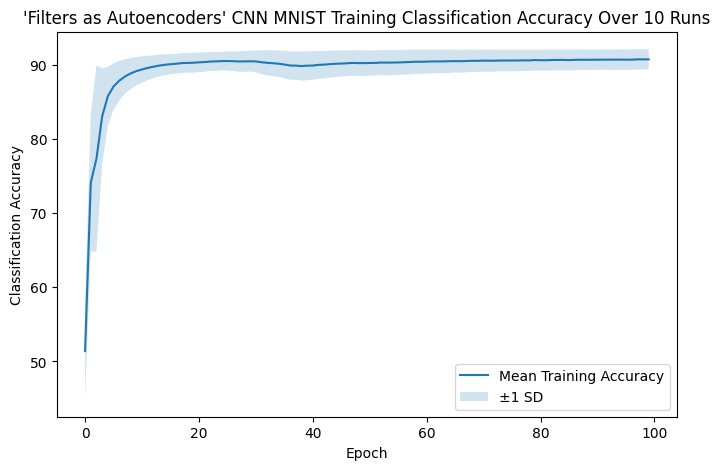

In [20]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

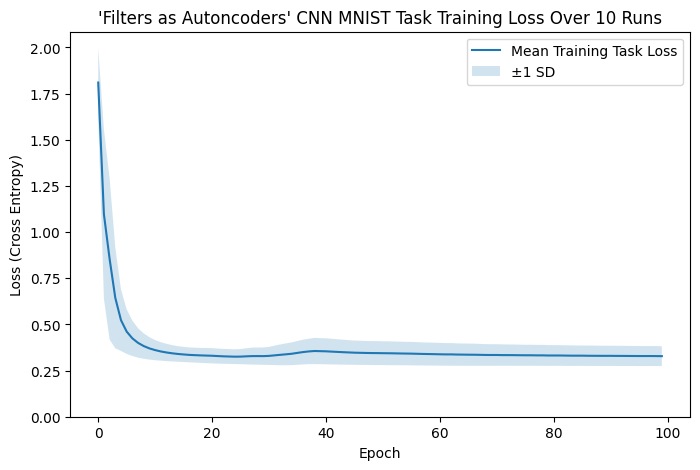

In [ ]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

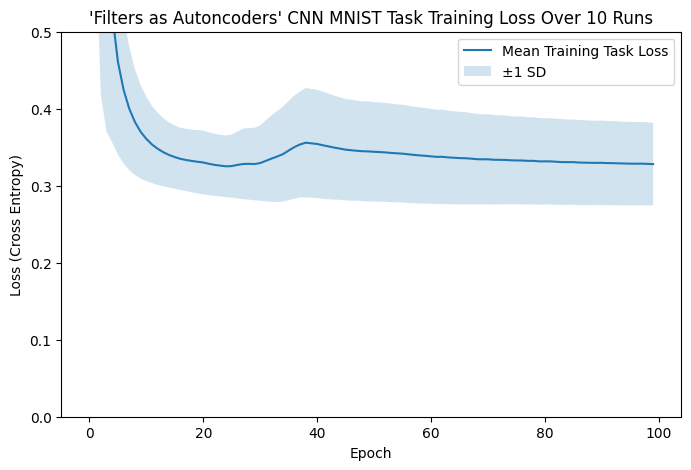

In [22]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

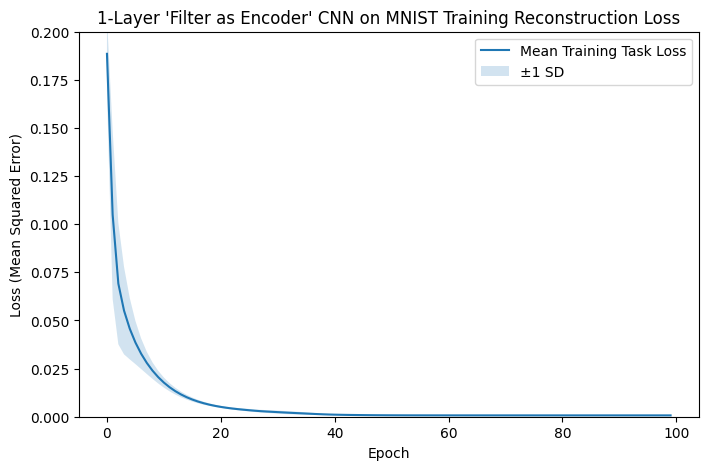

In [16]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("1-Layer 'Filter as Encoder' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Memory overhead and Runtime


In [17]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 27.125
All peak memories (including the warm up run):


[27.1044921875,
 27.125,
 27.125,
 27.125,
 27.125,
 27.125,
 27.125,
 27.125,
 27.125,
 27.125,
 27.125]

In [18]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 114.20396759150003 
All training times for the 100 epochs over the 10 runs:


array([113.84001195, 114.08889294, 114.02466118, 113.53492175,
       114.40786889, 115.01550103, 113.940323  , 113.9890905 ,
       114.68893821, 114.50946647])

# Experiment- Weight Sharing Autoencoding over 10 Runs

In [19]:
#get model
from src.models import weight_share_nan_cnn

In [ ]:
#count how many params of the model...

device = torch.device('cpu')

model = weight_share_nan_cnn.FilterCNN(
        input_dims=28,
        in_channels=1,
        pool_padding=0,
        pool_kernel_size=2,
        pool_stride=2,
        kernel_size=3,
        stride=1,
        padding=1,
        n_filters=16,
        bias=True,
        classes=10
    ).to(device)

for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

filters.0.decoder_bias (1,) -> 1
filters.0.encoder.weight (1, 1, 3, 3) -> 9
filters.0.encoder.bias (1,) -> 1
filters.1.decoder_bias (1,) -> 1
filters.1.encoder.weight (1, 1, 3, 3) -> 9
filters.1.encoder.bias (1,) -> 1
filters.2.decoder_bias (1,) -> 1
filters.2.encoder.weight (1, 1, 3, 3) -> 9
filters.2.encoder.bias (1,) -> 1
filters.3.decoder_bias (1,) -> 1
filters.3.encoder.weight (1, 1, 3, 3) -> 9
filters.3.encoder.bias (1,) -> 1
filters.4.decoder_bias (1,) -> 1
filters.4.encoder.weight (1, 1, 3, 3) -> 9
filters.4.encoder.bias (1,) -> 1
filters.5.decoder_bias (1,) -> 1
filters.5.encoder.weight (1, 1, 3, 3) -> 9
filters.5.encoder.bias (1,) -> 1
filters.6.decoder_bias (1,) -> 1
filters.6.encoder.weight (1, 1, 3, 3) -> 9
filters.6.encoder.bias (1,) -> 1
filters.7.decoder_bias (1,) -> 1
filters.7.encoder.weight (1, 1, 3, 3) -> 9
filters.7.encoder.bias (1,) -> 1
filters.8.decoder_bias (1,) -> 1
filters.8.encoder.weight (1, 1, 3, 3) -> 9
filters.8.encoder.bias (1,) -> 1
filters.9.decoder_b

# The 10 Runs..

In [11]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1857
Epoch [1/1], Task Training Loss: 0.4252, Accuracy: 88.25%
peak memory from train : 56.7646484375
memory now reset and is: 17.537109375 MB
time elapsed: 9.180246651000004
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1823
Epoch [1/100], Task Training Loss: 0.4300, Accuracy: 88.60%
Epoch [2/100], Encoder Training Loss: 0.1021
Epoch [2/100], Task Training Loss: 0.2340, Accuracy: 93.47%
Epoch [3/100], Encoder Training Loss: 0.0746
Epoch [3/100], Task Training Loss: 0.2188, Accuracy: 93.54%
Epoch [4/100], Encoder Training Loss: 0.0602
Epoch [4/100], Task Training Loss: 0.2085, Accuracy: 93.89%
Epoch [5/100], Encoder Training Loss: 0.0497
Epoch [5/100], Task Training Loss: 0.1991, Accuracy: 94.16%
Epoch [6/100], Encoder Training Loss: 0.0414
Epoch [6/100], Task Training Loss: 0.1860, Accuracy: 94.52%
Epoch [7/100], Encoder Training Loss: 0.0348
Epoch [7/100], Task Training Loss: 0.1714, Accuracy: 9

In [12]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [15]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/weight_share_autoencoding_cnn_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

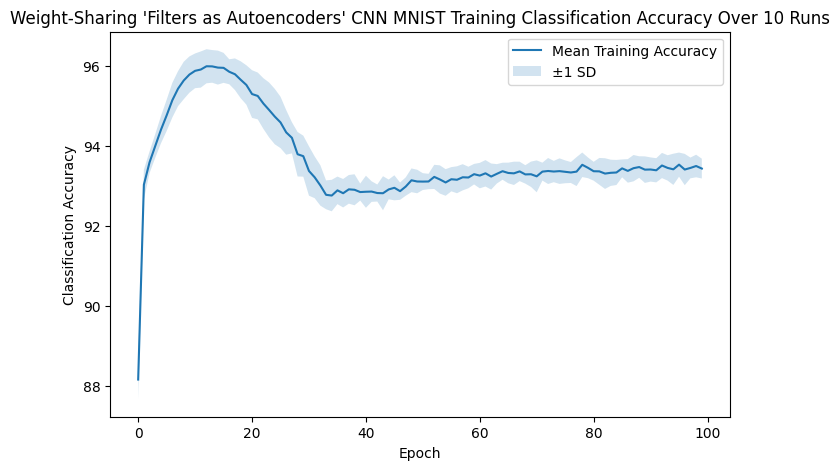

In [17]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

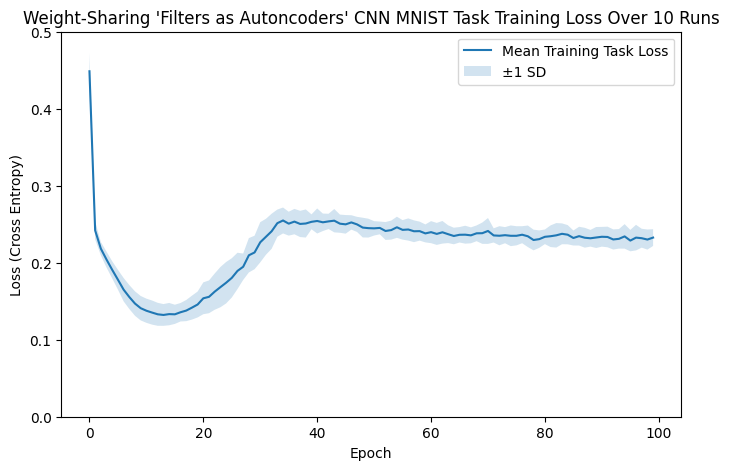

In [19]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

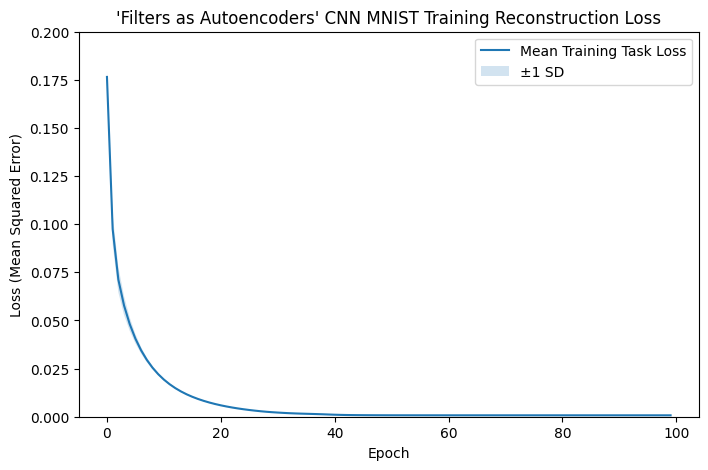

In [21]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss")
plt.show()

# Memory usage and Runtime

In [22]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 57.0517578125
All peak memories (including the warm up run):


[56.7646484375,
 57.0517578125,
 57.0517578125,
 57.0517578125,
 57.0517578125,
 57.0517578125,
 57.0517578125,
 57.0517578125,
 57.0517578125,
 57.0517578125,
 57.0517578125]

In [23]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 633.0875081158999 
All training times for the 100 epochs over the 10 runs:


array([622.89144259, 627.2250122 , 652.90434022, 629.84494414,
       680.10566476, 632.30716623, 629.1429635 , 622.17574879,
       617.70256981, 616.57522892])

# Symmetric Weights Autoencoder Affect on 1-filter network...

In [9]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=1,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1906
Epoch [1/1], Task Training Loss: 1.3596, Accuracy: 62.31%
peak memory from train : 27.10302734375
memory now reset and is: 17.26953125 MB
time elapsed: 3.997467315999984
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1705
Epoch [1/100], Task Training Loss: 2.0180, Accuracy: 49.02%
Epoch [2/100], Encoder Training Loss: 0.0637
Epoch [2/100], Task Training Loss: 1.2569, Accuracy: 74.84%
Epoch [3/100], Encoder Training Loss: 0.0431
Epoch [3/100], Task Training Loss: 0.7336, Accuracy: 82.78%
Epoch [4/100], Encoder Training Loss: 0.0375
Epoch [4/100], Task Training Loss: 0.5568, Accuracy: 85.26%
Epoch [5/100], Encoder Training Loss: 0.0339
Epoch [5/100], Task Training Loss: 0.4786, Accuracy: 86.51%
Epoch [6/100], Encoder Training Loss: 0.0308
Epoch [6/100], Task Training Loss: 0.4350, Accuracy: 87.31%
Epoch [7/100], Encoder Training Loss: 0.0278
Epoch [7/100], Task Training Loss: 0.4090, Accuracy: 8

In [10]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [13]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/weight_share_autoencoding_cnn_epoch_1_filter_results.csv",
    index=False,
)

# Loss and Accuracy

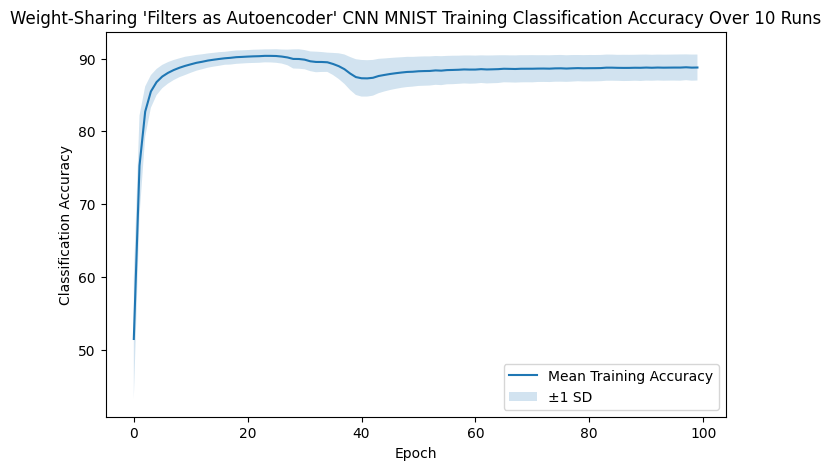

In [16]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("Weight-Sharing 'Filters as Autoencoder' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

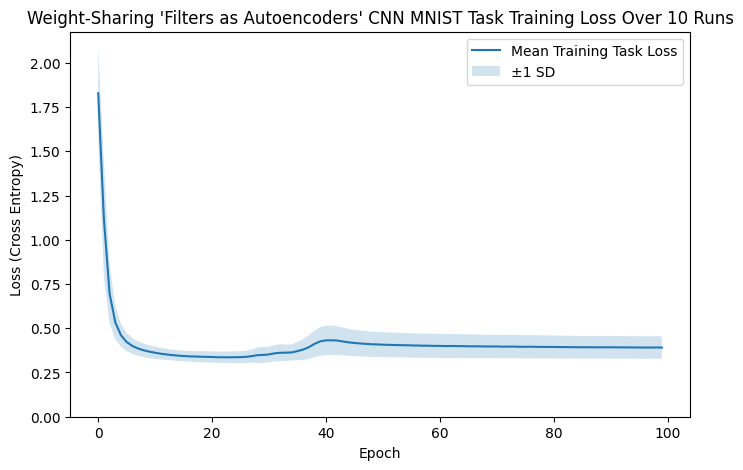

In [21]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(bottom=0)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

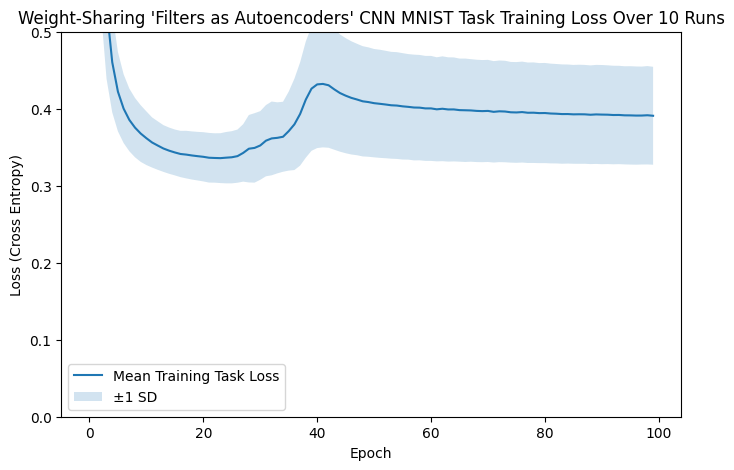

In [18]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

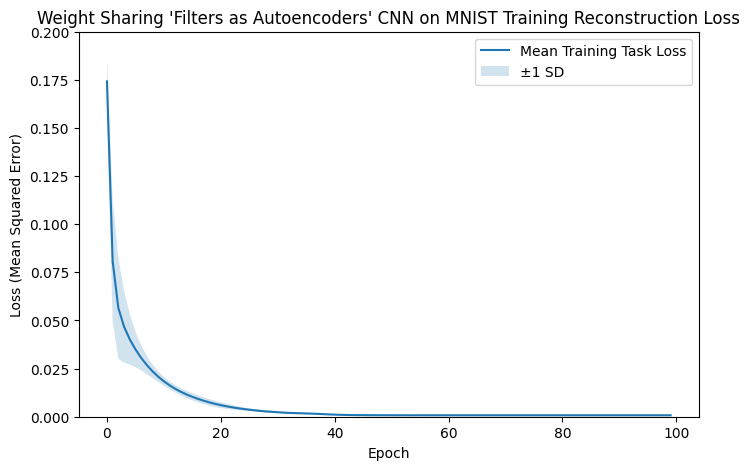

In [23]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("Weight Sharing 'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Memory usage and Runtime

In [14]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 27.12255859375
All peak memories (including the warm up run):


[27.10302734375,
 27.12255859375,
 27.12255859375,
 27.12255859375,
 27.12255859375,
 27.12255859375,
 27.12255859375,
 27.12255859375,
 27.12255859375,
 27.12255859375,
 27.12255859375]

In [15]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 113.72018239819995 
All training times for the 100 epochs over the 10 runs:


array([112.90702229, 112.04836024, 112.53180366, 113.97879147,
       114.39181413, 112.87208836, 116.60804599, 112.64698248,
       114.43252678, 114.78438857])

# Linear Schedule Training

In [9]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1857
Epoch [1/1], Task Training Loss: 0.4208, Accuracy: 88.33%
peak memory from train : 55.64111328125
memory now reset and is: 17.537109375 MB
time elapsed: 9.968463928000006
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1823
Epoch [2/100], Encoder Training Loss: 0.1021
Epoch [3/100], Encoder Training Loss: 0.0746
Epoch [4/100], Encoder Training Loss: 0.0602
Epoch [5/100], Encoder Training Loss: 0.0497
Epoch [6/100], Encoder Training Loss: 0.0414
Epoch [7/100], Encoder Training Loss: 0.0348
Epoch [8/100], Encoder Training Loss: 0.0296
Epoch [9/100], Encoder Training Loss: 0.0254
Epoch [10/100], Encoder Training Loss: 0.0219
Epoch [11/100], Encoder Training Loss: 0.0190
Epoch [12/100], Encoder Training Loss: 0.0166
Epoch [13/100], Encoder Training Loss: 0.0145
Epoch [14/100], Encoder Training Loss: 0.0128
Epoch [15/100], Encoder Training Loss: 0.0113
Epoch [16/100], Encoder Training Loss: 0.0100
E

In [10]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_weight_share_autoencoding_cnn_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

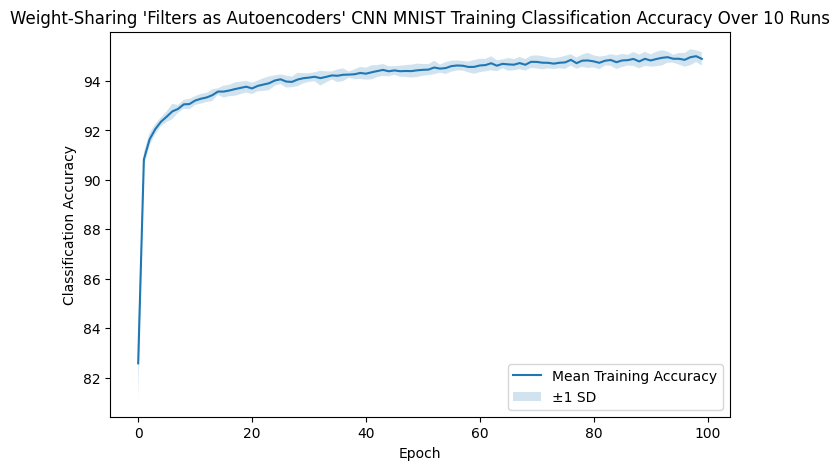

In [13]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

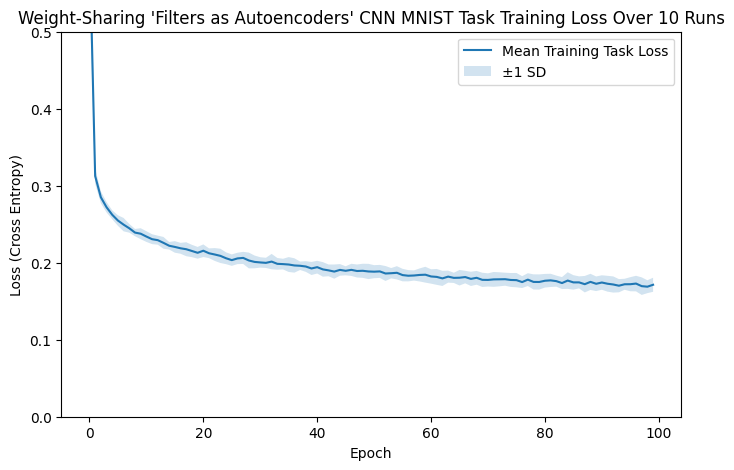

In [14]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_543/636315110.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


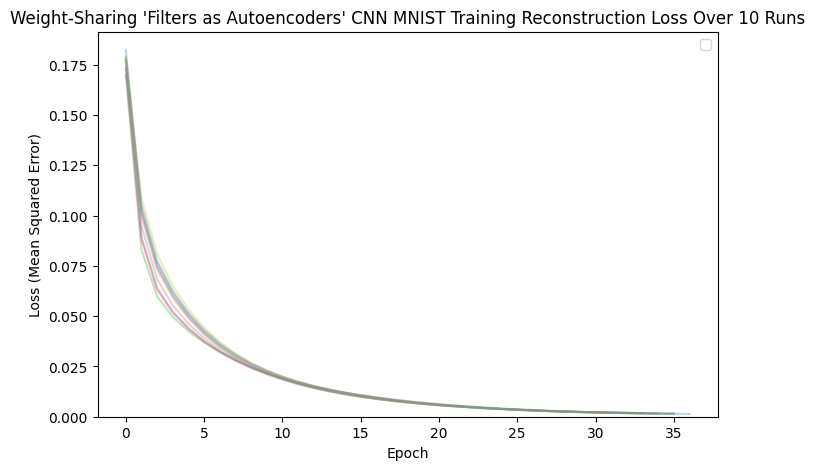

In [16]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")


plt.legend()
plt.ylim(bottom=0)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()


# Memory and Runtime

In [17]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 55.92822265625
All peak memories (including the warm up run):


[55.64111328125,
 55.92822265625,
 55.92822265625,
 55.92822265625,
 55.92822265625,
 55.92822265625,
 55.92822265625,
 55.92822265625,
 55.92822265625,
 55.92822265625,
 55.92822265625]

In [18]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 314.9383144086 
All training times for the 100 epochs over the 10 runs:


array([327.33995552, 310.5726844 , 312.94722705, 309.09679042,
       301.82964158, 322.73964687, 306.51255312, 313.38507786,
       316.71348125, 328.24608602])

# 1-Filter Network using Linear Schedule

In [9]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=1,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1906
Epoch [1/1], Task Training Loss: 1.3730, Accuracy: 61.19%
peak memory from train : 20.65283203125
memory now reset and is: 17.26953125 MB
time elapsed: 4.351742830999967
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1705
Epoch [2/100], Encoder Training Loss: 0.0637
Epoch [3/100], Encoder Training Loss: 0.0431
Epoch [4/100], Encoder Training Loss: 0.0375
Epoch [5/100], Encoder Training Loss: 0.0339
Epoch [6/100], Encoder Training Loss: 0.0308
Epoch [7/100], Encoder Training Loss: 0.0278
Epoch [8/100], Encoder Training Loss: 0.0249
Epoch [9/100], Encoder Training Loss: 0.0220
Epoch [10/100], Encoder Training Loss: 0.0193
Epoch [11/100], Encoder Training Loss: 0.0169
Epoch [12/100], Encoder Training Loss: 0.0148
Epoch [13/100], Encoder Training Loss: 0.0131
Epoch [14/100], Encoder Training Loss: 0.0117
Epoch [15/100], Encoder Training Loss: 0.0105
Epoch [16/100], Encoder Training Loss: 0.0094
Ep

In [ ]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)

#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [12]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_weight_share_autoencoding_cnn_1_filter_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

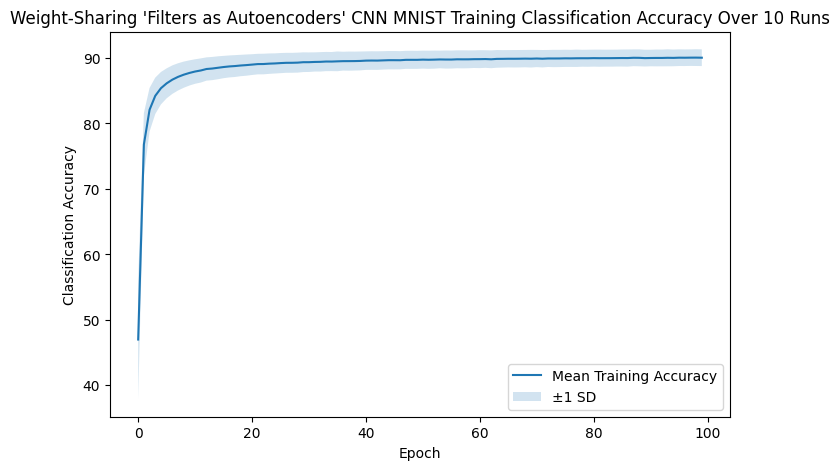

In [13]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

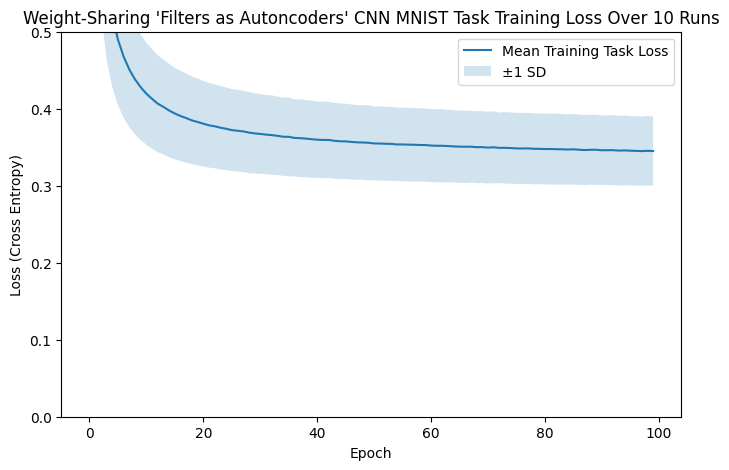

In [14]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_860/2459667162.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


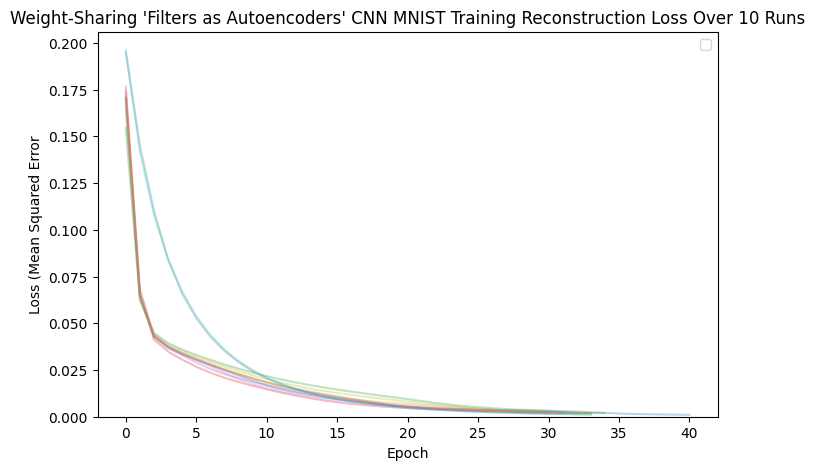

In [16]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
plt.ylim(bottom=0)
plt.title("Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [17]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 26.892578125
All peak memories (including the warm up run):


[20.65283203125,
 26.892578125,
 26.892578125,
 26.892578125,
 26.892578125,
 26.892578125,
 26.892578125,
 26.892578125,
 26.892578125,
 26.892578125,
 26.892578125]

In [18]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 108.72021685790006 
All training times for the 100 epochs over the 10 runs:


array([114.8330725 , 106.07242734, 109.64039117, 107.38337259,
       109.05657541, 108.93999096, 106.83239868, 108.10559804,
       108.69328074, 107.64506113])

# Removing Biases from Encoder and Decoder 
### Adding some form of regularlisation symmetrically (to both encoder and decoder)

In [ ]:
#count how many params of the model...

device = torch.device('cpu')

model = weight_share_nan_cnn.FilterCNN(
        input_dims=28,
        in_channels=1,
        pool_padding=0,
        pool_kernel_size=2,
        pool_stride=2,
        kernel_size=3,
        stride=1,
        padding=1,
        n_filters=16,
        bias=False,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

filters.0.encoder.weight (1, 1, 3, 3) -> 9
filters.1.encoder.weight (1, 1, 3, 3) -> 9
filters.2.encoder.weight (1, 1, 3, 3) -> 9
filters.3.encoder.weight (1, 1, 3, 3) -> 9
filters.4.encoder.weight (1, 1, 3, 3) -> 9
filters.5.encoder.weight (1, 1, 3, 3) -> 9
filters.6.encoder.weight (1, 1, 3, 3) -> 9
filters.7.encoder.weight (1, 1, 3, 3) -> 9
filters.8.encoder.weight (1, 1, 3, 3) -> 9
filters.9.encoder.weight (1, 1, 3, 3) -> 9
filters.10.encoder.weight (1, 1, 3, 3) -> 9
filters.11.encoder.weight (1, 1, 3, 3) -> 9
filters.12.encoder.weight (1, 1, 3, 3) -> 9
filters.13.encoder.weight (1, 1, 3, 3) -> 9
filters.14.encoder.weight (1, 1, 3, 3) -> 9
filters.15.encoder.weight (1, 1, 3, 3) -> 9
fc.weight            (10, 3136) -> 31360
fc.bias              (10,) -> 10
31514


In [ ]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,

        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


    


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2129
Epoch [1/1], Task Training Loss: 0.3899, Accuracy: 88.80%
peak memory from train : 55.57861328125
memory now reset and is: 17.505859375 MB
time elapsed: 9.294153215999984
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2199
Epoch [2/100], Encoder Training Loss: 0.2044
Epoch [3/100], Encoder Training Loss: 0.1991
Epoch [4/100], Encoder Training Loss: 0.1960
Epoch [5/100], Encoder Training Loss: 0.1936
Epoch [6/100], Encoder Training Loss: 0.1916
Epoch [7/100], Encoder Training Loss: 0.1902
Epoch [8/100], Encoder Training Loss: 0.1893
Epoch [9/100], Encoder Training Loss: 0.1886
Epoch [10/100], Encoder Training Loss: 0.1881
Epoch [11/100], Encoder Training Loss: 0.1877
Epoch [12/100], Encoder Training Loss: 0.1874
Epoch [13/100], Encoder Training Loss: 0.1871
Epoch [14/100], Encoder Training Loss: 0.1869
Epoch [15/100], Encoder Training Loss: 0.1867
Epoch [16/100], Encoder Training Loss: 0.1865
E

In [11]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [14]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_simple_weight_share_autoencoding_cnn_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

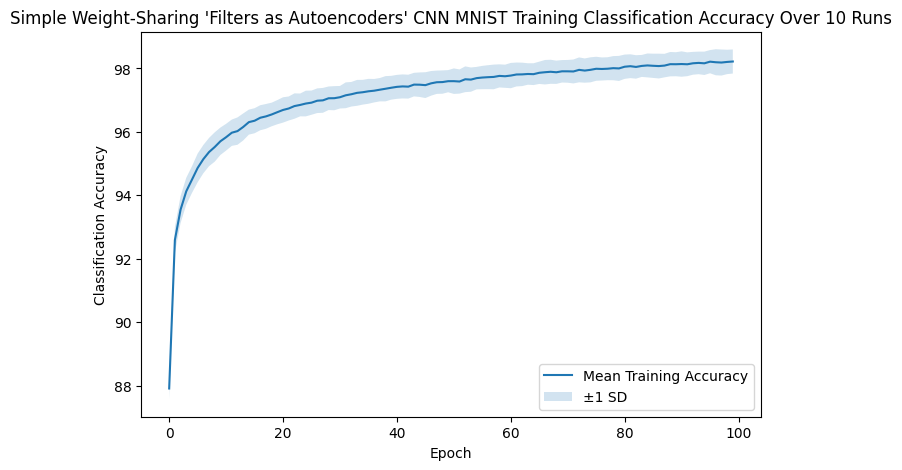

In [16]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

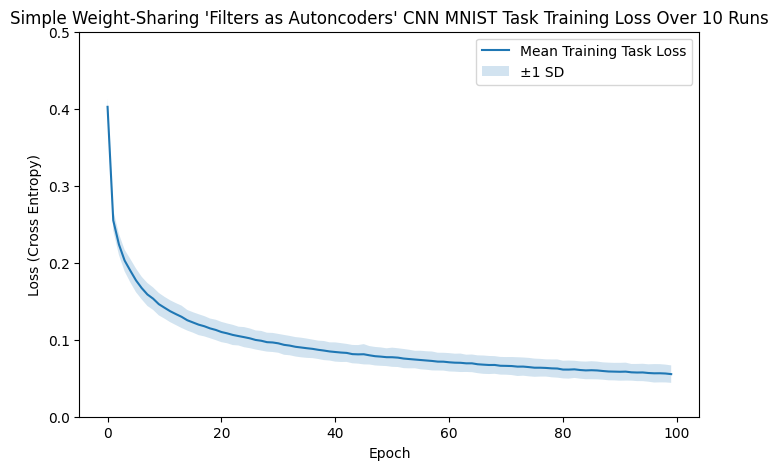

In [17]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_1115/3911283133.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


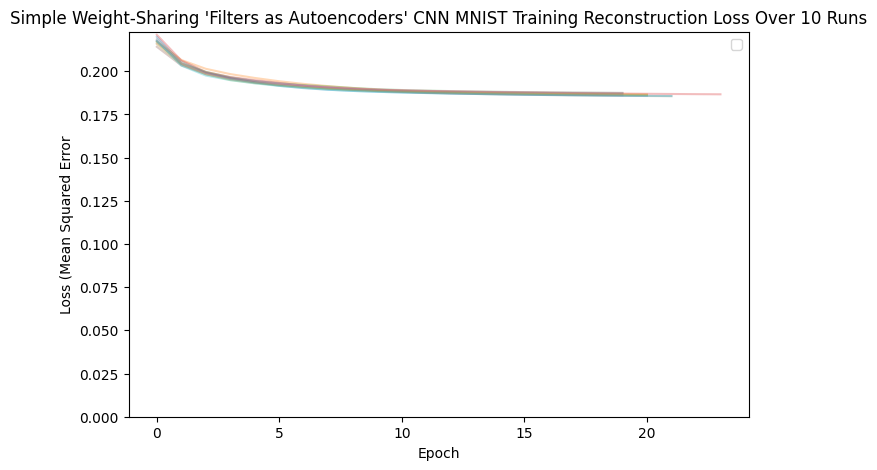

In [18]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [19]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 55.83447265625
All peak memories (including the warm up run):


[55.57861328125,
 55.83447265625,
 55.83447265625,
 55.83447265625,
 55.83447265625,
 55.83447265625,
 55.83447265625,
 55.83447265625,
 55.83447265625,
 55.83447265625,
 55.83447265625]

In [20]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 207.1750375877 
All training times for the 100 epochs over the 10 runs:


array([209.80539438, 204.49139633, 199.88163314, 221.87456167,
       201.95028986, 209.64664055, 202.77041144, 202.36790615,
       206.15291075, 212.80923162])

# The affect of Removing Autoencoding Bias on 1-filter network...

In [ ]:
# this is actually both encoder and decoder biases removed out of curiosity 
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=1,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=False,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2147
Epoch [1/1], Task Training Loss: 1.3269, Accuracy: 63.28%
peak memory from train : 20.64892578125
memory now reset and is: 17.267578125 MB
time elapsed: 4.572271759999978
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2227
Epoch [2/100], Encoder Training Loss: 0.2090
Epoch [3/100], Encoder Training Loss: 0.2015
Epoch [4/100], Encoder Training Loss: 0.1975
Epoch [5/100], Encoder Training Loss: 0.1945
Epoch [6/100], Encoder Training Loss: 0.1921
Epoch [7/100], Encoder Training Loss: 0.1904
Epoch [8/100], Encoder Training Loss: 0.1893
Epoch [9/100], Encoder Training Loss: 0.1885
Epoch [10/100], Encoder Training Loss: 0.1880
Epoch [11/100], Encoder Training Loss: 0.1877
Epoch [12/100], Encoder Training Loss: 0.1874
Epoch [13/100], Encoder Training Loss: 0.1872
Epoch [14/100], Encoder Training Loss: 0.1870
Epoch [15/100], Encoder Training Loss: 0.1869
Epoch [16/100], Encoder Training Loss: 0.1867
E

In [ ]:
#make averages here

#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)

#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [12]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_simple_weight_share_autoencoding_cnn_1_filter_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

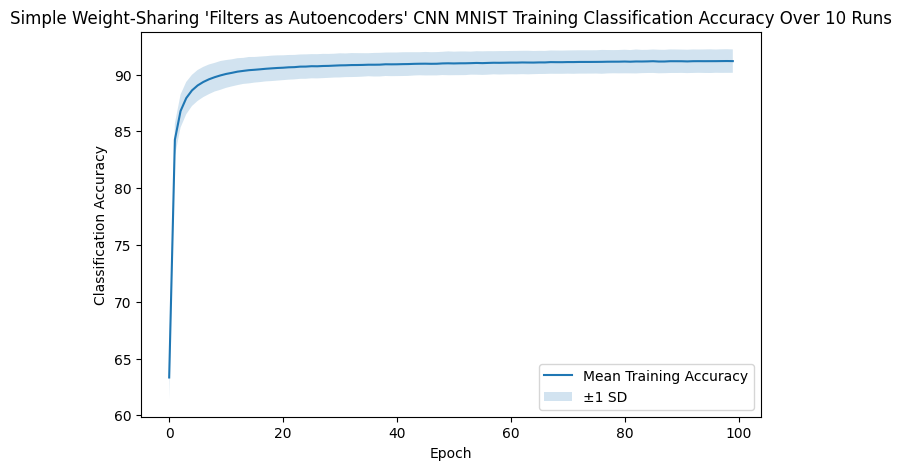

In [13]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

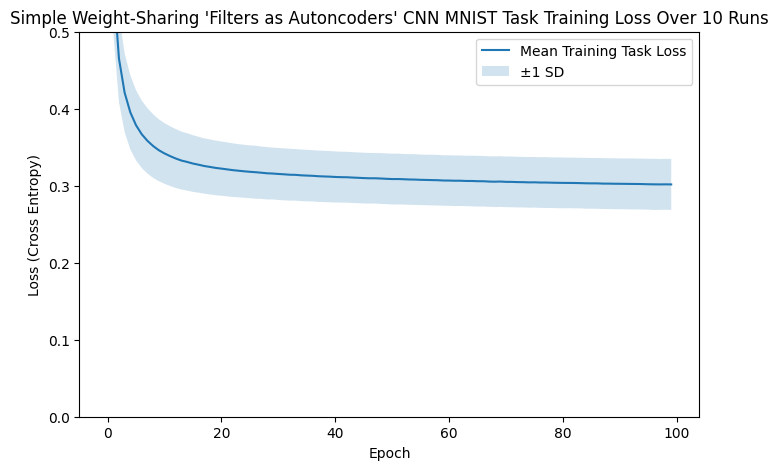

In [14]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_695/3911283133.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


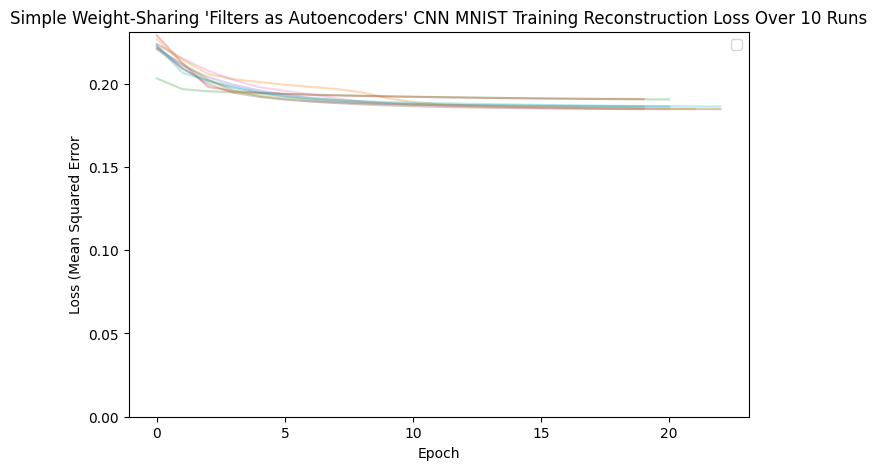

In [15]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [16]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 26.8876953125
All peak memories (including the warm up run):


[20.64892578125,
 26.8876953125,
 26.8876953125,
 26.8876953125,
 26.8876953125,
 26.8876953125,
 26.8876953125,
 26.8876953125,
 26.8876953125,
 26.8876953125,
 26.8876953125]

In [17]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 96.50344167000002 
All training times for the 100 epochs over the 10 runs:


array([95.5959189 , 95.5313194 , 95.52479926, 96.86724675, 98.74912641,
       96.20589217, 96.54857628, 94.83080107, 97.14431117, 98.03642528])

# Compressing feature representation
### Convolutional stride of 2 with no pooling
#### This results in a 14x14 feature map that is fed directly to the classifier (decoder needs output padding of 1 for 28x28 reconstruction)

In [15]:
from src.models import no_pool_weight_share_nan_cnn
from src.experiments import nan_cnn_experiment

In [17]:
#count how many params of the model...
device = torch.device('cpu')


model = no_pool_weight_share_nan_cnn.FilterCNN(
        input_dims=28,
        in_channels=1,
        kernel_size=3,
        stride=2,
        padding=1,
        n_filters=16,
        bias=False,
        output_padding=1,
        sigmoid=True,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

filters.0.encoder.weight (1, 1, 3, 3) -> 9
filters.1.encoder.weight (1, 1, 3, 3) -> 9
filters.2.encoder.weight (1, 1, 3, 3) -> 9
filters.3.encoder.weight (1, 1, 3, 3) -> 9
filters.4.encoder.weight (1, 1, 3, 3) -> 9
filters.5.encoder.weight (1, 1, 3, 3) -> 9
filters.6.encoder.weight (1, 1, 3, 3) -> 9
filters.7.encoder.weight (1, 1, 3, 3) -> 9
filters.8.encoder.weight (1, 1, 3, 3) -> 9
filters.9.encoder.weight (1, 1, 3, 3) -> 9
filters.10.encoder.weight (1, 1, 3, 3) -> 9
filters.11.encoder.weight (1, 1, 3, 3) -> 9
filters.12.encoder.weight (1, 1, 3, 3) -> 9
filters.13.encoder.weight (1, 1, 3, 3) -> 9
filters.14.encoder.weight (1, 1, 3, 3) -> 9
filters.15.encoder.weight (1, 1, 3, 3) -> 9
fc.weight            (10, 3136) -> 31360
fc.bias              (10,) -> 10
31514


In [ ]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_no_pool_weight_share_nan_cnn( 
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        n_classes=10,
        bias=False,
        output_padding=1,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2254
Epoch [1/1], Task Training Loss: 0.4246, Accuracy: 88.02%
peak memory from train : 28.95947265625
memory now reset and is: 18.193359375 MB
time elapsed: 5.8820044340000095
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2273
Epoch [2/100], Encoder Training Loss: 0.2220
Epoch [3/100], Encoder Training Loss: 0.2182
Epoch [4/100], Encoder Training Loss: 0.2156
Epoch [5/100], Encoder Training Loss: 0.2137
Epoch [6/100], Encoder Training Loss: 0.2125
Epoch [7/100], Encoder Training Loss: 0.2119
Epoch [8/100], Encoder Training Loss: 0.2116
Epoch [9/100], Encoder Training Loss: 0.2113
Epoch [10/100], Encoder Training Loss: 0.2112
Epoch [11/100], Encoder Training Loss: 0.2111
Early stopping triggered at epoch 11... Now training classifier
Epoch [1/100], Task Training Loss: 0.3914, Accuracy: 88.38%
Epoch [2/100], Task Training Loss: 0.2377, Accuracy: 93.28%
Epoch [3/100], Task Training Loss: 0.2070, Acc

In [14]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [16]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_simple_weight_share_autoencoding_cnn_14x14_feature_map_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

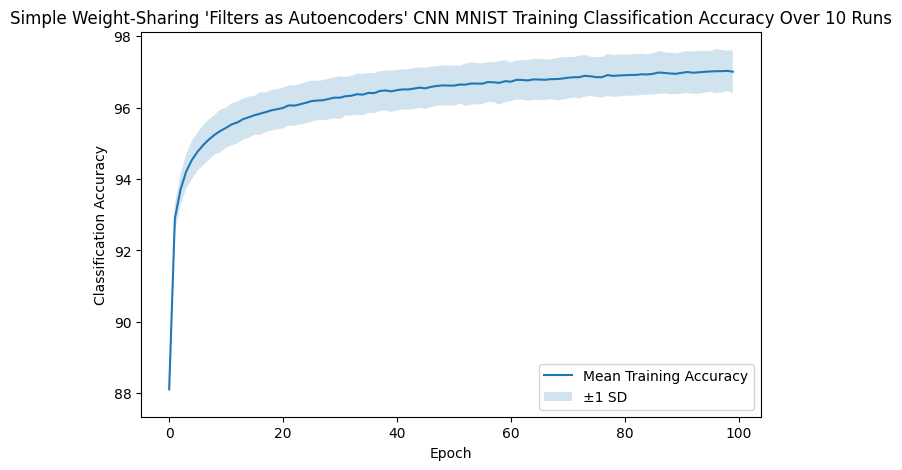

In [17]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

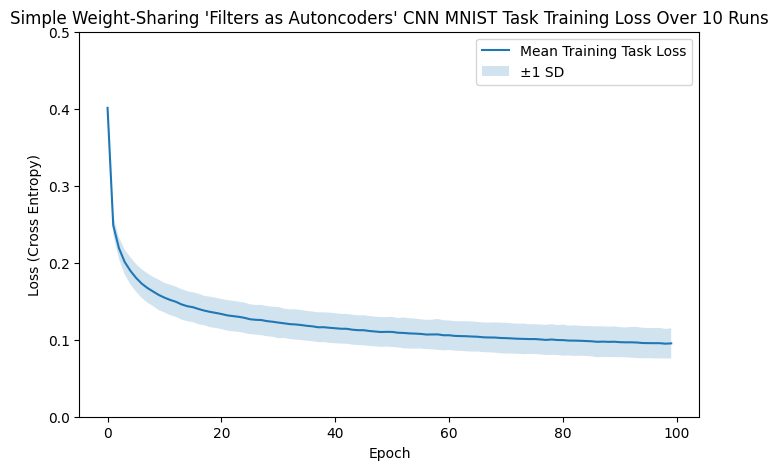

In [18]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_1347/3911283133.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


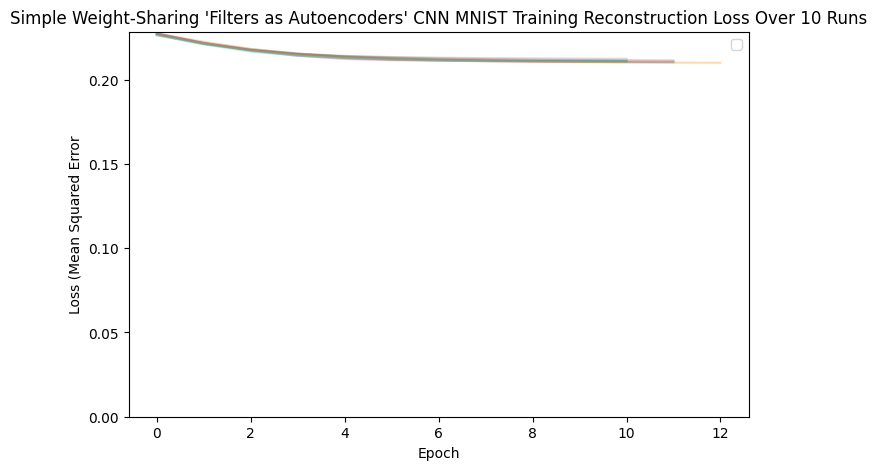

In [19]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_1347/3984361636.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


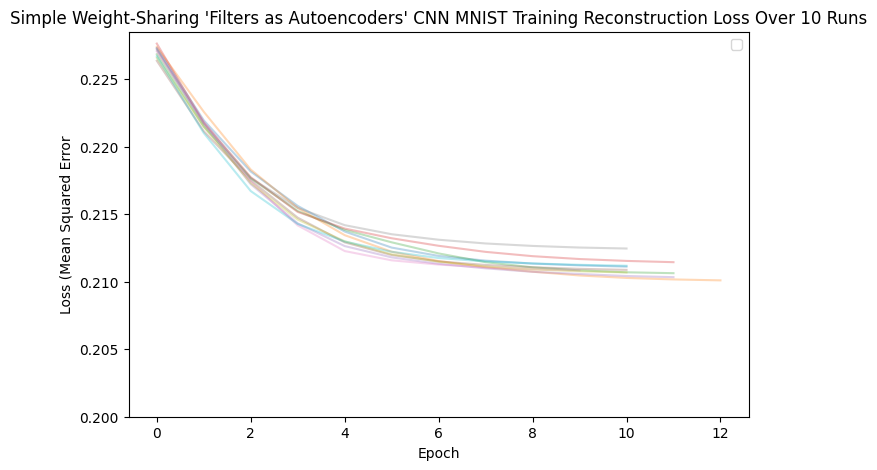

In [20]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
plt.ylim(bottom=0.2)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [21]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 28.95947265625
All peak memories (including the warm up run):


[28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625,
 28.95947265625]

In [22]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 161.5012850791 
All training times for the 100 epochs over the 10 runs:


array([157.85346149, 169.45983081, 162.55941504, 165.52227917,
       164.51601873, 160.334139  , 156.49484303, 161.16376283,
       159.41041606, 157.69868463])

# Corresponing 14x14 Feature mapping affect on 1-filter network...

In [ ]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_no_pool_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=1,
        stride=2,
        padding=1,
        kernel_size=3,
        n_classes=10,
        output_padding=1,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2301
Epoch [1/1], Task Training Loss: 1.6596, Accuracy: 57.81%
peak memory from train : 22.2236328125
memory now reset and is: 17.955078125 MB
time elapsed: 2.156170953000128
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2292
Epoch [2/100], Encoder Training Loss: 0.2240
Epoch [3/100], Encoder Training Loss: 0.2197
Epoch [4/100], Encoder Training Loss: 0.2164
Epoch [5/100], Encoder Training Loss: 0.2131
Epoch [6/100], Encoder Training Loss: 0.2112
Epoch [7/100], Encoder Training Loss: 0.2106
Epoch [8/100], Encoder Training Loss: 0.2103
Epoch [9/100], Encoder Training Loss: 0.2101
Epoch [10/100], Encoder Training Loss: 0.2100
Epoch [11/100], Encoder Training Loss: 0.2099
Early stopping triggered at epoch 11... Now training classifier
Epoch [1/100], Task Training Loss: 1.2963, Accuracy: 61.35%
Epoch [2/100], Task Training Loss: 0.6051, Accuracy: 83.72%
Epoch [3/100], Task Training Loss: 0.4888, Accur

In [24]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [26]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_simple_weight_share_autoencoding_cnn_14x14_feature_map_1_filter_epoch_results.csv",
    index=False,
)

# Loss and Accuracy

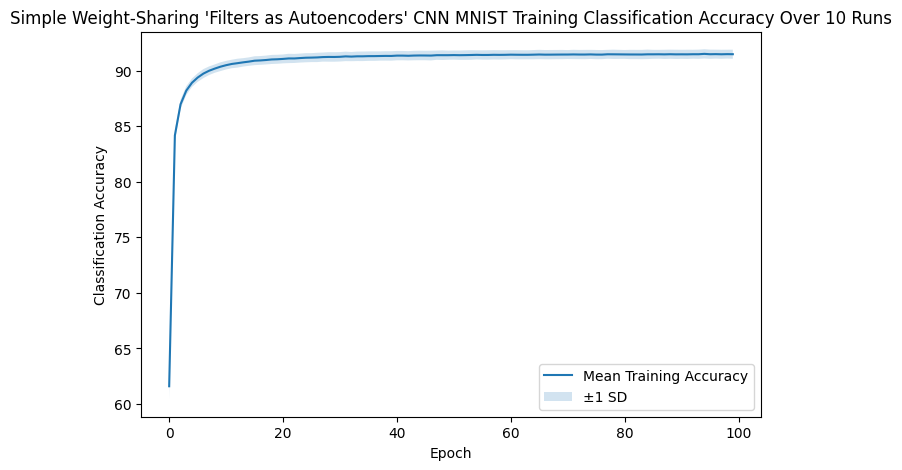

In [27]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

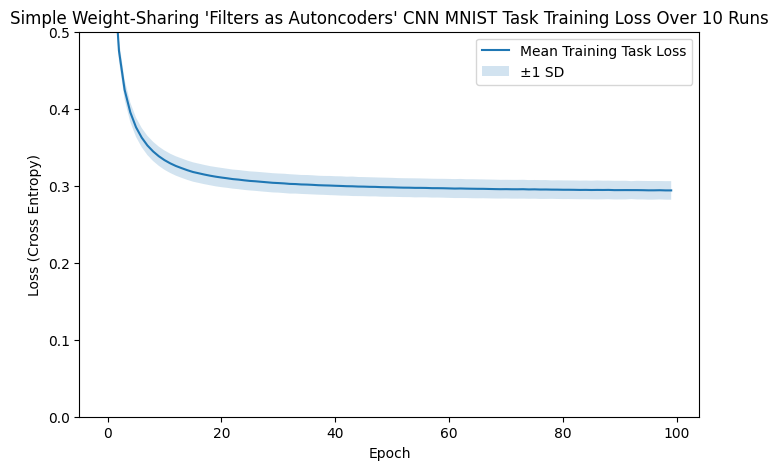

In [28]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_1347/3911283133.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


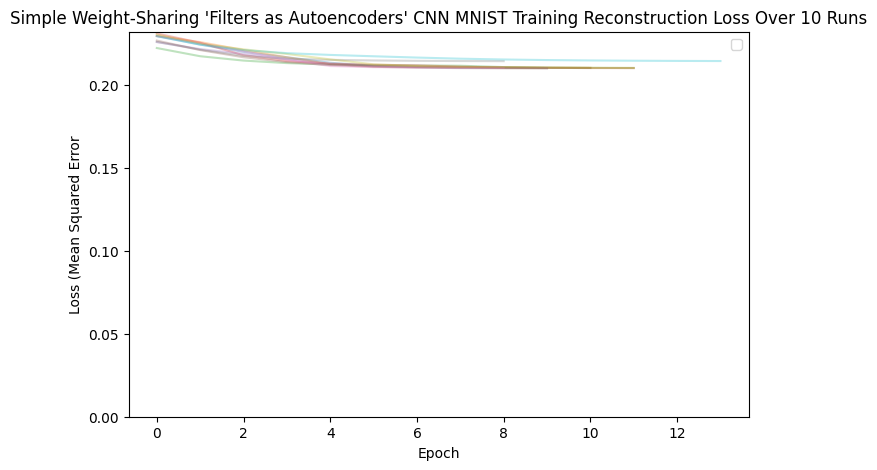

In [29]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [30]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 21.9853515625
All peak memories (including the warm up run):


[22.2236328125,
 21.9853515625,
 21.9853515625,
 21.9853515625,
 21.9853515625,
 21.9853515625,
 21.9853515625,
 21.9853515625,
 21.9853515625,
 21.9853515625,
 21.9853515625]

In [31]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 98.75858374459999 
All training times for the 100 epochs over the 10 runs:


array([ 98.63685045,  97.95376166,  98.85332711, 100.46630093,
        98.24697153,  97.42372167,  97.25966972,  96.73105626,
       100.01699821, 101.9971799 ])

# Now briefly a stride of 3 (creates 10x10 feature maps)

In [ ]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_no_pool_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=3,
        padding=1,
        kernel_size=3,
        n_classes=10,
        output_padding=0,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2290
Epoch [1/1], Task Training Loss: 0.5944, Accuracy: 84.80%
peak memory from train : 25.73779296875
memory now reset and is: 19.142578125 MB
time elapsed: 6.185328810000101
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2301
Epoch [2/100], Encoder Training Loss: 0.2279
Epoch [3/100], Encoder Training Loss: 0.2267
Epoch [4/100], Encoder Training Loss: 0.2260
Epoch [5/100], Encoder Training Loss: 0.2255
Epoch [6/100], Encoder Training Loss: 0.2251
Epoch [7/100], Encoder Training Loss: 0.2248
Epoch [8/100], Encoder Training Loss: 0.2246
Epoch [9/100], Encoder Training Loss: 0.2244
Epoch [10/100], Encoder Training Loss: 0.2243
Epoch [11/100], Encoder Training Loss: 0.2242
Epoch [12/100], Encoder Training Loss: 0.2240
Epoch [13/100], Encoder Training Loss: 0.2240
Early stopping triggered at epoch 13... Now training classifier
Epoch [1/100], Task Training Loss: 0.6608, Accuracy: 81.02%
Epoch [2/100], 

In [20]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [21]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_simple_weight_share_autoencoding_cnn_10x10_feature_map.csv",
    index=False,
)

# Loss and Accuracy

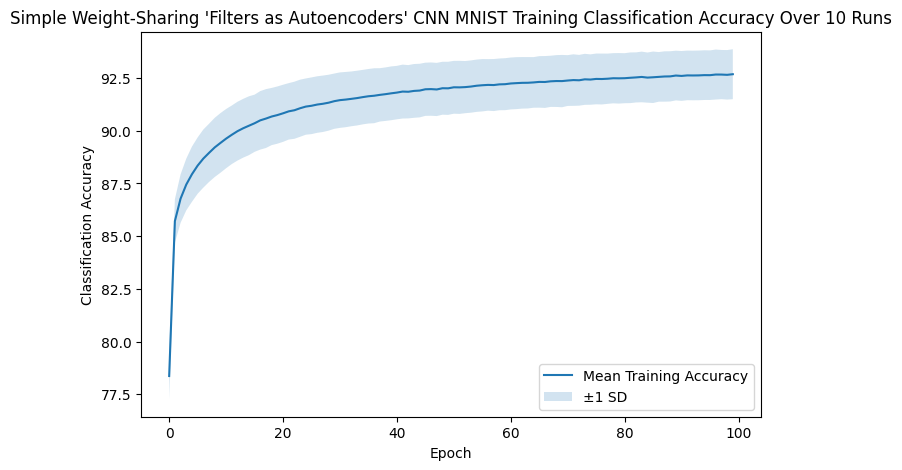

In [22]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

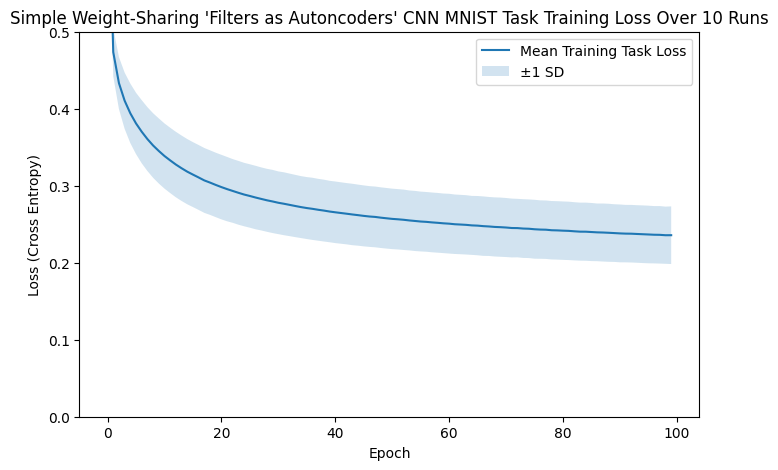

In [23]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_761/3911283133.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


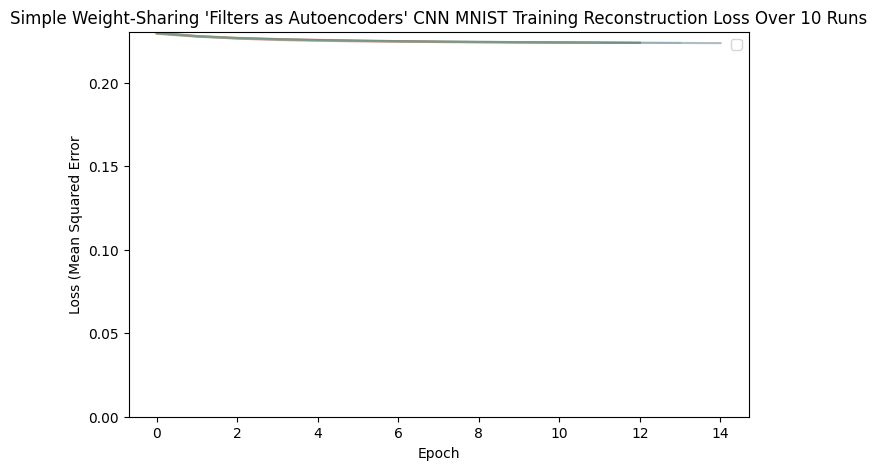

In [24]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_761/3089517499.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


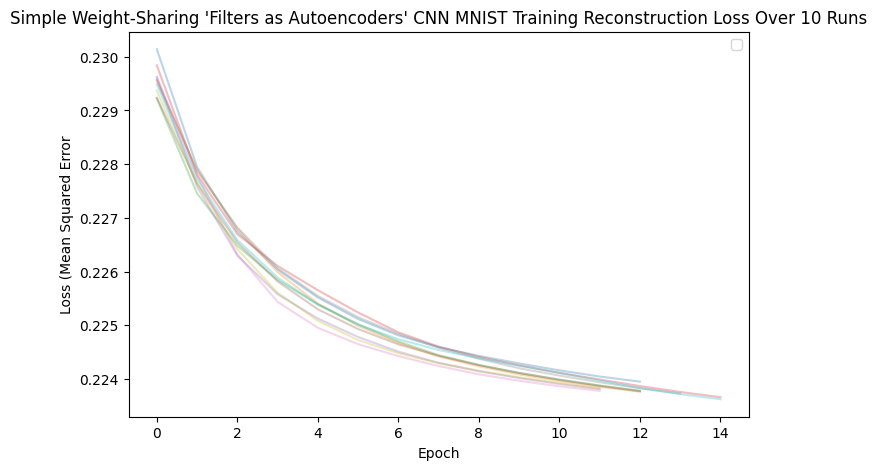

In [25]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
#plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [26]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 25.79931640625
All peak memories (including the warm up run):


[25.73779296875,
 25.79931640625,
 25.79931640625,
 25.79931640625,
 25.79931640625,
 25.79931640625,
 25.79931640625,
 25.79931640625,
 25.79931640625,
 25.79931640625,
 25.79931640625]

In [27]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 169.32370437940003 
All training times for the 100 epochs over the 10 runs:


array([168.27299435, 168.30144238, 168.7176112 , 179.48486246,
       163.69646548, 168.13143843, 163.48320772, 172.95939882,
       163.0766127 , 177.11301026])

# Include biases back into compressed 14x14 mapping

In [ ]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_linear_schedule_no_pool_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        n_classes=10,
        output_padding=1,
        bias=True,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2037
Epoch [1/1], Task Training Loss: 0.4503, Accuracy: 87.45%
peak memory from train : 28.76611328125
memory now reset and is: 18.224609375 MB
time elapsed: 7.1755764859999545
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2029
Epoch [2/100], Encoder Training Loss: 0.1404
Epoch [3/100], Encoder Training Loss: 0.0995
Epoch [4/100], Encoder Training Loss: 0.0784
Epoch [5/100], Encoder Training Loss: 0.0656
Epoch [6/100], Encoder Training Loss: 0.0568
Epoch [7/100], Encoder Training Loss: 0.0503
Epoch [8/100], Encoder Training Loss: 0.0451
Epoch [9/100], Encoder Training Loss: 0.0407
Epoch [10/100], Encoder Training Loss: 0.0370
Epoch [11/100], Encoder Training Loss: 0.0337
Epoch [12/100], Encoder Training Loss: 0.0309
Epoch [13/100], Encoder Training Loss: 0.0285
Epoch [14/100], Encoder Training Loss: 0.0263
Epoch [15/100], Encoder Training Loss: 0.0245
Epoch [16/100], Encoder Training Loss: 0.0228


In [10]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [11]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/linear_weight_share_w_bias_autoencoding_cnn_14x14_feature_map.csv",
    index=False,
)

# Loss and Accuracy

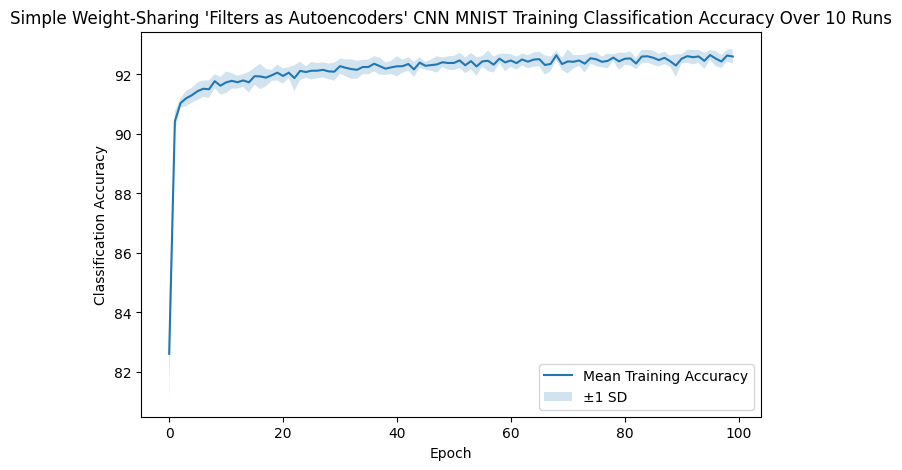

In [12]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

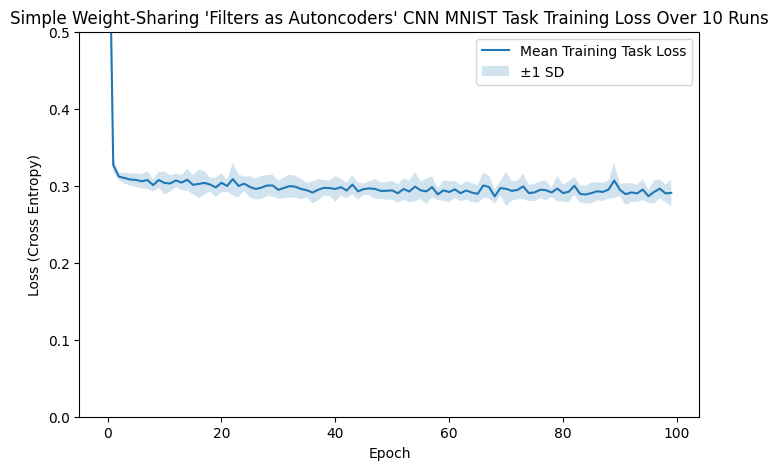

In [13]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_17164/3089517499.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


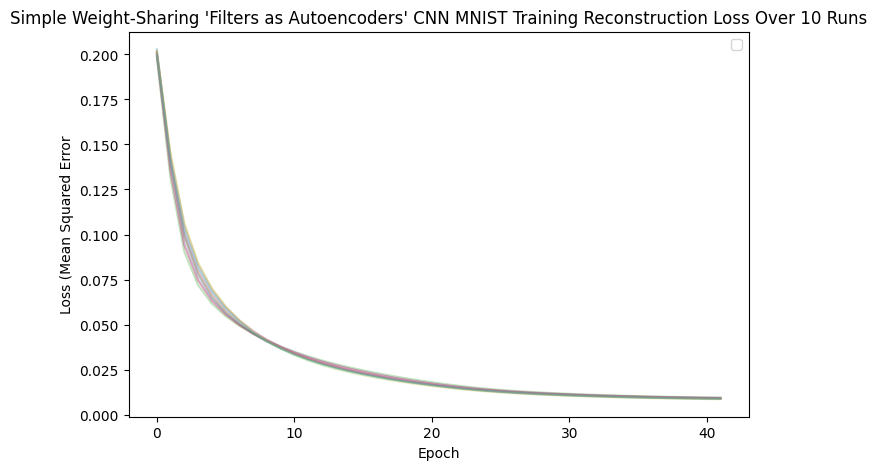

In [14]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
#plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [15]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 29.05322265625
All peak memories (including the warm up run):


[28.76611328125,
 29.05322265625,
 29.05322265625,
 29.05322265625,
 29.05322265625,
 29.05322265625,
 29.05322265625,
 29.05322265625,
 29.05322265625,
 29.05322265625,
 29.05322265625]

In [16]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 338.48810170459984 
All training times for the 100 epochs over the 10 runs:


array([333.37499782, 334.78524583, 334.41380702, 359.51029488,
       352.66716722, 338.92753802, 339.51332398, 331.65468218,
       330.4877334 , 329.54622669])

# Regularising The Autoencoder
### Firstly injecting noise (input corruption) with sigma =0.1 controlling the magnitude of random gaussian perturbation added to the input images
##### Here we use the 14x14 feature map producing model (trades off slight accuracy for memory savings) previously tested using a convolutional stride of 2 (instead of pooling), no biases in the autoencoder, shared weights, and of course the linear schedule with harsh early stopping

In [8]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_input_corruption_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        n_classes=10,
        output_padding=1,
        bias=False,
        sigma=0.1,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2276
Epoch [1/1], Task Training Loss: 0.4404, Accuracy: 88.34%
peak memory from train : 29.27783203125
memory now reset and is: 18.193359375 MB
time elapsed: 6.526865682000107
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2298
Epoch [2/100], Encoder Training Loss: 0.2243
Epoch [3/100], Encoder Training Loss: 0.2207
Epoch [4/100], Encoder Training Loss: 0.2181
Epoch [5/100], Encoder Training Loss: 0.2163
Epoch [6/100], Encoder Training Loss: 0.2151
Epoch [7/100], Encoder Training Loss: 0.2141
Epoch [8/100], Encoder Training Loss: 0.2133
Epoch [9/100], Encoder Training Loss: 0.2127
Epoch [10/100], Encoder Training Loss: 0.2122
Epoch [11/100], Encoder Training Loss: 0.2118
Epoch [12/100], Encoder Training Loss: 0.2115
Epoch [13/100], Encoder Training Loss: 0.2113
Epoch [14/100], Encoder Training Loss: 0.2111
Epoch [15/100], Encoder Training Loss: 0.2109
Epoch [16/100], Encoder Training Loss: 0.2108
E

In [9]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/noise_injection_0.1_autoencoding_cnn_14x14_feature_map.csv",
    index=False,
)

# Loss and Accuracy

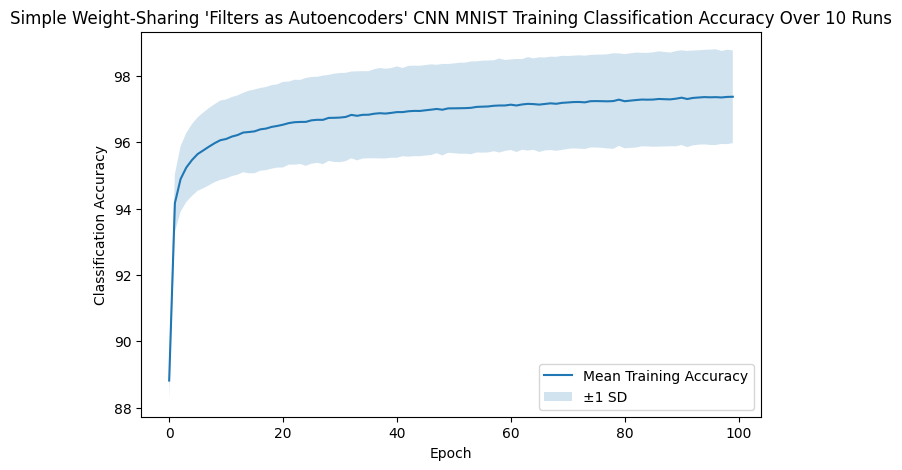

In [13]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

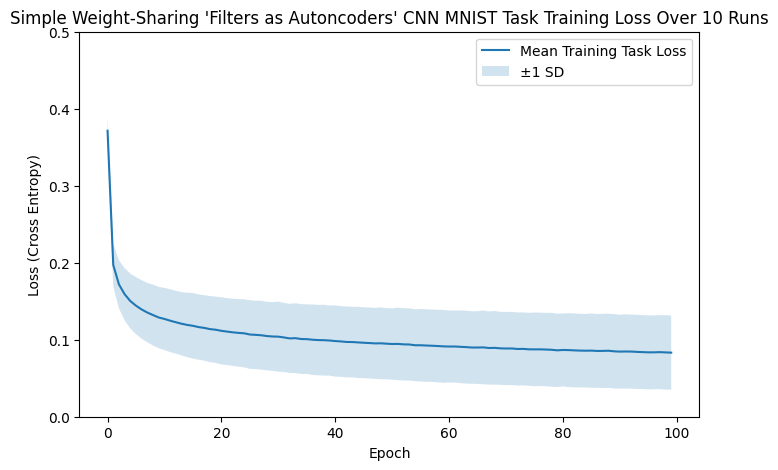

In [14]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_4697/3089517499.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


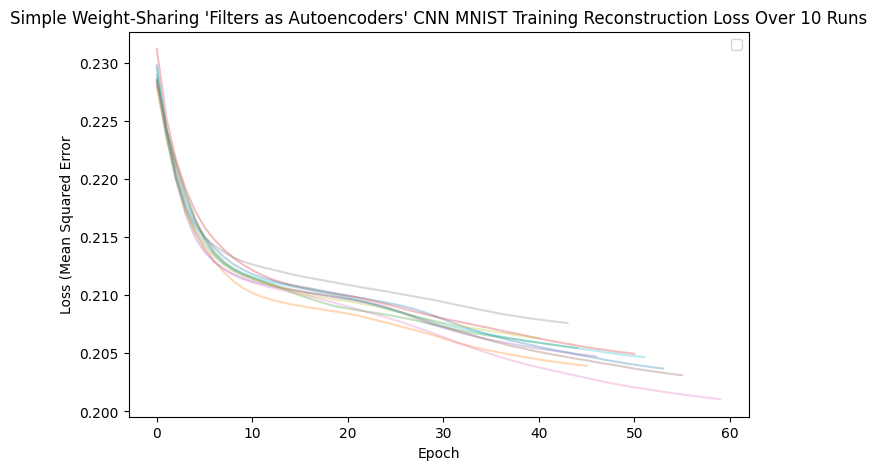

In [15]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
#plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [16]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 29.53369140625
All peak memories (including the warm up run):


[29.27783203125,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625]

In [17]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 339.0508479721001 
All training times for the 100 epochs over the 10 runs:


array([363.13550868, 321.55083501, 316.39188365, 350.8301744 ,
       326.11345314, 367.80151209, 387.63166462, 310.36048039,
       298.06626259, 348.62670515])

# sigma of 0.2

In [8]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_input_corruption_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        n_classes=10,
        output_padding=1,
        bias=False,
        sigma=0.2,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2294
Epoch [1/1], Task Training Loss: 0.4688, Accuracy: 88.41%
peak memory from train : 29.27783203125
memory now reset and is: 18.193359375 MB
time elapsed: 6.651637762999599
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2324
Epoch [2/100], Encoder Training Loss: 0.2263
Epoch [3/100], Encoder Training Loss: 0.2228
Epoch [4/100], Encoder Training Loss: 0.2205
Epoch [5/100], Encoder Training Loss: 0.2189
Epoch [6/100], Encoder Training Loss: 0.2176
Epoch [7/100], Encoder Training Loss: 0.2167
Epoch [8/100], Encoder Training Loss: 0.2161
Epoch [9/100], Encoder Training Loss: 0.2155
Epoch [10/100], Encoder Training Loss: 0.2150
Epoch [11/100], Encoder Training Loss: 0.2145
Epoch [12/100], Encoder Training Loss: 0.2141
Epoch [13/100], Encoder Training Loss: 0.2137
Epoch [14/100], Encoder Training Loss: 0.2133
Epoch [15/100], Encoder Training Loss: 0.2129
Epoch [16/100], Encoder Training Loss: 0.2123
E

In [10]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [11]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/noise_injection_0.2_autoencoding_cnn_14x14_feature_map.csv",
    index=False,
)

# Loss and Accuracy

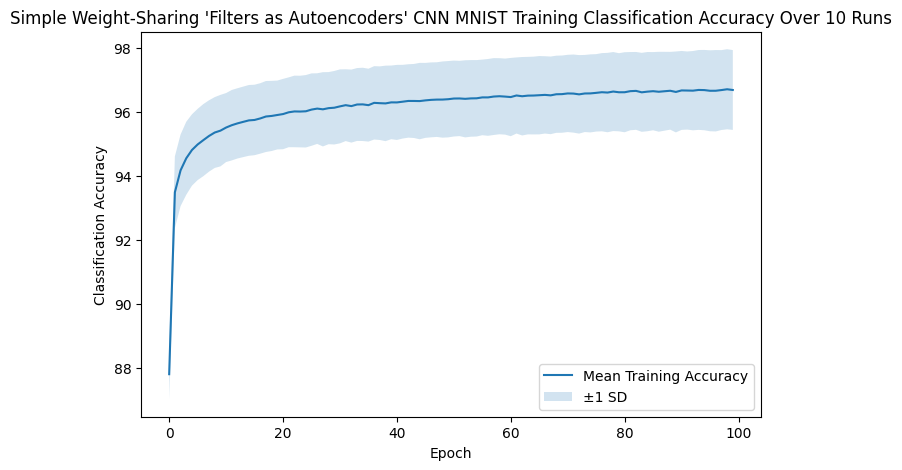

In [12]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

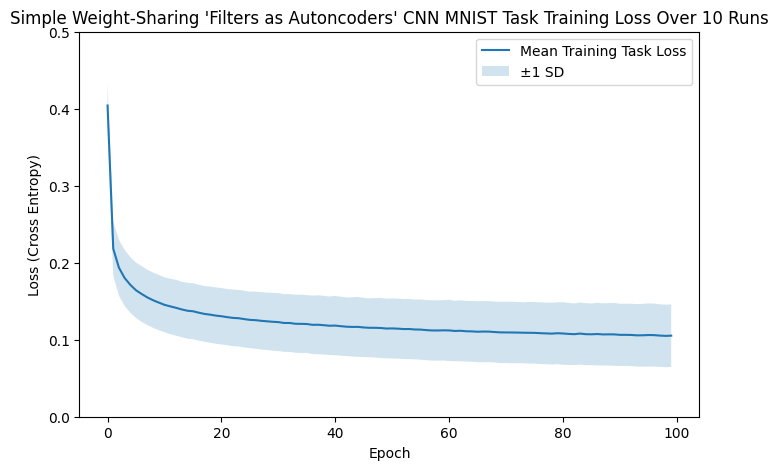

In [13]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

/tmp/ipykernel_20139/3089517499.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


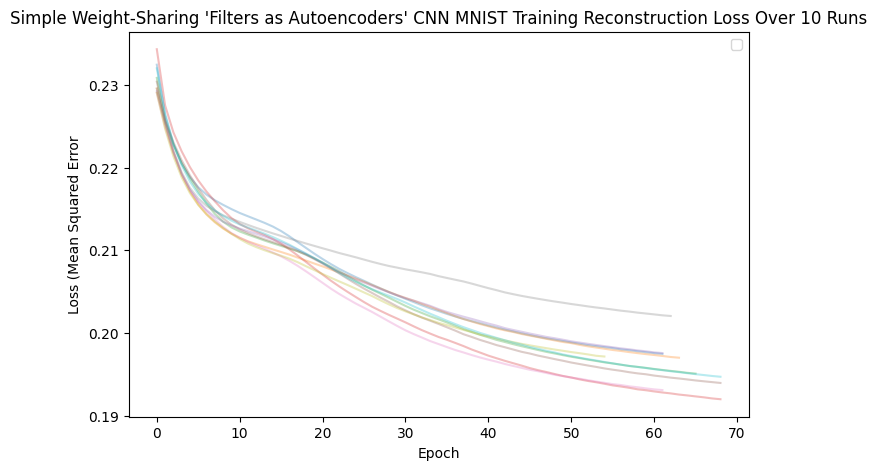

In [14]:
plt.figure(figsize=(8,5))

for losses in all_encoder_histories[1:]:  # skip warm-up
    plt.plot(losses, alpha=0.3)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error")


plt.legend()
#plt.ylim(bottom=0)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Reconstruction Loss Over 10 Runs")
plt.show()

# Memory and Runtime

In [15]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 29.53369140625
All peak memories (including the warm up run):


[29.27783203125,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625,
 29.53369140625]

In [16]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 408.2066214563 
All training times for the 100 epochs over the 10 runs:


array([400.36060147, 407.65579704, 416.62612035, 430.3620158 ,
       396.33425957, 434.68181588, 401.46842784, 403.03462548,
       362.73172881, 428.81082231])

# Gaussian masking of the same stride 2, 14x14 feature map producing model

In [9]:

all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
all_epoch_loss_plateaus =[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_masked_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        n_classes=10,
        output_padding=1,
        bias=False,
        sigma=0.2,
        seed=seed,
        patience=1
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    all_epoch_loss_plateaus.append(training_history["epoch_converged"])

    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
        
    run_times.append(elapsed)


model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2267
Epoch [1/1], Task Training Loss: 0.4181, Accuracy: 88.15%
peak memory from train : 29.27783203125
memory now reset and is: 18.193359375 MB
time elapsed: 7.041399990000002
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2284
Epoch [2/100], Encoder Training Loss: 0.2242
Epoch [3/100], Encoder Training Loss: 0.2213
Epoch [4/100], Encoder Training Loss: 0.2192
Epoch [5/100], Encoder Training Loss: 0.2180
Epoch [6/100], Encoder Training Loss: 0.2173
Epoch [7/100], Encoder Training Loss: 0.2170
Epoch [8/100], Encoder Training Loss: 0.2168
Epoch [9/100], Encoder Training Loss: 0.2167
Early stopping triggered at epoch 9... Now training classifier
Epoch [1/100], Task Training Loss: 0.3828, Accuracy: 88.81%
Epoch [2/100], Task Training Loss: 0.2308, Accuracy: 93.47%
Epoch [3/100], Task Training Loss: 0.1992, Accuracy: 94.33%
Epoch [4/100], Task Training Loss: 0.1806, Accuracy: 94.88%
Epoch [5/100], Task 

In [10]:
#make averages here


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    #"encoder_mean_loss": encoder_mean_loss,
    #"encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/noise_injection_0.2_autoencoding_cnn_14x14_feature_map.csv",
    index=False,
)

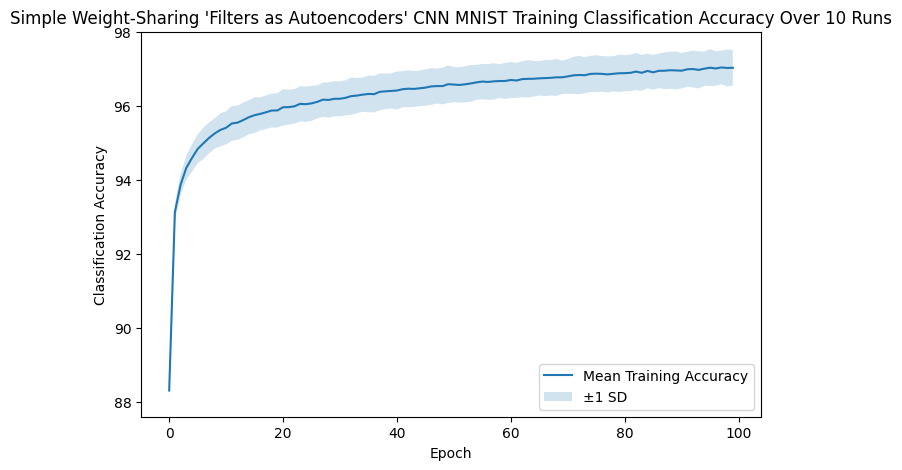

In [ ]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(top=98)
plt.title("Simple Weight-Sharing 'Filters as Autoencoders' CNN MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

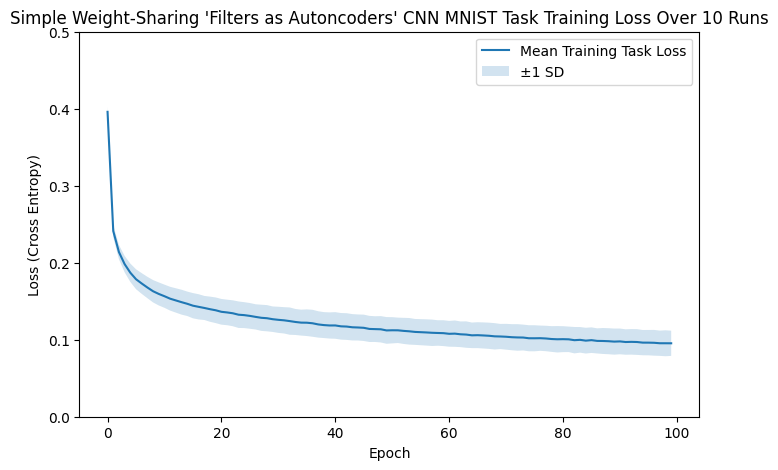

In [ ]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("Simple Weight-Sharing 'Filters as Autoncoders' CNN MNIST Task Training Loss Over 10 Runs")
plt.show()

# Regularisation on the 28x28 feature map model
### Firstly using the parallel training scheme... inspecting the initial model containing biases and separate encoder/decoder weights

# Halving the previously used learning rate (from 0.001 to 0.0005):

In [9]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.0005,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2145
Epoch [1/1], Task Training Loss: 0.5924, Accuracy: 85.47%
peak memory from train : 56.7958984375
memory now reset and is: 17.552734375 MB
time elapsed: 9.080057045999979
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2169
Epoch [1/100], Task Training Loss: 0.6093, Accuracy: 84.86%
Epoch [2/100], Encoder Training Loss: 0.1687
Epoch [2/100], Task Training Loss: 0.2571, Accuracy: 92.78%
Epoch [3/100], Encoder Training Loss: 0.1275
Epoch [3/100], Task Training Loss: 0.2225, Accuracy: 93.53%
Epoch [4/100], Encoder Training Loss: 0.1051
Epoch [4/100], Task Training Loss: 0.2170, Accuracy: 93.66%
Epoch [5/100], Encoder Training Loss: 0.0903
Epoch [5/100], Task Training Loss: 0.2138, Accuracy: 93.83%
Epoch [6/100], Encoder Training Loss: 0.0790
Epoch [6/100], Task Training Loss: 0.2137, Accuracy: 93.83%
Epoch [7/100], Encoder Training Loss: 0.0697
Epoch [7/100], Task Training Loss: 0.2136, Accuracy: 9

In [10]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [12]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=0.0005_results.csv",
    index=False,
)

# Loss and Accuracy

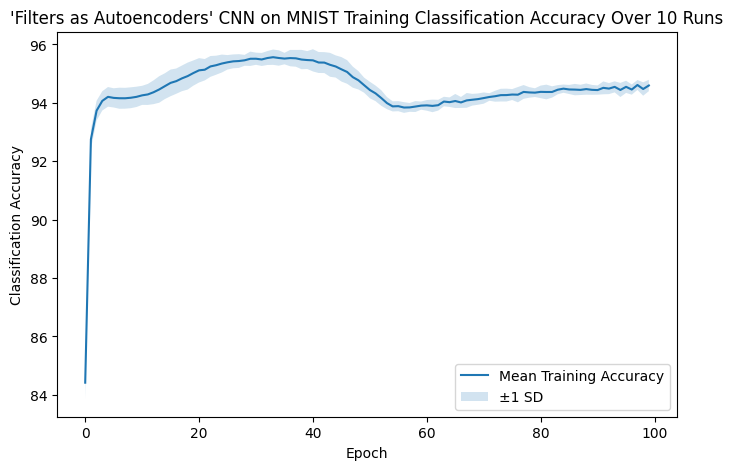

In [13]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

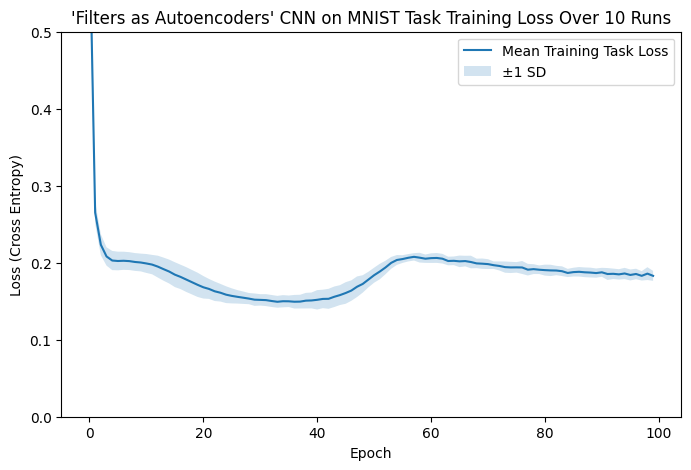

In [14]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

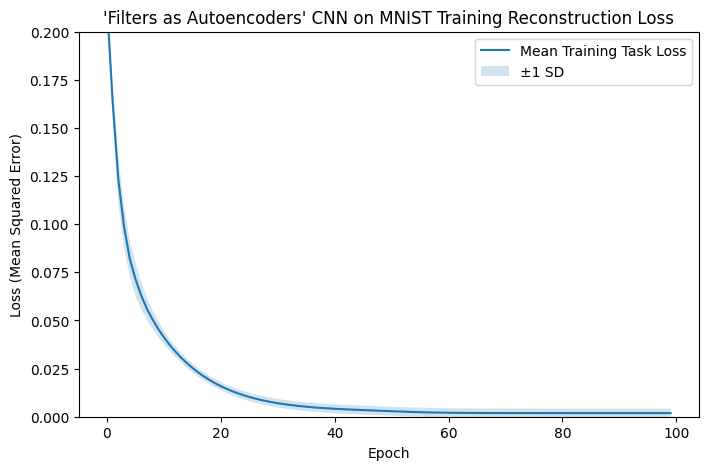

In [15]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Memory and Runtime

In [16]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 57.0986328125
All peak memories (including the warm up run):


[56.7958984375,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125,
 57.0986328125]

In [17]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 638.8370994854001 
All training times for the 100 epochs over the 10 runs:


array([623.20513582, 618.91094323, 624.08367284, 632.65171716,
       647.19138598, 652.67836533, 643.76521492, 650.01483044,
       661.09945019, 634.77027895])

# Smaller learning rate still of 0.0001

In [18]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.0001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2320
Epoch [1/1], Task Training Loss: 1.2773, Accuracy: 69.37%
peak memory from train : 57.0986328125
memory now reset and is: 17.552734375 MB
time elapsed: 6.613989993999894
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2335
Epoch [1/100], Task Training Loss: 1.3071, Accuracy: 68.38%
Epoch [2/100], Encoder Training Loss: 0.2254
Epoch [2/100], Task Training Loss: 0.6174, Accuracy: 87.03%
Epoch [3/100], Encoder Training Loss: 0.2168
Epoch [3/100], Task Training Loss: 0.4482, Accuracy: 89.63%
Epoch [4/100], Encoder Training Loss: 0.2078
Epoch [4/100], Task Training Loss: 0.3670, Accuracy: 90.96%
Epoch [5/100], Encoder Training Loss: 0.1987
Epoch [5/100], Task Training Loss: 0.3168, Accuracy: 91.78%
Epoch [6/100], Encoder Training Loss: 0.1887
Epoch [6/100], Task Training Loss: 0.2825, Accuracy: 92.38%
Epoch [7/100], Encoder Training Loss: 0.1780
Epoch [7/100], Task Training Loss: 0.2598, Accuracy: 9

In [19]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=0.0001_results.csv",
    index=False,
)

# Loss and Accuracy

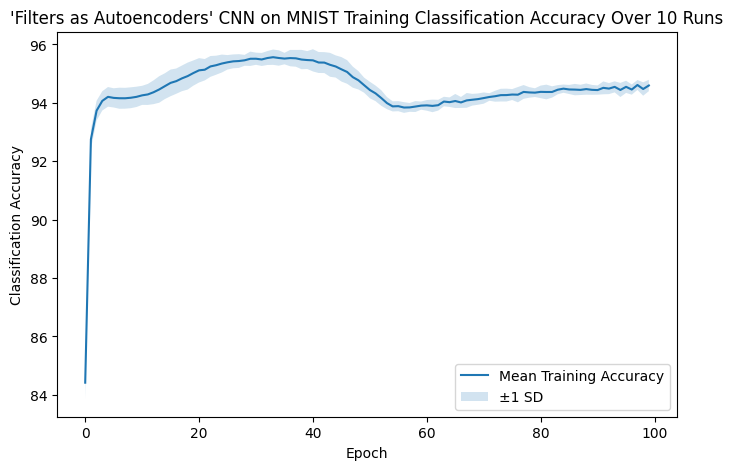

In [20]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

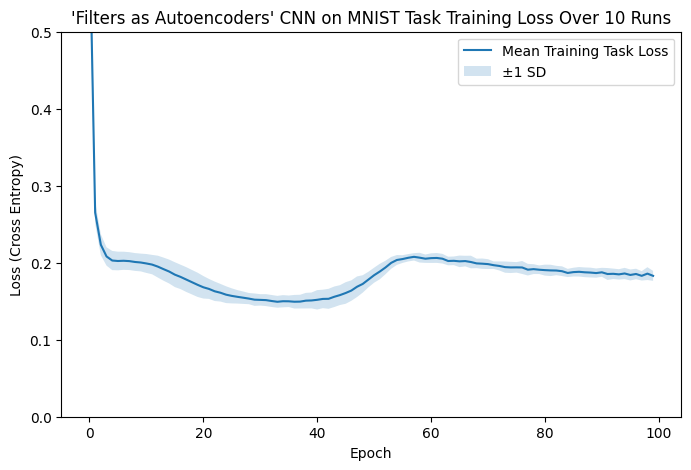

In [21]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

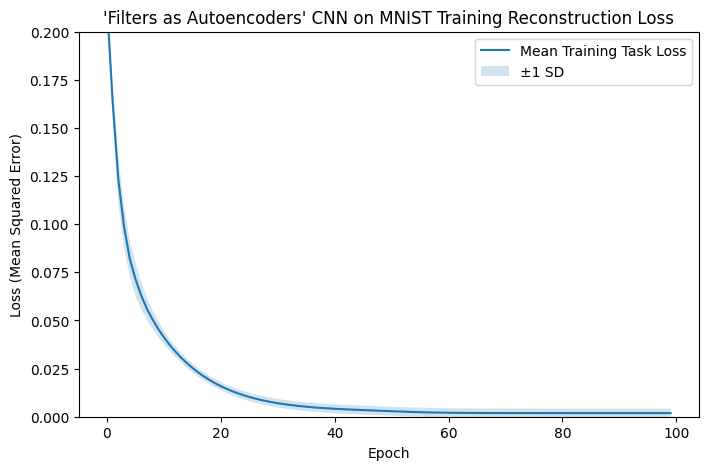

In [22]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Small learning rate for classification at 0.0001 standard for autoencoder at 0.001 

In [10]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.0001,
        ae_lr=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1881
Epoch [1/1], Task Training Loss: 1.2477, Accuracy: 69.86%
peak memory from train : 56.7958984375
memory now reset and is: 17.552734375 MB
time elapsed: 9.628945643000009
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1944
Epoch [1/100], Task Training Loss: 1.2505, Accuracy: 68.78%
Epoch [2/100], Encoder Training Loss: 0.1170
Epoch [2/100], Task Training Loss: 0.4524, Accuracy: 87.97%
Epoch [3/100], Encoder Training Loss: 0.0850
Epoch [3/100], Task Training Loss: 0.3475, Accuracy: 89.97%
Epoch [4/100], Encoder Training Loss: 0.0665
Epoch [4/100], Task Training Loss: 0.3134, Accuracy: 90.82%
Epoch [5/100], Encoder Training Loss: 0.0534
Epoch [5/100], Task Training Loss: 0.2949, Accuracy: 91.38%
Epoch [6/100], Encoder Training Loss: 0.0436
Epoch [6/100], Task Training Loss: 0.2830, Accuracy: 91.73%
Epoch [7/100], Encoder Training Loss: 0.0360
Epoch [7/100], Task Training Loss: 0.2757, Accuracy: 9

In [11]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [12]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [13]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_results.csv",
    index=False,
)

# Loss and Accuracy

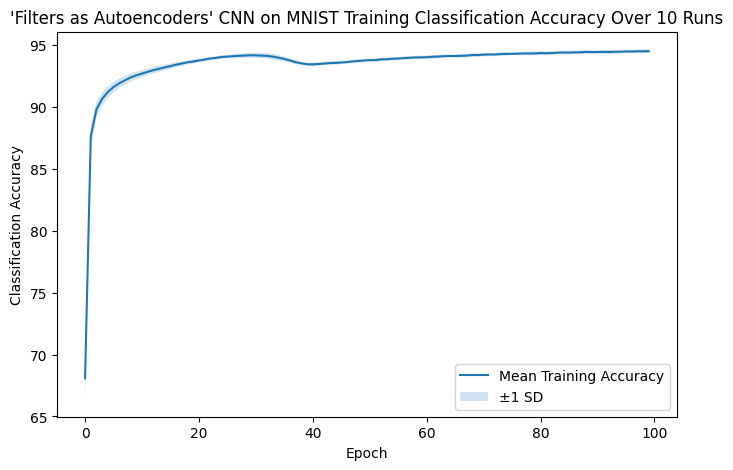

In [14]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

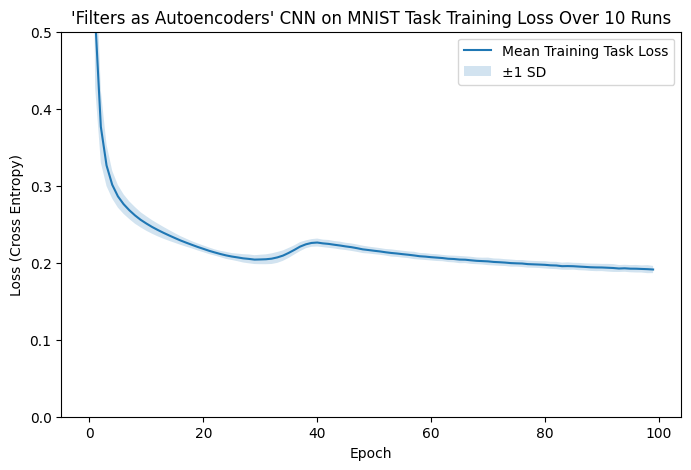

In [15]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

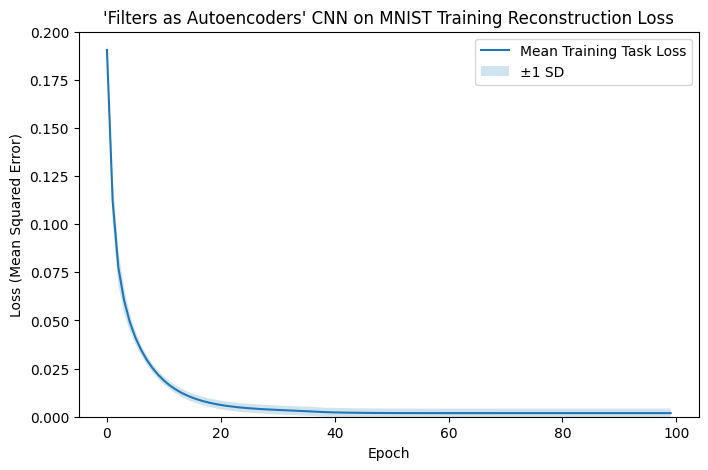

In [16]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Smaller still learning rates: 1e-05 for classification and 1e-02 for autencoding

In [7]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.00001,
        ae_lr=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.1881
Epoch [1/1], Task Training Loss: 2.1417, Accuracy: 24.14%
peak memory from train : 56.7958984375
memory now reset and is: 17.552734375 MB
time elapsed: 9.43027369899994
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1944
Epoch [1/100], Task Training Loss: 2.2096, Accuracy: 19.68%
Epoch [2/100], Encoder Training Loss: 0.1170
Epoch [2/100], Task Training Loss: 1.5980, Accuracy: 56.22%
Epoch [3/100], Encoder Training Loss: 0.0850
Epoch [3/100], Task Training Loss: 1.1196, Accuracy: 71.29%
Epoch [4/100], Encoder Training Loss: 0.0665
Epoch [4/100], Task Training Loss: 0.8462, Accuracy: 77.63%
Epoch [5/100], Encoder Training Loss: 0.0534
Epoch [5/100], Task Training Loss: 0.6881, Accuracy: 81.15%
Epoch [6/100], Encoder Training Loss: 0.0436
Epoch [6/100], Task Training Loss: 0.5888, Accuracy: 83.53%
Epoch [7/100], Encoder Training Loss: 0.0360
Epoch [7/100], Task Training Loss: 0.5228, Accuracy: 85

In [8]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


In [10]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_smaller_results.csv",
    index=False,
)

# Loss and Accuracy

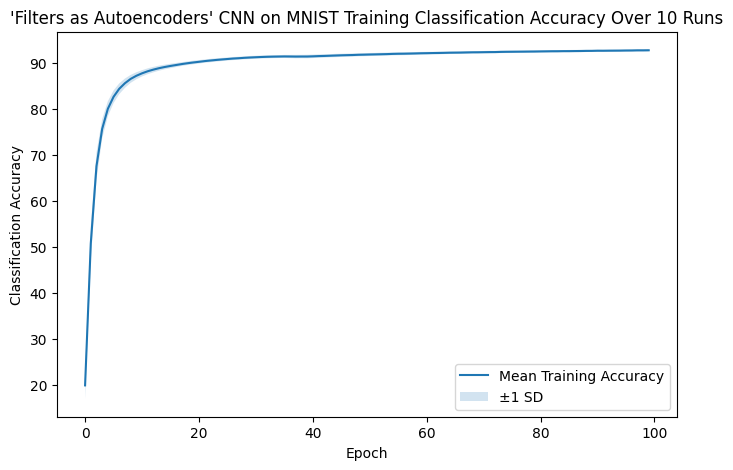

In [11]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

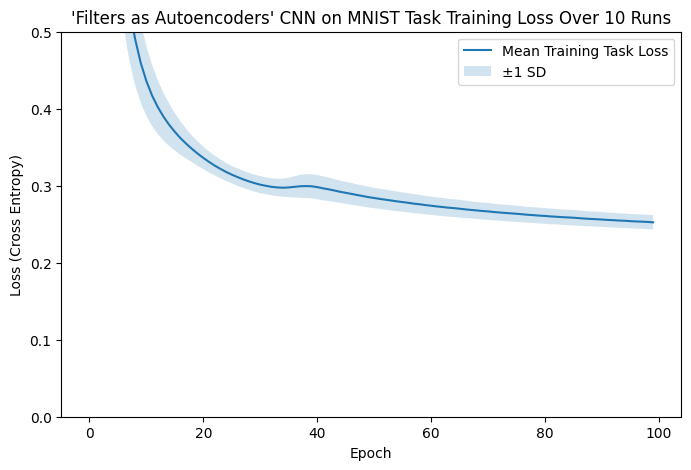

In [12]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

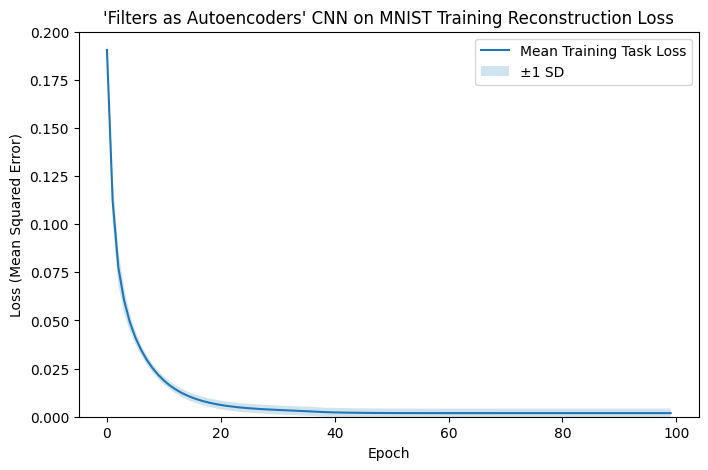

In [13]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Experiment- small learning rate for the autoencoder, larger learning rate for the classifier...

In [8]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2355
Epoch [1/1], Task Training Loss: 0.4432, Accuracy: 88.19%
peak memory from train : 56.7958984375
memory now reset and is: 17.552734375 MB
time elapsed: 10.038327357000014
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2371
Epoch [1/100], Task Training Loss: 0.4407, Accuracy: 88.24%
Epoch [2/100], Encoder Training Loss: 0.2363
Epoch [2/100], Task Training Loss: 0.2109, Accuracy: 94.31%
Epoch [3/100], Encoder Training Loss: 0.2355
Epoch [3/100], Task Training Loss: 0.1669, Accuracy: 95.47%
Epoch [4/100], Encoder Training Loss: 0.2347
Epoch [4/100], Task Training Loss: 0.1419, Accuracy: 96.20%
Epoch [5/100], Encoder Training Loss: 0.2339
Epoch [5/100], Task Training Loss: 0.1247, Accuracy: 96.72%
Epoch [6/100], Encoder Training Loss: 0.2331
Epoch [6/100], Task Training Loss: 0.1110, Accuracy: 97.06%
Epoch [7/100], Encoder Training Loss: 0.2323
Epoch [7/100], Task Training Loss: 0.1015, Accuracy: 

In [9]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [11]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_results.csv",
    index=False,
)

# Loss and Accuracy

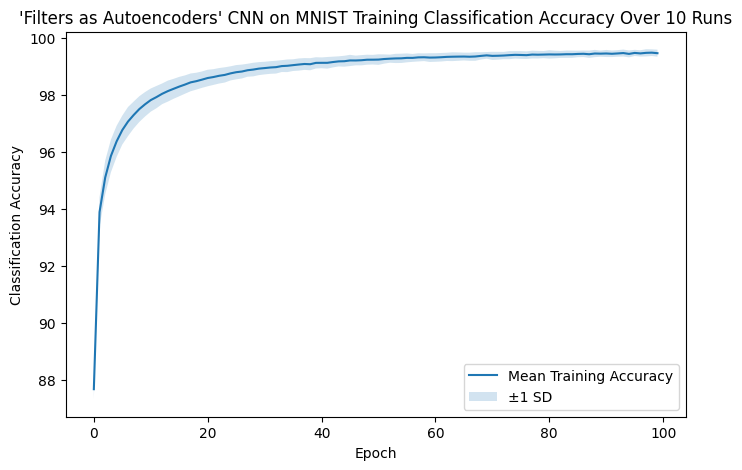

In [12]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

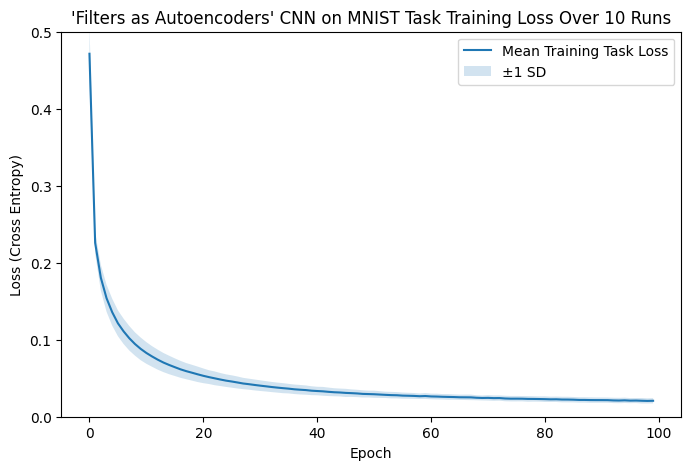

In [13]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

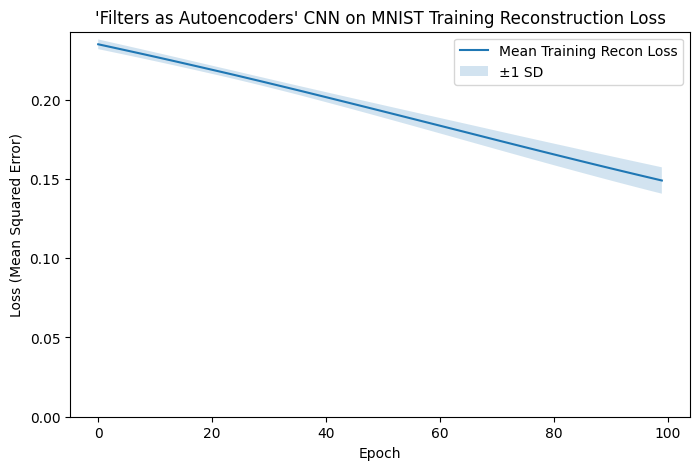

In [16]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Recon Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Now same as above but remove the bias (attempting to create more diverse and sparse features)

In [11]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=False,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2394
Epoch [1/1], Task Training Loss: 0.4348, Accuracy: 88.56%
peak memory from train : 64.7666015625
memory now reset and is: 25.298828125 MB
time elapsed: 7.319164593000096
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2428
Epoch [1/100], Task Training Loss: 0.4128, Accuracy: 88.34%
Epoch [2/100], Encoder Training Loss: 0.2424
Epoch [2/100], Task Training Loss: 0.2179, Accuracy: 93.92%
Epoch [3/100], Encoder Training Loss: 0.2420
Epoch [3/100], Task Training Loss: 0.1774, Accuracy: 95.12%
Epoch [4/100], Encoder Training Loss: 0.2416
Epoch [4/100], Task Training Loss: 0.1534, Accuracy: 95.79%
Epoch [5/100], Encoder Training Loss: 0.2412
Epoch [5/100], Task Training Loss: 0.1361, Accuracy: 96.34%
Epoch [6/100], Encoder Training Loss: 0.2408
Epoch [6/100], Task Training Loss: 0.1222, Accuracy: 96.67%
Epoch [7/100], Encoder Training Loss: 0.2405
Epoch [7/100], Task Training Loss: 0.1123, Accuracy: 9

In [12]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [14]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_no_bias_results.csv",
    index=False,
)

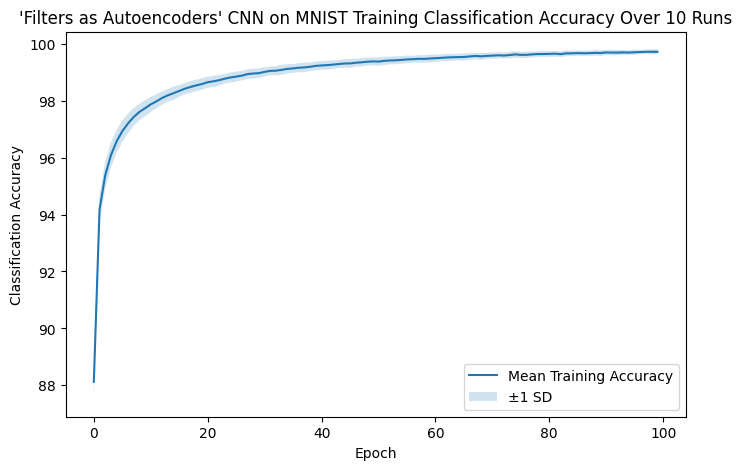

In [15]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

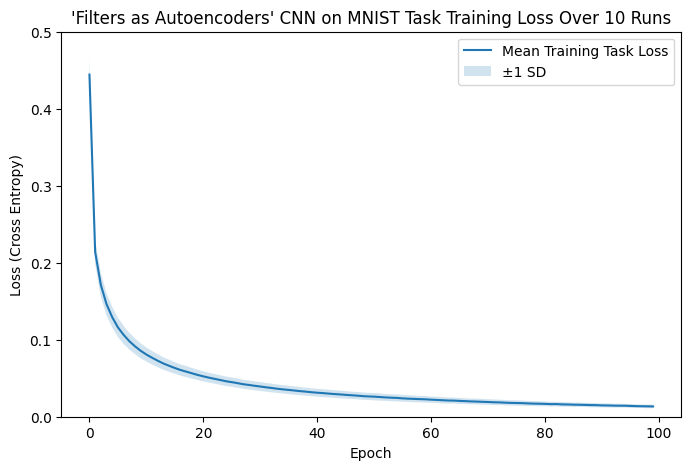

In [16]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

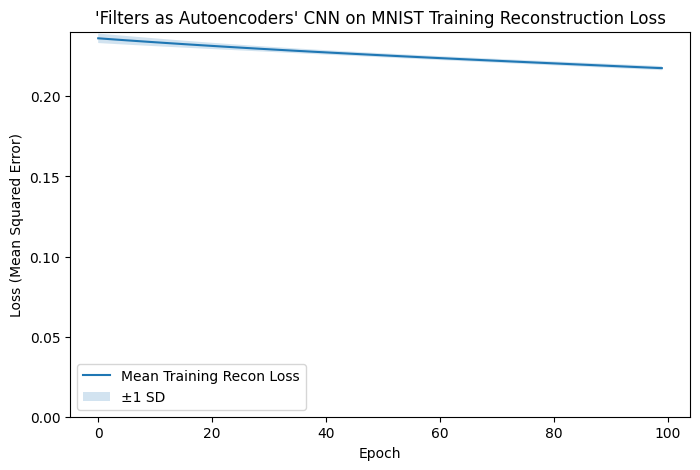

In [17]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Recon Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Same as before, with removed bias but now with weight tying

In [8]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100

    model, training_history, elapsed = nan_cnn_experiment.train_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        learning_rate=0.001,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=False,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2234
Epoch [1/1], Task Training Loss: 0.4010, Accuracy: 88.93%
peak memory from train : 56.7021484375
memory now reset and is: 17.505859375 MB
time elapsed: 8.857827982000003
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2308
Epoch [1/100], Task Training Loss: 0.4180, Accuracy: 88.52%
Epoch [2/100], Encoder Training Loss: 0.2306
Epoch [2/100], Task Training Loss: 0.2068, Accuracy: 94.35%
Epoch [3/100], Encoder Training Loss: 0.2304
Epoch [3/100], Task Training Loss: 0.1641, Accuracy: 95.58%
Epoch [4/100], Encoder Training Loss: 0.2303
Epoch [4/100], Task Training Loss: 0.1398, Accuracy: 96.18%
Epoch [5/100], Encoder Training Loss: 0.2301
Epoch [5/100], Task Training Loss: 0.1229, Accuracy: 96.75%
Epoch [6/100], Encoder Training Loss: 0.2299
Epoch [6/100], Task Training Loss: 0.1096, Accuracy: 97.04%
Epoch [7/100], Encoder Training Loss: 0.2297
Epoch [7/100], Task Training Loss: 0.1000, Accuracy: 9

In [9]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [12]:
epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_no_bias_weight_tie_results.csv",
    index=False,
)

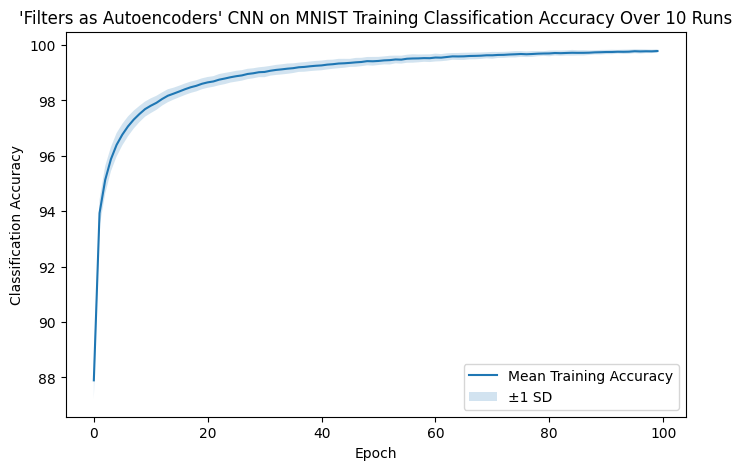

In [13]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

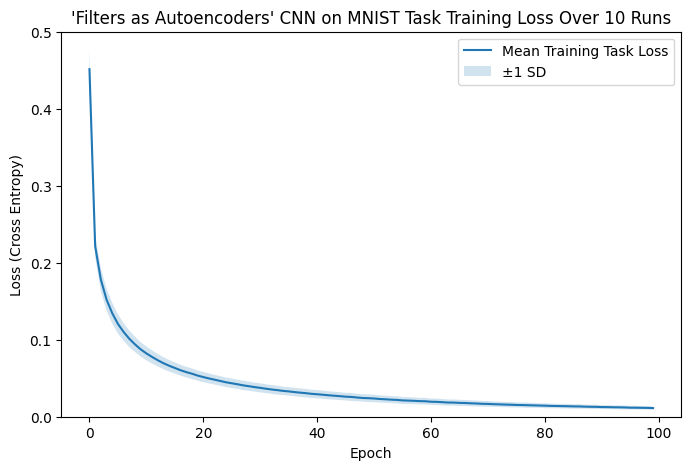

In [14]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

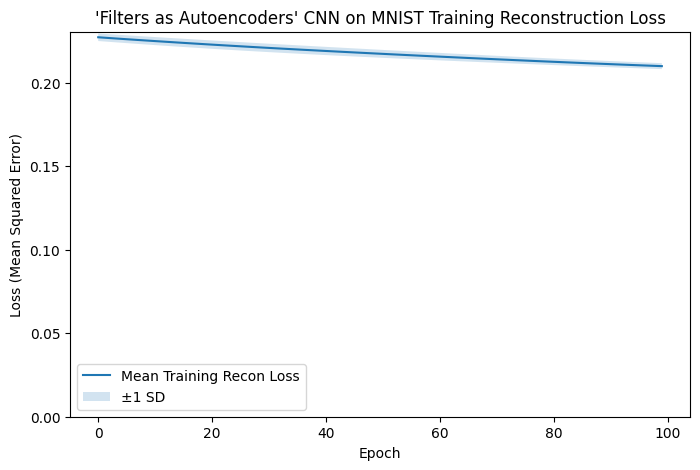

In [15]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Recon Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Read in results and compare stats

In [16]:
initial_slow_encoder_results = pd.read_csv("/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_results.csv")


In [17]:
no_bias_slow_encoder_results = pd.read_csv("/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_no_bias_results.csv")


In [18]:
no_bias_weight_tie_slow_encoder_results = pd.read_csv("/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_no_bias_weight_tie_results.csv")


### Initial slow autoencoder:

In [19]:
print(f"Initial Max accuracy: {initial_slow_encoder_results["mean_accuracy"].max()}")
print(f"Initial Max accuracy std: {initial_slow_encoder_results["std_accuracy"].max()}")

print(f"Initial Min Loss: {initial_slow_encoder_results["task_mean_loss"].min()}")
print(f"Initial Max Loss std: {initial_slow_encoder_results["task_std_loss"].max()}")

print(f"Initial Min Encoder Loss: {initial_slow_encoder_results["encoder_mean_loss"].min()} (to 10 dp: {initial_slow_encoder_results["encoder_mean_loss"].min():.10f})")
print(f"Initial Max Encoder Loss std: {initial_slow_encoder_results["encoder_std_loss"].min()} (to 10 dp: {initial_slow_encoder_results["encoder_std_loss"].min():.10f})")

Initial Max accuracy: 99.48100000000002
Initial Max accuracy std: 0.5923778823990267
Initial Min Loss: 0.0205325347496236
Initial Max Loss std: 0.0378687969634053
Initial Min Encoder Loss: 0.1489617211494515 (to 10 dp: 0.1489617211)
Initial Max Encoder Loss std: 0.0025720398488293 (to 10 dp: 0.0025720398)


### No Bias slow autoencoder:

In [20]:
print(f"No Bias Max accuracy: {no_bias_slow_encoder_results["mean_accuracy"].max()}")
print(f"No Bias Max accuracy std: {no_bias_slow_encoder_results["std_accuracy"].max()}")

print(f"No Bias Min Loss: {no_bias_slow_encoder_results["task_mean_loss"].min()}")
print(f"No Bias Max Loss std: {no_bias_slow_encoder_results["task_std_loss"].max()}")

print(f"No Bias Min Encoder Loss: {no_bias_slow_encoder_results["encoder_mean_loss"].min()} (to 10 dp: {no_bias_slow_encoder_results["encoder_mean_loss"].min():.10f})")
print(f"No Bias Max Encoder Loss std: {no_bias_slow_encoder_results["encoder_std_loss"].min()} (to 10 dp: {no_bias_slow_encoder_results["encoder_std_loss"].min():.10f})")

No Bias Max accuracy: 99.71600000000002
No Bias Max accuracy std: 0.6124020329816013
No Bias Min Loss: 0.0133538646040424
No Bias Max Loss std: 0.0215188095510272
No Bias Min Encoder Loss: 0.2175734073740053 (to 10 dp: 0.2175734074)
No Bias Max Encoder Loss std: 0.0012284200102466 (to 10 dp: 0.0012284200)


### No Bias Weight-Tie slow autoencoder:

In [21]:
print(f"No Bias Weight-Tie Max accuracy: {no_bias_weight_tie_slow_encoder_results["mean_accuracy"].max()}")
print(f"No Bias Weight-Tie Max accuracy std: {no_bias_weight_tie_slow_encoder_results["std_accuracy"].max()}")

print(f"No Bias Weight-Tie Min Loss: {no_bias_weight_tie_slow_encoder_results["task_mean_loss"].min()}")
print(f"No Bias Weight-Tie Max Loss std: {no_bias_weight_tie_slow_encoder_results["task_std_loss"].max()}")

print(f"No Bias Weight-Tie Min Encoder Loss: {no_bias_weight_tie_slow_encoder_results["encoder_mean_loss"].min()} (to 10 dp: {no_bias_weight_tie_slow_encoder_results["encoder_mean_loss"].min():.10f})")
print(f"No Bias Weight-Tie Max Encoder Loss std: {no_bias_weight_tie_slow_encoder_results["encoder_std_loss"].min()} (to 10 dp: {no_bias_weight_tie_slow_encoder_results["encoder_std_loss"].min():.10f})")

No Bias Weight-Tie Max accuracy: 99.78233333333334
No Bias Weight-Tie Max accuracy std: 0.6813943221235583
No Bias Weight-Tie Min Loss: 0.011204788494865
No Bias Weight-Tie Max Loss std: 0.027117666322771
No Bias Weight-Tie Min Encoder Loss: 0.2098143556844839 (to 10 dp: 0.2098143557)
No Bias Weight-Tie Max Encoder Loss std: 0.0017768099532316 (to 10 dp: 0.0017768100)


# Trying the same as above but compressing the feature maps: (so standard with bias and separate weights but now with a compressed 14x14 latent representation)

In [ ]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): #1 run
    #run training and evaluation

    print(f"model run: {seed}")


    model, training_history, elapsed = nan_cnn_experiment.train_parallel_schedule_no_pool_nan_cnn(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        output_padding=1,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.3368
Epoch [1/100], Task Training Loss: 0.5309, Accuracy: 86.50%
Epoch [2/100], Encoder Training Loss: 0.3367
Epoch [2/100], Task Training Loss: 0.2733, Accuracy: 92.45%
Epoch [3/100], Encoder Training Loss: 0.3365
Epoch [3/100], Task Training Loss: 0.2277, Accuracy: 93.72%
Epoch [4/100], Encoder Training Loss: 0.3364
Epoch [4/100], Task Training Loss: 0.1997, Accuracy: 94.51%
Epoch [5/100], Encoder Training Loss: 0.3362
Epoch [5/100], Task Training Loss: 0.1807, Accuracy: 95.05%
Epoch [6/100], Encoder Training Loss: 0.3360
Epoch [6/100], Task Training Loss: 0.1647, Accuracy: 95.48%
Epoch [7/100], Encoder Training Loss: 0.3359
Epoch [7/100], Task Training Loss: 0.1518, Accuracy: 95.85%
Epoch [8/100], Encoder Training Loss: 0.3357
Epoch [8/100], Task Training Loss: 0.1412, Accuracy: 96.17%
Epoch [9/100], Encoder Training Loss: 0.3356
Epoch [9/100], Task Training Loss: 0.1318, Accuracy: 96.42%
Epoch [10/100], Encoder Tr

# (29 mb overhead and 625 seconds to train to 100 epochs)

In [24]:
epochs = np.arange(1, len(all_task_histories[0])+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_loss": all_task_histories[0],

    "accuracy": all_accuracy_histories[0],

    "encoder_loss": all_encoder_histories[0],

})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_compressed.csv",
    index=False,
)

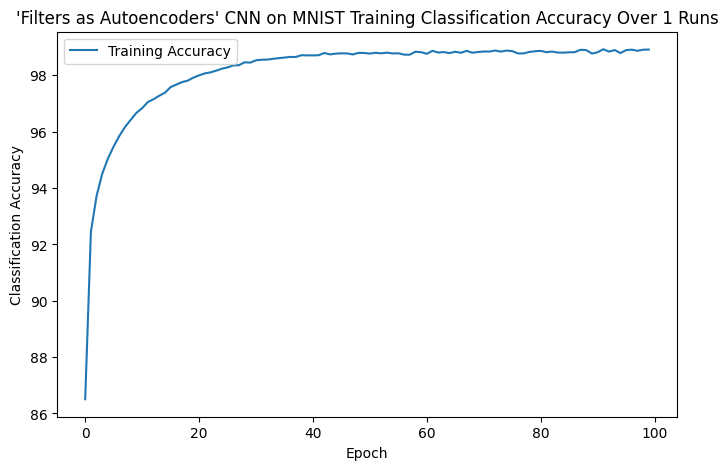

In [32]:
epochs = np.arange(len(all_accuracy_histories[0]))

plt.figure(figsize=(8,5))

plt.plot(epochs, all_accuracy_histories[0],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

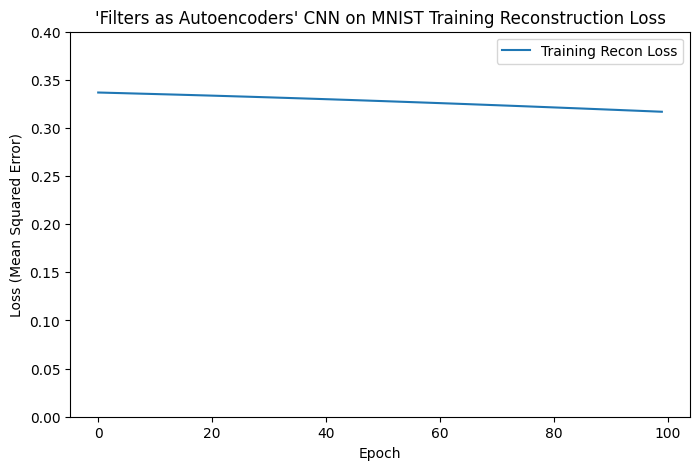

In [33]:
epochs = np.arange(len(all_encoder_histories[0]))

plt.figure(figsize=(8,5))

plt.plot(epochs, all_encoder_histories[0],label="Training Recon Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0, top=0.4)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Now remove bias for the above

In [34]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): 
    #run training and evaluation

    print(f"model run: {seed}")


    model, training_history, elapsed = nan_cnn_experiment.train_parallel_schedule_no_pool_nan_cnn(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        bias=False,
        output_padding=1,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.3370
Epoch [1/100], Task Training Loss: 0.5147, Accuracy: 87.00%
Epoch [2/100], Encoder Training Loss: 0.3370
Epoch [2/100], Task Training Loss: 0.2608, Accuracy: 92.95%
Epoch [3/100], Encoder Training Loss: 0.3370
Epoch [3/100], Task Training Loss: 0.2177, Accuracy: 94.04%
Epoch [4/100], Encoder Training Loss: 0.3370
Epoch [4/100], Task Training Loss: 0.1920, Accuracy: 94.76%
Epoch [5/100], Encoder Training Loss: 0.3370
Epoch [5/100], Task Training Loss: 0.1750, Accuracy: 95.22%
Epoch [6/100], Encoder Training Loss: 0.3369
Epoch [6/100], Task Training Loss: 0.1609, Accuracy: 95.67%
Epoch [7/100], Encoder Training Loss: 0.3369
Epoch [7/100], Task Training Loss: 0.1500, Accuracy: 95.96%
Epoch [8/100], Encoder Training Loss: 0.3369
Epoch [8/100], Task Training Loss: 0.1411, Accuracy: 96.21%
Epoch [9/100], Encoder Training Loss: 0.3369
Epoch [9/100], Task Training Loss: 0.1330, Accuracy: 96.40%
Epoch [10/100], Encoder Tr

In [35]:
epochs = np.arange(1, len(all_task_histories[0])+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_loss": all_task_histories[0],

    "accuracy": all_accuracy_histories[0],

    "encoder_loss": all_encoder_histories[0],

})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_compressed_no_bias.csv",
    index=False,
)

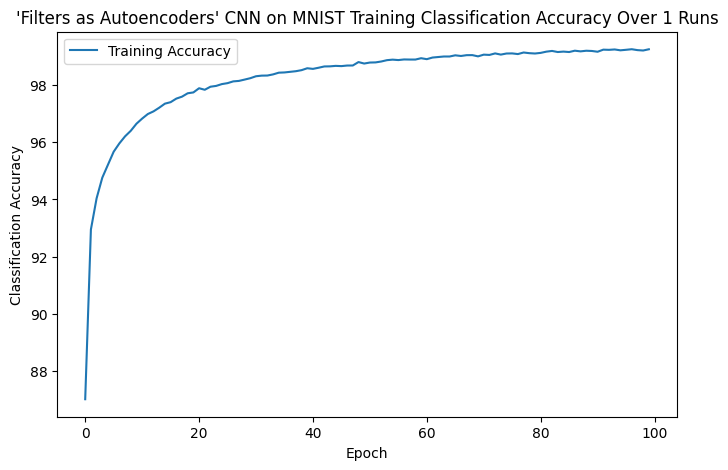

In [36]:
epochs = np.arange(len(all_accuracy_histories[0]))

plt.figure(figsize=(8,5))

plt.plot(epochs, all_accuracy_histories[0],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

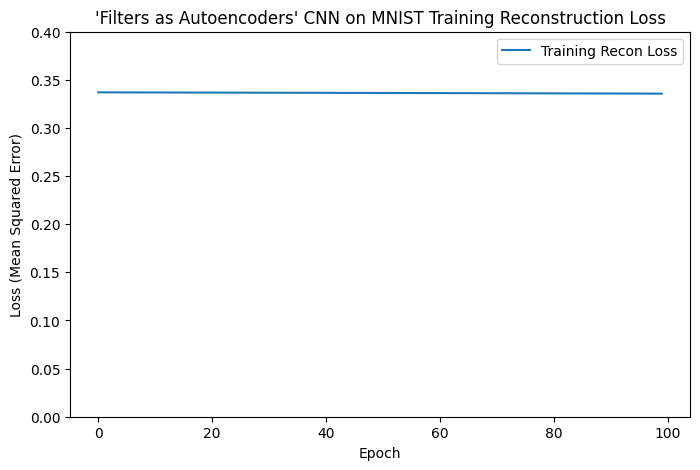

In [37]:
epochs = np.arange(len(all_encoder_histories[0]))

plt.figure(figsize=(8,5))

plt.plot(epochs, all_encoder_histories[0],label="Training Recon Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0, top=0.4)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# now share weights with removed bias

In [13]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): 
    #run training and evaluation

    print(f"model run: {seed}")

    model, training_history, elapsed = nan_cnn_experiment.train_parallel_schedule_no_pool_weight_share(
        mnist,
        input_dims=28,
        dual_lr= True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=2,
        padding=1,
        kernel_size=3,
        output_padding=1,
        n_classes=10,
        bias=False,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2281
Epoch [1/100], Task Training Loss: 0.4725, Accuracy: 87.65%
Epoch [2/100], Encoder Training Loss: 0.2281
Epoch [2/100], Task Training Loss: 0.2402, Accuracy: 93.38%
Epoch [3/100], Encoder Training Loss: 0.2280
Epoch [3/100], Task Training Loss: 0.1985, Accuracy: 94.56%
Epoch [4/100], Encoder Training Loss: 0.2280
Epoch [4/100], Task Training Loss: 0.1728, Accuracy: 95.26%
Epoch [5/100], Encoder Training Loss: 0.2279
Epoch [5/100], Task Training Loss: 0.1557, Accuracy: 95.78%
Epoch [6/100], Encoder Training Loss: 0.2279
Epoch [6/100], Task Training Loss: 0.1409, Accuracy: 96.17%
Epoch [7/100], Encoder Training Loss: 0.2278
Epoch [7/100], Task Training Loss: 0.1299, Accuracy: 96.51%
Epoch [8/100], Encoder Training Loss: 0.2277
Epoch [8/100], Task Training Loss: 0.1209, Accuracy: 96.74%
Epoch [9/100], Encoder Training Loss: 0.2277
Epoch [9/100], Task Training Loss: 0.1128, Accuracy: 96.93%
Epoch [10/100], Encoder Tr

In [ ]:
#best accuracies are: 99.08% 99.66% 99.60% 99.56% 99.31%  99.75% 99.49% 99.37% 99.76%  99.70% 

In [1]:
99.08 + 99.66 +99.60+ 99.56+ 99.31 + 99.75+ 99.49+ 99.37 +99.76 + 99.70 

995.2800000000001

In [2]:
995.2800000000001 /10

99.528

# loss and accuracy

In [14]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [15]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_results_compressed_features_no_bias_weight_tie.csv",
    index=False,
)

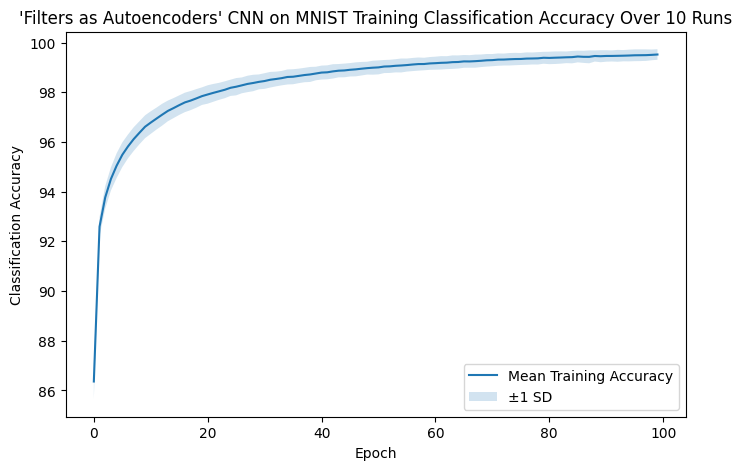

In [16]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

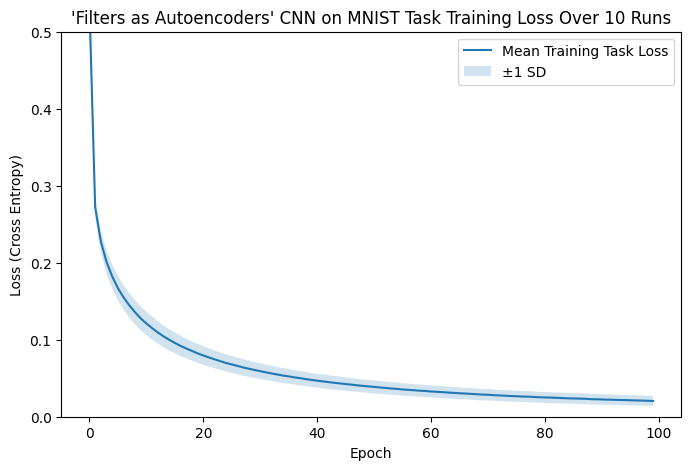

In [17]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

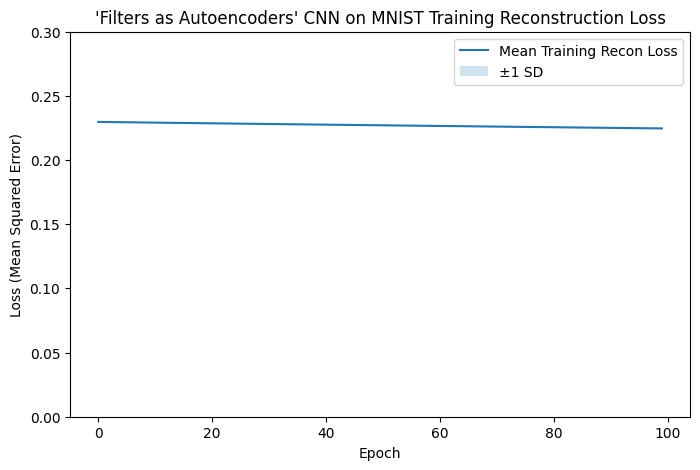

In [19]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Recon Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0, top=0.3)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Memory and Runtime

In [20]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 30.0830078125
All peak memories (including the warm up run):


[30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125,
 30.0830078125]

In [21]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 523.5402350768003 
All training times for the 100 epochs over the 10 runs:


array([526.39240009, 524.95136025, 528.28526091, 526.01430007,
       523.09588122, 522.54237006, 520.05603838, 519.54745906,
       521.21316788, 523.30411285])

# Optimal model with one filter

In [32]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): 

    print(f"model run: {seed}")

    if seed == 0:
        n_epochs =1 #warm up run to avoid measuring the initial one-time allocations

    else: 
        n_epochs = 100


    model, training_history, elapsed = nan_cnn_experiment.train_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=1,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2225
Epoch [1/1], Task Training Loss: 1.5204, Accuracy: 60.58%
peak memory from train : 65.0771484375
memory now reset and is: 23.8984375 MB
time elapsed: 1.130877794999833
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2309
Epoch [1/100], Task Training Loss: 2.2435, Accuracy: 39.04%
Epoch [2/100], Encoder Training Loss: 0.2308
Epoch [2/100], Task Training Loss: 2.1123, Accuracy: 60.31%
Epoch [3/100], Encoder Training Loss: 0.2308
Epoch [3/100], Task Training Loss: 1.9744, Accuracy: 66.81%
Epoch [4/100], Encoder Training Loss: 0.2308
Epoch [4/100], Task Training Loss: 1.8322, Accuracy: 69.14%
Epoch [5/100], Encoder Training Loss: 0.2307
Epoch [5/100], Task Training Loss: 1.6898, Accuracy: 70.82%
Epoch [6/100], Encoder Training Loss: 0.2307
Epoch [6/100], Task Training Loss: 1.5499, Accuracy: 72.11%
Epoch [7/100], Encoder Training Loss: 0.2306
Epoch [7/100], Task Training Loss: 1.4156, Accuracy: 73.

In [33]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()

In [35]:

epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_epoch_lr=dual_reverse_smaller_1_map_no_bias_weight_tie.csv",
    index=False,
)

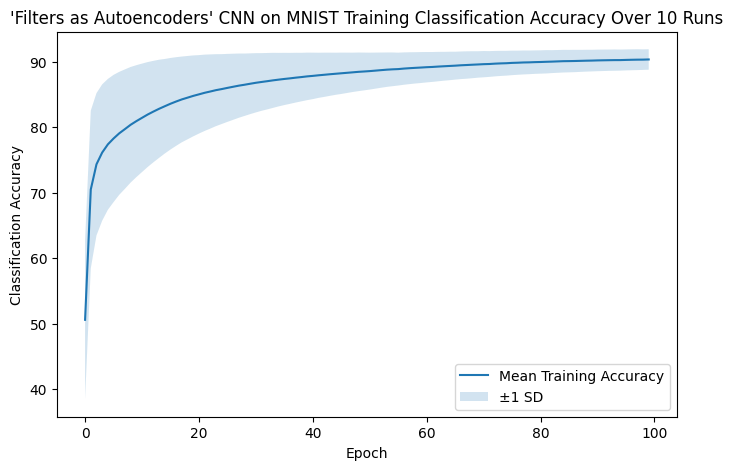

In [36]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 10 Runs")
plt.show()

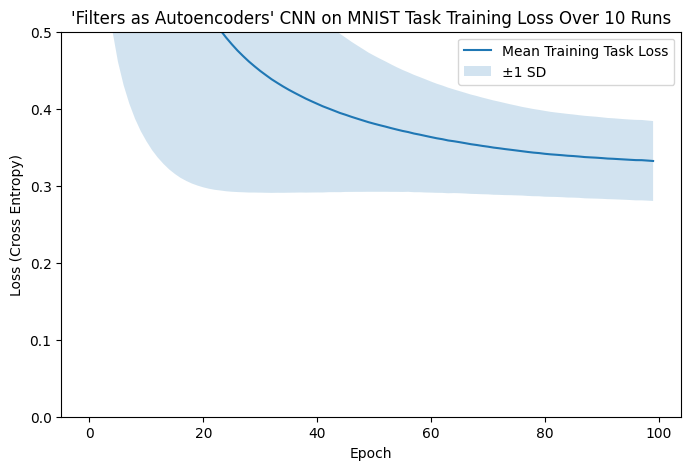

In [37]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Task Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 10 Runs")
plt.show()

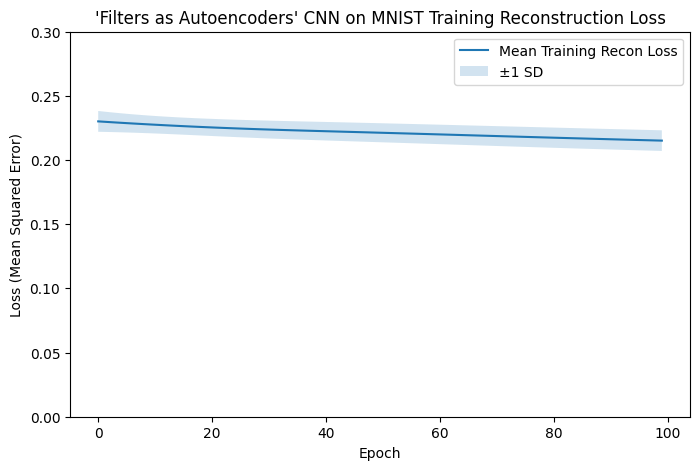

In [38]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Recon Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0, top=0.3)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Memory and Runtime

In [39]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 28.432470703125
All peak memories (including the warm up run):


[65.0771484375,
 33.74853515625,
 27.841796875,
 27.841796875,
 27.841796875,
 27.841796875,
 27.841796875,
 27.841796875,
 27.841796875,
 27.841796875,
 27.841796875]

In [40]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 122.66821192950006 
All training times for the 100 epochs over the 10 runs:


array([122.59281009, 122.49801106, 122.68218513, 123.17954636,
       122.74262292, 122.92299284, 122.25420338, 122.27435316,
       122.92615113, 122.60924323])

# Retrieving and inspecting feature maps and kernels of the original run (the platauing/ diverging learning) for sample MNIST 'digit 5' for model seed=0

In [7]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_show_features(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1881
Epoch [1/100], Task Training Loss: 0.4304, Accuracy: 88.63%
Epoch [2/100], Encoder Training Loss: 0.1011
Epoch [2/100], Task Training Loss: 0.2326, Accuracy: 93.28%
Epoch [3/100], Encoder Training Loss: 0.0722
Epoch [3/100], Task Training Loss: 0.2219, Accuracy: 93.48%
Epoch [4/100], Encoder Training Loss: 0.0574
Epoch [4/100], Task Training Loss: 0.2175, Accuracy: 93.66%
Epoch [5/100], Encoder Training Loss: 0.0471
Epoch [5/100], Task Training Loss: 0.2119, Accuracy: 93.74%
Epoch [6/100], Encoder Training Loss: 0.0393
Epoch [6/100], Task Training Loss: 0.2048, Accuracy: 94.04%
Epoch [7/100], Encoder Training Loss: 0.0331
Epoch [7/100], Task Training Loss: 0.2029, Accuracy: 94.09%
Epoch [8/100], Encoder Training Loss: 0.0280
Epoch [8/100], Task Training Loss: 0.1911, Accuracy: 94.48%
Epoch [9/100], Encoder Training Loss: 0.0239
Epoch [9/100], Task Training Loss: 0.1915, Accuracy: 94.31%
Epoch [10/100], Encoder Tr

### The above model accuracy peaks at 30 epochs at 94.67%, around the average seen in across the previous 10 runs

# Loss and Accuracy

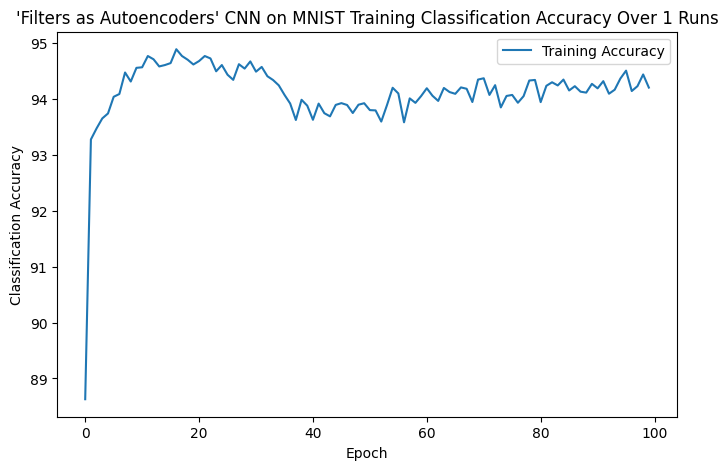

In [8]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

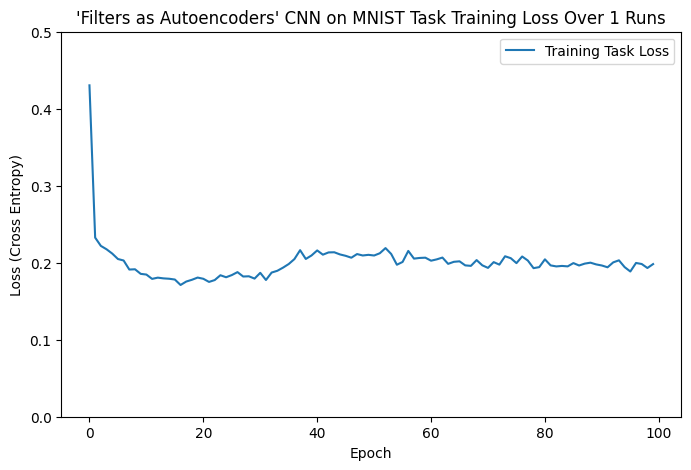

In [9]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Training Task Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 1 Runs")
plt.show()

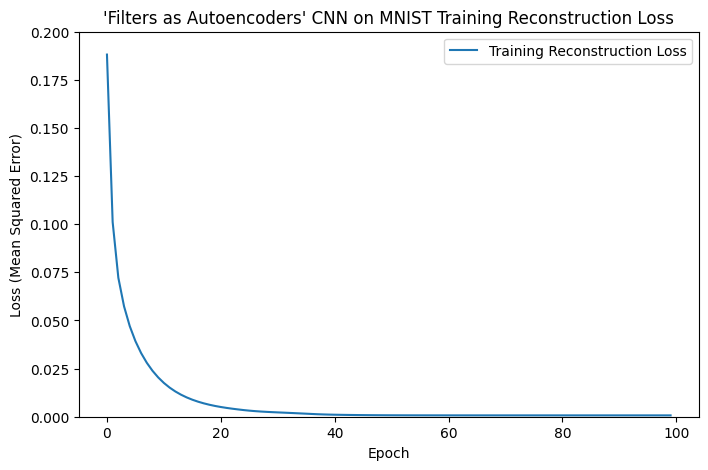

In [10]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

In [11]:
print(feature_history.keys())

dict_keys([0, 1, 15, 30, 45, 60, 75, 90, 99])


In [12]:
print(feature_history[0].keys())

dict_keys(['label', 'prediction', 'logits', 'original', 'maps', 'pooled_maps', 'reconstructions', 'encoder_weights', 'decoder_weights'])


### Interestingly (as the above accuracy would suggest) the model correctly predicts the class up to around epoch 30, from then on classification is incorrect (labelled as a 3 digit)

In [13]:
print(feature_history[0]['prediction'])


5


In [14]:
print(feature_history[0]['logits'])

tensor([[ 0.1439, -0.6203,  0.1138,  0.5925, -0.0924,  1.1017, -0.4686,  0.0043,
         -0.7228,  0.4997]])


In [15]:
print(feature_history[30]['prediction'])


5


In [16]:
print(feature_history[30]['logits'])

tensor([[-23.6441, -27.9971, -19.9624, -13.3270, -31.9686, -13.0887, -39.1502,
         -23.0767, -21.4916, -24.7999]])


In [17]:
print(feature_history[45]['prediction'])

3


In [18]:
print(feature_history[45]['logits'])


tensor([[-32.6846, -39.3413, -25.7583, -18.2240, -40.1288, -18.7418, -44.6389,
         -31.2070, -29.4324, -33.7499]])


# Original

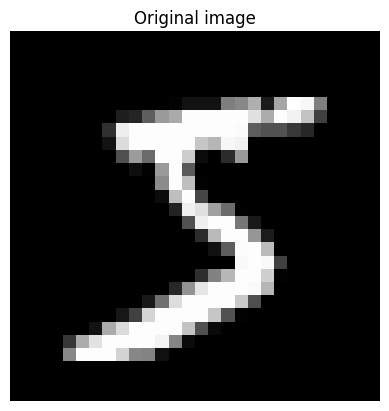

In [19]:
img = feature_history[0]["original"][0,0]

plt.imshow(img, cmap="gray")
plt.title(f"Original image")
plt.axis("off")
plt.show()

# Feature Maps

### First forward pass (no optimisation yet performed)

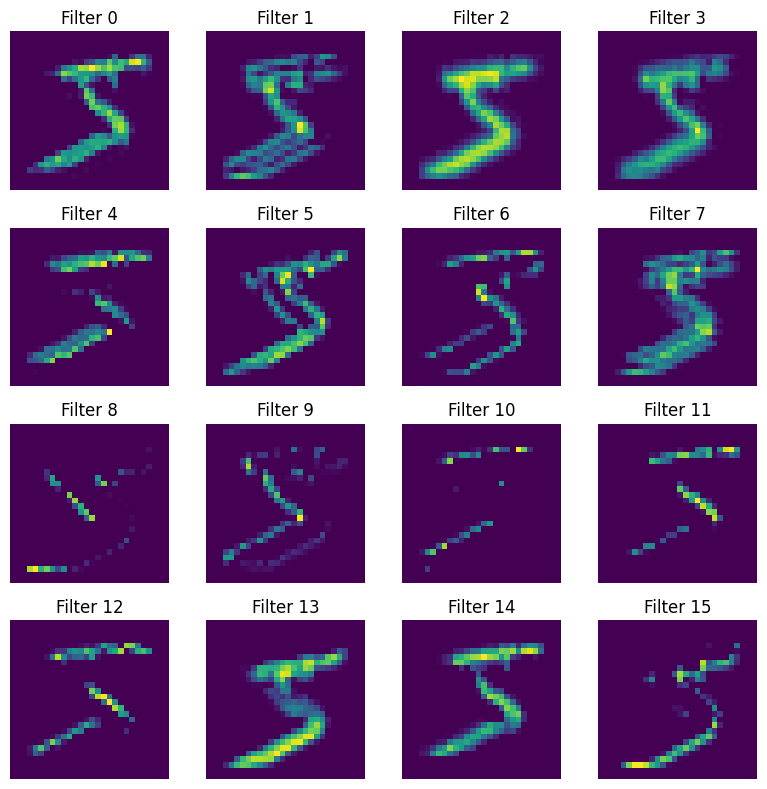

In [20]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[0]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

### Epoch 1 (one optimisation step and subsequent forward activation)

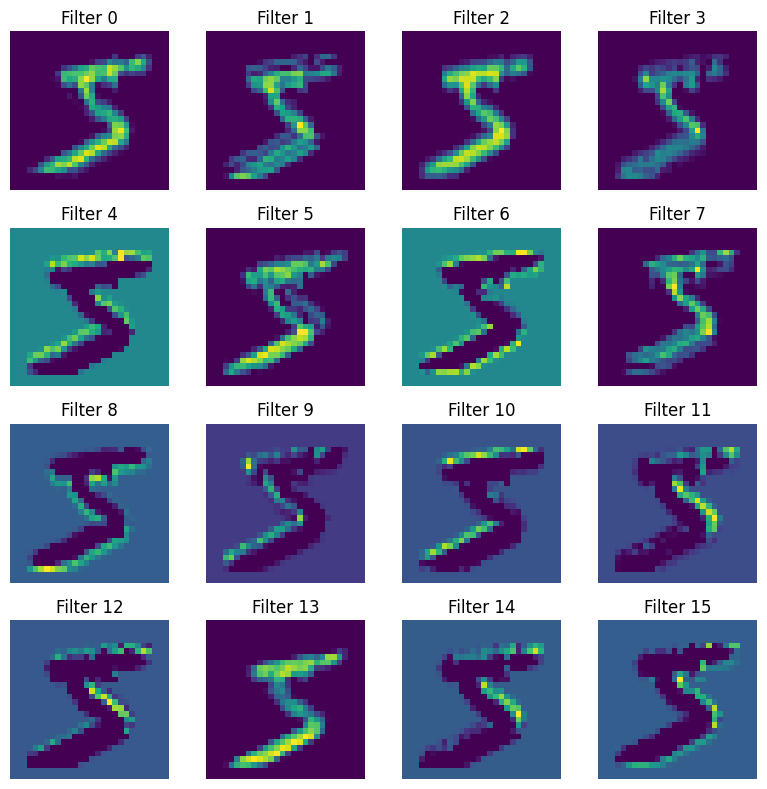

In [21]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[1]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

### Epoch 15

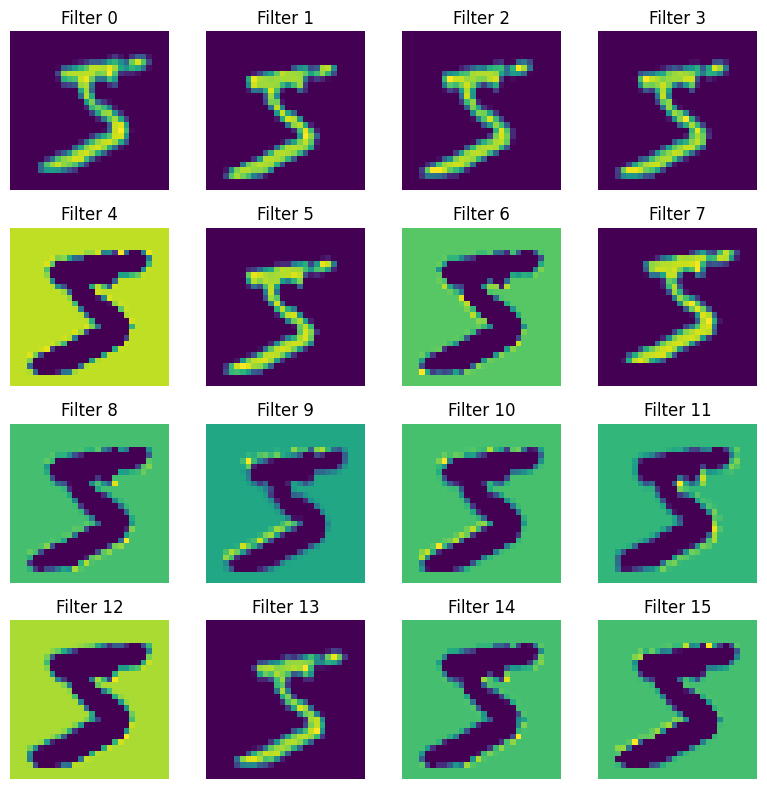

In [22]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[15]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

### Epoch 30

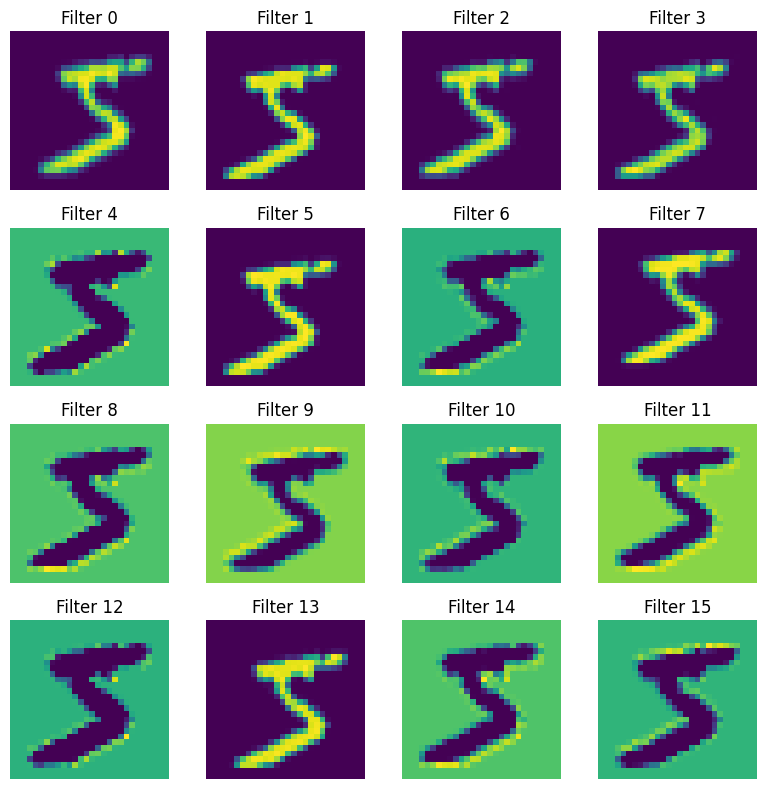

In [23]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[30]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# Epoch 99

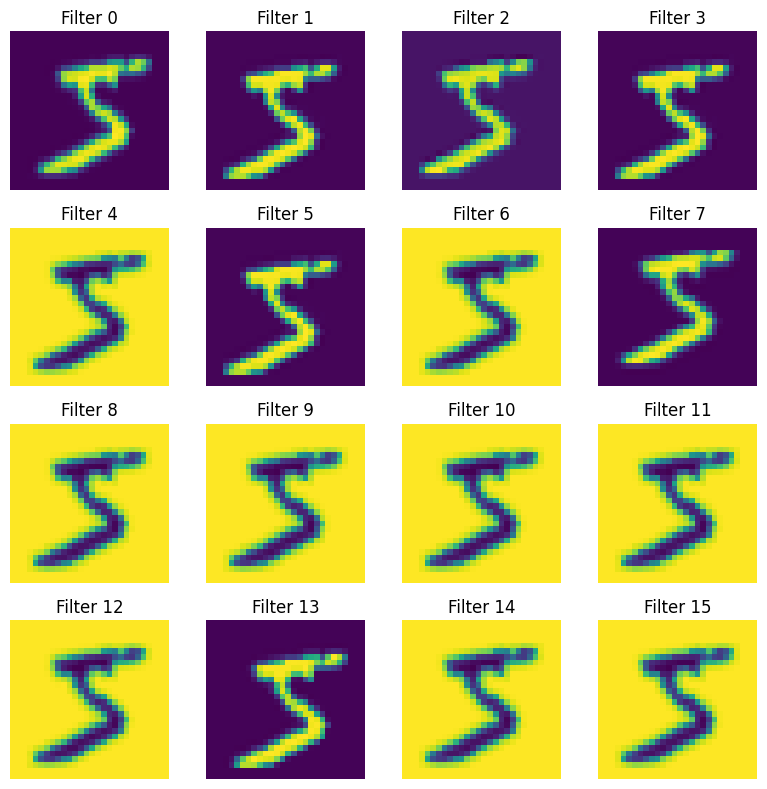

In [24]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[99]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# Evolution of kernel's activations across epochs:

In [26]:
epochs = [0,1,15,30,45,60,75,90,99]

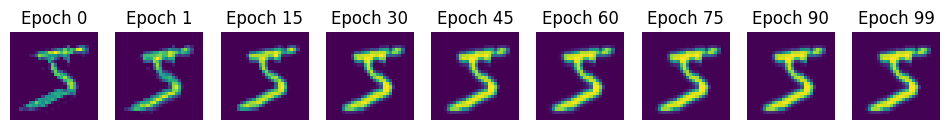

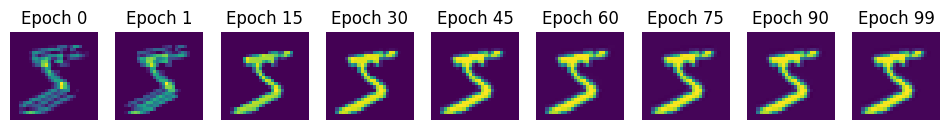

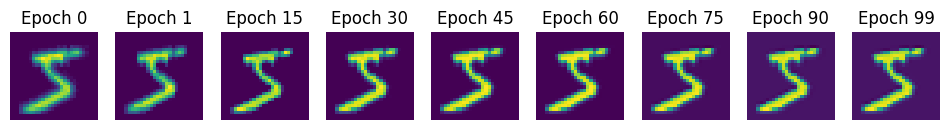

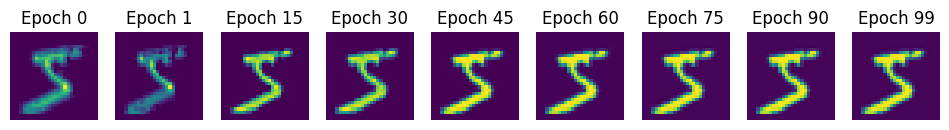

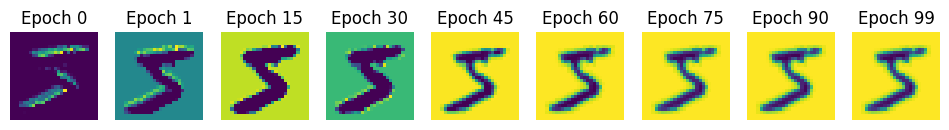

...

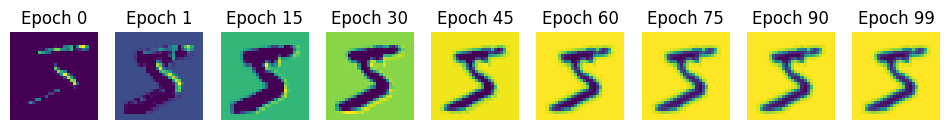

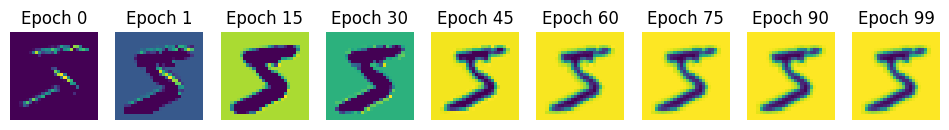

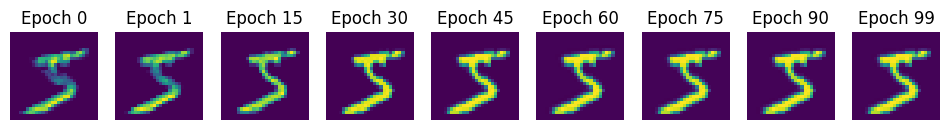

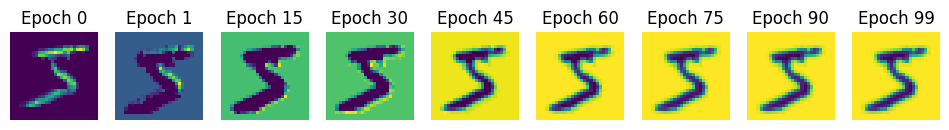

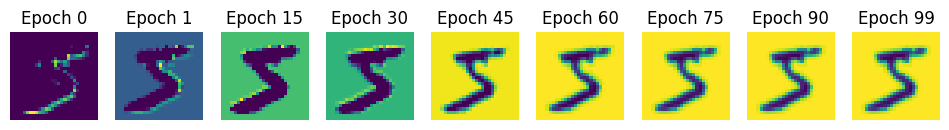

In [27]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        feature_map = feature_history[epoch]["maps"][0,filter_idx]

        ax.imshow(feature_map,cmap="viridis")
  
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

# Pooled features

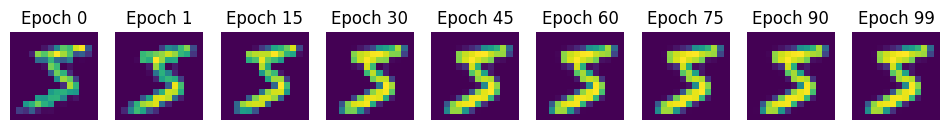

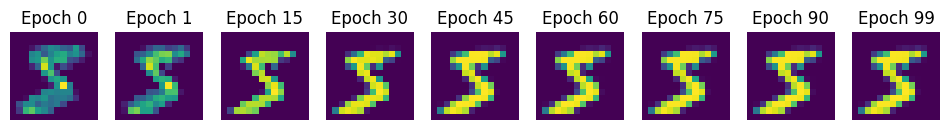

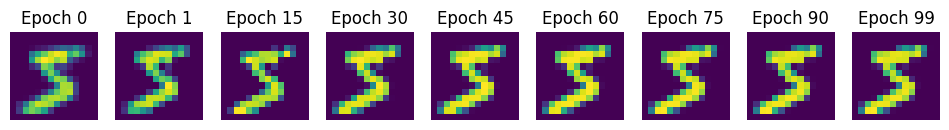

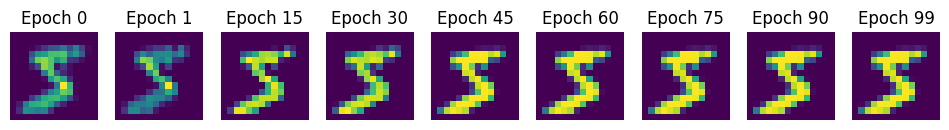

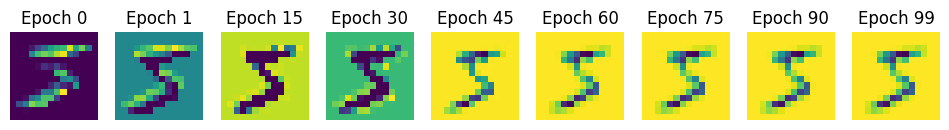

...

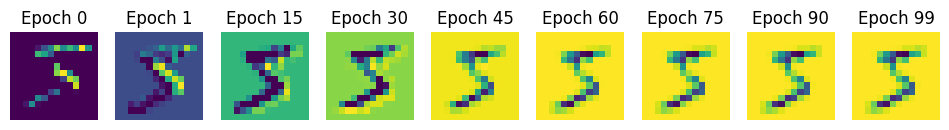

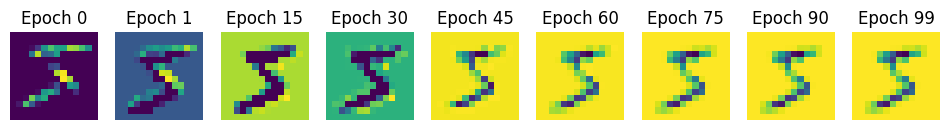

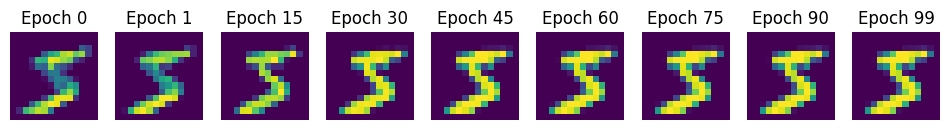

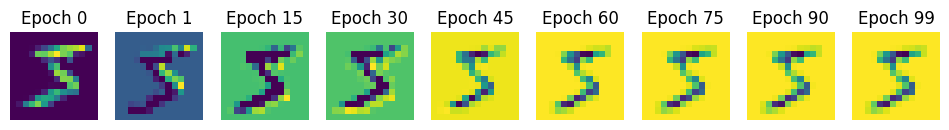

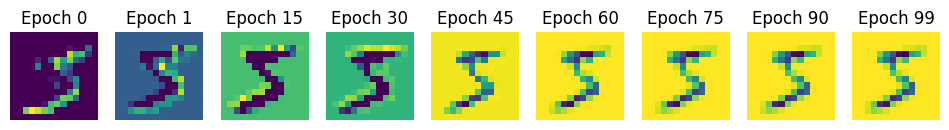

In [28]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        feature_map = feature_history[epoch]["pooled_maps"][0,filter_idx]

        ax.imshow(feature_map,cmap="viridis")
  
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

# Pooled features at epoch 99

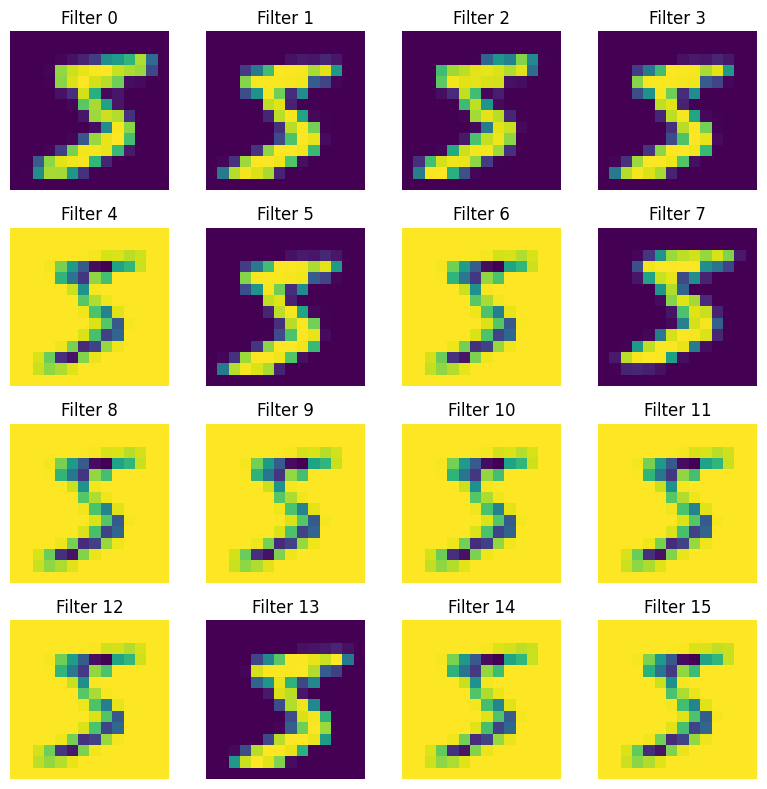

In [31]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[99]["pooled_maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# Measuring kernel activation similarity

In [39]:
feature_history.keys()

dict_keys([0, 1, 15, 30, 45, 60, 75, 90, 99])

## Activation Similarity at 1 epoch

In [54]:
import torch.nn.functional as F 
maps = feature_history[1]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
#(16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].max()

print(mean_similarity)
print(max_similarity)

tensor(0.5838)
tensor(0.9608)


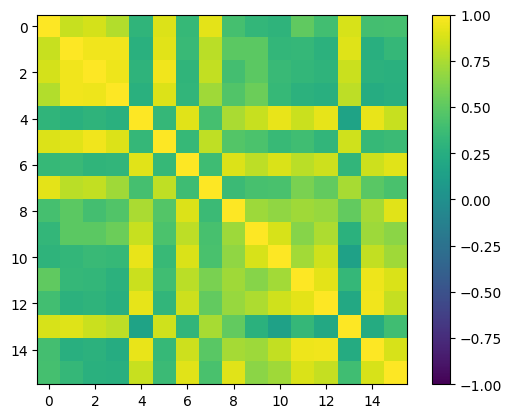

In [55]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

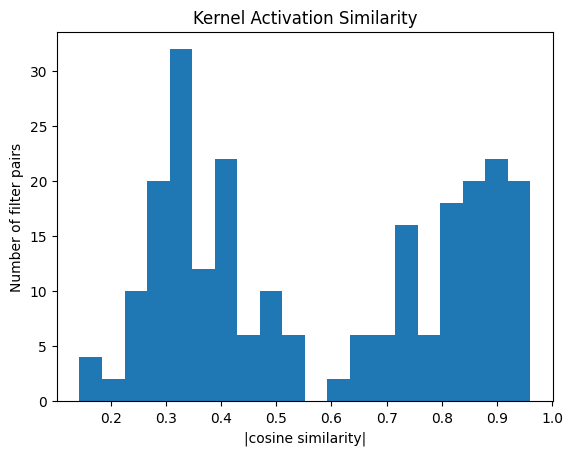

In [41]:
pairwise = similarity_matrix[mask].cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Activation Similarity")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

## 15 Epochs

In [52]:

maps = feature_history[15]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
#(16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].max()

print(mean_similarity)
print(max_similarity)

tensor(0.5189)
tensor(0.9970)


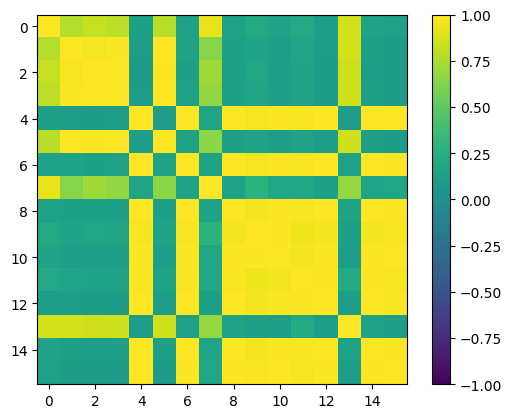

In [53]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

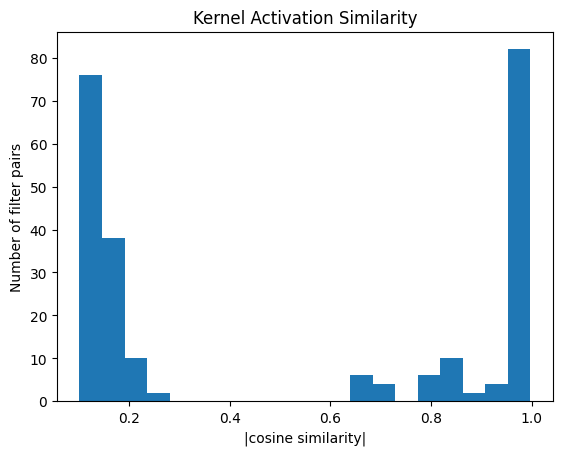

In [38]:
pairwise = similarity_matrix[mask].cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Activation Similarity")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

## 30 Epochs

In [50]:

maps = feature_history[30]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
#(16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].max()

print(mean_similarity)
print(max_similarity)

tensor(0.5709)
tensor(0.9999)


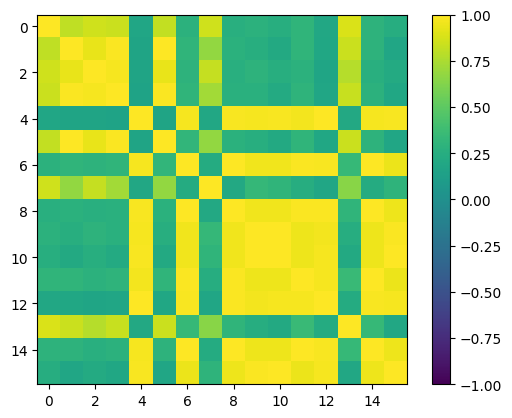

In [51]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

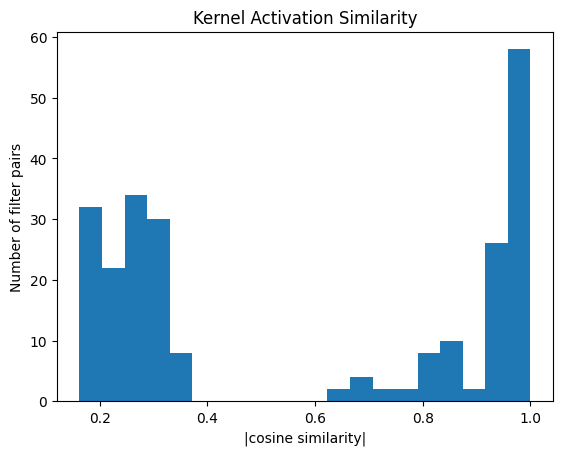

In [36]:
pairwise = similarity_matrix[mask].cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Activation Similarity")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Kernel activation similarity at 99 epochs

In [48]:

maps = feature_history[99]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
#(16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].max()

print(mean_similarity)
print(max_similarity)

tensor(0.7351)
tensor(1.0000)


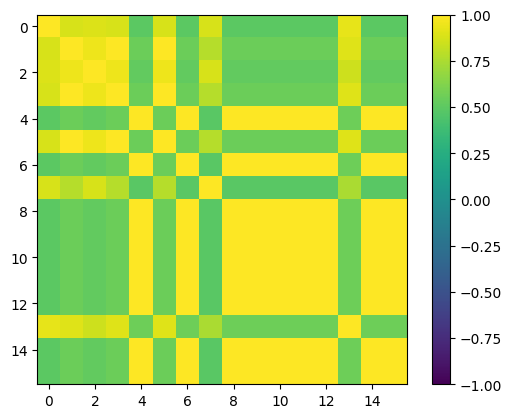

In [49]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

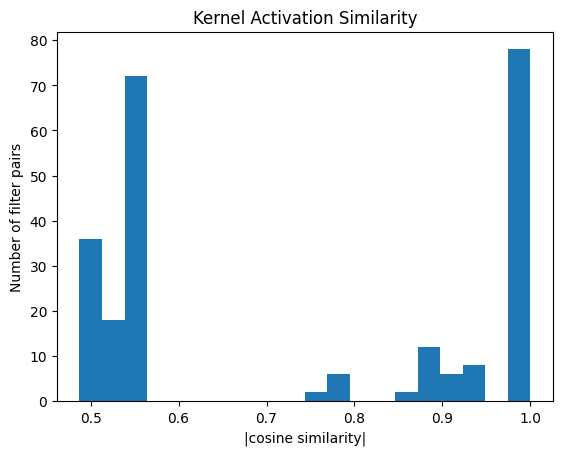

In [34]:
pairwise = similarity_matrix[mask].cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Activation Similarity")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Reconstruction

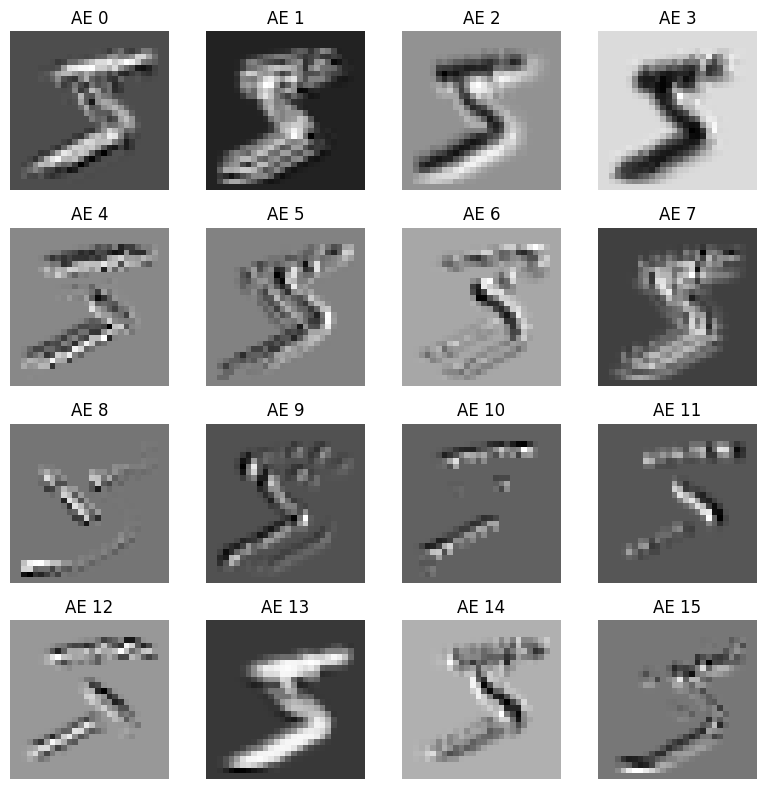

In [68]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

recons = feature_history[0]["reconstructions"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(recons[i], cmap="gray")
    ax.set_title(f"AE {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# Epoch 1

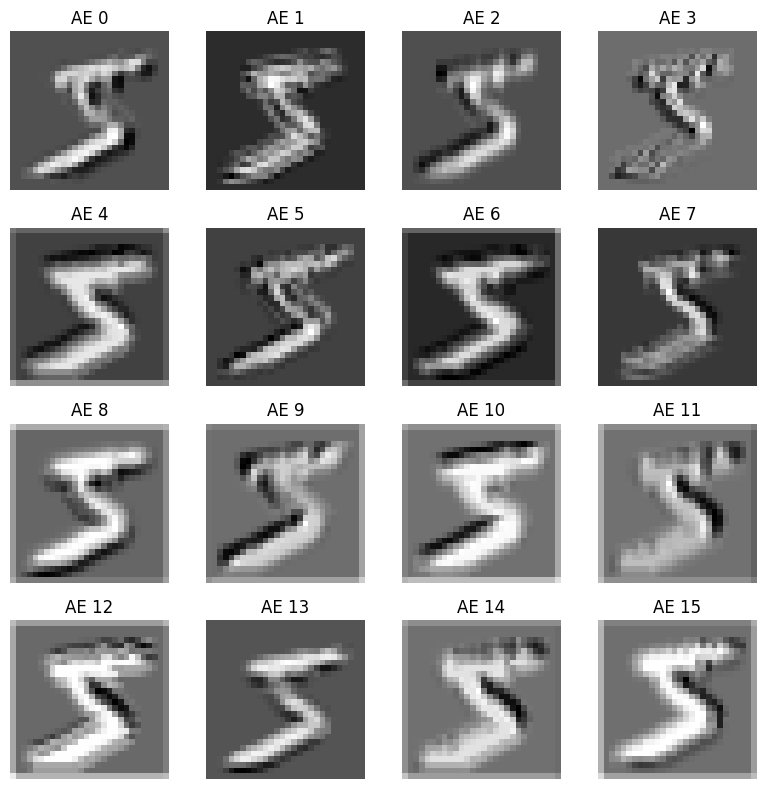

In [69]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

recons = feature_history[1]["reconstructions"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(recons[i], cmap="gray")
    ax.set_title(f"AE {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# Epoch 30

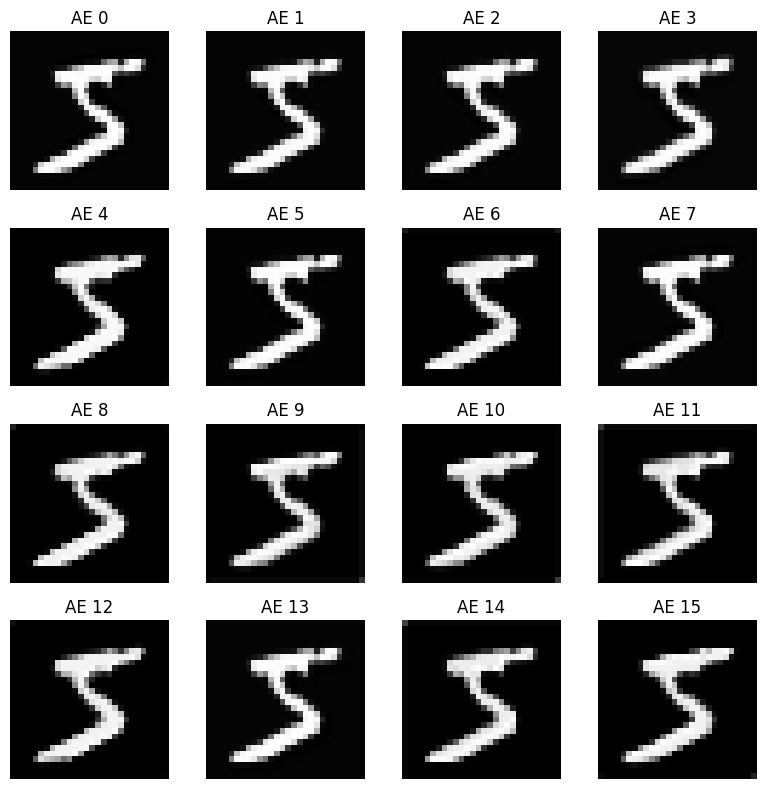

In [39]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

recons = feature_history[30]["reconstructions"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(recons[i], cmap="gray")
    ax.set_title(f"AE {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# Epoch 99

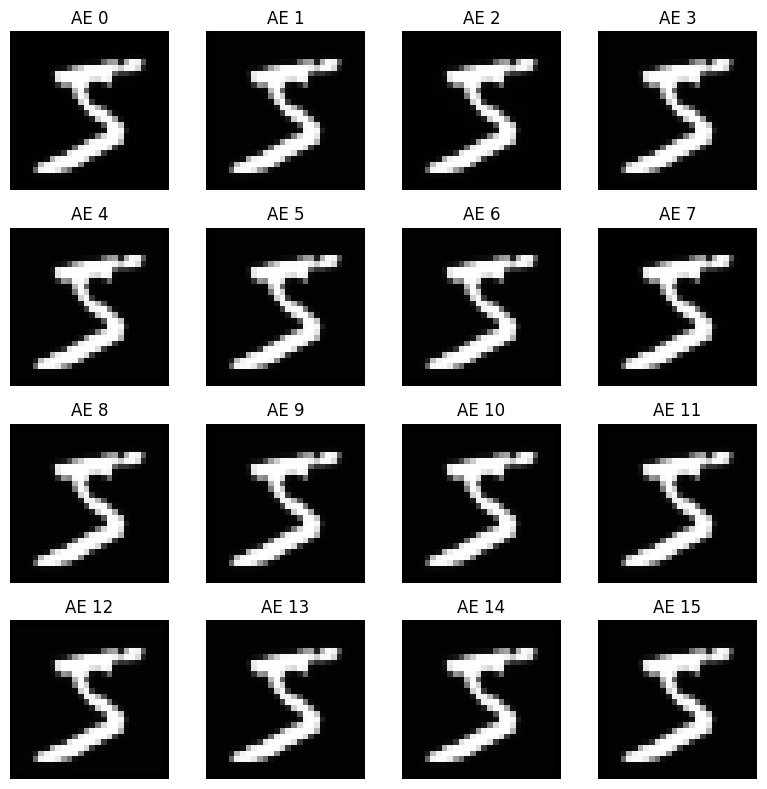

In [ ]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

recons = feature_history[99]["reconstructions"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(recons[i], cmap="gray")
    ax.set_title(f"AE {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# Evolution of reconstructions

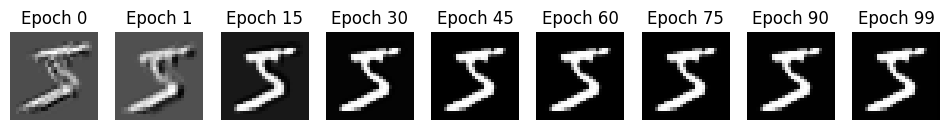

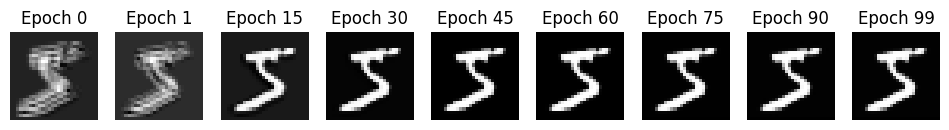

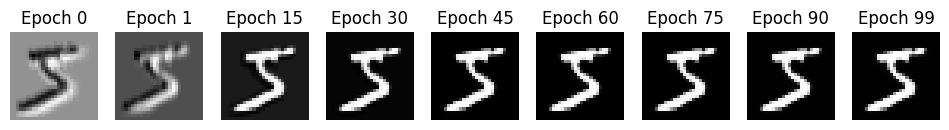

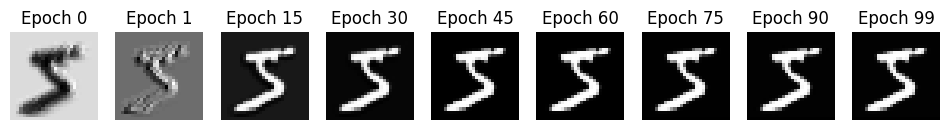

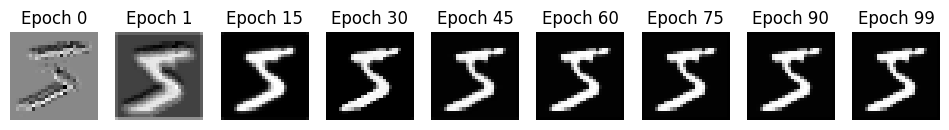

...

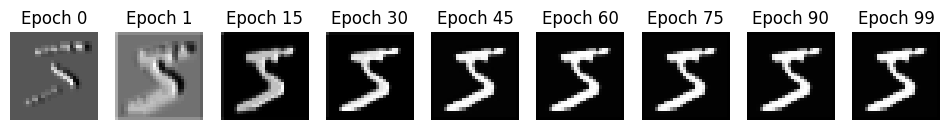

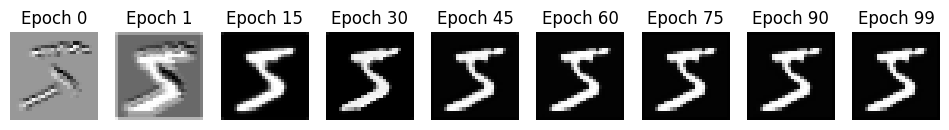

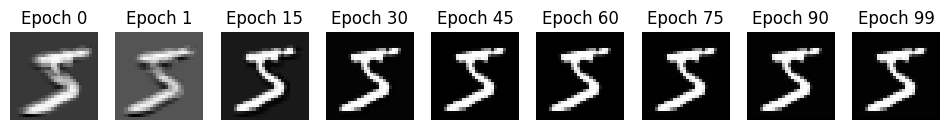

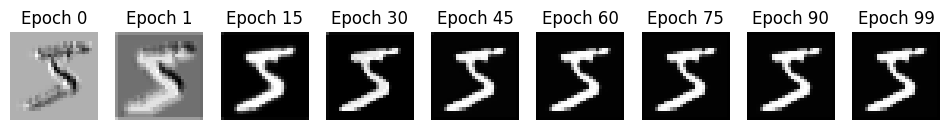

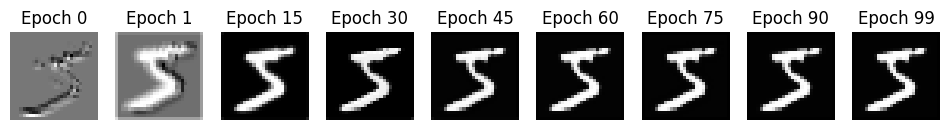

In [42]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        feature_map = feature_history[epoch]["reconstructions"][0,filter_idx]

        ax.imshow(feature_map,cmap="grey")
  
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

# Learned kernels

### Kernels at first forward pass (no optimisation yet performed)

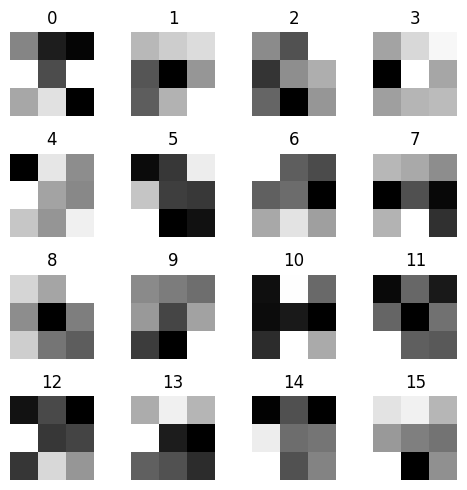

In [71]:
weights = feature_history[0]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Kernels at 1 epoch (one full optimisation loop and the subsequent forward activation):

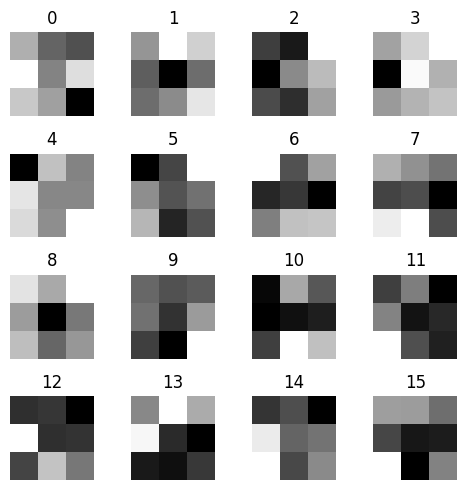

In [72]:
weights = feature_history[1]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Kernels at 15 epochs

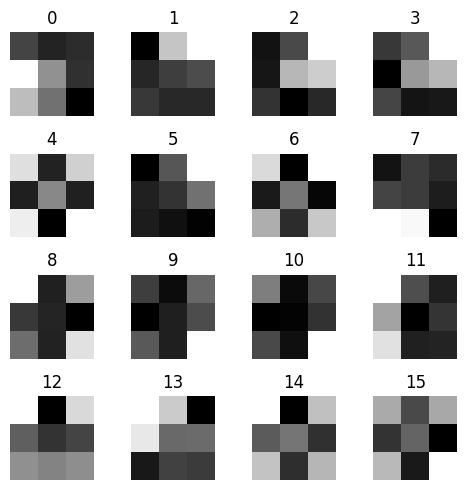

In [73]:
weights = feature_history[15]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Kernels at 30 epochs

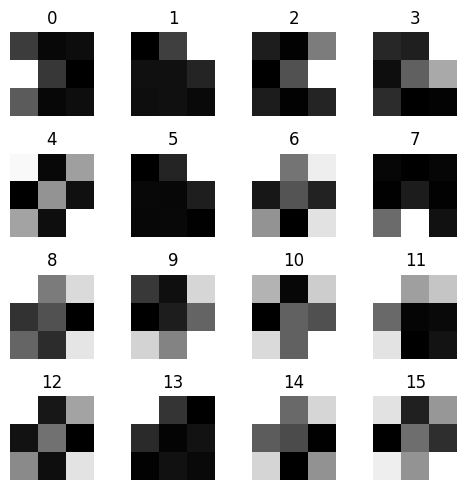

In [74]:
weights = feature_history[30]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

### kernels at epoch 45

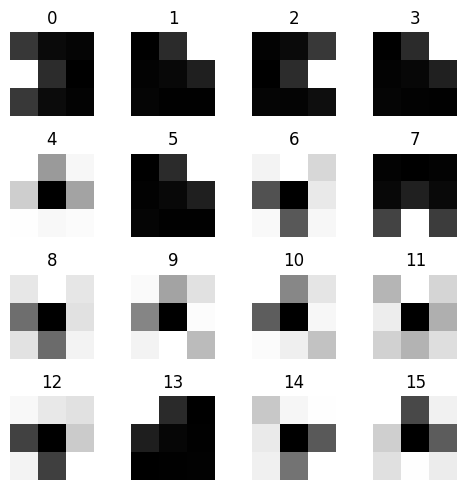

In [75]:
weights = feature_history[45]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

### kernels at epoch 99

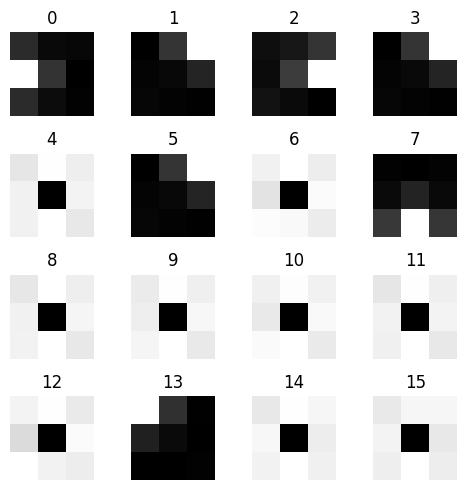

In [77]:
weights = feature_history[99]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

#### it would seem kernels become more and more similar as epochs go on, their peek effectiveness for classification is around epoch 30 where there are no identical kernels (although there are some similar resemblences between kernels), afterwhich at epoch 45 kernels become much more similar with 6 almost identical kernels and more that converge highly similarly. At epoch 100, kernels strongly resemble one another, making their activations redundant and reducing the capacity of the model. Learnt locally, these kernels are optimal for reconstruction, yet no constraint is in place to allow cohesion between the kernels for optimal classification performance.

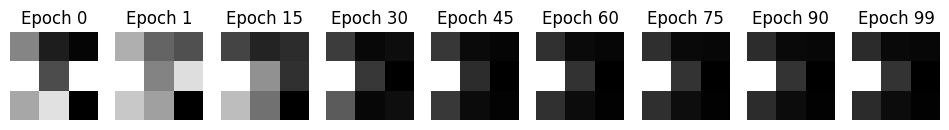

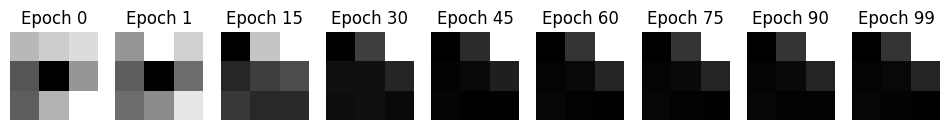

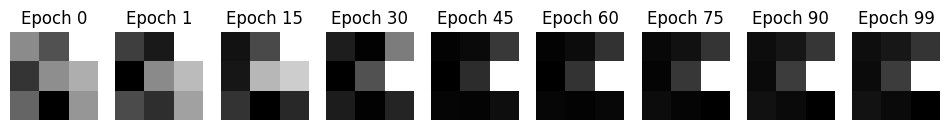

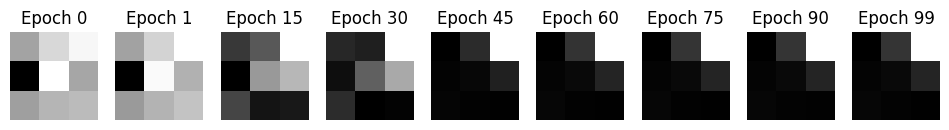

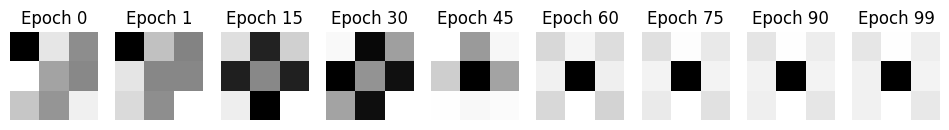

...

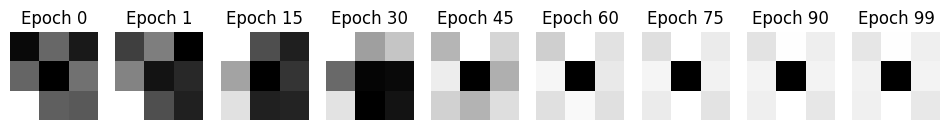

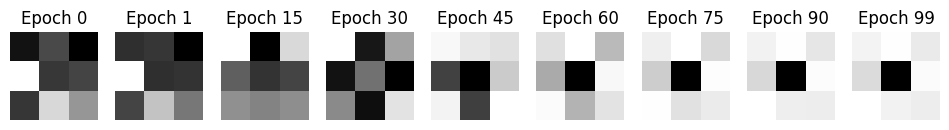

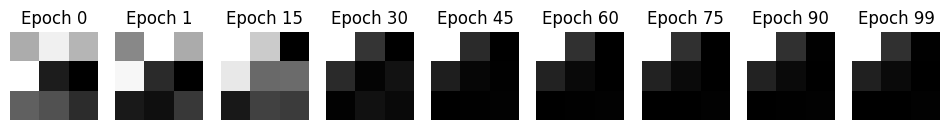

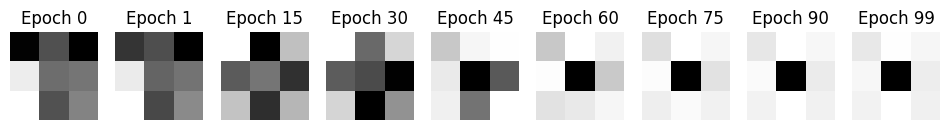

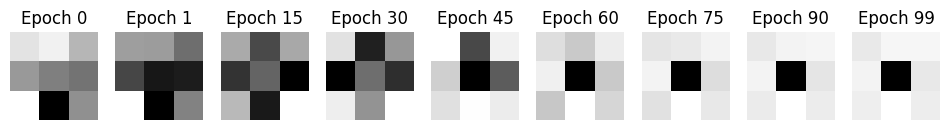

In [78]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        kernel = feature_history[epoch]["encoder_weights"][filter_idx]

        ax.imshow(kernel,cmap="gray")
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

### Also interesting is that some kernels are learnt quicker than others. Also that the standard CNN doesn't adapt kernels noticably past epoch 45, yet the filters as encoders model continues to update kernels noticably in some cases throughout the 100 epochs.

In [45]:
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")

the mean filter cosine similarity from Gram matrix: 0.2361065298318863
the max filter similarity: 1.0000001192092896


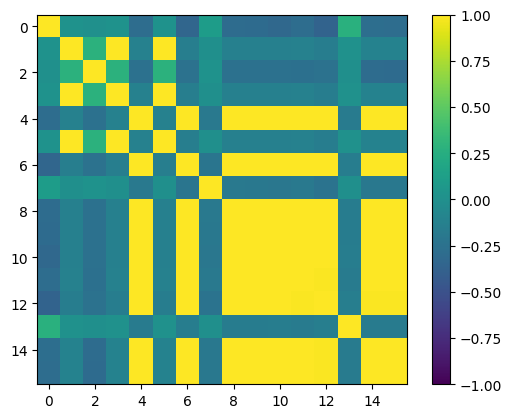

In [46]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

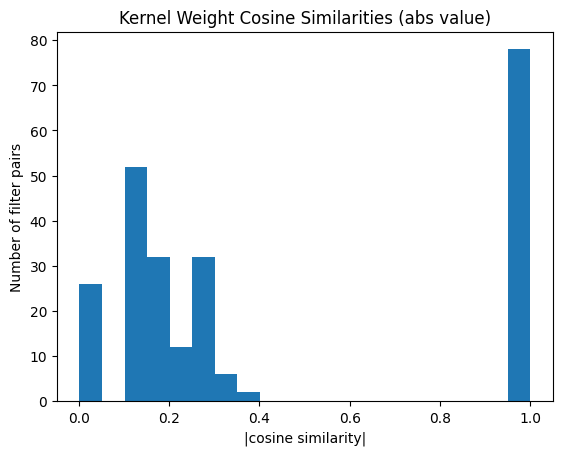

In [47]:
pairwise = similarity_matrix[mask].abs().detach().cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Weight Cosine Similarities (abs value)")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Training to 30 epochs to measure weight similairty before kernels converge any further

In [65]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_show_features(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=30,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/30], Encoder Training Loss: 0.1881
Epoch [1/30], Task Training Loss: 0.4304, Accuracy: 88.63%
Epoch [2/30], Encoder Training Loss: 0.1011
Epoch [2/30], Task Training Loss: 0.2326, Accuracy: 93.28%
Epoch [3/30], Encoder Training Loss: 0.0722
Epoch [3/30], Task Training Loss: 0.2219, Accuracy: 93.48%
Epoch [4/30], Encoder Training Loss: 0.0574
Epoch [4/30], Task Training Loss: 0.2175, Accuracy: 93.66%
Epoch [5/30], Encoder Training Loss: 0.0471
Epoch [5/30], Task Training Loss: 0.2119, Accuracy: 93.74%
Epoch [6/30], Encoder Training Loss: 0.0393
Epoch [6/30], Task Training Loss: 0.2048, Accuracy: 94.04%
Epoch [7/30], Encoder Training Loss: 0.0331
Epoch [7/30], Task Training Loss: 0.2029, Accuracy: 94.09%
Epoch [8/30], Encoder Training Loss: 0.0280
Epoch [8/30], Task Training Loss: 0.1911, Accuracy: 94.48%
Epoch [9/30], Encoder Training Loss: 0.0239
Epoch [9/30], Task Training Loss: 0.1915, Accuracy: 94.31%
Epoch [10/30], Encoder Training Loss: 0.0204

In [66]:
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")

the mean filter cosine similarity from Gram matrix: 0.17026783525943756
the max filter similarity: 0.9960001111030579


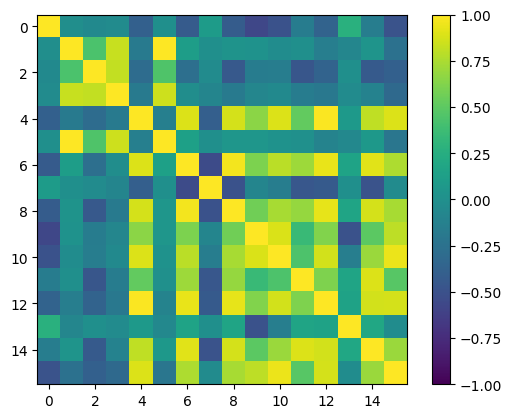

In [67]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

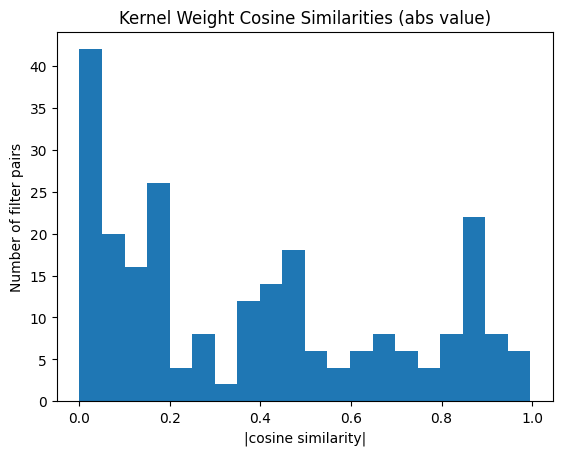

In [68]:
pairwise = similarity_matrix[mask].abs().detach().cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Weight Cosine Similarities (abs value)")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Training to 45 epochs to show how as kernels converge to their optima, similarity and dissimilarity increases sharply (which is the cause of the plateauing classifier)

In [69]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_show_features(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=45,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/45], Encoder Training Loss: 0.1881
Epoch [1/45], Task Training Loss: 0.4304, Accuracy: 88.63%
Epoch [2/45], Encoder Training Loss: 0.1011
Epoch [2/45], Task Training Loss: 0.2326, Accuracy: 93.28%
Epoch [3/45], Encoder Training Loss: 0.0722
Epoch [3/45], Task Training Loss: 0.2219, Accuracy: 93.48%
Epoch [4/45], Encoder Training Loss: 0.0574
Epoch [4/45], Task Training Loss: 0.2175, Accuracy: 93.66%
Epoch [5/45], Encoder Training Loss: 0.0471
Epoch [5/45], Task Training Loss: 0.2119, Accuracy: 93.74%
Epoch [6/45], Encoder Training Loss: 0.0393
Epoch [6/45], Task Training Loss: 0.2048, Accuracy: 94.04%
Epoch [7/45], Encoder Training Loss: 0.0331
Epoch [7/45], Task Training Loss: 0.2029, Accuracy: 94.09%
Epoch [8/45], Encoder Training Loss: 0.0280
Epoch [8/45], Task Training Loss: 0.1911, Accuracy: 94.48%
Epoch [9/45], Encoder Training Loss: 0.0239
Epoch [9/45], Task Training Loss: 0.1915, Accuracy: 94.31%
Epoch [10/45], Encoder Training Loss: 0.0204

In [70]:
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")

the mean filter cosine similarity from Gram matrix: 0.1711025834083557
the max filter similarity: 0.9999988675117493


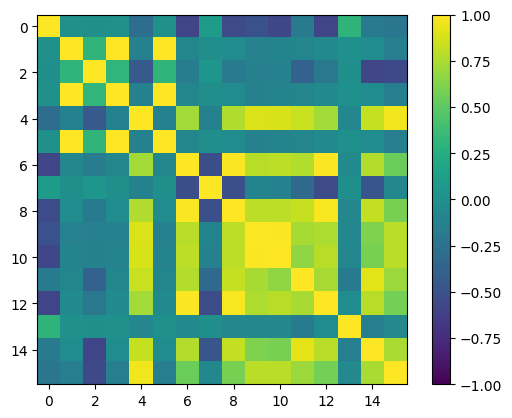

In [71]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

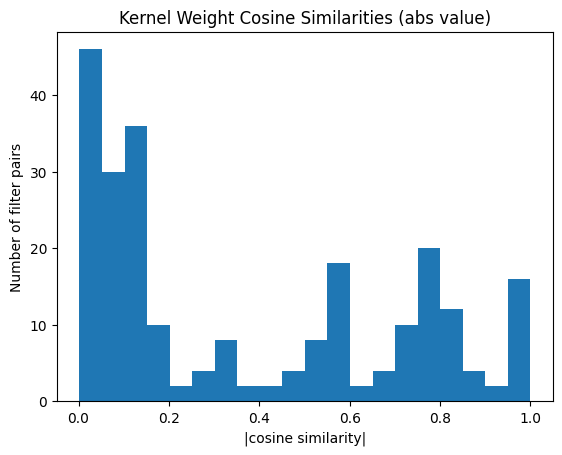

In [72]:
pairwise = similarity_matrix[mask].abs().detach().cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Weight Cosine Similarities (abs value)")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# More Attempts to remedy the redundancy of kernels

## Minimising the cosine similarity between kernels... (each encoder kernel has added to its reconstruction loss a fraction of its cosine similarity to all other kernels (bar itself)) 

In [8]:
#total autoencoder loss term
all_encoder_histories = []

#multi-objective terms from the above loss term
all_recon_histories = []
all_sim_histories = []

#classification
all_task_histories = []
all_accuracy_histories=[]
#runtime stats
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_diverse_filters_show_features_localised(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        lambda_cosine=0.2,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_recon_histories.append(training_history["recon_train_loss"])
    all_sim_histories.append(training_history["sim_train_loss"])


    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
   
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.3921
Epoch [1/100], Average reconstruction Loss: 0.1940
Epoch [1/100], Average similarity: 0.1981
Epoch [1/100], Task Training Loss: 0.4260, Accuracy: 88.50%
Epoch [2/100], Encoder Training Loss: 0.2713
Epoch [2/100], Average reconstruction Loss: 0.1129
Epoch [2/100], Average similarity: 0.1583
Epoch [2/100], Task Training Loss: 0.2127, Accuracy: 93.99%
Epoch [3/100], Encoder Training Loss: 0.2387
Epoch [3/100], Average reconstruction Loss: 0.0819
Epoch [3/100], Average similarity: 0.1568
Epoch [3/100], Task Training Loss: 0.1781, Accuracy: 94.90%
Epoch [4/100], Encoder Training Loss: 0.2219
Epoch [4/100], Average reconstruction Loss: 0.0656
Epoch [4/100], Average similarity: 0.1563
Epoch [4/100], Task Training Loss: 0.1611, Accuracy: 95.55%
Epoch [5/100], Encoder Training Loss: 0.2101
Epoch [5/100], Average reconstruction Loss: 0.0540
Epoch [5/100], Average similarity: 0.1561
Epoch [5/100], Task Training Loss: 0.1487

In [22]:
# encoder loss
encoder_loss = np.array(all_encoder_histories[0])

#reconstruction loss (isolated from the encoder loss term)
recon_loss =np.array(all_recon_histories[0])

#cosine similarity (isolated from the encoder loss term)
sim_loss =np.array(all_sim_histories[0])

# task loss
task_loss = np.array(all_task_histories[0])

# accuracy
accuracy= np.array(all_accuracy_histories[0])

#peak memory
relevant_peak_mems = np.array(peak_memory[0]) 
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[0:])

In [15]:
feature_history.keys()

dict_keys([0, 1, 15, 30, 45, 60, 75, 90, 99])

In [ ]:
epochs = np.arange(1, len(task_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_loss": task_loss,
    "accuracy": accuracy,

    "encoder_loss": encoder_loss,
    "recon_loss": recon_loss,
    "sim_loss": sim_loss,

})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_similarity_pen_results.csv",
    index=False,
)

In [ ]:
#save the features history 
features_df= pd.DataFrame(feature_history)

features_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_similarity_pen_features.csv",
    index=False,
)


# Loss and Accuracy

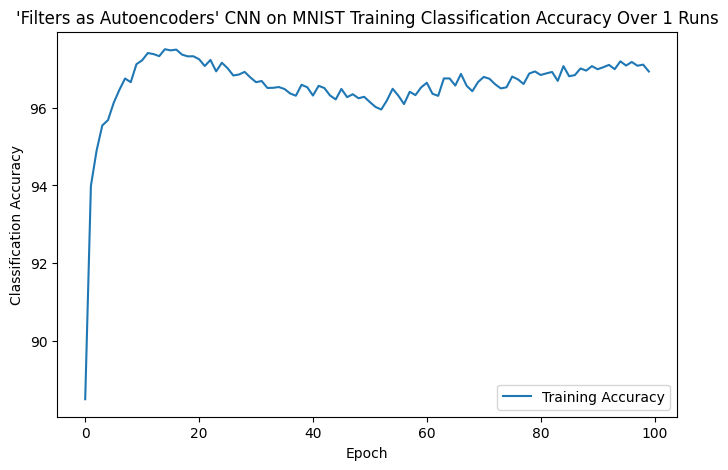

In [27]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

### The peak accuracy is higher than the initial model, but the approach is too niave to provide the optimal balance of similarity between filters to allow for highly meaningful features for classification. Furthermore, the reconstruction term still dominates, and filters converge to their set of optima (small set of optimal filters causes redundancy and the divergence in classification performance) .

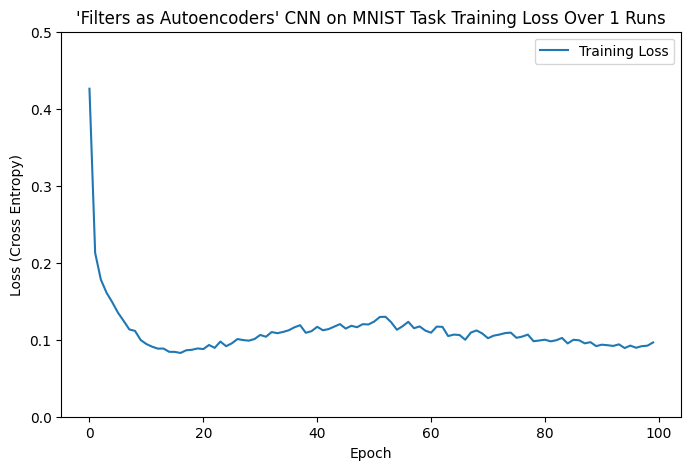

In [31]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 1 Runs")
plt.show()

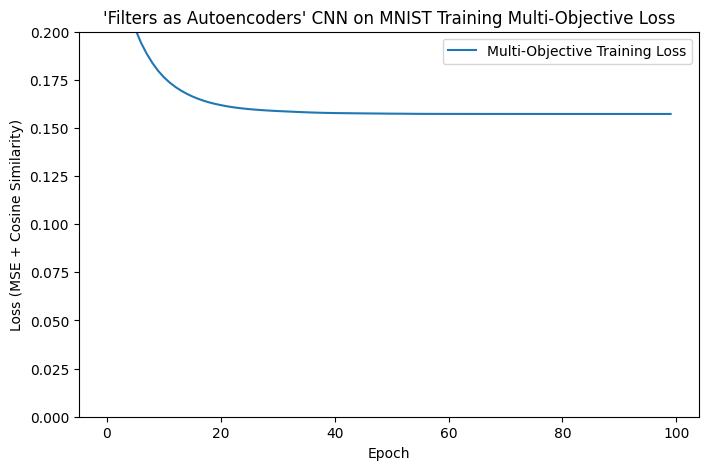

In [36]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Multi-Objective Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (MSE + Cosine Similarity)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Multi-Objective Loss")
plt.show()

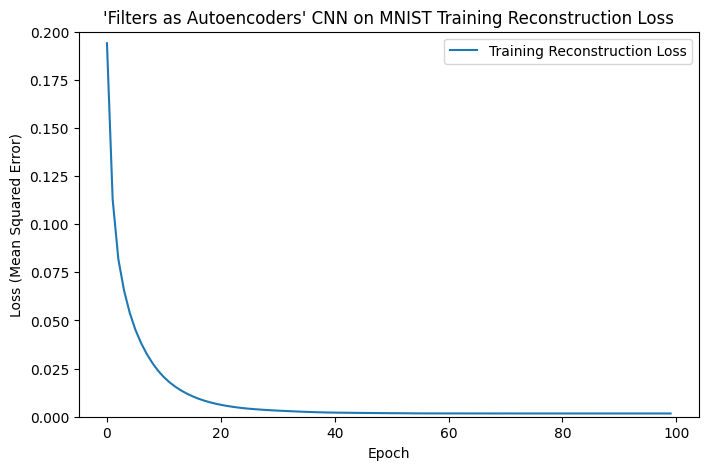

In [37]:
epochs = np.arange(len(training_history["recon_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["recon_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

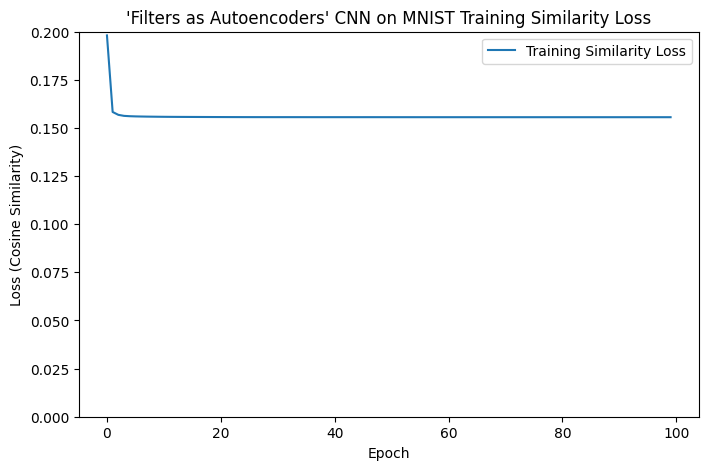

In [39]:
epochs = np.arange(len(training_history["sim_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["sim_train_loss"],label="Training Similarity Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cosine Similarity)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Similarity Loss")
plt.show()

# Inspecting filers learned

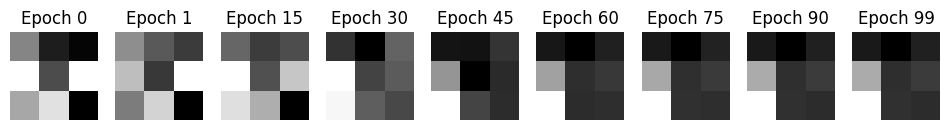

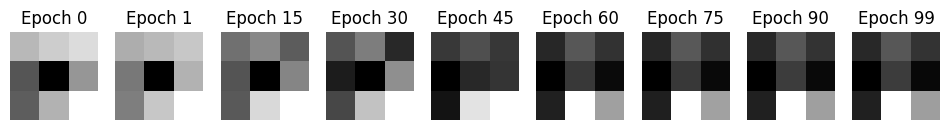

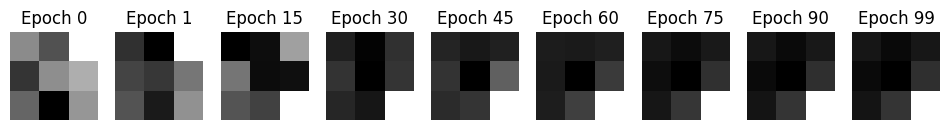

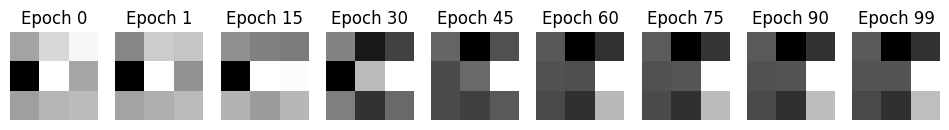

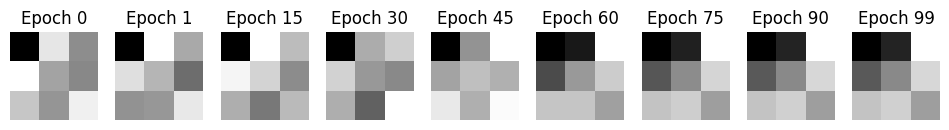

...

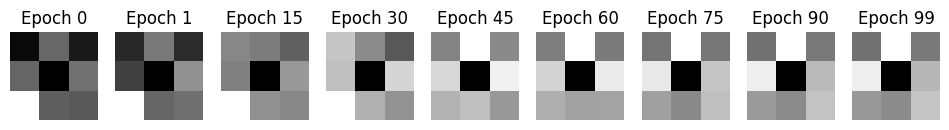

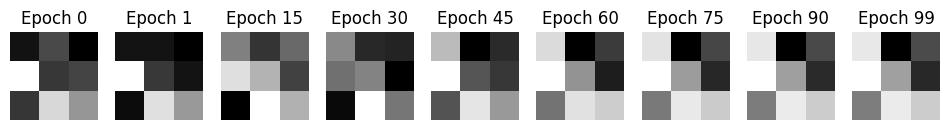

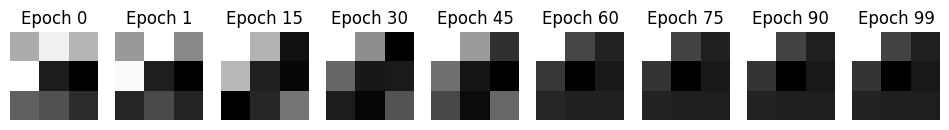

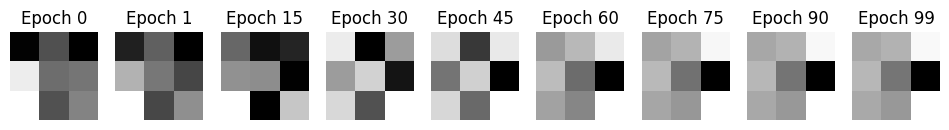

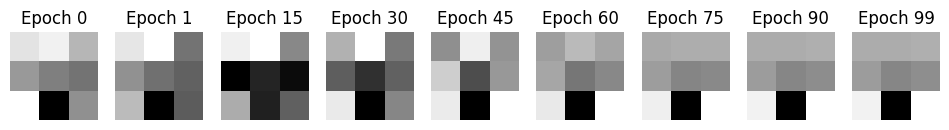

In [42]:
epochs = [0,1,15,30,45,60,75,90,99]
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        kernel = feature_history[epoch]["encoder_weights"][filter_idx]

        ax.imshow(kernel,cmap="gray")
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

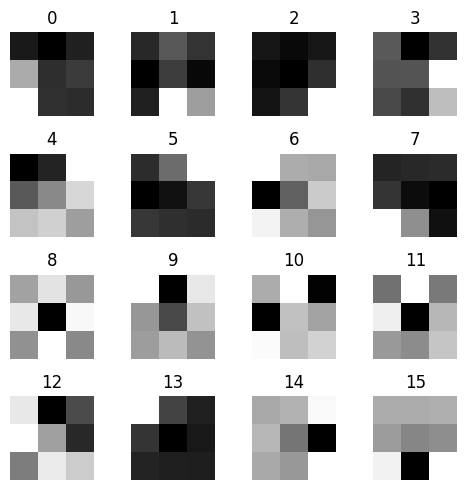

In [43]:
weights = feature_history[99]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Noticably kernels are more dissimilar than previously seen in the initial model, however some redundancy is still observable (filters 14 and 15 in particular)

# Quantifying the similarity observed in the above

In [17]:
import torch.nn.functional as F 

In [55]:
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")

the mean filter cosine similarity from Gram matrix: 0.033833034336566925
the max filter similarity: 0.7810367345809937


# Evolution of feature maps across epochs: 
### Notiably features are more dissimilar than those learned in the initial model

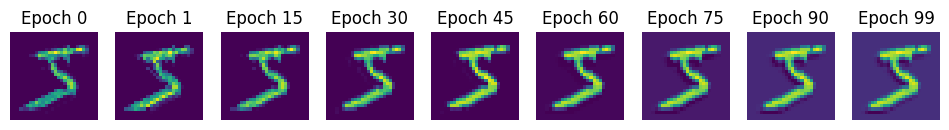

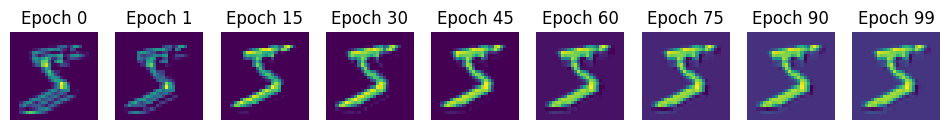

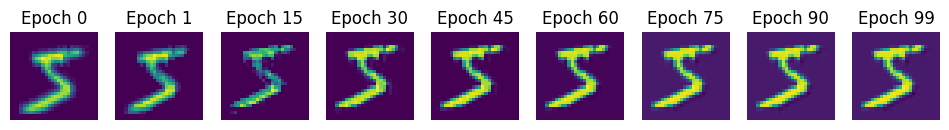

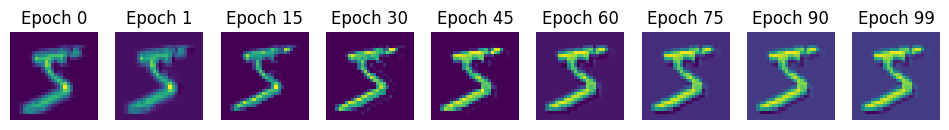

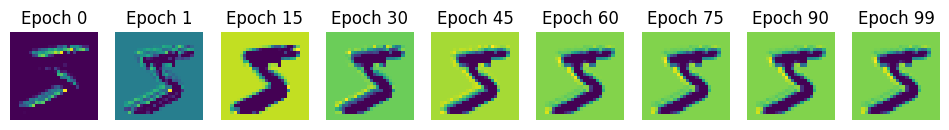

...

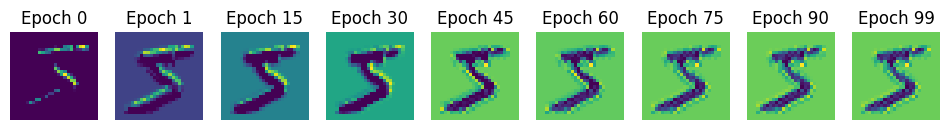

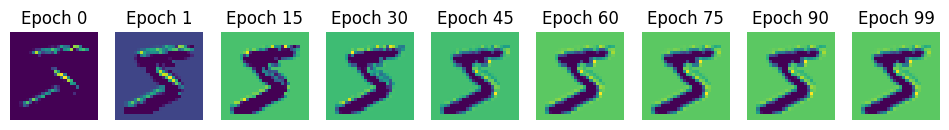

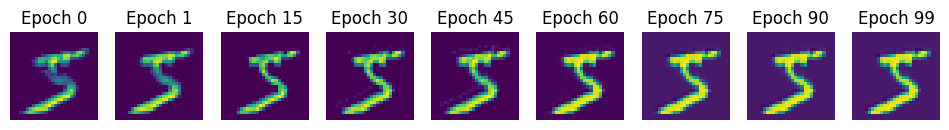

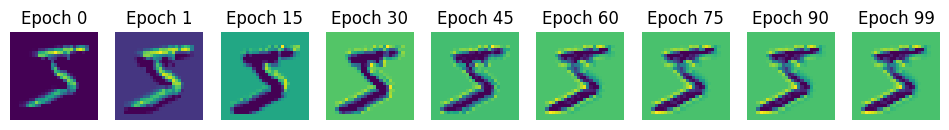

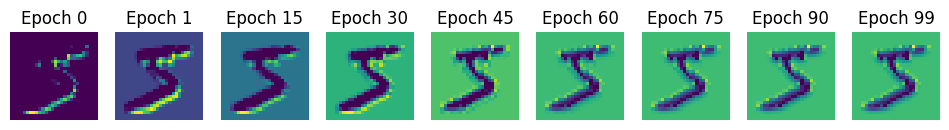

In [56]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        feature_map = feature_history[epoch]["maps"][0,filter_idx]

        ax.imshow(feature_map,cmap="viridis")
  
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

# Stronger lambda for cosine similarity penalty

In [57]:
#total autoencoder loss term
all_encoder_histories = []

#multi-objective terms from the above loss term
all_recon_histories = []
all_sim_histories = []

#classification
all_task_histories = []
all_accuracy_histories=[]
#runtime stats
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_diverse_filters_show_features_localised(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        lambda_cosine=0.5,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_recon_histories.append(training_history["recon_train_loss"])
    all_sim_histories.append(training_history["sim_train_loss"])


    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
   
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.6886
Epoch [1/100], Average reconstruction Loss: 0.1946
Epoch [1/100], Average similarity: 0.4939
Epoch [1/100], Task Training Loss: 0.4253, Accuracy: 88.50%
Epoch [2/100], Encoder Training Loss: 0.5097
Epoch [2/100], Average reconstruction Loss: 0.1168
Epoch [2/100], Average similarity: 0.3929
Epoch [2/100], Task Training Loss: 0.2103, Accuracy: 94.05%
Epoch [3/100], Encoder Training Loss: 0.4771
Epoch [3/100], Average reconstruction Loss: 0.0871
Epoch [3/100], Average similarity: 0.3900
Epoch [3/100], Task Training Loss: 0.1751, Accuracy: 95.03%
Epoch [4/100], Encoder Training Loss: 0.4589
Epoch [4/100], Average reconstruction Loss: 0.0693
Epoch [4/100], Average similarity: 0.3895
Epoch [4/100], Task Training Loss: 0.1597, Accuracy: 95.58%
Epoch [5/100], Encoder Training Loss: 0.4459
Epoch [5/100], Average reconstruction Loss: 0.0566
Epoch [5/100], Average similarity: 0.3892
Epoch [5/100], Task Training Loss: 0.1492

In [58]:
# encoder loss
encoder_loss = np.array(all_encoder_histories[0])

#reconstruction loss (isolated from the encoder loss term)
recon_loss =np.array(all_recon_histories[0])

#cosine similarity (isolated from the encoder loss term)
sim_loss =np.array(all_sim_histories[0])

# task loss
task_loss = np.array(all_task_histories[0])

# accuracy
accuracy= np.array(all_accuracy_histories[0])

#peak memory
relevant_peak_mems = np.array(peak_memory[0]) 
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[0:])

In [59]:
epochs = np.arange(1, len(task_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_loss": task_loss,
    "accuracy": accuracy,

    "encoder_loss": encoder_loss,
    "recon_loss": recon_loss,
    "sim_loss": sim_loss,

})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_similarity_pen_lam=0.5_results.csv",
    index=False,
)

In [60]:
#save the features history 
features_df= pd.DataFrame(feature_history)

features_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_similarity_pen_lam=0.5_features.csv",
    index=False,
)

# Loss and Accuracy

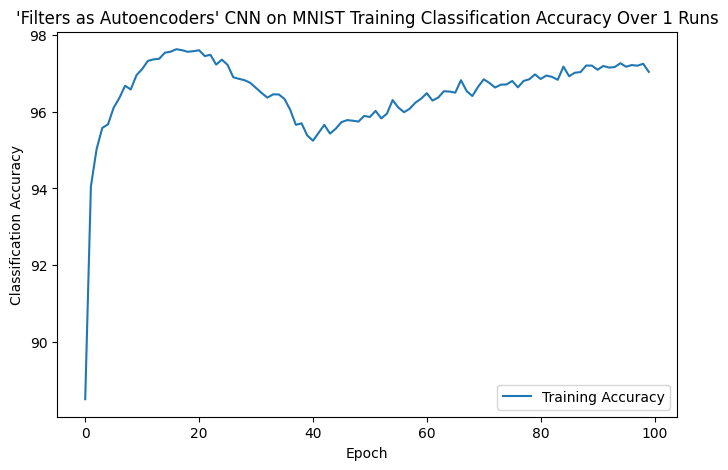

In [61]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

### Accuracy has a higher peak, but again for the same reaons mentioned previously, the model falls to divergence as kernels converge on more similar weight values as reconstruction dominates.

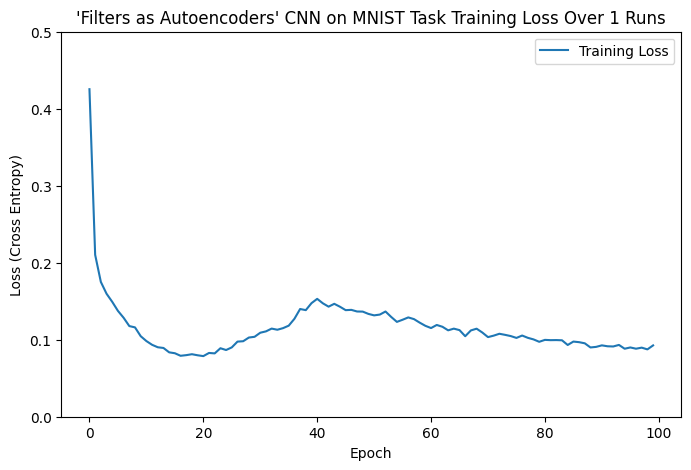

In [62]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 1 Runs")
plt.show()

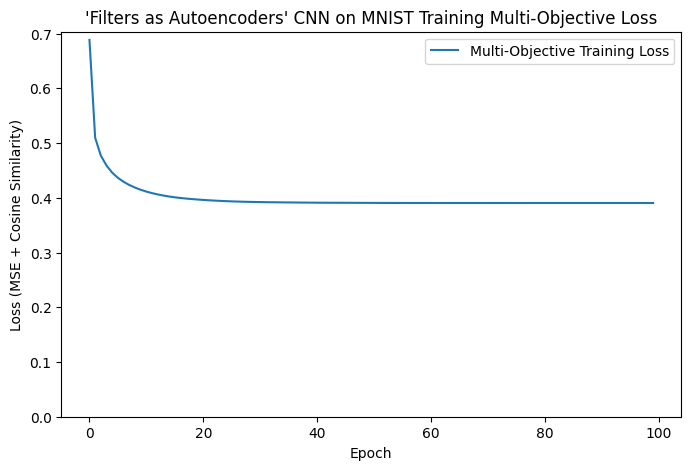

In [64]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Multi-Objective Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (MSE + Cosine Similarity)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Multi-Objective Loss")
plt.show()

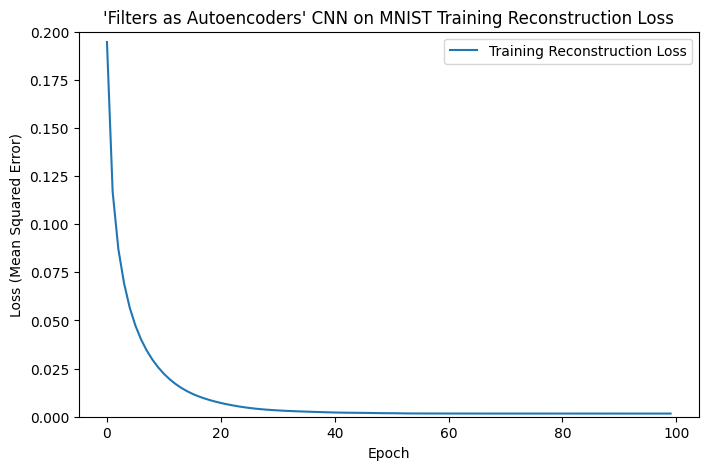

In [65]:
epochs = np.arange(len(training_history["recon_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["recon_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

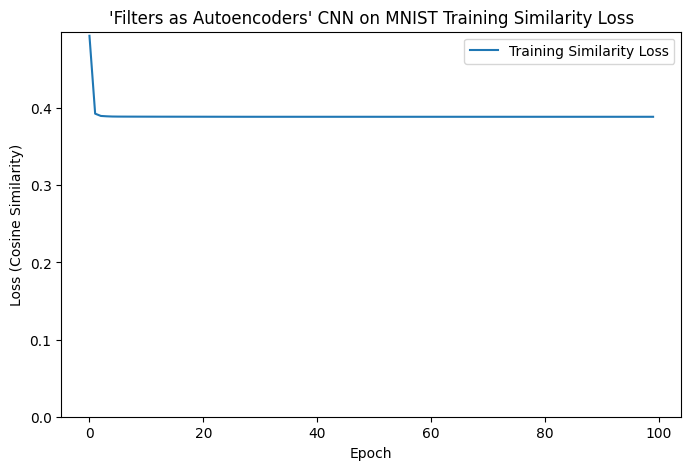

In [67]:
epochs = np.arange(len(training_history["sim_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["sim_train_loss"],label="Training Similarity Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cosine Similarity)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Similarity Loss")
plt.show()

In [68]:
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")

the mean filter cosine similarity from Gram matrix: 0.044373754411935806
the max filter similarity: 0.7734882235527039


# Minimising Cosine Similarity of Pooled Activations
### The below follows the same procedure as the minimisation of the encoder kernel weights, only the focus is on the pooled activations of the encoder kernels... again it fails due to the niave approach, since a delicate balance is needed between kernel activation similarity for optimal classification performance as seen with the standard cnn results. Here again, reconstruction loss dominates the optimisation such that kernels collapse around epoch 30...

In [ ]:
#total autoencoder loss term
all_encoder_histories = []

#multi-objective terms from the above loss term
all_recon_histories = []
all_sim_histories = []

#classification
all_task_histories = []
all_accuracy_histories=[]
#runtime stats
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_diverse_activations_show_features_localised(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=True,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        lambda_cosine=0.2,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_recon_histories.append(training_history["recon_train_loss"])
    all_sim_histories.append(training_history["sim_train_loss"])


    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
   
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.6175
Epoch [1/100], Average reconstruction Loss: 0.2109
Epoch [1/100], Average similarity: 0.4066
Epoch [1/100], Task Training Loss: 0.6237, Accuracy: 86.75%
Epoch [2/100], Encoder Training Loss: 0.2567
Epoch [2/100], Average reconstruction Loss: 0.1755
Epoch [2/100], Average similarity: 0.0812
Epoch [2/100], Task Training Loss: 0.4786, Accuracy: 91.07%
Epoch [3/100], Encoder Training Loss: 0.1812
Epoch [3/100], Average reconstruction Loss: 0.1504
Epoch [3/100], Average similarity: 0.0308
Epoch [3/100], Task Training Loss: 0.3693, Accuracy: 91.75%
Epoch [4/100], Encoder Training Loss: 0.1540
Epoch [4/100], Average reconstruction Loss: 0.1322
Epoch [4/100], Average similarity: 0.0218
Epoch [4/100], Task Training Loss: 0.3068, Accuracy: 92.49%
Epoch [5/100], Encoder Training Loss: 0.1360
Epoch [5/100], Average reconstruction Loss: 0.1194
Epoch [5/100], Average similarity: 0.0166
Epoch [5/100], Task Training Loss: 0.2722

In [8]:
# encoder loss
encoder_loss = np.array(all_encoder_histories[0])

#reconstruction loss (isolated from the encoder loss term)
recon_loss =np.array(all_recon_histories[0])

#cosine similarity (isolated from the encoder loss term)
sim_loss =np.array(all_sim_histories[0])

# task loss
task_loss = np.array(all_task_histories[0])

# accuracy
accuracy= np.array(all_accuracy_histories[0])

#peak memory
relevant_peak_mems = np.array(peak_memory[0]) 
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[0:])

In [ ]:
epochs = np.arange(1, len(task_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_loss": task_loss,
    "accuracy": accuracy,

    "encoder_loss": encoder_loss,
    "recon_loss": recon_loss,
    "sim_loss": sim_loss,

})


In [10]:
#save the features history 
features_df= pd.DataFrame(feature_history)

features_df.to_csv(
    "/content/drive/MyDrive/research_jobs/autoencoding_cnn_feature_similarity_pen_lam=0.2_features.csv",
    index=False,
)

# Loss and Accuracy

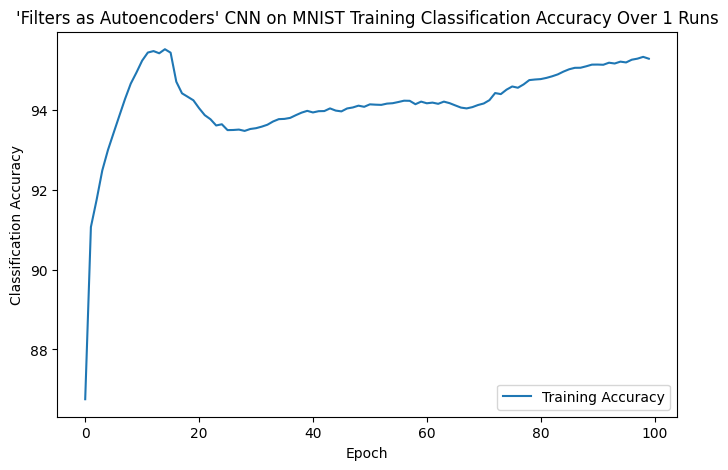

In [11]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

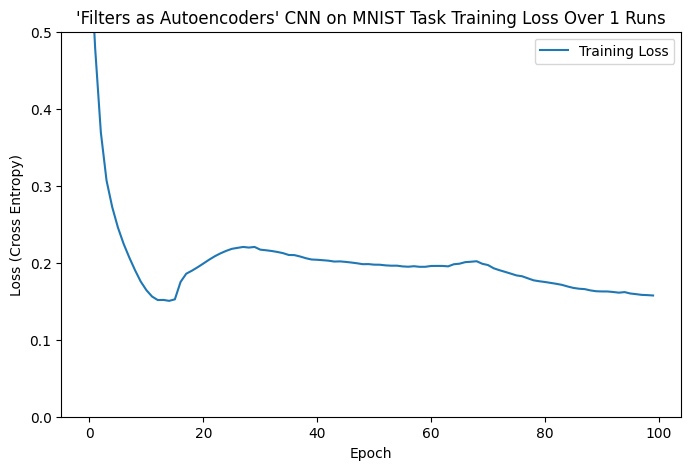

In [12]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' CNN on MNIST Task Training Loss Over 1 Runs")
plt.show()

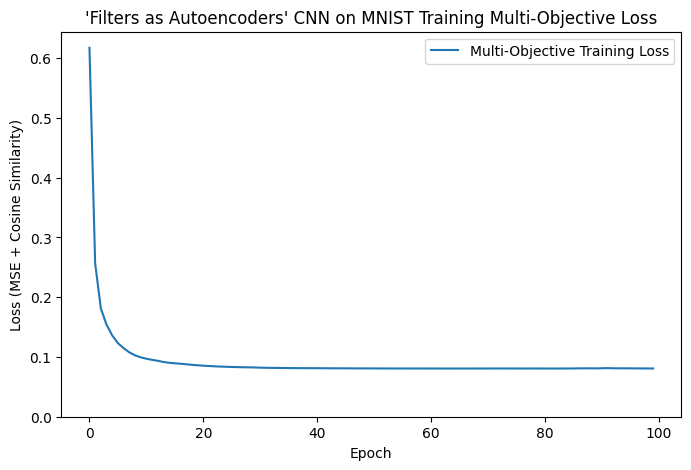

In [13]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Multi-Objective Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (MSE + Cosine Similarity)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Multi-Objective Loss")
plt.show()

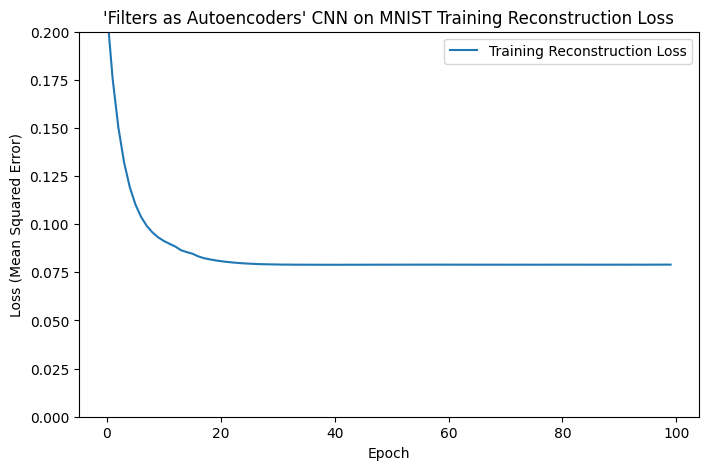

In [14]:
epochs = np.arange(len(training_history["recon_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["recon_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

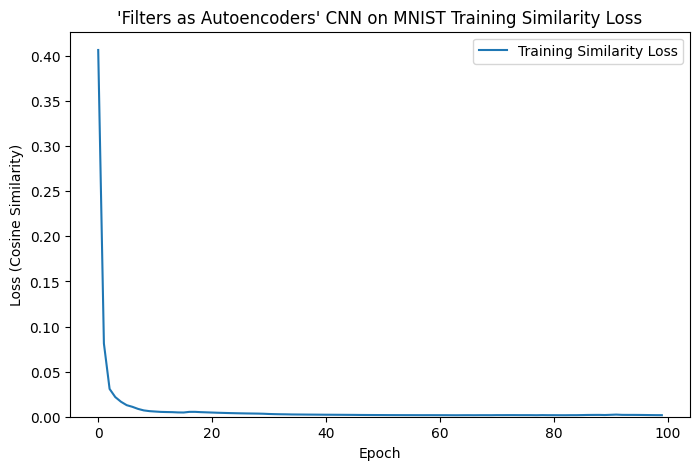

In [15]:
epochs = np.arange(len(training_history["sim_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["sim_train_loss"],label="Training Similarity Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cosine Similarity)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Similarity Loss")
plt.show()

# Quantify pooled feature similarities

In [24]:
maps = feature_history[99]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
# (16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].abs().max()

print(mean_similarity)
print(max_similarity)

tensor(0.0047)
tensor(0.1217)


In [18]:
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")

the mean filter cosine similarity from Gram matrix: 0.20429208874702454
the max filter similarity: 0.826271653175354


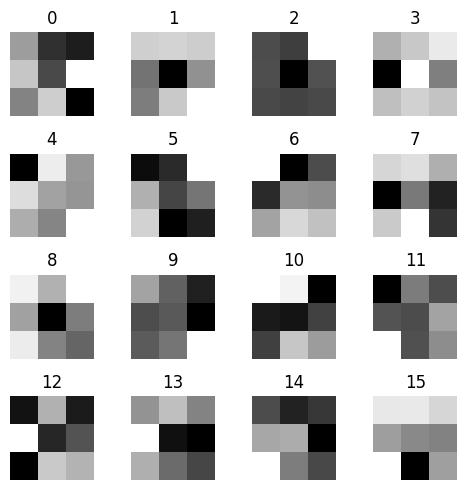

In [25]:
weights = feature_history[99]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

### Kernel similarity is reduced, as is activation similarity but only all too far such that useful overlapping classification features are never produced (as discussed, concentration of highly dissimilar features are also suboptimal)

# Back to the original model, small ablation study:
# initial model contains separate encoder/decoder weights with biases...

In [18]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")


    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=True,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1881
Epoch [1/100], Task Training Loss: 0.4304, Accuracy: 88.63%
Epoch [2/100], Encoder Training Loss: 0.1011
Epoch [2/100], Task Training Loss: 0.2326, Accuracy: 93.28%
Epoch [3/100], Encoder Training Loss: 0.0722
Epoch [3/100], Task Training Loss: 0.2219, Accuracy: 93.48%
Epoch [4/100], Encoder Training Loss: 0.0574
Epoch [4/100], Task Training Loss: 0.2175, Accuracy: 93.66%
Epoch [5/100], Encoder Training Loss: 0.0471
Epoch [5/100], Task Training Loss: 0.2119, Accuracy: 93.74%
Epoch [6/100], Encoder Training Loss: 0.0393
Epoch [6/100], Task Training Loss: 0.2048, Accuracy: 94.04%
Epoch [7/100], Encoder Training Loss: 0.0331
Epoch [7/100], Task Training Loss: 0.2029, Accuracy: 94.09%
Epoch [8/100], Encoder Training Loss: 0.0280
Epoch [8/100], Task Training Loss: 0.1911, Accuracy: 94.48%
Epoch [9/100], Encoder Training Loss: 0.0239
Epoch [9/100], Task Training Loss: 0.1915, Accuracy: 94.31%
Epoch [10/100], Encoder Tr

In [19]:
# encoder loss
encoder_loss = np.array(all_encoder_histories[0])

# task loss
task_loss = np.array(all_task_histories[0])

# accuracy
accuracy= np.array(all_accuracy_histories[0])

#peak memory
relevant_peak_mems = np.array(peak_memory[0]) 
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[0:])

# Loss and Accuracy

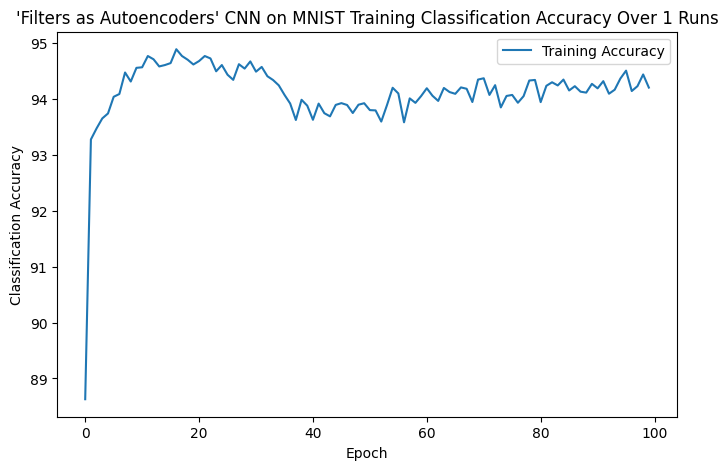

In [20]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

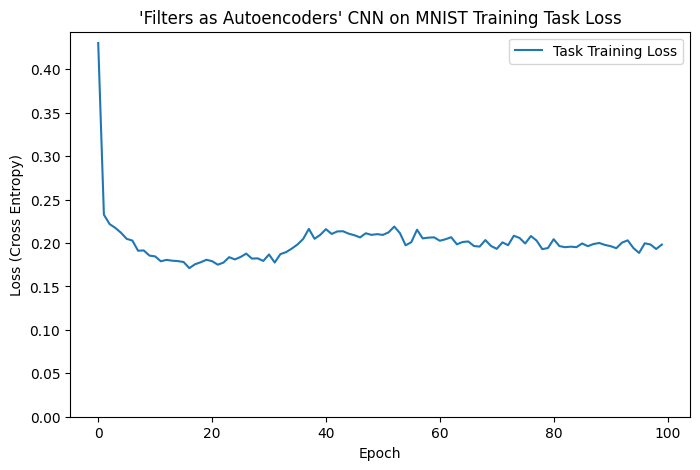

In [21]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Task Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Task Loss")
plt.show()

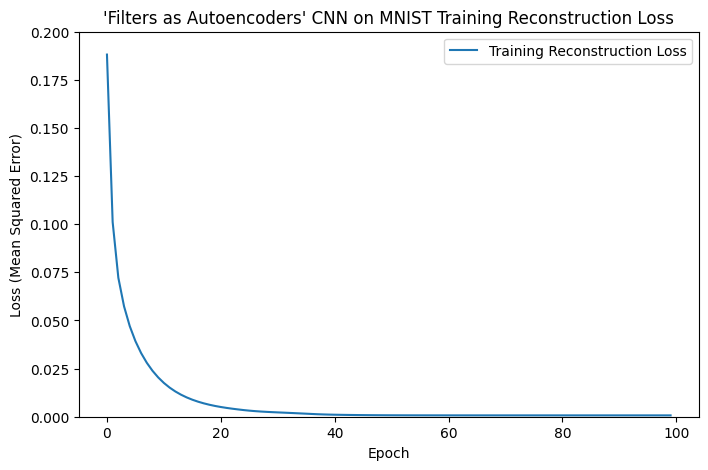

In [22]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

# Firstly, exlude the biases only:

In [7]:
#count how many params of the model...

#just to make sure we are getting the most current file version 
importlib.reload(nan_cnn)  

device = torch.device('cpu')


model = nan_cnn.FilterCNN(
        input_dims=28,
        pool_kernel_size=2,
        pool_stride=2,
        kernel_size=3,
        stride=1,
        padding=1,
        n_filters=16,
        bias=False,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

filters.0.encoder.weight (1, 1, 3, 3) -> 9
filters.0.decoder.weight (1, 1, 3, 3) -> 9
filters.1.encoder.weight (1, 1, 3, 3) -> 9
filters.1.decoder.weight (1, 1, 3, 3) -> 9
filters.2.encoder.weight (1, 1, 3, 3) -> 9
filters.2.decoder.weight (1, 1, 3, 3) -> 9
filters.3.encoder.weight (1, 1, 3, 3) -> 9
filters.3.decoder.weight (1, 1, 3, 3) -> 9
filters.4.encoder.weight (1, 1, 3, 3) -> 9
filters.4.decoder.weight (1, 1, 3, 3) -> 9
filters.5.encoder.weight (1, 1, 3, 3) -> 9
filters.5.decoder.weight (1, 1, 3, 3) -> 9
filters.6.encoder.weight (1, 1, 3, 3) -> 9
filters.6.decoder.weight (1, 1, 3, 3) -> 9
filters.7.encoder.weight (1, 1, 3, 3) -> 9
filters.7.decoder.weight (1, 1, 3, 3) -> 9
filters.8.encoder.weight (1, 1, 3, 3) -> 9
filters.8.decoder.weight (1, 1, 3, 3) -> 9
filters.9.encoder.weight (1, 1, 3, 3) -> 9
filters.9.decoder.weight (1, 1, 3, 3) -> 9
filters.10.encoder.weight (1, 1, 3, 3) -> 9
filters.10.decoder.weight (1, 1, 3, 3) -> 9
filters.11.encoder.weight (1, 1, 3, 3) -> 9
filters.

In [8]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")


    model, training_history, elapsed = nan_cnn_experiment.train_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=False,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2287
Epoch [1/100], Task Training Loss: 0.4500, Accuracy: 88.09%
Epoch [2/100], Encoder Training Loss: 0.2121
Epoch [2/100], Task Training Loss: 0.2234, Accuracy: 93.53%
Epoch [3/100], Encoder Training Loss: 0.2021
Epoch [3/100], Task Training Loss: 0.1846, Accuracy: 94.65%
Epoch [4/100], Encoder Training Loss: 0.1957
Epoch [4/100], Task Training Loss: 0.1741, Accuracy: 94.93%
Epoch [5/100], Encoder Training Loss: 0.1912
Epoch [5/100], Task Training Loss: 0.1692, Accuracy: 95.04%
Epoch [6/100], Encoder Training Loss: 0.1878
Epoch [6/100], Task Training Loss: 0.1663, Accuracy: 95.21%
Epoch [7/100], Encoder Training Loss: 0.1849
Epoch [7/100], Task Training Loss: 0.1780, Accuracy: 94.74%
Epoch [8/100], Encoder Training Loss: 0.1825
Epoch [8/100], Task Training Loss: 0.1853, Accuracy: 94.54%
Epoch [9/100], Encoder Training Loss: 0.1806
Epoch [9/100], Task Training Loss: 0.2106, Accuracy: 93.89%
Epoch [10/100], Encoder Tr

In [10]:
# encoder loss
encoder_loss = np.array(all_encoder_histories[0])

# task loss
task_loss = np.array(all_task_histories[0])

# accuracy
accuracy= np.array(all_accuracy_histories[0])

#peak memory
relevant_peak_mems = np.array(peak_memory[0]) 
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[0:])

# Loss and Accuracy

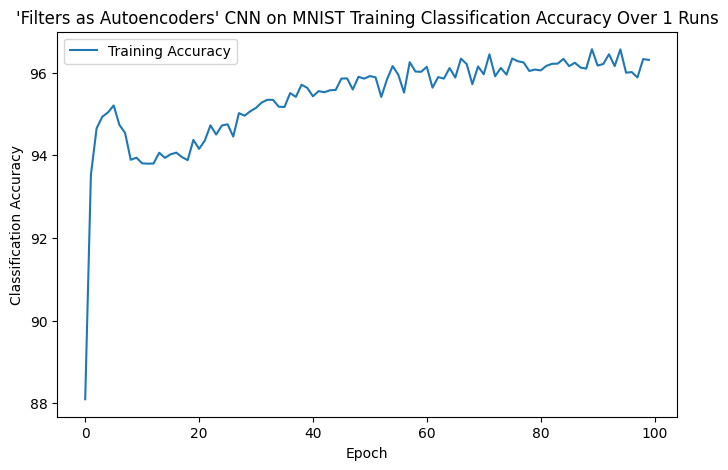

In [11]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

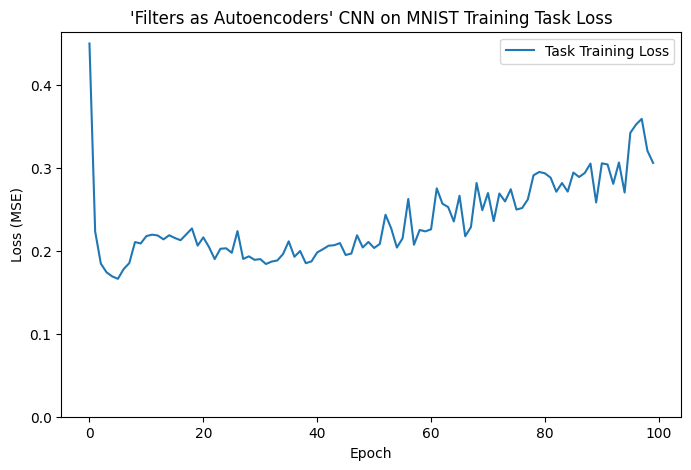

In [ ]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Task Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy Loss)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Task Loss")
plt.show()

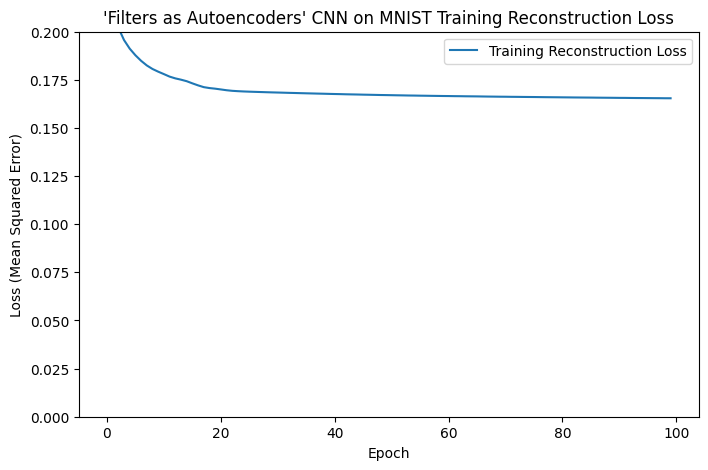

In [16]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

### Model classification loss diverges more dramatically as before, and reconstruction loss is now within a local minimum.

# Now weight sharing, bias ==true

In [23]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")


    model, training_history, elapsed = nan_cnn_experiment.train_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1857
Epoch [1/100], Task Training Loss: 0.4252, Accuracy: 88.25%
Epoch [2/100], Encoder Training Loss: 0.1173
Epoch [2/100], Task Training Loss: 0.2299, Accuracy: 93.34%
Epoch [3/100], Encoder Training Loss: 0.0870
Epoch [3/100], Task Training Loss: 0.1989, Accuracy: 94.07%
Epoch [4/100], Encoder Training Loss: 0.0685
Epoch [4/100], Task Training Loss: 0.1921, Accuracy: 94.42%
Epoch [5/100], Encoder Training Loss: 0.0552
Epoch [5/100], Task Training Loss: 0.1877, Accuracy: 94.48%
Epoch [6/100], Encoder Training Loss: 0.0451
Epoch [6/100], Task Training Loss: 0.1810, Accuracy: 94.75%
Epoch [7/100], Encoder Training Loss: 0.0373
Epoch [7/100], Task Training Loss: 0.1774, Accuracy: 94.72%
Epoch [8/100], Encoder Training Loss: 0.0312
Epoch [8/100], Task Training Loss: 0.1684, Accuracy: 95.02%
Epoch [9/100], Encoder Training Loss: 0.0264
Epoch [9/100], Task Training Loss: 0.1692, Accuracy: 94.92%
Epoch [10/100], Encoder Tr

In [24]:
# encoder loss
encoder_loss = np.array(all_encoder_histories[0])

# task loss
task_loss = np.array(all_task_histories[0])

# accuracy
accuracy= np.array(all_accuracy_histories[0])

#peak memory
relevant_peak_mems = np.array(peak_memory[0]) 
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[0:])

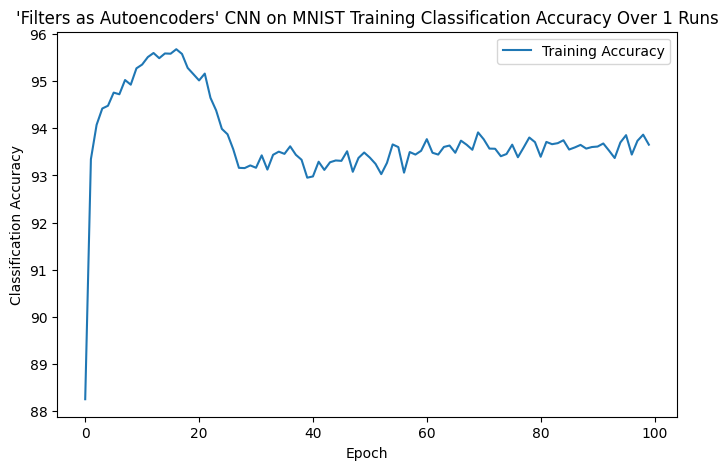

In [25]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

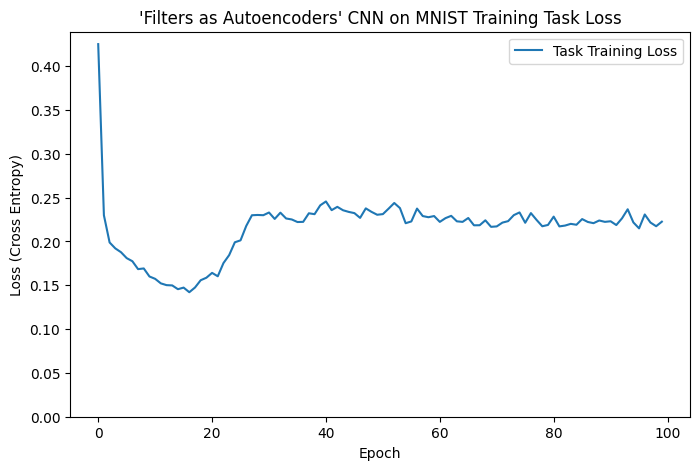

In [26]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Task Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Task Loss")
plt.show()

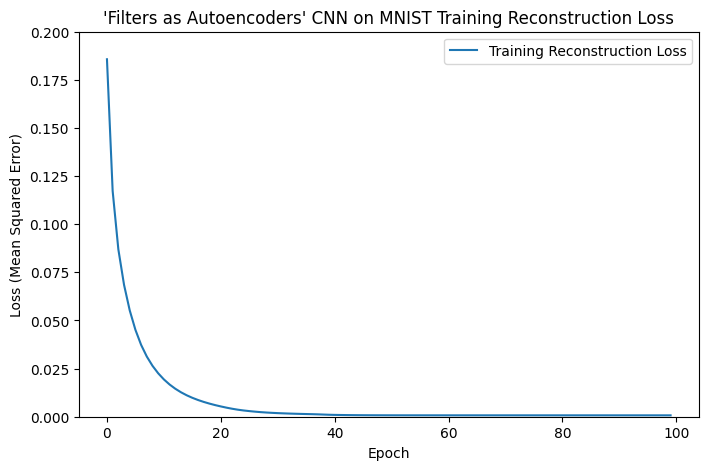

In [27]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

### Divergence still observed as in the initial model.

# Now weight sharing, bias ==false

In [7]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): #10 runs with 1 warm up
    #run training and evaluation

    print(f"model run: {seed}")


    model, training_history, elapsed = nan_cnn_experiment.train_weight_share_nan_cnn(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=False,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2129
Epoch [1/100], Task Training Loss: 0.3888, Accuracy: 89.09%
Epoch [2/100], Encoder Training Loss: 0.2017
Epoch [2/100], Task Training Loss: 0.1835, Accuracy: 94.74%
Epoch [3/100], Encoder Training Loss: 0.1969
Epoch [3/100], Task Training Loss: 0.1662, Accuracy: 95.22%
Epoch [4/100], Encoder Training Loss: 0.1941
Epoch [4/100], Task Training Loss: 0.1614, Accuracy: 95.40%
Epoch [5/100], Encoder Training Loss: 0.1923
Epoch [5/100], Task Training Loss: 0.1588, Accuracy: 95.35%
Epoch [6/100], Encoder Training Loss: 0.1910
Epoch [6/100], Task Training Loss: 0.1552, Accuracy: 95.41%
Epoch [7/100], Encoder Training Loss: 0.1900
Epoch [7/100], Task Training Loss: 0.1509, Accuracy: 95.52%
Epoch [8/100], Encoder Training Loss: 0.1893
Epoch [8/100], Task Training Loss: 0.1478, Accuracy: 95.63%
Epoch [9/100], Encoder Training Loss: 0.1887
Epoch [9/100], Task Training Loss: 0.1487, Accuracy: 95.66%
Epoch [10/100], Encoder Tr

In [8]:
# encoder loss
encoder_loss = np.array(all_encoder_histories[0])

# task loss
task_loss = np.array(all_task_histories[0])

# accuracy
accuracy= np.array(all_accuracy_histories[0])

#peak memory
relevant_peak_mems = np.array(peak_memory[0]) 
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[0:])

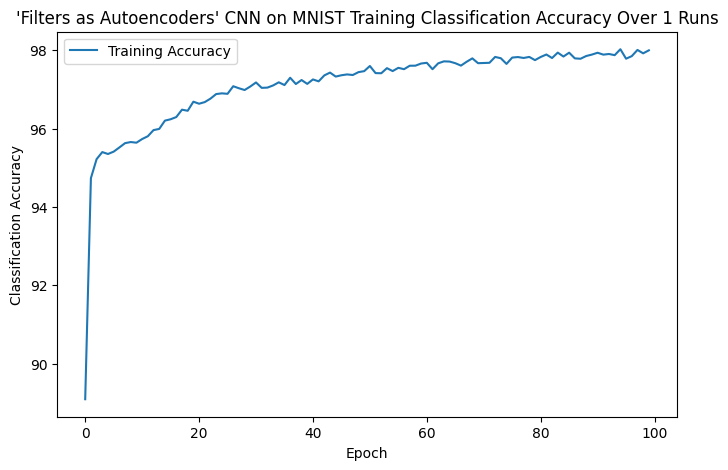

In [9]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

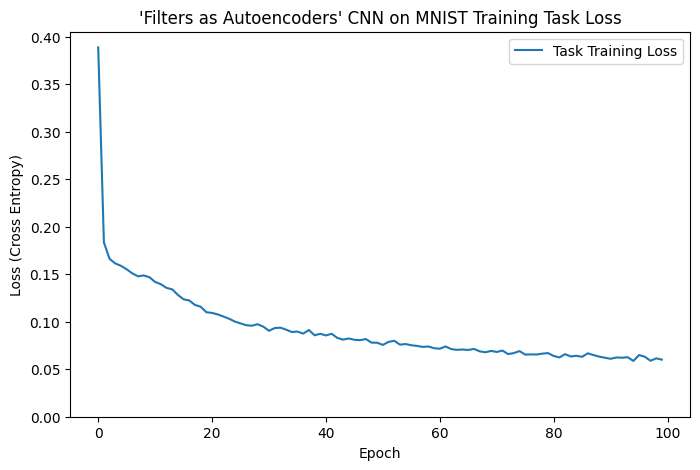

In [10]:
epochs = np.arange(len(training_history["task_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["task_train_loss"],label="Task Training Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Task Loss")
plt.show()

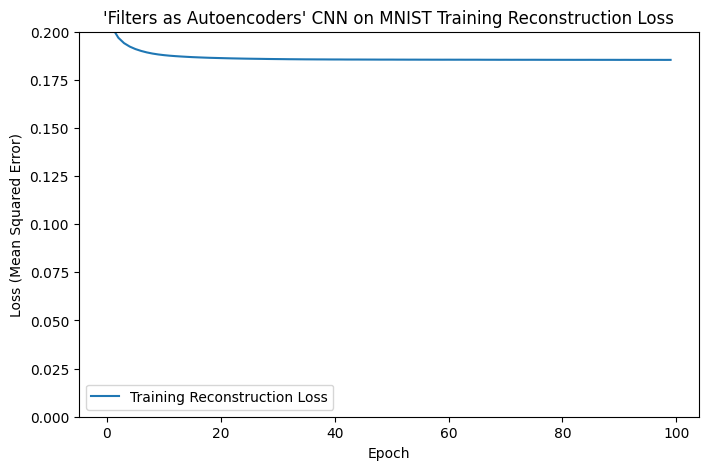

In [11]:
epochs = np.arange(len(training_history["encoder_train_loss"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["encoder_train_loss"],label="Training Reconstruction Loss")


plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(0,0.2)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Reconstruction Loss")
plt.show()

### So it is that not only does training the classifier within early epochs of the autoencoding cycle (where kernels and features are diverse) aid the classifier learning process, so does the pairing of the removal of the bias term under tied weights. Removing the bias removes the global smoothing of features, and sharing weights likely reduces the representational capacity such that simplistic features may be learnt for classificaiton... and we shall see this below

# Weight share with bias term:

In [8]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_weight_share_show_features(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.1857
Epoch [1/100], Task Training Loss: 0.4252, Accuracy: 88.25%
Epoch [2/100], Encoder Training Loss: 0.1173
Epoch [2/100], Task Training Loss: 0.2299, Accuracy: 93.34%
Epoch [3/100], Encoder Training Loss: 0.0870
Epoch [3/100], Task Training Loss: 0.1989, Accuracy: 94.07%
Epoch [4/100], Encoder Training Loss: 0.0685
Epoch [4/100], Task Training Loss: 0.1921, Accuracy: 94.42%
Epoch [5/100], Encoder Training Loss: 0.0552
Epoch [5/100], Task Training Loss: 0.1877, Accuracy: 94.48%
Epoch [6/100], Encoder Training Loss: 0.0451
Epoch [6/100], Task Training Loss: 0.1810, Accuracy: 94.75%
Epoch [7/100], Encoder Training Loss: 0.0373
Epoch [7/100], Task Training Loss: 0.1774, Accuracy: 94.72%
Epoch [8/100], Encoder Training Loss: 0.0312
Epoch [8/100], Task Training Loss: 0.1684, Accuracy: 95.02%
Epoch [9/100], Encoder Training Loss: 0.0264
Epoch [9/100], Task Training Loss: 0.1692, Accuracy: 94.92%
Epoch [10/100], Encoder Tr

# Inspecting Kernels

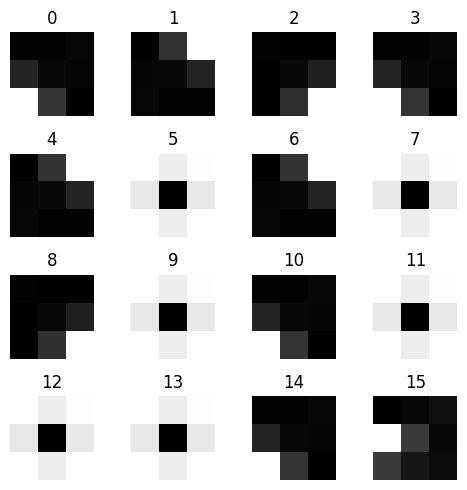

In [12]:
weights = feature_history[99]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

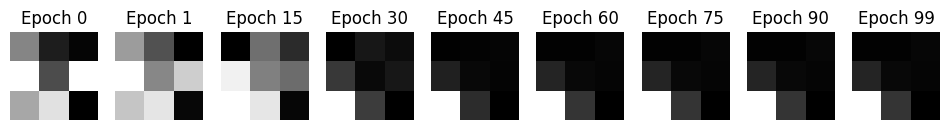

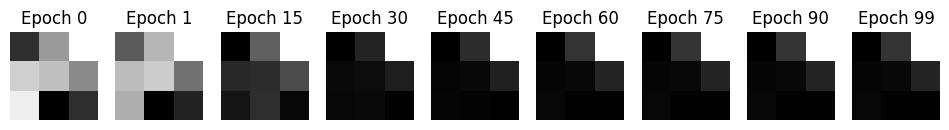

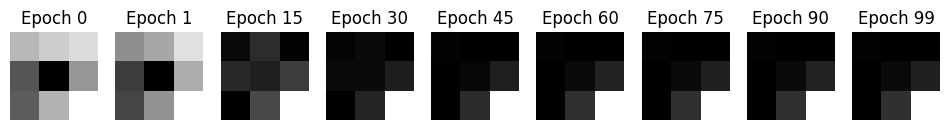

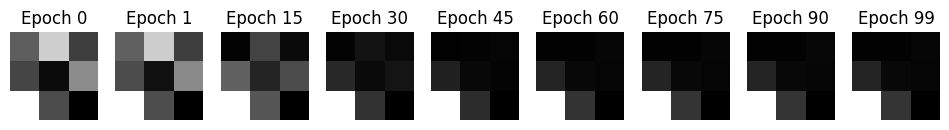

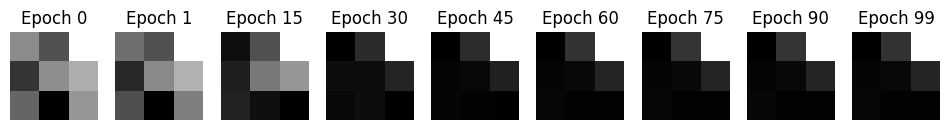

...

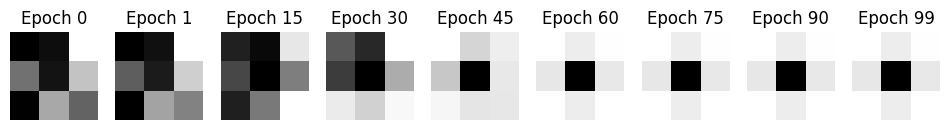

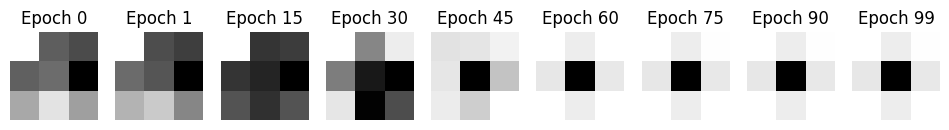

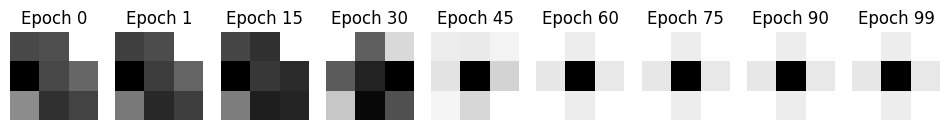

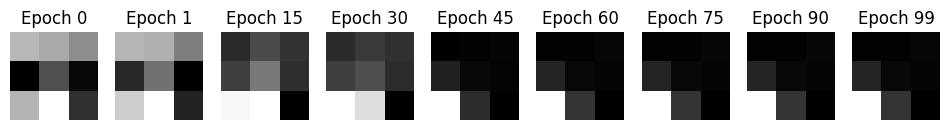

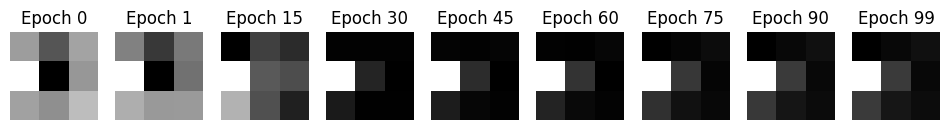

In [13]:
epochs = [0,1,15,30,45,60,75,90,99]
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        kernel = feature_history[epoch]["encoder_weights"][filter_idx]

        ax.imshow(kernel,cmap="gray")
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

In [14]:
import torch.nn.functional as F 
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")

the mean filter cosine similarity from Gram matrix: 0.19154725968837738
the max filter similarity: 1.0000001192092896


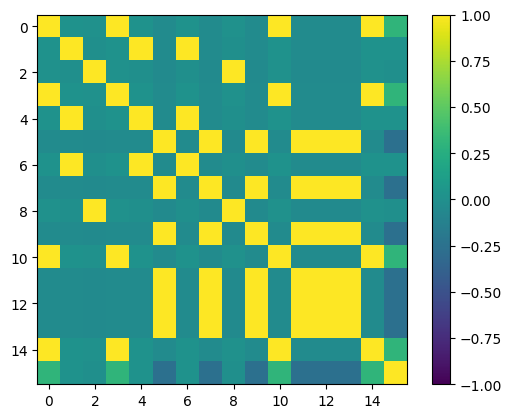

In [ ]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

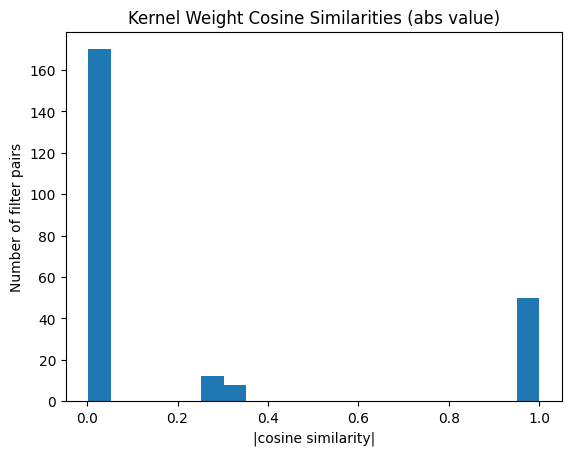

In [16]:
pairwise = similarity_matrix[mask].abs().detach().cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Weight Cosine Similarities (abs value)")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Inspecting Features learnt

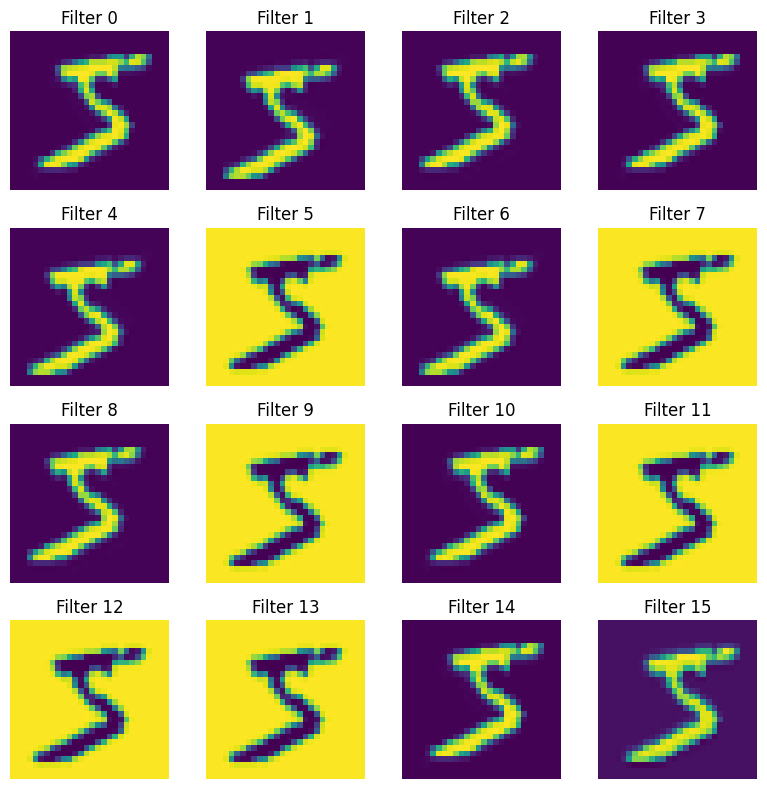

In [17]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[99]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()


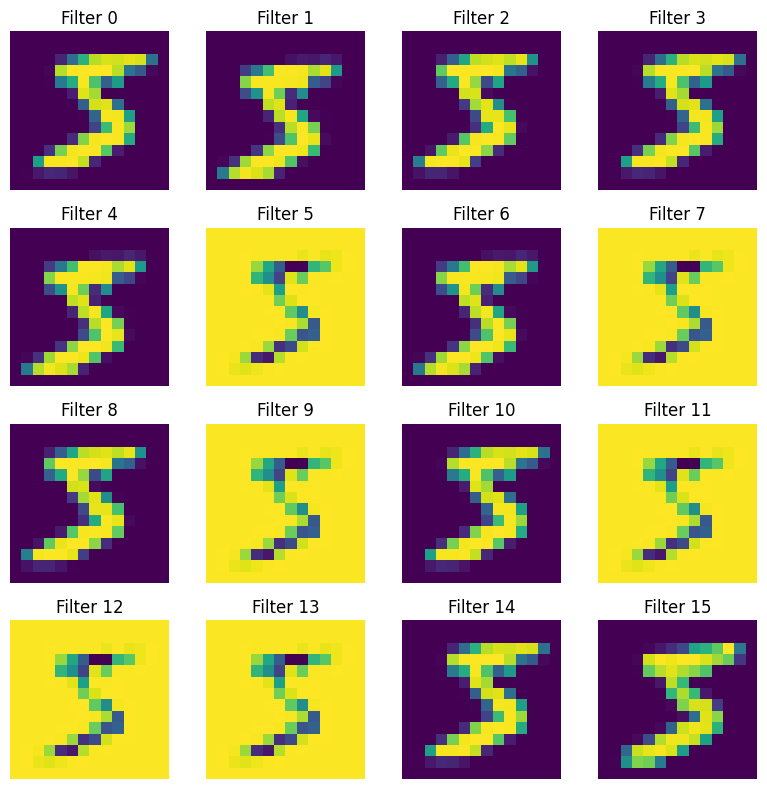

In [18]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[99]["pooled_maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

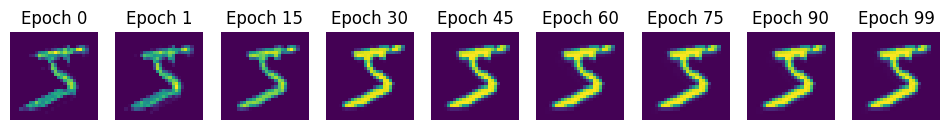

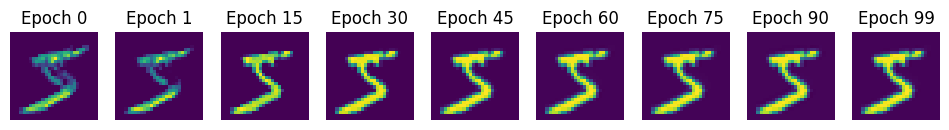

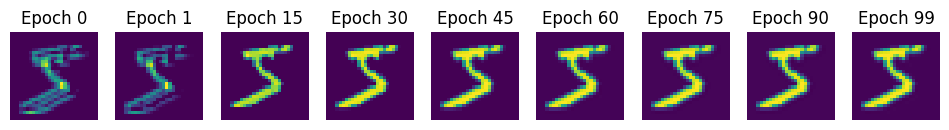

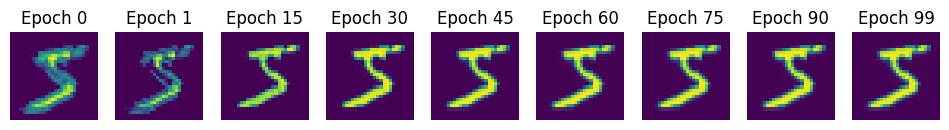

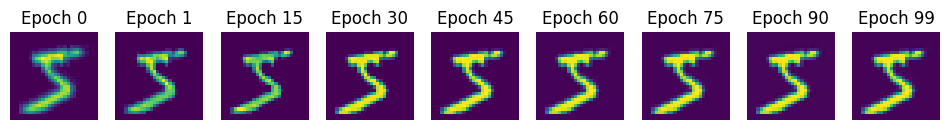

...

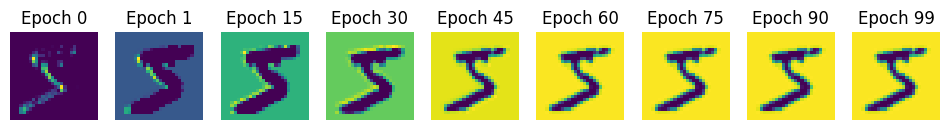

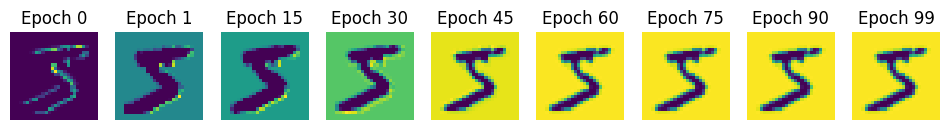

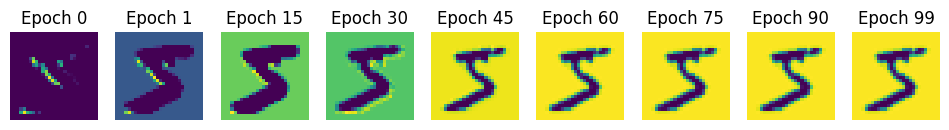

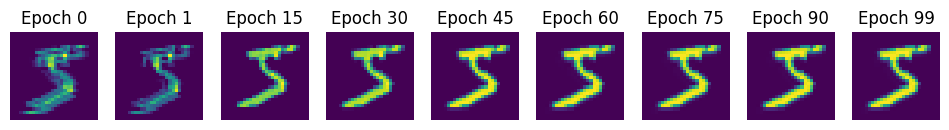

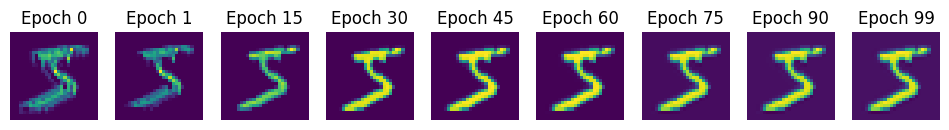

In [19]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        feature_map = feature_history[epoch]["maps"][0,filter_idx]

        ax.imshow(feature_map,cmap="viridis")
  
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()


In [20]:
maps = feature_history[99]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
#(16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].max()

print(mean_similarity)
print(max_similarity)


tensor(0.7299)
tensor(1.)


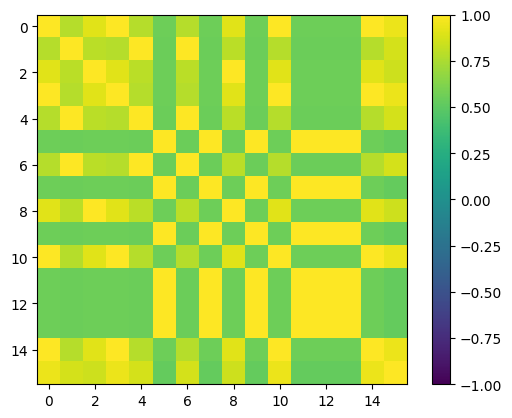

In [21]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

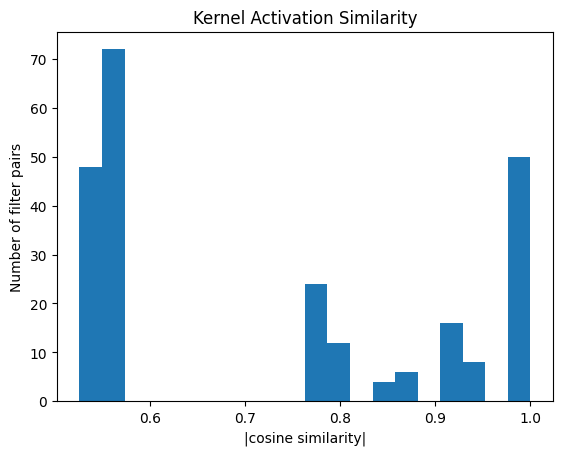

In [22]:

pairwise = similarity_matrix[mask].cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Activation Similarity")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# now removing the bias

In [15]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_weight_share_show_features(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        bias=False,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2129
Epoch [1/100], Task Training Loss: 0.3888, Accuracy: 89.09%
Epoch [2/100], Encoder Training Loss: 0.2017
Epoch [2/100], Task Training Loss: 0.1835, Accuracy: 94.74%
Epoch [3/100], Encoder Training Loss: 0.1969
Epoch [3/100], Task Training Loss: 0.1662, Accuracy: 95.22%
Epoch [4/100], Encoder Training Loss: 0.1941
Epoch [4/100], Task Training Loss: 0.1614, Accuracy: 95.40%
Epoch [5/100], Encoder Training Loss: 0.1923
Epoch [5/100], Task Training Loss: 0.1588, Accuracy: 95.35%
Epoch [6/100], Encoder Training Loss: 0.1910
Epoch [6/100], Task Training Loss: 0.1552, Accuracy: 95.41%
Epoch [7/100], Encoder Training Loss: 0.1900
Epoch [7/100], Task Training Loss: 0.1509, Accuracy: 95.52%
Epoch [8/100], Encoder Training Loss: 0.1893
Epoch [8/100], Task Training Loss: 0.1478, Accuracy: 95.63%
Epoch [9/100], Encoder Training Loss: 0.1887
Epoch [9/100], Task Training Loss: 0.1487, Accuracy: 95.66%
Epoch [10/100], Encoder Tr

# Inspecting kernels

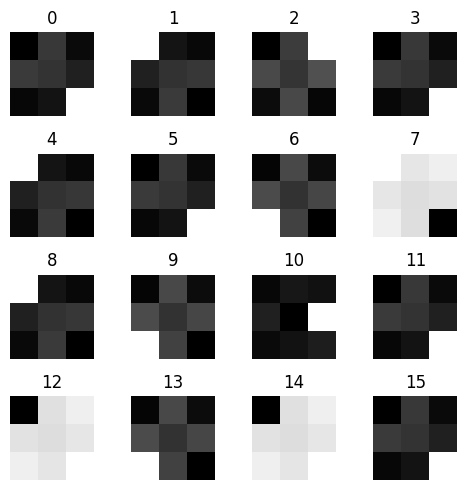

In [16]:
weights = feature_history[99]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()

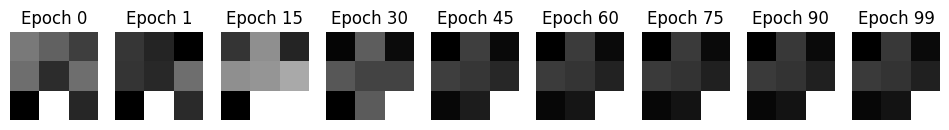

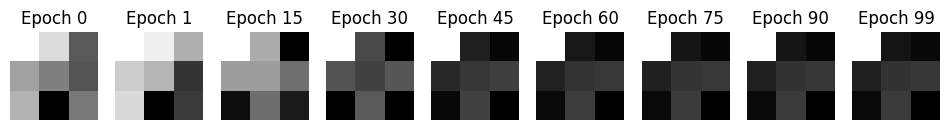

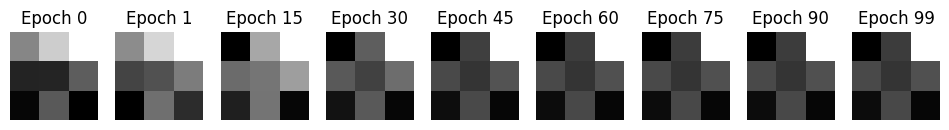

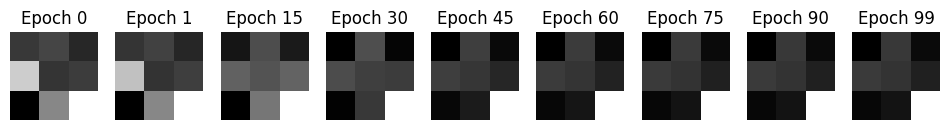

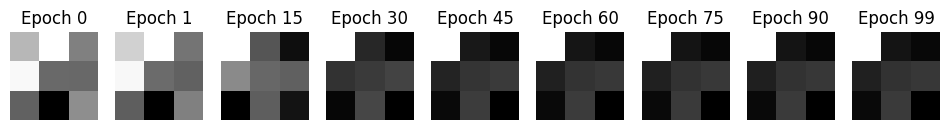

...

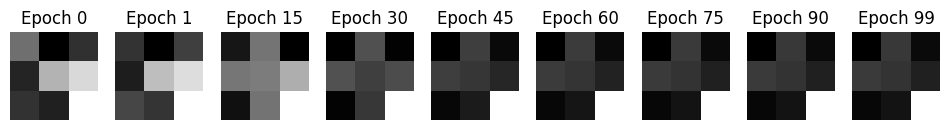

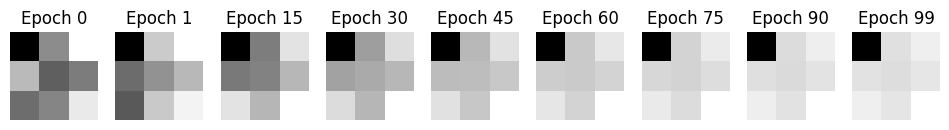

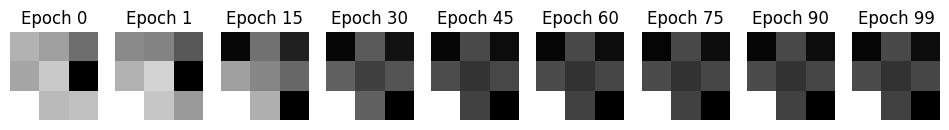

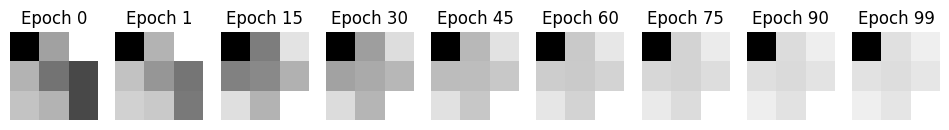

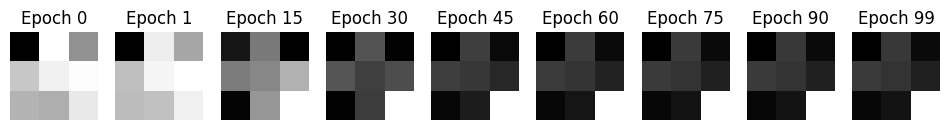

In [17]:
epochs = [0,1,15,30,45,60,75,90,99]
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        kernel = feature_history[epoch]["encoder_weights"][filter_idx]

        ax.imshow(kernel,cmap="gray")
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

In [27]:
import torch.nn.functional as F 
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_similarity = similarity_matrix[mask].mean()
print(f"the mean filter cosine similarity from Gram matrix: {mean_similarity}")

max_similarity = similarity_matrix[mask].abs().max()

print(f"the max filter similarity: {max_similarity}")


the mean filter cosine similarity from Gram matrix: -0.02582699991762638
the max filter similarity: 1.0000001192092896


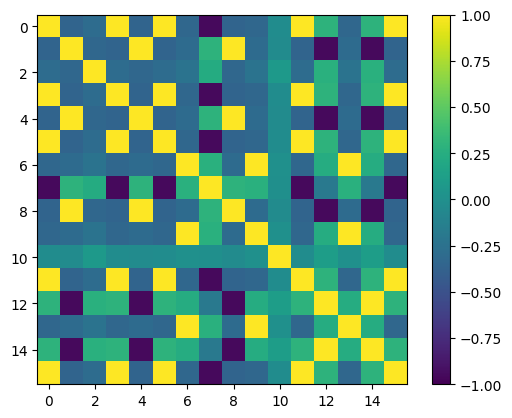

In [19]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

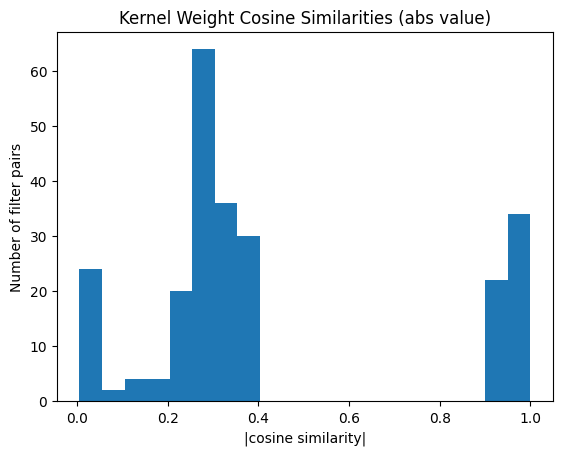

In [20]:
pairwise = similarity_matrix[mask].abs().detach().cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Weight Cosine Similarities (abs value)")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Inspecting features learnt

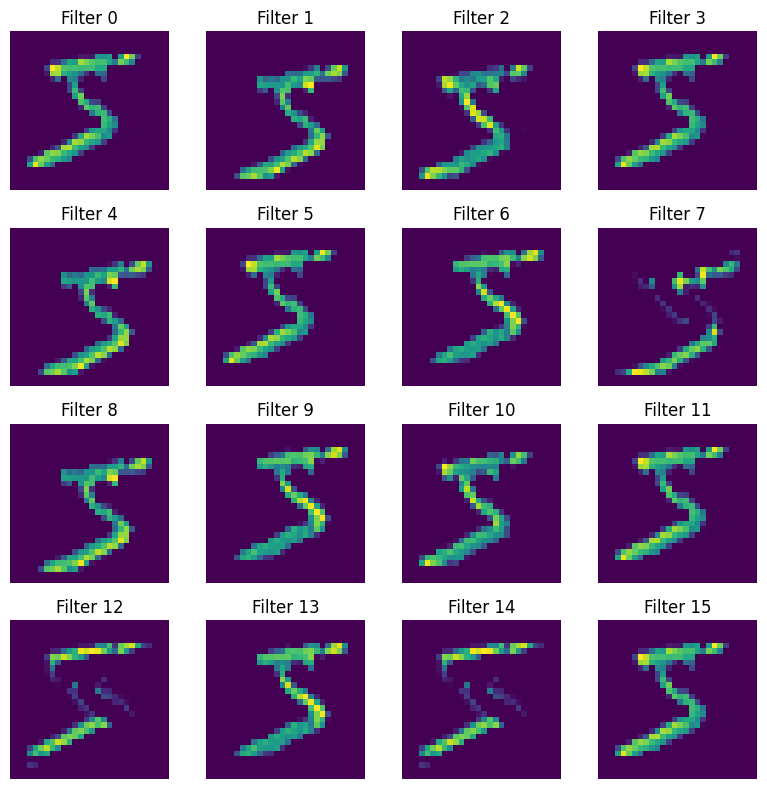

In [21]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[99]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

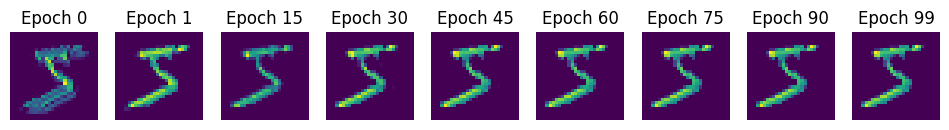

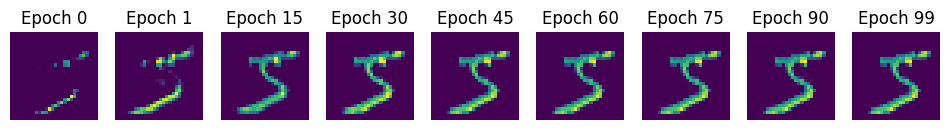

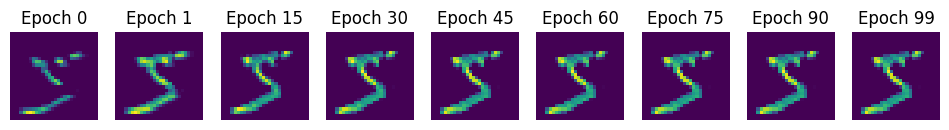

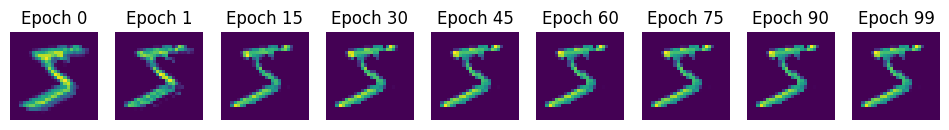

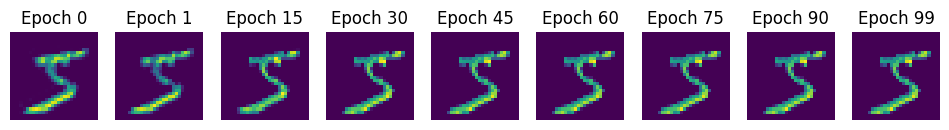

...

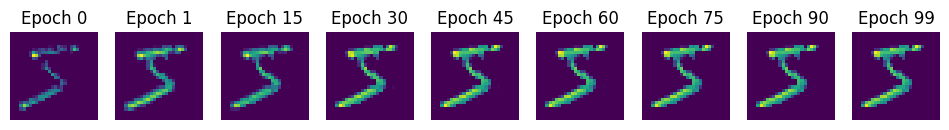

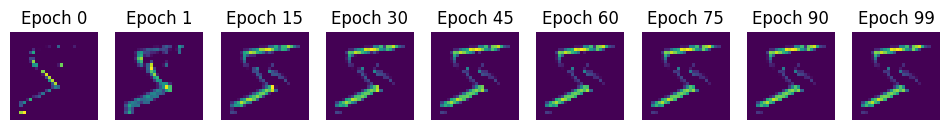

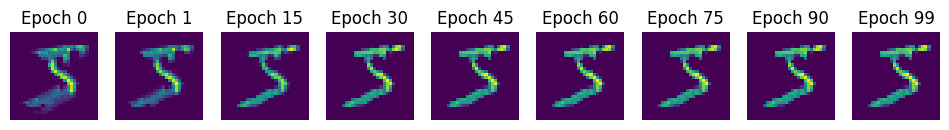

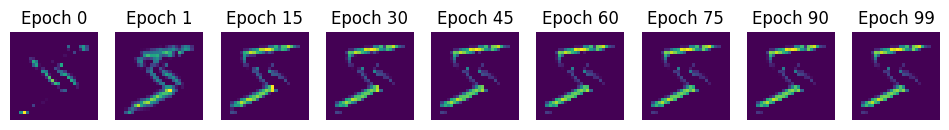

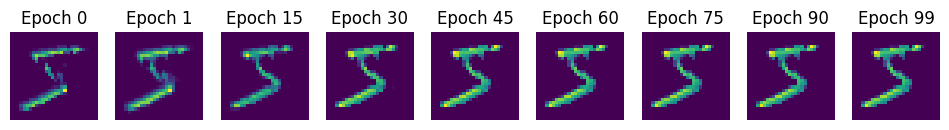

In [22]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        feature_map = feature_history[epoch]["maps"][0,filter_idx]

        ax.imshow(feature_map,cmap="viridis")
  
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

In [23]:
maps = feature_history[99]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
#(16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].max()

print(mean_similarity)
print(max_similarity)

tensor(0.5621)
tensor(1.0000)


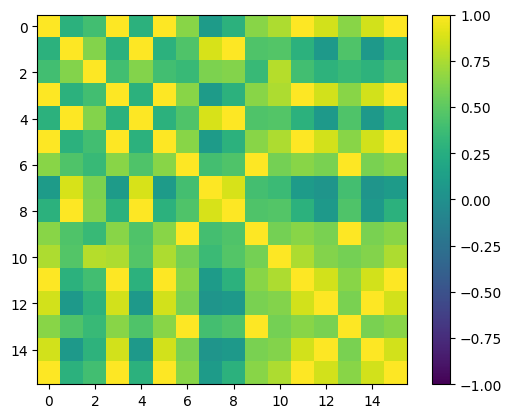

In [24]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

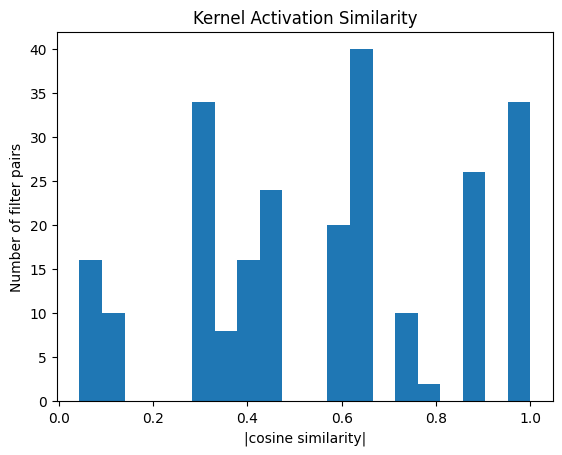

In [25]:

pairwise = similarity_matrix[mask].cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Activation Similarity")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Now final inspection of the optimal model (small learning rate autoencoder with weight tying and no bias)

In [9]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")


    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_nan_cnn_weight_share_show_features(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,
        n_epochs=100,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        epochs_to_show=[0,1,15,30,45,60,75,90,99],
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2234
Epoch [1/100], Task Training Loss: 0.4010, Accuracy: 88.93%
Epoch [2/100], Encoder Training Loss: 0.2232
Epoch [2/100], Task Training Loss: 0.1961, Accuracy: 94.64%
Epoch [3/100], Encoder Training Loss: 0.2229
Epoch [3/100], Task Training Loss: 0.1555, Accuracy: 95.77%
Epoch [4/100], Encoder Training Loss: 0.2226
Epoch [4/100], Task Training Loss: 0.1315, Accuracy: 96.44%
Epoch [5/100], Encoder Training Loss: 0.2223
Epoch [5/100], Task Training Loss: 0.1164, Accuracy: 96.86%
Epoch [6/100], Encoder Training Loss: 0.2220
Epoch [6/100], Task Training Loss: 0.1036, Accuracy: 97.28%
Epoch [7/100], Encoder Training Loss: 0.2218
Epoch [7/100], Task Training Loss: 0.0940, Accuracy: 97.54%
Epoch [8/100], Encoder Training Loss: 0.2215
Epoch [8/100], Task Training Loss: 0.0874, Accuracy: 97.68%
Epoch [9/100], Encoder Training Loss: 0.2212
Epoch [9/100], Task Training Loss: 0.0809, Accuracy: 97.91%
Epoch [10/100], Encoder Tr

# Brief Validation of Accuracy

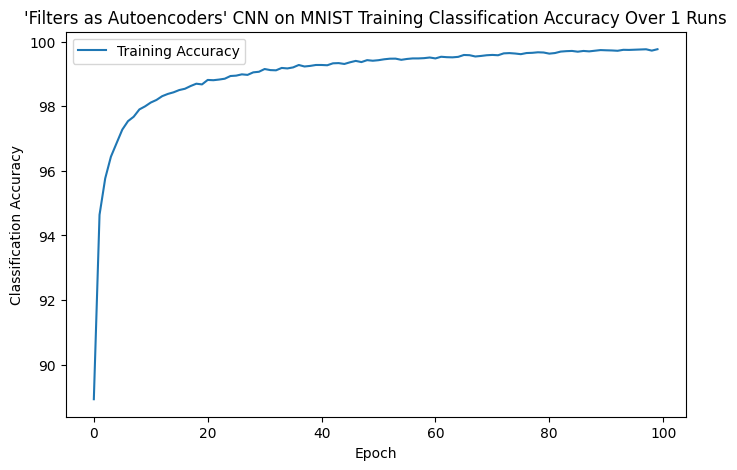

In [10]:
epochs = np.arange(len(training_history["train_accuracy"]))

plt.figure(figsize=(8,5))

plt.plot(epochs, training_history["train_accuracy"],label="Training Accuracy")


plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' CNN on MNIST Training Classification Accuracy Over 1 Runs")
plt.show()

# Kernels Learnt

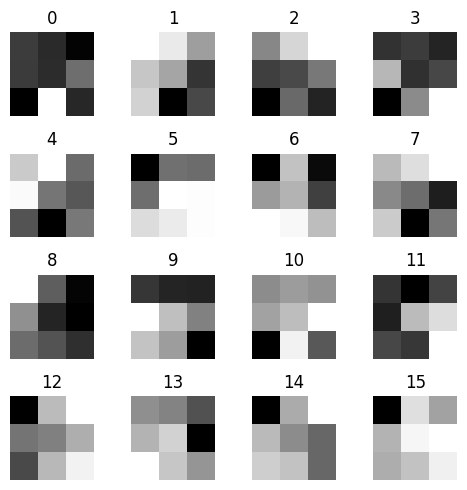

In [11]:
weights = feature_history[99]["encoder_weights"]

fig, axes = plt.subplots(4,4,figsize=(5,5))

for i, ax in enumerate(axes.flat):

    ax.imshow(weights[i], cmap="gray")
    ax.set_title(i)
    ax.axis("off")

plt.tight_layout()
plt.show()



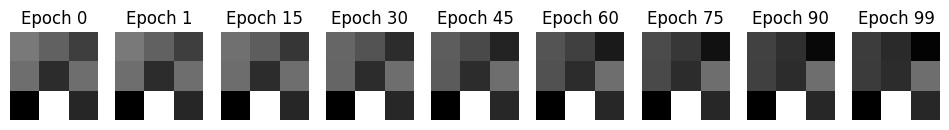

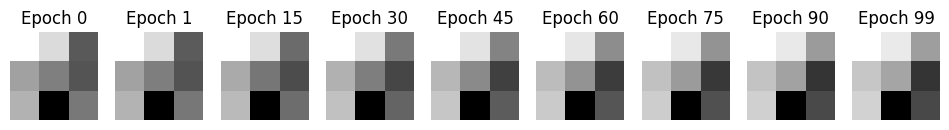

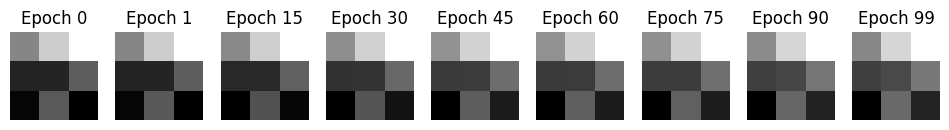

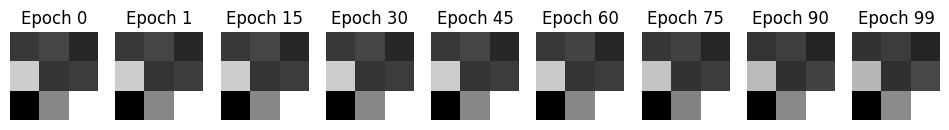

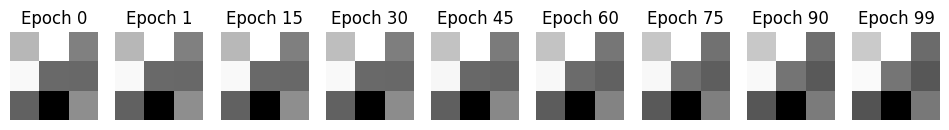

...

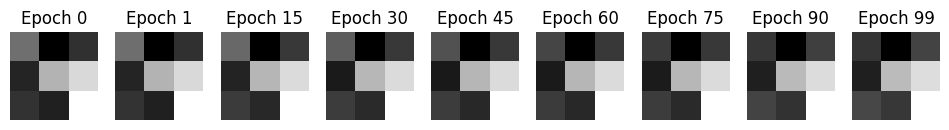

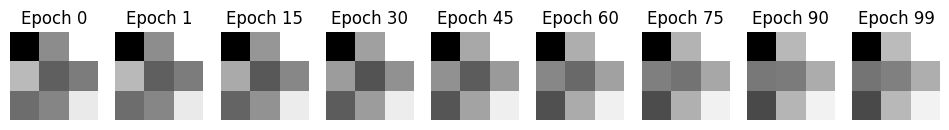

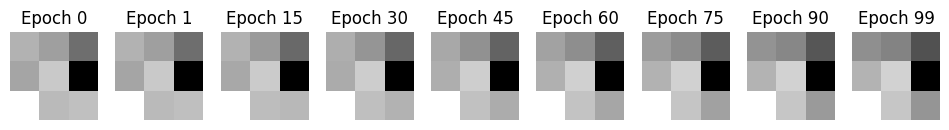

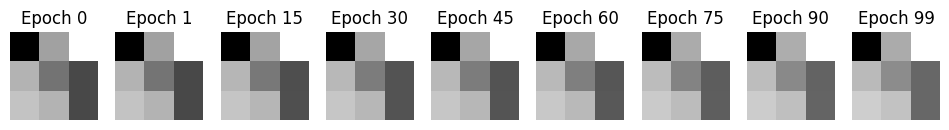

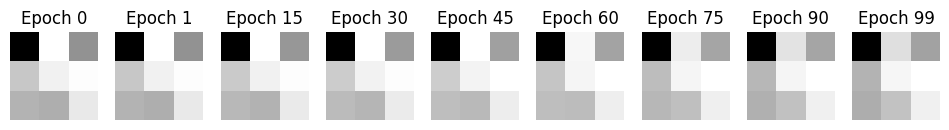

In [12]:
epochs = [0,1,15,30,45,60,75,90,99]
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        kernel = feature_history[epoch]["encoder_weights"][filter_idx]

        ax.imshow(kernel,cmap="gray")
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

In [14]:
import torch.nn.functional as F 
weights = torch.stack([
    F.normalize(f.encoder.weight.view(-1), dim=0)
    for f in model.filters
])

similarity_matrix = weights @ weights.T

mask = ~torch.eye(16, dtype=torch.bool, device="cuda")

mean_abs_similarity = similarity_matrix[mask].abs().mean()
mean_similarity = similarity_matrix[mask].mean()

max_similarity = similarity_matrix[mask].max()
min_similarity = similarity_matrix[mask].min()


print(f"Mean abs filter cosine similarity: {mean_abs_similarity:.4f}")
print(f"Mean filter cosine similarity: {mean_similarity:.4f}")

print(f"Maximum filter similarity: {max_similarity:.4f}")
print(f"Minimum filter similarity: {min_similarity:.4f}")


Mean abs filter cosine similarity: 0.3292
Mean filter cosine similarity: -0.0074
Maximum filter similarity: 0.8231
Minimum filter similarity: -0.8204


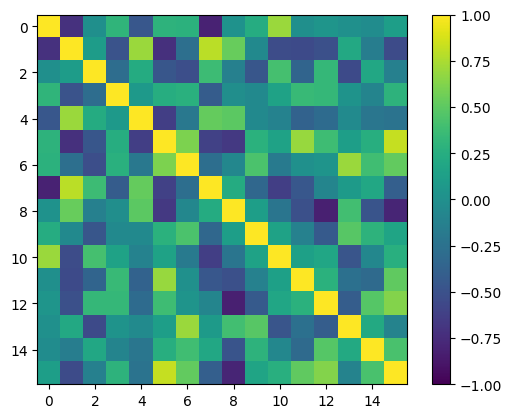

In [15]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

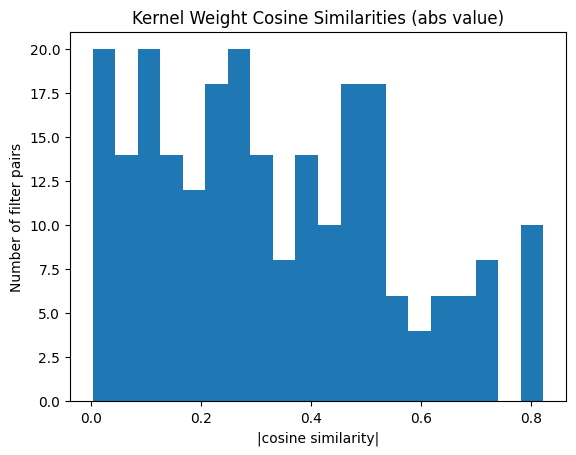

In [16]:
pairwise = similarity_matrix[mask].abs().detach().cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Weight Cosine Similarities (abs value)")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Features

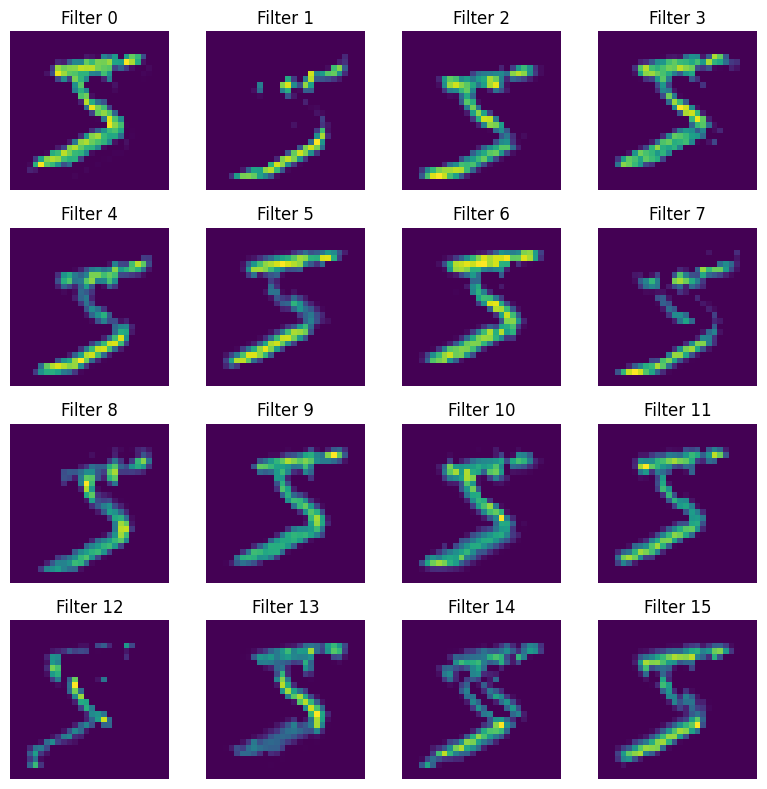

In [17]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[99]["maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

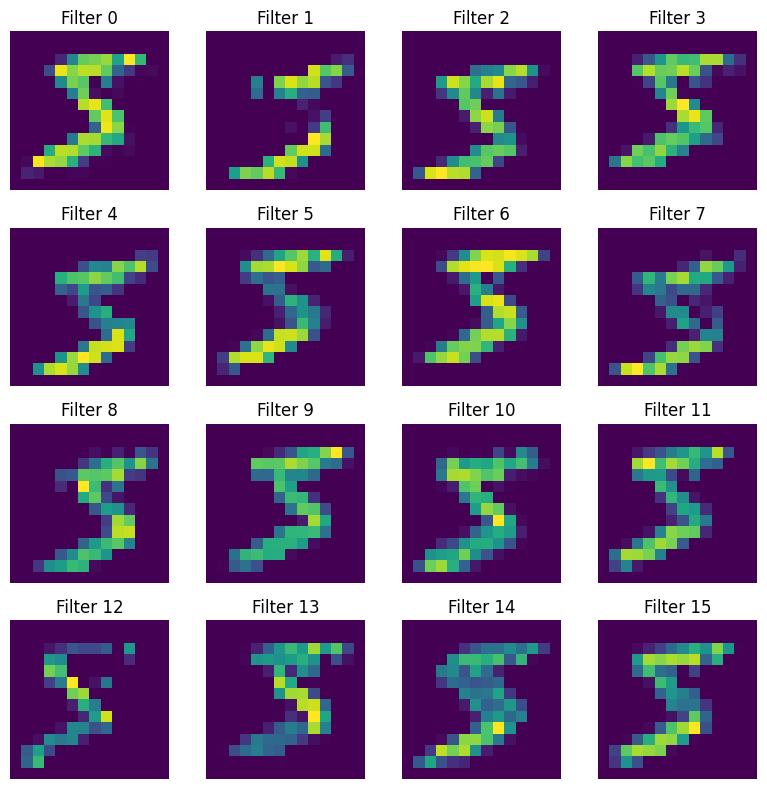

In [18]:
fig, axes = plt.subplots(4,4,figsize=(8,8))

maps = feature_history[99]["pooled_maps"][0]

for i, ax in enumerate(axes.flat):

    ax.imshow(maps[i], cmap="viridis")
    ax.set_title(f"Filter {i}")
    ax.axis("off")

plt.tight_layout()
plt.show()

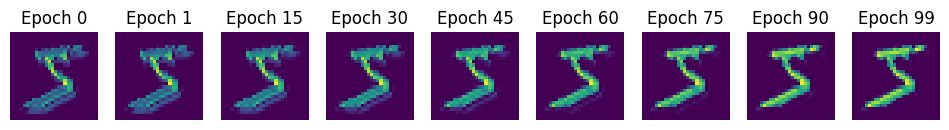

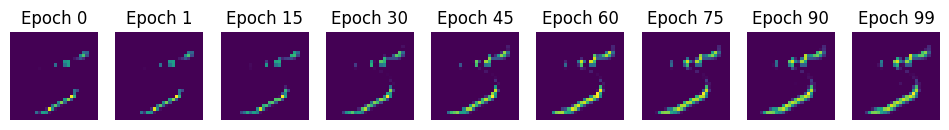

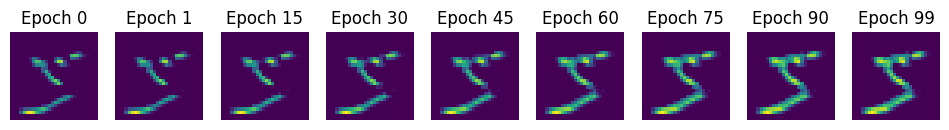

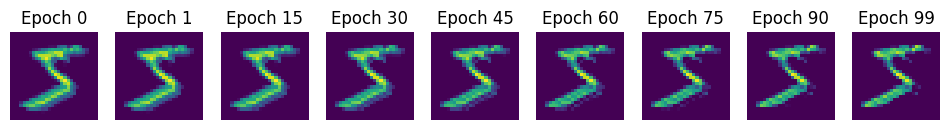

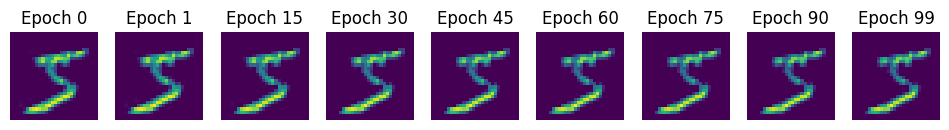

...

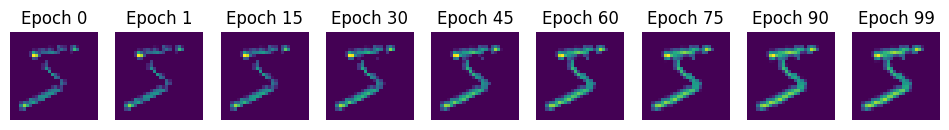

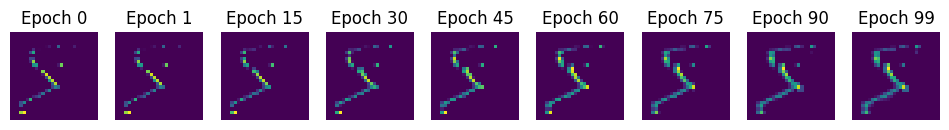

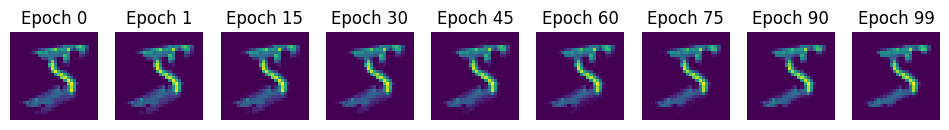

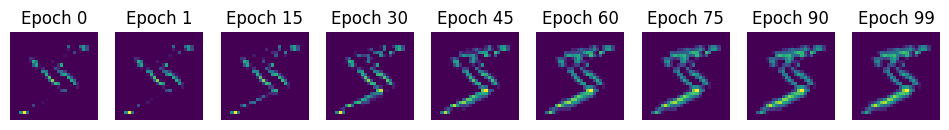

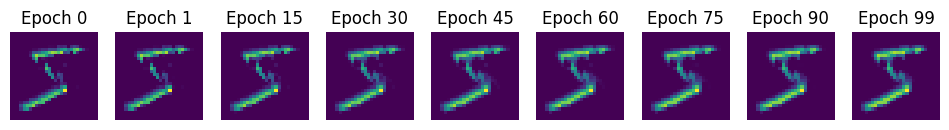

In [19]:
for i in range(16):
    filter_idx = i
    fig, axes = plt.subplots(1,len(epochs),figsize=(12,4))
    for ax, epoch in zip(axes, epochs):

        feature_map = feature_history[epoch]["maps"][0,filter_idx]

        ax.imshow(feature_map,cmap="viridis")
  
        ax.set_title(f"Epoch {epoch}")
        ax.axis("off")

    plt.show()

In [20]:
maps = feature_history[99]["pooled_maps"].squeeze(0)
# (16,14,14)

maps = maps.flatten(1)
#(16,196)

maps = F.normalize(maps, dim=1)

similarity_matrix = maps @ maps.T

mask = ~torch.eye(maps.size(0), dtype=torch.bool)

mean_similarity = similarity_matrix[mask].mean()
max_similarity = similarity_matrix[mask].max()

print(mean_similarity)
print(max_similarity)


tensor(0.6174)
tensor(0.9656)


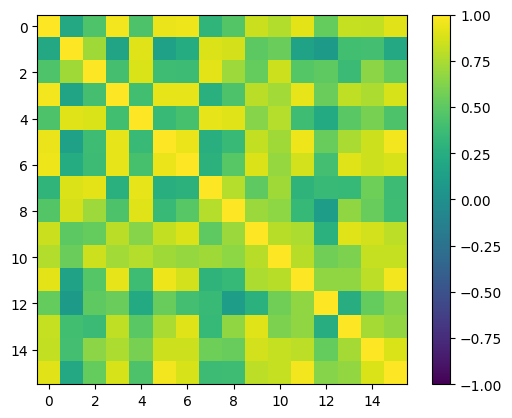

In [21]:
plt.imshow(similarity_matrix.detach().cpu(), vmin=-1, vmax=1)
plt.colorbar()

Text(0, 0.5, 'Number of filter pairs')

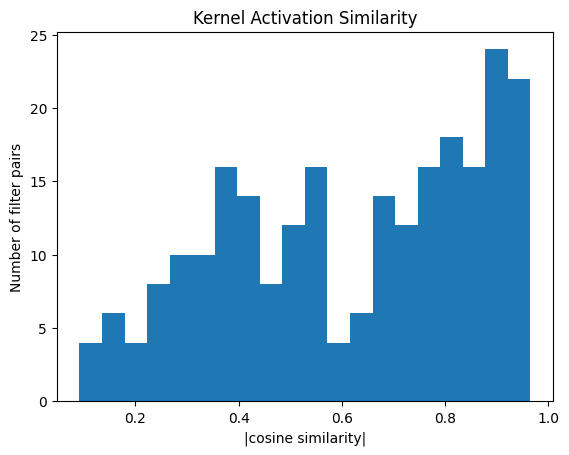

In [22]:
pairwise = similarity_matrix[mask].cpu().numpy()

plt.hist(pairwise, bins=20)
plt.title("Kernel Activation Similarity")
plt.xlabel("|cosine similarity|")
plt.ylabel("Number of filter pairs")

# Removing the pooling but keeping 28x28 feature maps allows for 100% training accuracy at some epochs (model is significantly larger):

In [ ]:
#count how many params of the model...

device = torch.device('cpu')

model = no_pool_weight_share_nan_cnn.FilterCNN(
        input_dims=28,
        in_channels=1,
        kernel_size=3,
        stride=1,
        padding=1,
        n_filters=16,
        output_padding=0,
        sigmoid=True,
        bias=False,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

In [9]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(11): # just 1 run

    if seed == 0:
        n_epochs =1
    else: 
        n_epochs=100

    print(f"model run: {seed}")


    model, training_history, elapsed = nan_cnn_experiment.train_parallel_schedule_no_pool_weight_share(
        mnist,
        input_dims=28,
        learning_rate=0.001,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,
        n_epochs=n_epochs,      
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        output_padding=0,
        kernel_size=3,
        n_classes=10,
        seed=seed 
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Epoch [1/1], Encoder Training Loss: 0.2234
Epoch [1/1], Task Training Loss: 0.2933, Accuracy: 91.55%
peak memory from train : 75.0517578125
memory now reset and is: 35.49658203125 MB
time elapsed: 5.752804464000064
model run: 1
device is: cuda
Epoch [1/100], Encoder Training Loss: 0.2308
Epoch [1/100], Task Training Loss: 0.3127, Accuracy: 91.05%
Epoch [2/100], Encoder Training Loss: 0.2306
Epoch [2/100], Task Training Loss: 0.1678, Accuracy: 95.50%
Epoch [3/100], Encoder Training Loss: 0.2304
Epoch [3/100], Task Training Loss: 0.1309, Accuracy: 96.47%
Epoch [4/100], Encoder Training Loss: 0.2303
Epoch [4/100], Task Training Loss: 0.1071, Accuracy: 97.08%
Epoch [5/100], Encoder Training Loss: 0.2301
Epoch [5/100], Task Training Loss: 0.0914, Accuracy: 97.55%
Epoch [6/100], Encoder Training Loss: 0.2299
Epoch [6/100], Task Training Loss: 0.0805, Accuracy: 97.80%
Epoch [7/100], Encoder Training Loss: 0.2297
Epoch [7/100], Task Training Loss: 0.0712, Accuracy:

In [12]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories[1:])
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories[1:])
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories[1:])
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


epochs = np.arange(1, len(task_mean_loss)+1)

epoch_df = pd.DataFrame({
    "epoch": epochs,
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,
    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})

epoch_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_no_pool_28x28maps_epoch_results.csv",
    index=False,
)

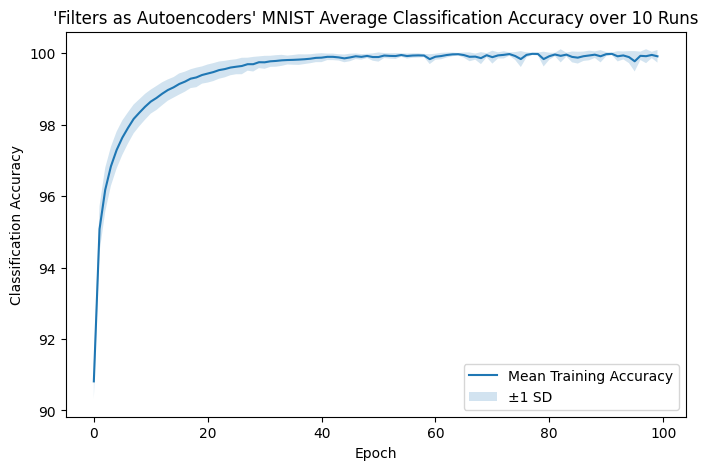

In [13]:
epochs = np.arange(len(mean_acc))

plt.figure(figsize=(8,5))

plt.plot(epochs, mean_acc,label="Mean Training Accuracy")

plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Classification Accuracy")
plt.legend()
#plt.ylim(0,0.02)
plt.title("'Filters as Autoencoders' MNIST Average Classification Accuracy over 10 Runs")
plt.show()

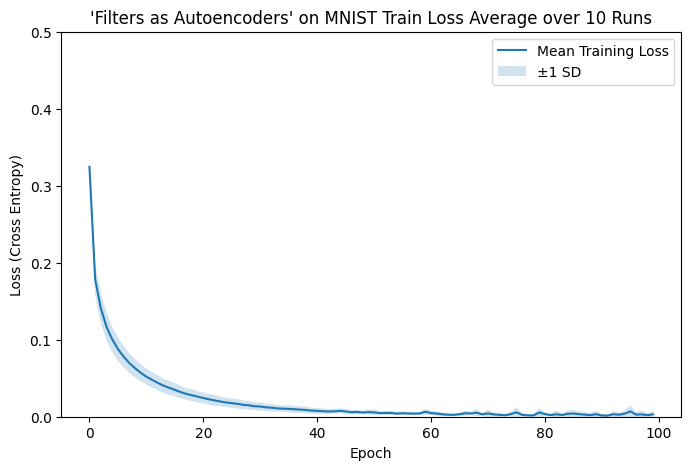

In [14]:
epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, task_mean_loss,label="Mean Training Loss")

plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross Entropy)")
plt.legend()
plt.ylim(0,0.5)
plt.title("'Filters as Autoencoders' on MNIST Train Loss Average over 10 Runs")
plt.show()

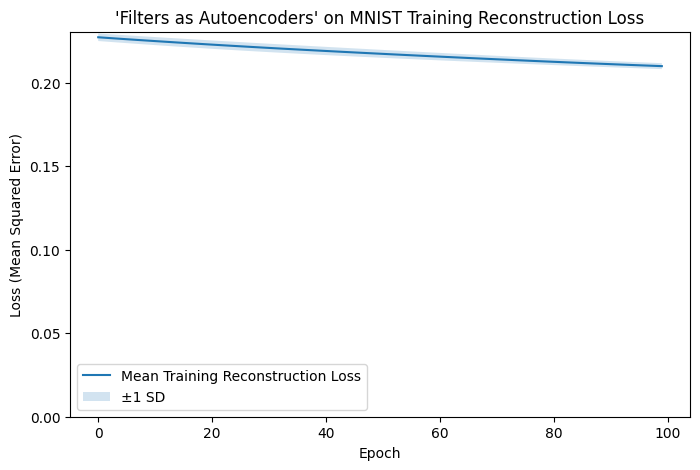

In [16]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Reconstruction Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' on MNIST Training Reconstruction Loss")
plt.show()

In [17]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 60.479736328125
All peak memories (including the warm up run):


[75.0517578125,
 76.025390625,
 58.75244140625,
 58.75244140625,
 58.75244140625,
 58.75244140625,
 58.75244140625,
 58.75244140625,
 58.75244140625,
 58.75244140625,
 58.75244140625]

In [18]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
times

Mean training time for 100 epochs over the 10 runs: 570.9613735657999 
All training times for the 100 epochs over the 10 runs:


array([569.73073451, 573.49746074, 572.16618264, 565.37458743,
       575.8212751 , 578.72184407, 570.33424866, 571.89927784,
       564.26641689, 567.80170779])

In [ ]:
print(f"Max accuracy: {epoch_df["mean_accuracy"].max()}") #that is, out of the 10 runs, take the average every epoch, then take the max
print(f"Max accuracy std: {epoch_df["std_accuracy"].max()}")

print(f"Min Loss: {epoch_df["task_mean_loss"].min()}")
print(f"Max Loss std: {epoch_df["task_std_loss"].max()}")

print(f"Min Encoder Loss: {epoch_df["encoder_mean_loss"].min()} (to 10 dp: {epoch_df["encoder_mean_loss"].min():.10f})")
print(f"Max Encoder Loss std: {epoch_df["encoder_std_loss"].min()} (to 10 dp: {epoch_df["encoder_std_loss"].min():.10f})")

Max accuracy: 99.98366666666666
Max accuracy std: 0.6453786356344116
Min Loss: 0.0014290171383262087
Max Loss std: 0.02064142041200966
Min Encoder Loss: 0.20981435568448395 (to 10 dp: 0.2098143557)
Max Encoder Loss std: 0.001776809953231613 (to 10 dp: 0.0017768100)


# Running linear feature extraction and classifier for comparison to all other methods 
### All other methods being (cnn, conv autoencoder, hebb)

## Firstly inspecting the niave implementation of training the AE for 100 epochs with the tiny lr, and subsequently the classifier for 30 epochs using lr=0.01

In [6]:
from torchvision import datasets, transforms


In [ ]:
#controlling randomness of scheduling 
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

In [8]:

mnist_root = "../datasets/mnist"

base_transform = transforms.ToTensor()

mnist_train = datasets.MNIST(
    root=mnist_root,
    train=True,
    download=True,
    transform=base_transform
)

mnist_test = datasets.MNIST(
    root=mnist_root,
    train=False,
    download=True,
    transform=base_transform
)

In [8]:
#control the dataloader workers
def seed_worker(worker_id): 
    worker_seed = torch.initial_seed() % 2**32 #converting to range expected by NumPy/Python's seeding mechanisms.

    np.random.seed(worker_seed)
    random.seed(worker_seed)

### Interested mainly to see, can we match the previous training results with niave linear schedule

In [11]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(3): # 3 runs

    print(f"model run: {seed}")


    model, training_history,test_history, elapsed = nan_cnn_experiment.train_niave_linear_weight_share_nan_cnn(
        mnist_train,
        mnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,   
        n_ae_epochs=100,      
        n_classifier_epochs=50,
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_train_loss"])
    all_accuracy_test_histories.append(test_history["train_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/100], Encoder Training Loss: 0.2234
Epoch [2/100], Encoder Training Loss: 0.2232
Epoch [3/100], Encoder Training Loss: 0.2229
Epoch [4/100], Encoder Training Loss: 0.2226
Epoch [5/100], Encoder Training Loss: 0.2223
Epoch [6/100], Encoder Training Loss: 0.2220
Epoch [7/100], Encoder Training Loss: 0.2218
Epoch [8/100], Encoder Training Loss: 0.2215
Epoch [9/100], Encoder Training Loss: 0.2212
Epoch [10/100], Encoder Training Loss: 0.2209
Epoch [11/100], Encoder Training Loss: 0.2207
Epoch [12/100], Encoder Training Loss: 0.2204
Epoch [13/100], Encoder Training Loss: 0.2202
Epoch [14/100], Encoder Training Loss: 0.2199
Epoch [15/100], Encoder Training Loss: 0.2196
Epoch [16/100], Encoder Training Loss: 0.2194
Epoch [17/100], Encoder Training Loss: 0.2191
Epoch [18/100], Encoder Training Loss: 0.2189
Epoch [19/100], Encoder Training Loss: 0.2186
Epoch [20/100], Encoder Training Loss: 0.2184
Epoch [21/100], Encoder Training Loss: 0.2182

In [ ]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories)
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories)
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories)
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg test task loss
test_task_losses = np.array(all_task_test_histories)
test_task_mean_loss = test_task_losses.mean(axis=0)
test_task_std_loss  = test_task_losses.std(axis=0)


#avg test accuracy
test_accuracies = np.array(all_accuracy_test_histories)
test_mean_acc = test_accuracies.mean(axis=0)
test_std_acc  = test_accuracies.std(axis=0)


#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


ae_epochs= np.arange(1, len(encoder_mean_loss)+1)

epochs = np.arange(1, len(task_mean_loss)+1)



In [37]:
ae_df = pd.DataFrame({
    "epoch": ae_epochs,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})


classifier_df = pd.DataFrame({
    #train
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,

    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,

    #test
    "test_mean_loss": test_task_mean_loss,
    "test_task_std_loss" : test_task_std_loss,

    "test_mean_accuracy": test_mean_acc,
    "test_std_accuracy": test_std_acc



    
})

In [ ]:
ae_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_ae_epoch_results.csv",
    index=False,
)

In [38]:
classifier_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_classifer_epoch_results.csv",
    index=False,
)

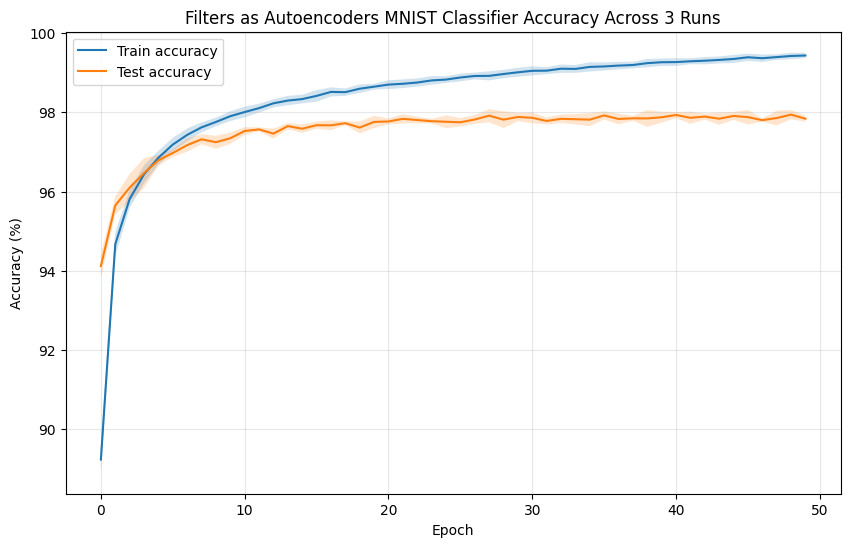

In [ ]:
epochs = np.arange(len(mean_acc))



plt.figure(figsize=(10, 6))

plt.plot(epochs, mean_acc, label="Train accuracy")
plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2
)

plt.plot(epochs, test_mean_acc, label="Test accuracy")
plt.fill_between(
    epochs,
    test_mean_acc - test_std_acc,
    test_mean_acc + test_std_acc,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Filters as Autoencoders MNIST Classifier Accuracy Across 3 Runs")

plt.legend()
plt.grid(alpha=0.3)
plt.show()

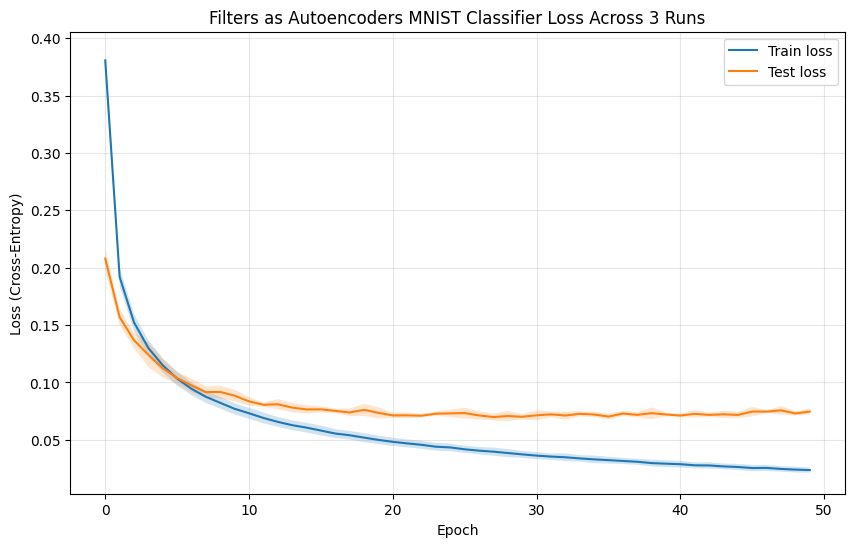

In [40]:

epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(10, 6))

plt.plot(epochs, task_mean_loss, label="Train loss")
plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2
)

plt.plot(epochs, test_task_mean_loss, label="Test loss")
plt.fill_between(
    epochs,
    test_task_mean_loss - test_task_std_loss,
    test_task_mean_loss + test_task_std_loss,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross-Entropy)")
plt.title("Filters as Autoencoders MNIST Classifier Loss Across 3 Runs")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

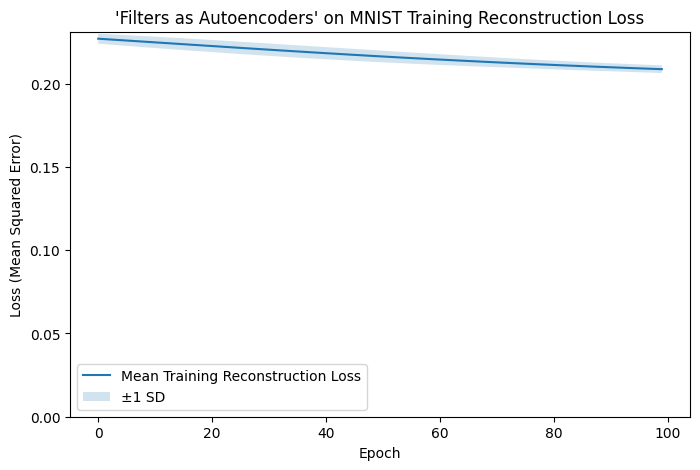

In [41]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Reconstruction Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' on MNIST Training Reconstruction Loss")
plt.show()

In [42]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 106.033203125
All peak memories (including the warm up run):


[105.77734375, 106.033203125, 106.033203125]

In [45]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
print(times) #exluding the first run
print(run_times)

Mean training time for 100 epochs over the 10 runs: 1460.5301118045002 
All training times for the 100 epochs over the 10 runs:
[1448.32648928 1472.73373433]
[1455.764245457, 1448.3264892780003, 1472.733734331]


In [ ]:
print(f"Max avg train accuracy: {classifier_df["mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max (not to be compared with our average best result for the hebb models)

print(" " \
"")
print(f"Max avg test accuracy: {classifier_df["test_mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max

print(" " \
"")
print(f"Min train avg Loss: {classifier_df["task_mean_loss"].min():.2f}")

print(" " \
"")
print(f"Min avg Encoder Loss: {ae_df["encoder_mean_loss"].min():.2f} (to 10 dp: {ae_df["encoder_mean_loss"].min():.10f})")


Max avg train accuracy: 99.44
 
Max avg test accuracy: 97.94
 
Min train avg Loss: 0.02
 
Min avg Encoder Loss: 0.21 (to 10 dp: 0.2086238569)


In [121]:
print(f"final train mean accuracy: {classifier_df["mean_accuracy"][49]:.2f}")
print(f"final test mean accuracy: {classifier_df["test_mean_accuracy"][49]:.2f}")


final train mean accuracy: 99.44
final test mean accuracy: 97.84


In [ ]:
#where std is deviation across runs
print(f"the above train accuracy with std: {classifier_df['std_accuracy'][49]:.2f}")
print(f"the above test accuracy with std: {classifier_df['test_std_accuracy'][49]:.2f}")


the above train accuracy with std: 0.07
the above test accuracy with std: 0.08


In [ ]:
#average over final 10 epochs: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][39:49]):.2f} ± {np.std(classifier_df["mean_accuracy"][39:49]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][39:49]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][39:49]):.2f}%")


average train mean accuracy final 10 epochs: 99.34 ± 0.05%
average test mean accuracy final 10 epochs: 97.88 ± 0.04%


# Examine for 50 AE epochs

In [159]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(3): # 3 runs

    print(f"model run: {seed}")


    model, training_history,test_history, elapsed = nan_cnn_experiment.train_niave_linear_weight_share_nan_cnn(
        mnist_train,
        mnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,   
        n_ae_epochs=50,      
        n_classifier_epochs=50,
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_train_loss"])
    all_accuracy_test_histories.append(test_history["train_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/50], Encoder Training Loss: 0.2234
Epoch [2/50], Encoder Training Loss: 0.2232
Epoch [3/50], Encoder Training Loss: 0.2229
Epoch [4/50], Encoder Training Loss: 0.2226
Epoch [5/50], Encoder Training Loss: 0.2223
Epoch [6/50], Encoder Training Loss: 0.2220
Epoch [7/50], Encoder Training Loss: 0.2218
Epoch [8/50], Encoder Training Loss: 0.2215
Epoch [9/50], Encoder Training Loss: 0.2212
Epoch [10/50], Encoder Training Loss: 0.2209
Epoch [11/50], Encoder Training Loss: 0.2207
Epoch [12/50], Encoder Training Loss: 0.2204
Epoch [13/50], Encoder Training Loss: 0.2202
Epoch [14/50], Encoder Training Loss: 0.2199
Epoch [15/50], Encoder Training Loss: 0.2196
Epoch [16/50], Encoder Training Loss: 0.2194
Epoch [17/50], Encoder Training Loss: 0.2191
Epoch [18/50], Encoder Training Loss: 0.2189
Epoch [19/50], Encoder Training Loss: 0.2186
Epoch [20/50], Encoder Training Loss: 0.2184
Epoch [21/50], Encoder Training Loss: 0.2182
Epoch [22/50], Encod

In [160]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories)
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories)
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories)
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg test task loss
test_task_losses = np.array(all_task_test_histories)
test_task_mean_loss = test_task_losses.mean(axis=0)
test_task_std_loss  = test_task_losses.std(axis=0)


#avg test accuracy
test_accuracies = np.array(all_accuracy_test_histories)
test_mean_acc = test_accuracies.mean(axis=0)
test_std_acc  = test_accuracies.std(axis=0)


#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


ae_epochs= np.arange(1, len(encoder_mean_loss)+1)

epochs = np.arange(1, len(task_mean_loss)+1)



In [161]:
ae_df = pd.DataFrame({
    "epoch": ae_epochs,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})


classifier_df = pd.DataFrame({
    #train
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,

    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,

    #test
    "test_mean_loss": test_task_mean_loss,
    "test_task_std_loss" : test_task_std_loss,

    "test_mean_accuracy": test_mean_acc,
    "test_std_accuracy": test_std_acc
})

In [162]:
ae_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_50updates_ae_epoch_results.csv",
    index=False,
)

In [163]:
classifier_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_50updates_classifer_epoch_results.csv",
    index=False,
)

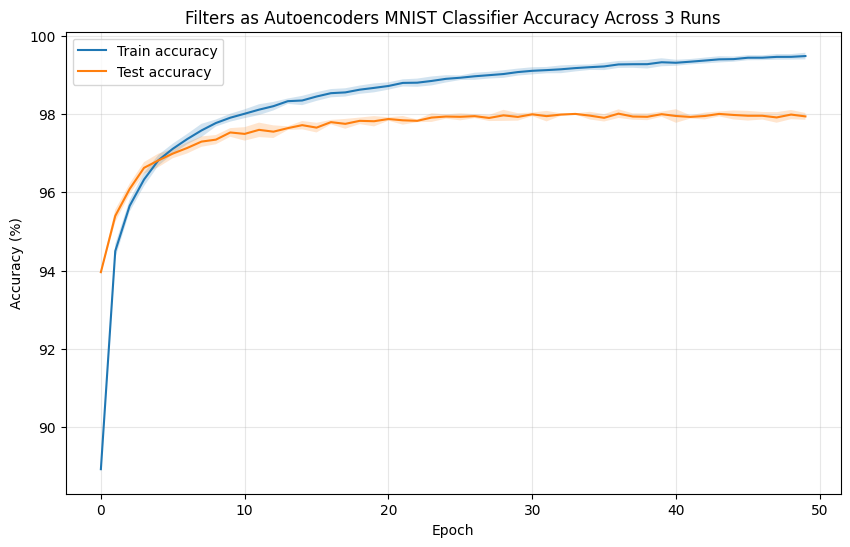

In [164]:
epochs = np.arange(len(mean_acc))



plt.figure(figsize=(10, 6))

plt.plot(epochs, mean_acc, label="Train accuracy")
plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2
)

plt.plot(epochs, test_mean_acc, label="Test accuracy")
plt.fill_between(
    epochs,
    test_mean_acc - test_std_acc,
    test_mean_acc + test_std_acc,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Filters as Autoencoders MNIST Classifier Accuracy Across 3 Runs")

plt.legend()
plt.grid(alpha=0.3)
plt.show()

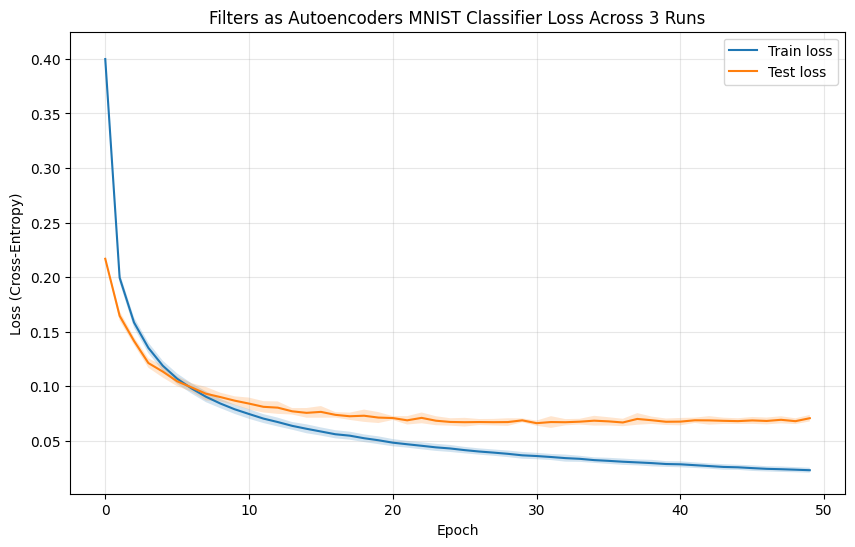

In [165]:

epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(10, 6))

plt.plot(epochs, task_mean_loss, label="Train loss")
plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2
)

plt.plot(epochs, test_task_mean_loss, label="Test loss")
plt.fill_between(
    epochs,
    test_task_mean_loss - test_task_std_loss,
    test_task_mean_loss + test_task_std_loss,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross-Entropy)")
plt.title("Filters as Autoencoders MNIST Classifier Loss Across 3 Runs")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

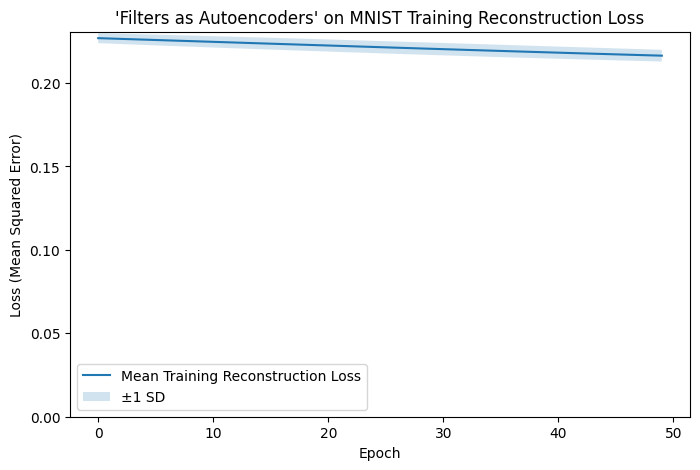

In [166]:
epochs = np.arange(len(encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, encoder_mean_loss,label="Mean Training Reconstruction Loss")

plt.fill_between(
    epochs,
    encoder_mean_loss - encoder_std_loss,
    encoder_mean_loss + encoder_std_loss,
    alpha=0.2,
    label="±1 SD"
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Mean Squared Error)")
plt.legend()
plt.ylim(bottom=0)
plt.title("'Filters as Autoencoders' on MNIST Training Reconstruction Loss")
plt.show()

In [167]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 103.58447265625
All peak memories (including the warm up run):


[103.58447265625, 103.58447265625, 103.58447265625]

In [168]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
print(times) #exluding the first run
print(run_times)

Mean training time for 100 epochs over the 10 runs: 965.3780188819992 
All training times for the 100 epochs over the 10 runs:
[961.5295057  969.22653206]
[963.5672275049983, 961.5295057049989, 969.2265320589995]


In [169]:
print(f"Max avg train accuracy: {classifier_df["mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max (not to be compared with our average best result for the hebb models)

print(" " \
"")
print(f"Max avg test accuracy: {classifier_df["test_mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max

print(" " \
"")
print(f"Min train avg Loss: {classifier_df["task_mean_loss"].min():.2f}")

print(" " \
"")
print(f"Min avg Encoder Loss: {ae_df["encoder_mean_loss"].min():.2f} (to 10 dp: {ae_df["encoder_mean_loss"].min():.10f})")

Max avg train accuracy: 99.48
 
Max avg test accuracy: 98.01
 
Min train avg Loss: 0.02
 
Min avg Encoder Loss: 0.22 (to 10 dp: 0.2164216842)


In [170]:
print(f"final train mean accuracy: {classifier_df["mean_accuracy"][49]:.2f}")
print(f"final test mean accuracy: {classifier_df["test_mean_accuracy"][49]:.2f}")


final train mean accuracy: 99.48
final test mean accuracy: 97.94


In [171]:
#where std is deviation across runs
print(f"the above train accuracy with std: {classifier_df['std_accuracy'][49]:.2f}")
print(f"the above test accuracy with std: {classifier_df['test_std_accuracy'][49]:.2f}")


the above train accuracy with std: 0.09
the above test accuracy with std: 0.09


In [172]:
#average over final 10 epochs: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][39:49]):.2f} ± {np.std(classifier_df["mean_accuracy"][39:49]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][39:49]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][39:49]):.2f}%")

average train mean accuracy final 10 epochs: 99.39 ± 0.05%
average test mean accuracy final 10 epochs: 97.96 ± 0.03%


In [173]:
#average over epochs 20 to 30: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["mean_accuracy"][19:29]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][19:29]):.2f}%")

average train mean accuracy final 10 epochs: 98.86 ± 0.11%
average test mean accuracy final 10 epochs: 97.89 ± 0.05%


# Examine for 1 AE epochs

In [174]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(3): # 3 runs

    print(f"model run: {seed}")


    model, training_history,test_history, elapsed = nan_cnn_experiment.train_niave_linear_weight_share_nan_cnn(
        mnist_train,
        mnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,   
        n_ae_epochs=1,      
        n_classifier_epochs=50,
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_train_loss"])
    all_accuracy_test_histories.append(test_history["train_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/1], Encoder Training Loss: 0.2234
Training classifier...
Epoch [1/50], Task Training Loss: 0.4054, Accuracy: 88.86, Task Test Loss: 0.21597602046094835, Task Test Accuracy: 94.1%
Epoch [2/50], Task Training Loss: 0.1976, Accuracy: 94.55, Task Test Loss: 0.16186016236897557, Task Test Accuracy: 95.57%
Epoch [3/50], Task Training Loss: 0.1579, Accuracy: 95.67, Task Test Loss: 0.13787651252932848, Task Test Accuracy: 96.24%
Epoch [4/50], Task Training Loss: 0.1331, Accuracy: 96.42, Task Test Loss: 0.12602609049063176, Task Test Accuracy: 96.47%
Epoch [5/50], Task Training Loss: 0.1173, Accuracy: 96.87, Task Test Loss: 0.11167153434362262, Task Test Accuracy: 96.88%
Epoch [6/50], Task Training Loss: 0.1057, Accuracy: 97.17, Task Test Loss: 0.1077391417697072, Task Test Accuracy: 97.04%
Epoch [7/50], Task Training Loss: 0.0956, Accuracy: 97.46, Task Test Loss: 0.09513845026958734, Task Test Accuracy: 97.32%
Epoch [8/50], Task Training Los

In [175]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories)
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories)
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories)
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg test task loss
test_task_losses = np.array(all_task_test_histories)
test_task_mean_loss = test_task_losses.mean(axis=0)
test_task_std_loss  = test_task_losses.std(axis=0)


#avg test accuracy
test_accuracies = np.array(all_accuracy_test_histories)
test_mean_acc = test_accuracies.mean(axis=0)
test_std_acc  = test_accuracies.std(axis=0)


#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


ae_epochs= np.arange(1, len(encoder_mean_loss)+1)

epochs = np.arange(1, len(task_mean_loss)+1)



In [176]:
ae_df = pd.DataFrame({
    "epoch": ae_epochs,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})


classifier_df = pd.DataFrame({
    #train
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,

    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,

    #test
    "test_mean_loss": test_task_mean_loss,
    "test_task_std_loss" : test_task_std_loss,

    "test_mean_accuracy": test_mean_acc,
    "test_std_accuracy": test_std_acc



    
})

In [177]:
ae_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_ae_epoch_results.csv",
    index=False,
)

In [178]:
classifier_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update__classifer_epoch_results.csv",
    index=False,
)

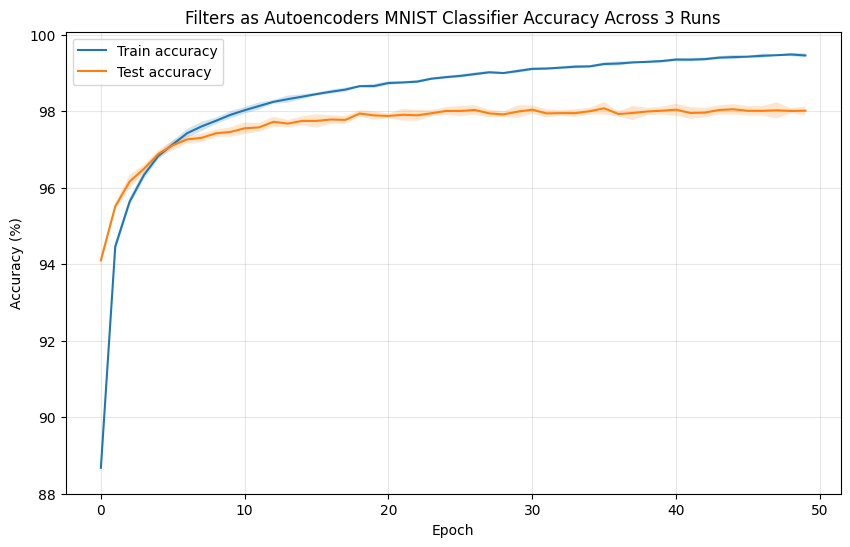

In [179]:
epochs = np.arange(len(mean_acc))



plt.figure(figsize=(10, 6))

plt.plot(epochs, mean_acc, label="Train accuracy")
plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2
)

plt.plot(epochs, test_mean_acc, label="Test accuracy")
plt.fill_between(
    epochs,
    test_mean_acc - test_std_acc,
    test_mean_acc + test_std_acc,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Filters as Autoencoders MNIST Classifier Accuracy Across 3 Runs")

plt.legend()
plt.grid(alpha=0.3)
plt.show()

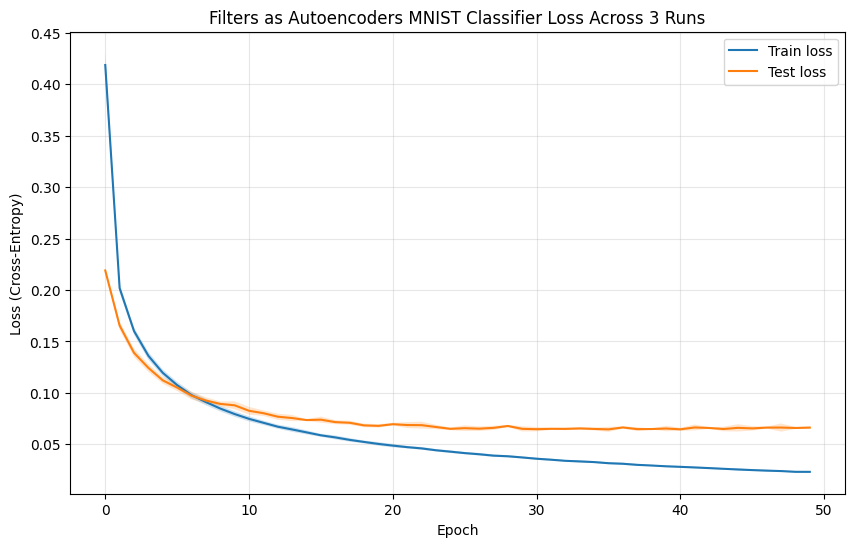

In [180]:

epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(10, 6))

plt.plot(epochs, task_mean_loss, label="Train loss")
plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2
)

plt.plot(epochs, test_task_mean_loss, label="Test loss")
plt.fill_between(
    epochs,
    test_task_mean_loss - test_task_std_loss,
    test_task_mean_loss + test_task_std_loss,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross-Entropy)")
plt.title("Filters as Autoencoders MNIST Classifier Loss Across 3 Runs")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [182]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 103.58447265625
All peak memories (including the warm up run):


[103.58447265625, 103.58447265625, 103.58447265625]

In [183]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
print(times) #exluding the first run
print(run_times)

Mean training time for 100 epochs over the 10 runs: 438.2739765790002 
All training times for the 100 epochs over the 10 runs:
[435.11818778 441.42976538]
[438.40042221899967, 435.1181877779982, 441.4297653800022]


In [184]:
print(f"Max avg train accuracy: {classifier_df["mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max (not to be compared with our average best result for the hebb models)

print(" " \
"")
print(f"Max avg test accuracy: {classifier_df["test_mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max

print(" " \
"")
print(f"Min train avg Loss: {classifier_df["task_mean_loss"].min():.2f}")

print(" " \
"")
print(f"Min avg Encoder Loss: {ae_df["encoder_mean_loss"].min():.2f} (to 10 dp: {ae_df["encoder_mean_loss"].min():.10f})")

Max avg train accuracy: 99.48
 
Max avg test accuracy: 98.08
 
Min train avg Loss: 0.02
 
Min avg Encoder Loss: 0.23 (to 10 dp: 0.2269223372)


In [185]:
print(f"final train mean accuracy: {classifier_df["mean_accuracy"][49]:.2f}")
print(f"final test mean accuracy: {classifier_df["test_mean_accuracy"][49]:.2f}")


final train mean accuracy: 99.46
final test mean accuracy: 98.01


In [186]:
#where std is deviation across runs
print(f"the above train accuracy with std: {classifier_df['std_accuracy'][49]:.2f}")
print(f"the above test accuracy with std: {classifier_df['test_std_accuracy'][49]:.2f}")

the above train accuracy with std: 0.05
the above test accuracy with std: 0.12


In [187]:
#average over final 10 epochs: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][39:49]):.2f} ± {np.std(classifier_df["mean_accuracy"][39:49]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][39:49]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][39:49]):.2f}%")

average train mean accuracy final 10 epochs: 99.40 ± 0.05%
average test mean accuracy final 10 epochs: 98.01 ± 0.03%


In [188]:
#average over epochs 20 to 30: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["mean_accuracy"][19:29]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][19:29]):.2f}%")

average train mean accuracy final 10 epochs: 98.86 ± 0.12%
average test mean accuracy final 10 epochs: 97.94 ± 0.05%


# the 1 cell below is left for future work
# Compare to the parallel results on the test:

# todo Does the above linear version perform better than the parallel version, where the parrallel version also evaluates the test set?

In [ ]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(3): # 3 runs

    print(f"model run: {seed}")


    model, training_history,test_history, elapsed = nan_cnn_experiment.train_and_eval_weight_share_nan_cnn(
        mnist_train,
        mnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,   
        #n_ae_epochs=10,      
        #n_classifier_epochs=50,
        n_epochs=50,
        batch_size=256,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_train_loss"])
    all_accuracy_test_histories.append(test_history["train_accuracy"])


    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

# Back to the linear versions but with batch size 64 (same as hebbian model)
### (inspecting this only so we introduce one major change at a time)

In [189]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(1): # 3 runs

    print(f"model run: {seed}")


    model, training_history,test_history, elapsed = nan_cnn_experiment.train_niave_linear_weight_share_nan_cnn(
        mnist_train,
        mnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,   
        n_ae_epochs=1,      
        n_classifier_epochs=50,
        batch_size=64,
        n_filters=16,
        stride=1,
        padding=1,
        kernel_size=3,
        pool_kernel_size=2,
        pool_stride=2,
        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_train_loss"])
    all_accuracy_test_histories.append(test_history["train_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/1], Encoder Training Loss: 0.2230
Training classifier...
Epoch [1/50], Task Training Loss: 0.2762, Accuracy: 92.15, Task Test Loss: 0.1592260799400366, Task Test Accuracy: 95.61%
Epoch [2/50], Task Training Loss: 0.1428, Accuracy: 95.99, Task Test Loss: 0.12303562169289513, Task Test Accuracy: 96.4%
Epoch [3/50], Task Training Loss: 0.1105, Accuracy: 96.97, Task Test Loss: 0.10966250495273311, Task Test Accuracy: 96.74%
Epoch [4/50], Task Training Loss: 0.0943, Accuracy: 97.37, Task Test Loss: 0.09134465249279028, Task Test Accuracy: 97.32%
Epoch [5/50], Task Training Loss: 0.0820, Accuracy: 97.71, Task Test Loss: 0.08477674187072048, Task Test Accuracy: 97.48%
Epoch [6/50], Task Training Loss: 0.0746, Accuracy: 97.90, Task Test Loss: 0.08568067585821056, Task Test Accuracy: 97.41%
Epoch [7/50], Task Training Loss: 0.0674, Accuracy: 98.07, Task Test Loss: 0.08607589582034689, Task Test Accuracy: 97.44%
Epoch [8/50], Task Training Los

# Same but with filters the same sizes as those in hebb

In [10]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]
peak_memory =[]
run_times= []

for seed in range(1): # just 1 run

    print(f"model run: {seed}")

    model, training_history,feature_history, elapsed = nan_cnn_experiment.train_niave_linear_weight_share_nan_cnn(
        mnist_train,
        mnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,
        #n_epochs=100,      
        n_ae_epochs=1,      
        n_classifier_epochs=30,
        batch_size=64,
        n_filters=16,

        stride=1,
        padding=2,
        kernel_size=5,

        pool_kernel_size=4,
        pool_stride=2,
        pool_padding=1,

        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])
    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/1], Encoder Training Loss: 0.2377
Training classifier...
Epoch [1/30], Task Training Loss: 0.2642, Accuracy: 92.27, Task Test Loss: 0.1244825523103451, Task Test Accuracy: 96.56%
Epoch [2/30], Task Training Loss: 0.1221, Accuracy: 96.42, Task Test Loss: 0.10178774003544526, Task Test Accuracy: 96.92%
Epoch [3/30], Task Training Loss: 0.0945, Accuracy: 97.26, Task Test Loss: 0.0878220624075372, Task Test Accuracy: 97.53%
Epoch [4/30], Task Training Loss: 0.0839, Accuracy: 97.53, Task Test Loss: 0.1026373138535578, Task Test Accuracy: 96.97%
Epoch [5/30], Task Training Loss: 0.0716, Accuracy: 97.81, Task Test Loss: 0.08187646990802115, Task Test Accuracy: 97.47%
Epoch [6/30], Task Training Loss: 0.0672, Accuracy: 97.94, Task Test Loss: 0.07162719629304543, Task Test Accuracy: 97.78%
Epoch [7/30], Task Training Loss: 0.0607, Accuracy: 98.10, Task Test Loss: 0.07534314620095027, Task Test Accuracy: 97.6%
Epoch [8/30], Task Training Loss:

# Now the same model, but annealing classifier lr over 5 runs...

### inspection of params

In [8]:
from src.models import weight_share_nan_cnn

In [9]:
#count how many params of the model for MNIST (and FMNIST)...

device = torch.device('cpu')

model = weight_share_nan_cnn.FilterCNN(
        input_dims=28,
        in_channels=1,

        kernel_size=5,
        stride=1,
        padding=2,

        n_filters=16,

        pool_padding=1,
        pool_kernel_size=4,
        pool_stride=2,

        bias=False,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))


filters.0.encoder.weight (1, 1, 5, 5) -> 25
filters.1.encoder.weight (1, 1, 5, 5) -> 25
filters.2.encoder.weight (1, 1, 5, 5) -> 25
filters.3.encoder.weight (1, 1, 5, 5) -> 25
filters.4.encoder.weight (1, 1, 5, 5) -> 25
filters.5.encoder.weight (1, 1, 5, 5) -> 25
filters.6.encoder.weight (1, 1, 5, 5) -> 25
filters.7.encoder.weight (1, 1, 5, 5) -> 25
filters.8.encoder.weight (1, 1, 5, 5) -> 25
filters.9.encoder.weight (1, 1, 5, 5) -> 25
filters.10.encoder.weight (1, 1, 5, 5) -> 25
filters.11.encoder.weight (1, 1, 5, 5) -> 25
filters.12.encoder.weight (1, 1, 5, 5) -> 25
filters.13.encoder.weight (1, 1, 5, 5) -> 25
filters.14.encoder.weight (1, 1, 5, 5) -> 25
filters.15.encoder.weight (1, 1, 5, 5) -> 25
fc.weight            (10, 3136) -> 31360
fc.bias              (10,) -> 10
31770


## Inspecting MACS

In [10]:
dummy = torch.randn(1, 1, 28, 28)

macs, params = profile(model, inputs=(dummy,))

print(f"MACs   : {macs:,}")

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.activation.ReLU'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.pooling.MaxPool2d'>.
[INFO] Register count_linear() for <class 'torch.nn.modules.linear.Linear'>.
MACs   : 344,960.0


In [14]:
print(f"The above gives the MACs of the forward computation (at inference), that is the classification, which excludes the decoding... In reality the model training as a whole is: \n")

print(f"The encoder: \n {profile(model.filters[0].encoder, inputs=(dummy,))} x 16 for the 16 feature maps \n +")

print(f"The decoder (uses the encoder weights): \n {profile(model.filters[0].encoder, inputs=(dummy,))} x 16 for the 16 feature maps \n +")

print(f"The fully connected layer: \n {profile(model.fc, inputs=(torch.randn(1,3136),))} \n =")


print(f"macs are {19600*2*16+31360}")



The above gives the MACs of the forward computation (at inference), that is the classification, which excludes the decoding... In reality the model training as a whole is: 

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
The encoder: 
 (19600.0, 0) x 16 for the 16 feature maps 
 +
[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv2d'>.
The decoder (uses the encoder weights): 
 (19600.0, 0) x 16 for the 16 feature maps 
 +
[INFO] Register count_linear() for <class 'torch.nn.modules.linear.Linear'>.
The fully connected layer: 
 (31360.0, 0) 
 =
macs are 658560


---------------------Explaining MACS for Autoencoding CNN---------------
<br>
for one filter: <br>
28x28 outputs x 5x5 kernels = 784 x 25 = 19,600
<br>
For the decoder it's the same = 19,600
<br>
so that's 19,600 x 2 x 16 for the 16 feature maps = 627,200
<br>
then the classifier does 3136×10 (for the flattened input for each class after pooling (14x14 feature maps x 16 = 3136))
<br>
so this gives 31,360 + 627,200 = 658,560
<br>
<br>
That is to say, one autoencoding cycle (training the feature extractor) per image costs 658,560 MACs for MNIST data, and training the classifier/ using the model for inference costs 344,960 MACs...
<br>
And of course 344,960 MACs is the cost of training a standard CNN (and the same for inference) under the same parameters (kernel sizes, padding, stride etc), since there is no decoder layer

In [ ]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(5): 

    print(f"model run: {seed}")


    model, training_history, test_history, elapsed = nan_cnn_experiment.train_annealing_linear_weight_share_nan_cnn(
        mnist_train,
        mnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,   
        n_ae_epochs=1,      
        n_classifier_epochs=30,
        batch_size=64,
        n_filters=16,

        stride=1,
        padding=2,
        kernel_size=5,

        pool_kernel_size=4,
        pool_stride=2,
        pool_padding=1,

        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_loss"])
    all_accuracy_test_histories.append(test_history["task_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/1], Encoder Training Loss: 0.2377
Training classifier...
Epoch [1/30], Task Training Loss: 0.2642, Accuracy: 92.27%, Task Test Loss: 0.1244825523103451, Task Test Accuracy: 96.56% LR: 0.001000
Epoch [2/30], Task Training Loss: 0.1221, Accuracy: 96.42%, Task Test Loss: 0.10178774003544526, Task Test Accuracy: 96.92% LR: 0.001000
Epoch [3/30], Task Training Loss: 0.0945, Accuracy: 97.26%, Task Test Loss: 0.0878220624075372, Task Test Accuracy: 97.53% LR: 0.001000
Epoch [4/30], Task Training Loss: 0.0839, Accuracy: 97.53%, Task Test Loss: 0.1026373138535578, Task Test Accuracy: 96.97% LR: 0.001000
Epoch [5/30], Task Training Loss: 0.0716, Accuracy: 97.81%, Task Test Loss: 0.08187646990802115, Task Test Accuracy: 97.47% LR: 0.001000
Epoch [6/30], Task Training Loss: 0.0672, Accuracy: 97.94%, Task Test Loss: 0.07162719629304543, Task Test Accuracy: 97.78% LR: 0.001000
Epoch [7/30], Task Training Loss: 0.0607, Accuracy: 98.10%, Task Test L

In [2]:
# getting at last 10 epochs manually for inspection

run1=[ 98.51, 98.49, 98.51, 98.47, 98.52, 98.48, 98.5, 98.51, 98.48, 98.48]
run2=[98.74, 98.71, 98.69, 98.69, 98.74, 98.76, 98.73, 98.74, 98.74, 98.73]
run3=[98.53, 98.55, 98.55, 98.5, 98.54, 98.55, 98.55, 98.51, 98.51, 98.5]
run4=[98.65, 98.63, 98.64, 98.64, 98.63, 98.64, 98.63, 98.65, 98.62, 98.63]
run5=[98.62, 98.64, 98.67, 98.63, 98.62, 98.63, 98.63, 98.63, 98.63, 98.64]

In [15]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories)
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories)
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories)
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg test task loss
test_task_losses = np.array(all_task_test_histories)
test_task_mean_loss = test_task_losses.mean(axis=0)
test_task_std_loss  = test_task_losses.std(axis=0)


#avg test accuracy
test_accuracies = np.array(all_accuracy_test_histories)
test_mean_acc = test_accuracies.mean(axis=0)
test_std_acc  = test_accuracies.std(axis=0)


#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


ae_epochs= np.arange(1, len(encoder_mean_loss)+1)

epochs = np.arange(1, len(task_mean_loss)+1)



In [16]:
ae_df = pd.DataFrame({
    "epoch": ae_epochs,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})


classifier_df = pd.DataFrame({
    #train
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,

    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,

    #test
    "test_mean_loss": test_task_mean_loss,
    "test_task_std_loss" : test_task_std_loss,

    "test_mean_accuracy": test_mean_acc,
    "test_std_accuracy": test_std_acc


})

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
ae_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal_ae_epoch_results.csv",
    index=False,
)

In [19]:
classifier_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal__classifer_epoch_results.csv",
    index=False,
)

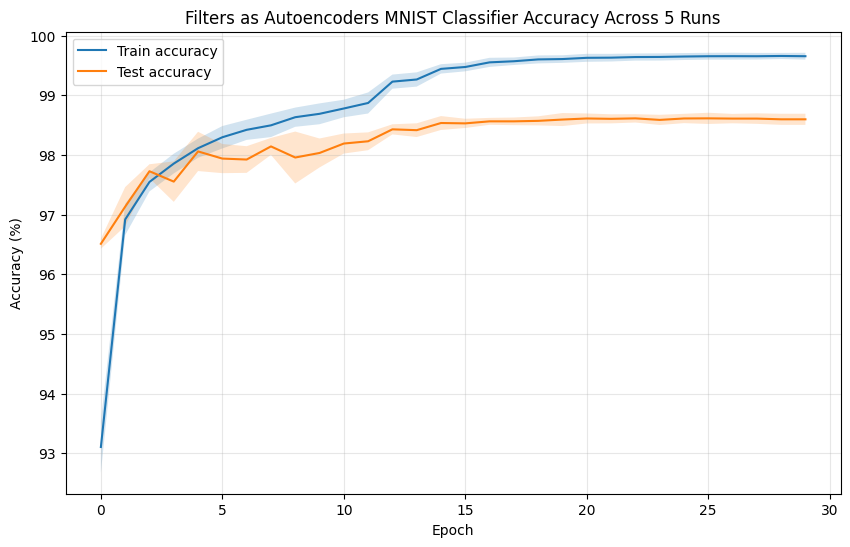

In [ ]:
epochs = np.arange(len(mean_acc))



plt.figure(figsize=(10, 6))

plt.plot(epochs, mean_acc, label="Train accuracy")
plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2
)

plt.plot(epochs, test_mean_acc, label="Test accuracy")
plt.fill_between(
    epochs,
    test_mean_acc - test_std_acc,
    test_mean_acc + test_std_acc,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Filters as Autoencoders MNIST Classifier Accuracy Across 5 Runs")

plt.legend()
plt.grid(alpha=0.3)
plt.show()

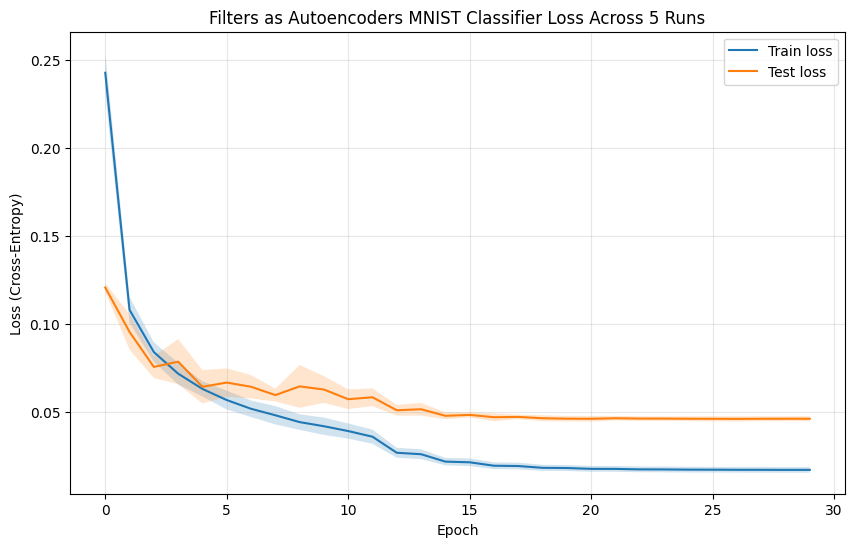

In [ ]:

epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(10, 6))

plt.plot(epochs, task_mean_loss, label="Train loss")
plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2
)

plt.plot(epochs, test_task_mean_loss, label="Test loss")
plt.fill_between(
    epochs,
    test_task_mean_loss - test_task_std_loss,
    test_task_mean_loss + test_task_std_loss,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross-Entropy)")
plt.title("Filters as Autoencoders MNIST Classifier Loss Across 5 Runs")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [22]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 75.24609375
All peak memories (including the warm up run):


[75.24609375, 75.24609375, 75.24609375, 75.24609375, 75.24609375]

In [23]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
print(times) #exluding the first run
print(run_times)

Mean training time for 100 epochs over the 10 runs: 387.14028499024994 
All training times for the 100 epochs over the 10 runs:
[384.28152613 384.35052398 390.43741418 389.49167567]
[381.0692781130001, 384.28152613400016, 384.35052397599975, 390.43741417599995, 389.4916756749999]


In [24]:
print(f"Max avg train accuracy: {classifier_df["mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max (not to be compared with our average best result for the hebb models)

print(" " \
"")
print(f"Max avg test accuracy: {classifier_df["test_mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max

print(" " \
"")
print(f"Min train avg Loss: {classifier_df["task_mean_loss"].min():.2f}")

print(" " \
"")
print(f"Min avg Encoder Loss: {ae_df["encoder_mean_loss"].min():.2f} (to 10 dp: {ae_df["encoder_mean_loss"].min():.10f})")

Max avg train accuracy: 99.66
 
Max avg test accuracy: 98.61
 
Min train avg Loss: 0.02
 
Min avg Encoder Loss: 0.23 (to 10 dp: 0.2285209158)


In [26]:
print(f"final train mean accuracy: {classifier_df["mean_accuracy"][29]:.2f}")
print(f"final test mean accuracy: {classifier_df["test_mean_accuracy"][29]:.2f}")


final train mean accuracy: 99.65
final test mean accuracy: 98.60


In [27]:
#where std is deviation across runs
print(f"the above train accuracy with std: {classifier_df['std_accuracy'][29]:.2f}")
print(f"the above test accuracy with std: {classifier_df['test_std_accuracy'][29]:.2f}")

the above train accuracy with std: 0.06
the above test accuracy with std: 0.09


In [28]:
#average over final 10 epochs: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["mean_accuracy"][19:29]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][19:29]):.2f}%")

average train mean accuracy final 10 epochs: 99.64 ± 0.02%
average test mean accuracy final 10 epochs: 98.60 ± 0.01%


In [3]:
runs = np.array([run1, run2, run3, run4, run5])

# Mean accuracy over the final 10 epochs for each run
run_means = np.mean(runs, axis=1)

# Overall mean and standard deviation across runs
mean = np.mean(run_means)
std = np.std(run_means)

print(f"Final 10 epochs: {mean:.2f} ± {std:.2f}%")

Final 10 epochs: 98.60 ± 0.08%


# 5 Runs on FMNIST

### Getting data

In [9]:
#getting data with minimal preprocessing

fmnist_root = "../datasets/fmnist"

base_transform = transforms.ToTensor()

fmnist_train = datasets.FashionMNIST(
    root=fmnist_root,
    train=True,
    download=True,
    transform=base_transform
)

fmnist_test = datasets.FashionMNIST(
    root=fmnist_root,
    train=False,
    download=True,
    transform=base_transform
)

100%|██████████| 26.4M/26.4M [00:02<00:00, 13.0MB/s]
100%|██████████| 29.5k/29.5k [00:00<00:00, 204kB/s]
100%|██████████| 4.42M/4.42M [00:01<00:00, 3.78MB/s]
100%|██████████| 5.15k/5.15k [00:00<00:00, 22.1MB/s]


In [ ]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(5): 

    print(f"model run: {seed}")


    model, training_history, test_history, elapsed = nan_cnn_experiment.train_annealing_linear_weight_share_nan_cnn(
        fmnist_train,
        fmnist_test,
        input_dims=28,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001,
        bias=False,   
        n_ae_epochs=1,      
        n_classifier_epochs=30,
        batch_size=64,
        n_filters=16,

        stride=1,
        padding=2,
        kernel_size=5,

        pool_kernel_size=4,
        pool_stride=2,
        pool_padding=1,

        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_loss"])
    all_accuracy_test_histories.append(test_history["task_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/1], Encoder Training Loss: 0.1796
Training classifier...
Epoch [1/30], Task Training Loss: 0.4960, Accuracy: 82.42%, Task Test Loss: 0.531305129930472, Task Test Accuracy: 80.39% LR: 0.001000
Epoch [2/30], Task Training Loss: 0.3858, Accuracy: 86.32%, Task Test Loss: 0.38495488692620755, Task Test Accuracy: 86.04% LR: 0.001000
Epoch [3/30], Task Training Loss: 0.3548, Accuracy: 87.53%, Task Test Loss: 0.40758217833224375, Task Test Accuracy: 86.18% LR: 0.001000
Epoch [4/30], Task Training Loss: 0.3380, Accuracy: 88.16%, Task Test Loss: 0.4045422945622426, Task Test Accuracy: 85.52% LR: 0.001000
Epoch [5/30], Task Training Loss: 0.3228, Accuracy: 88.48%, Task Test Loss: 0.34591551580626495, Task Test Accuracy: 87.07% LR: 0.001000
Epoch [6/30], Task Training Loss: 0.3115, Accuracy: 89.03%, Task Test Loss: 0.3829529032965375, Task Test Accuracy: 87.07% LR: 0.001000
Epoch [7/30], Task Training Loss: 0.3109, Accuracy: 88.97%, Task Test Lo

In [4]:
run1=[89.89, 89.8, 89.98, 89.95, 89.93, 90.02, 89.92, 89.9, 89.86, 89.88]
run2=[ 90.1, 90.26, 90.17, 90.29, 90.24, 90.2, 90.21, 90.2, 90.19, 90.21]
run3=[89.94, 89.95, 90.08, 89.97, 89.98, 90.07, 89.99, 89.95, 90.04, 90.03]
run4=[89.9, 90.06, 89.92, 89.98, 90.08, 90.02, 90.0, 90.03, 90.01, 89.97]
run5=[ 90.17, 90.14, 90.15, 90.06, 90.09, 90.1, 90.14, 90.1, 90.04, 90.1]


In [11]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories)
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories)
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories)
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg test task loss
test_task_losses = np.array(all_task_test_histories)
test_task_mean_loss = test_task_losses.mean(axis=0)
test_task_std_loss  = test_task_losses.std(axis=0)


#avg test accuracy
test_accuracies = np.array(all_accuracy_test_histories)
test_mean_acc = test_accuracies.mean(axis=0)
test_std_acc  = test_accuracies.std(axis=0)


#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


ae_epochs= np.arange(1, len(encoder_mean_loss)+1)

epochs = np.arange(1, len(task_mean_loss)+1)



In [12]:
ae_df = pd.DataFrame({
    "epoch": ae_epochs,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})


classifier_df = pd.DataFrame({
    #train
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,

    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,

    #test
    "test_mean_loss": test_task_mean_loss,
    "test_task_std_loss" : test_task_std_loss,

    "test_mean_accuracy": test_mean_acc,
    "test_std_accuracy": test_std_acc


})

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
ae_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal_fmnist_ae_epoch_results.csv",
    index=False,
)

In [15]:
classifier_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal__fmnist_classifer_epoch_results.csv",
    index=False,
)

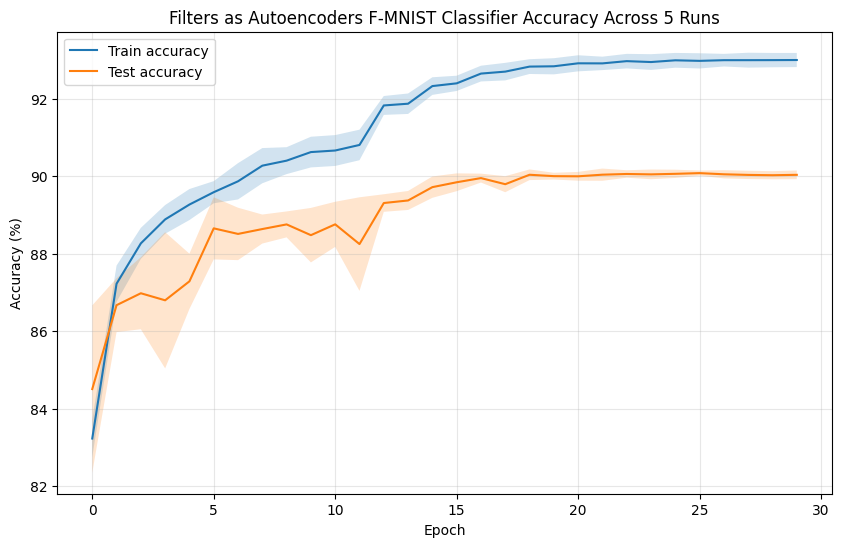

In [16]:
epochs = np.arange(len(mean_acc))



plt.figure(figsize=(10, 6))

plt.plot(epochs, mean_acc, label="Train accuracy")
plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2
)

plt.plot(epochs, test_mean_acc, label="Test accuracy")
plt.fill_between(
    epochs,
    test_mean_acc - test_std_acc,
    test_mean_acc + test_std_acc,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Filters as Autoencoders F-MNIST Classifier Accuracy Across 5 Runs")

plt.legend()
plt.grid(alpha=0.3)
plt.show()

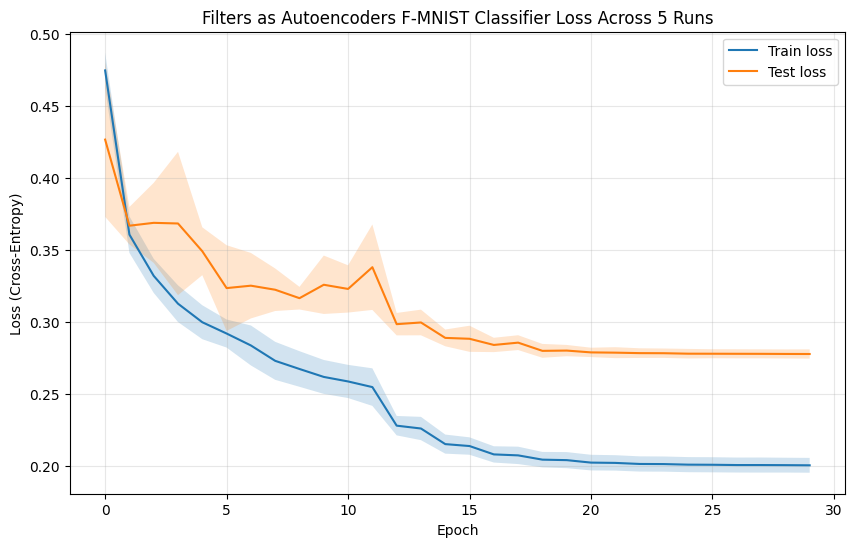

In [17]:

epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(10, 6))

plt.plot(epochs, task_mean_loss, label="Train loss")
plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2
)

plt.plot(epochs, test_task_mean_loss, label="Test loss")
plt.fill_between(
    epochs,
    test_task_mean_loss - test_task_std_loss,
    test_task_mean_loss + test_task_std_loss,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross-Entropy)")
plt.title("Filters as Autoencoders F-MNIST Classifier Loss Across 5 Runs")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [18]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 75.24609375
All peak memories (including the warm up run):


[74.990234375, 75.24609375, 75.24609375, 75.24609375, 75.24609375]

In [19]:
print(f"Mean training time for 100 epochs over the 10 runs: {mean_runtime} ")
print(f"All training times for the 100 epochs over the 10 runs:")
print(times) #exluding the first run
print(run_times)

Mean training time for 100 epochs over the 10 runs: 353.33560028025 
All training times for the 100 epochs over the 10 runs:
[354.14745611 352.89717213 355.58718634 350.71058654]
[358.39979724899996, 354.147456109, 352.8971721339999, 355.58718634, 350.7105865379999]


In [20]:
print(f"Max avg train accuracy: {classifier_df["mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max (not to be compared with our average best result for the hebb models)

print(" " \
"")
print(f"Max avg test accuracy: {classifier_df["test_mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max

print(" " \
"")
print(f"Min train avg Loss: {classifier_df["task_mean_loss"].min():.2f}")

print(" " \
"")
print(f"Min avg Encoder Loss: {ae_df["encoder_mean_loss"].min():.2f} (to 10 dp: {ae_df["encoder_mean_loss"].min():.10f})")

Max avg train accuracy: 93.00
 
Max avg test accuracy: 90.08
 
Min train avg Loss: 0.20
 
Min avg Encoder Loss: 0.17 (to 10 dp: 0.1709667889)


In [21]:
print(f"final train mean accuracy: {classifier_df["mean_accuracy"][29]:.2f}")
print(f"final test mean accuracy: {classifier_df["test_mean_accuracy"][29]:.2f}")


final train mean accuracy: 93.00
final test mean accuracy: 90.04


In [22]:
#where std is deviation across runs
print(f"the above train accuracy with std: {classifier_df['std_accuracy'][29]:.2f}")
print(f"the above test accuracy with std: {classifier_df['test_std_accuracy'][29]:.2f}")

the above train accuracy with std: 0.18
the above test accuracy with std: 0.11


In [23]:
#average over final 10 epochs: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["mean_accuracy"][19:29]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][19:29]):.2f}%")

average train mean accuracy final 10 epochs: 92.96 ± 0.05%
average test mean accuracy final 10 epochs: 90.04 ± 0.02%


In [5]:
runs = np.array([run1, run2, run3, run4, run5])

# Mean accuracy over the final 10 epochs for each run
run_means = np.mean(runs, axis=1)

# Overall mean and standard deviation across runs
mean = np.mean(run_means)
std = np.std(run_means)

print(f"Final 10 epochs: {mean:.2f} ± {std:.2f}%")

Final 10 epochs: 90.05 ± 0.10%


# 5 Runs on CIFAR-10

In [11]:
#count how many params of the model for CIFAR10

device = torch.device('cpu')

model = weight_share_nan_cnn.FilterCNN(
        input_dims=32,
        in_channels=3,

        kernel_size=5,
        stride=1,
        padding=2,

        n_filters=16,

        pool_padding=1,
        pool_kernel_size=4,
        pool_stride=2,

        bias=False,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))


filters.0.encoder.weight (1, 3, 5, 5) -> 75
filters.1.encoder.weight (1, 3, 5, 5) -> 75
filters.2.encoder.weight (1, 3, 5, 5) -> 75
filters.3.encoder.weight (1, 3, 5, 5) -> 75
filters.4.encoder.weight (1, 3, 5, 5) -> 75
filters.5.encoder.weight (1, 3, 5, 5) -> 75
filters.6.encoder.weight (1, 3, 5, 5) -> 75
filters.7.encoder.weight (1, 3, 5, 5) -> 75
filters.8.encoder.weight (1, 3, 5, 5) -> 75
filters.9.encoder.weight (1, 3, 5, 5) -> 75
filters.10.encoder.weight (1, 3, 5, 5) -> 75
filters.11.encoder.weight (1, 3, 5, 5) -> 75
filters.12.encoder.weight (1, 3, 5, 5) -> 75
filters.13.encoder.weight (1, 3, 5, 5) -> 75
filters.14.encoder.weight (1, 3, 5, 5) -> 75
filters.15.encoder.weight (1, 3, 5, 5) -> 75
fc.weight            (10, 4096) -> 40960
fc.bias              (10,) -> 10
42170


In [19]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ayush1220/cifar10")

print("Path to dataset files:", path)

100%|██████████| 139M/139M [00:07<00:00, 18.4MB/s] 

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ayush1220/cifar10/versions/2


In [20]:
print(os.listdir(path))

['cifar10']


In [21]:
cifar_path = os.path.join(path, "cifar10")

In [22]:
cifar_train_path = os.path.join(cifar_path,"train")

In [23]:
cifar_test_path = os.path.join(cifar_path,"test")

In [24]:
final_transform = transforms.Compose([
    transforms.ToTensor()
])

In [25]:
train_dataset = datasets.ImageFolder(
    root=cifar_train_path,
    transform=final_transform
)

test_dataset = datasets.ImageFolder(
    root=cifar_test_path,
    transform=final_transform
)

In [ ]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(5): 

    print(f"model run: {seed}")


    model, training_history, test_history, elapsed = nan_cnn_experiment.train_annealing_linear_weight_share_nan_cnn(
        train_dataset,
        test_dataset,
        input_dims=32,
        in_channels=3,
        dual_lr=True,
        classifier_lr=0.001,
        #ae_lr=0.00001,
        ae_lr=0.000001, # using  smaller learning rate for cifar-10 as previously found to increase training accuracy

        bias=False,   
        n_ae_epochs=1,      
        n_classifier_epochs=30,
        batch_size=64,
        n_filters=16,

        stride=1,
        padding=2,
        kernel_size=5,

        pool_kernel_size=4,
        pool_stride=2,
        pool_padding=1,

        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_loss"])
    all_accuracy_test_histories.append(test_history["task_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/1], Encoder Training Loss: 0.0706
Training classifier...
Epoch [1/30], Task Training Loss: 1.6186, Accuracy: 43.36%, Task Test Loss: 1.4055957114620574, Task Test Accuracy: 51.67% LR: 0.001000
Epoch [2/30], Task Training Loss: 1.4290, Accuracy: 50.17%, Task Test Loss: 1.4491424253032466, Task Test Accuracy: 49.72% LR: 0.001000
Epoch [3/30], Task Training Loss: 1.3495, Accuracy: 53.05%, Task Test Loss: 1.3542557632087902, Task Test Accuracy: 52.69% LR: 0.001000
Epoch [4/30], Task Training Loss: 1.3233, Accuracy: 54.26%, Task Test Loss: 1.3787579240313002, Task Test Accuracy: 52.77% LR: 0.001000
Epoch [5/30], Task Training Loss: 1.2857, Accuracy: 55.20%, Task Test Loss: 1.3654588407771602, Task Test Accuracy: 52.14% LR: 0.001000
Epoch [6/30], Task Training Loss: 1.2745, Accuracy: 55.81%, Task Test Loss: 1.3284771307638497, Task Test Accuracy: 53.59% LR: 0.001000
Epoch [7/30], Task Training Loss: 1.2493, Accuracy: 56.73%, Task Test Loss

In [6]:
run1=[56.42, 56.44, 56.36, 56.49, 56.68, 56.68, 56.66, 56.74, 56.59, 56.53]
run2=[ 56.14, 55.43, 56.08, 56.01, 56.12, 55.87, 56.13, 55.87, 55.98, 56.08]
run3=[57.42, 57.46, 57.42, 57.43, 57.34, 57.28, 57.64, 57.54, 57.31, 57.56]
run4=[55.51, 55.55, 55.84, 55.68, 55.75, 55.77, 55.91, 55.75, 55.77, 55.95]
run5=[ 58.7, 58.66, 58.77, 58.78, 58.67, 58.72, 58.89, 58.85, 58.74, 58.87]


In [27]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories)
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories)
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories)
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg test task loss
test_task_losses = np.array(all_task_test_histories)
test_task_mean_loss = test_task_losses.mean(axis=0)
test_task_std_loss  = test_task_losses.std(axis=0)


#avg test accuracy
test_accuracies = np.array(all_accuracy_test_histories)
test_mean_acc = test_accuracies.mean(axis=0)
test_std_acc  = test_accuracies.std(axis=0)


#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


ae_epochs= np.arange(1, len(encoder_mean_loss)+1)

epochs = np.arange(1, len(task_mean_loss)+1)



In [28]:
ae_df = pd.DataFrame({
    "epoch": ae_epochs,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})


classifier_df = pd.DataFrame({
    #train
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,

    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,

    #test
    "test_mean_loss": test_task_mean_loss,
    "test_task_std_loss" : test_task_std_loss,

    "test_mean_accuracy": test_mean_acc,
    "test_std_accuracy": test_std_acc


})

In [29]:
ae_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal_cifar10_ae_epoch_results.csv",
    index=False,
)

In [30]:
classifier_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal__cifar10_classifer_epoch_results.csv",
    index=False,
)

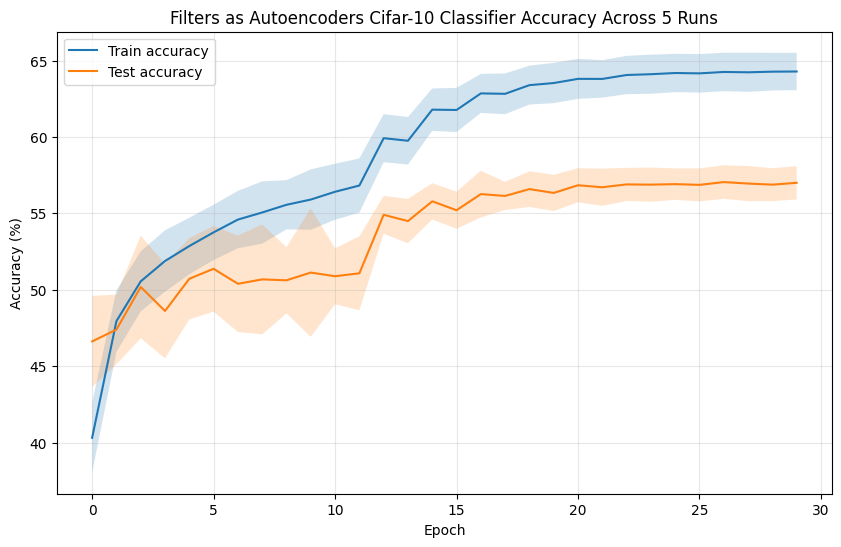

In [31]:
epochs = np.arange(len(mean_acc))



plt.figure(figsize=(10, 6))

plt.plot(epochs, mean_acc, label="Train accuracy")
plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2
)

plt.plot(epochs, test_mean_acc, label="Test accuracy")
plt.fill_between(
    epochs,
    test_mean_acc - test_std_acc,
    test_mean_acc + test_std_acc,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Filters as Autoencoders Cifar-10 Classifier Accuracy Across 5 Runs")

plt.legend()
plt.grid(alpha=0.3)
plt.show()

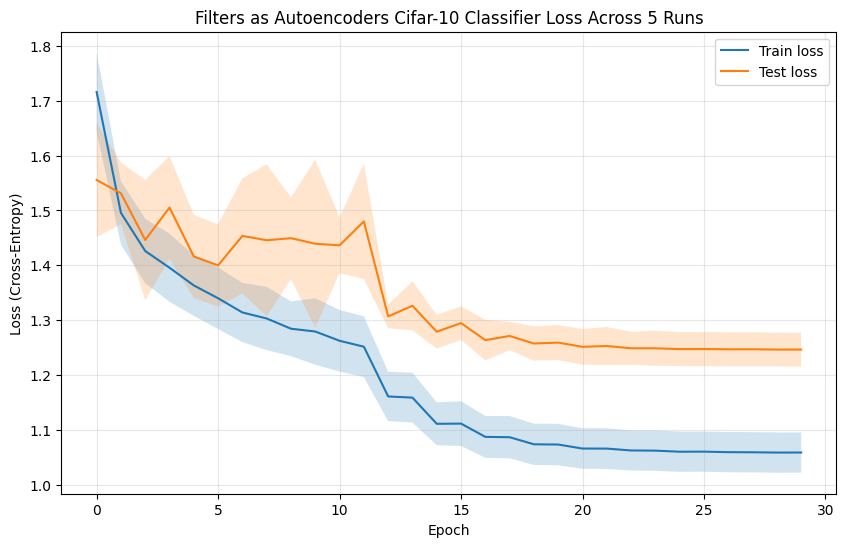

In [32]:

epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(10, 6))

plt.plot(epochs, task_mean_loss, label="Train loss")
plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2
)

plt.plot(epochs, test_task_mean_loss, label="Test loss")
plt.fill_between(
    epochs,
    test_task_mean_loss - test_task_std_loss,
    test_task_mean_loss + test_task_std_loss,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross-Entropy)")
plt.title("Filters as Autoencoders Cifar-10 Classifier Loss Across 5 Runs")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [33]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 78.9287109375
All peak memories (including the warm up run):


[78.599609375, 78.9287109375, 78.9287109375, 78.9287109375, 78.9287109375]

In [35]:
print(f"Mean training time: {mean_runtime} ")
print(f"All training times:")
print(times) #exluding the first run
print(run_times)

Mean training time: 619.6470126227499 
All training times:
[620.73029282 620.39821643 619.85921737 617.60032387]
[621.8876227079999, 620.7302928179997, 620.398216433, 619.8592173729999, 617.600323867]


In [36]:
print(f"Max avg train accuracy: {classifier_df["mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max (not to be compared with our average best result for the hebb models)

print(" " \
"")
print(f"Max avg test accuracy: {classifier_df["test_mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max

print(" " \
"")
print(f"Min train avg Loss: {classifier_df["task_mean_loss"].min():.2f}")

print(" " \
"")
print(f"Min avg Encoder Loss: {ae_df["encoder_mean_loss"].min():.2f} (to 10 dp: {ae_df["encoder_mean_loss"].min():.10f})")

Max avg train accuracy: 64.28
 
Max avg test accuracy: 57.05
 
Min train avg Loss: 1.06
 
Min avg Encoder Loss: 0.08 (to 10 dp: 0.0836700875)


In [37]:
print(f"final train mean accuracy: {classifier_df["mean_accuracy"][29]:.2f}")
print(f"final test mean accuracy: {classifier_df["test_mean_accuracy"][29]:.2f}")


final train mean accuracy: 64.28
final test mean accuracy: 57.00


In [38]:
#where std is deviation across runs
print(f"the above train accuracy with std: {classifier_df['std_accuracy'][29]:.2f}")
print(f"the above test accuracy with std: {classifier_df['test_std_accuracy'][29]:.2f}")

the above train accuracy with std: 1.22
the above test accuracy with std: 1.09


In [39]:
#average over final 10 epochs: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["mean_accuracy"][19:29]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][19:29]):.2f}%")

average train mean accuracy final 10 epochs: 64.04 ± 0.24%
average test mean accuracy final 10 epochs: 56.83 ± 0.18%


In [7]:
runs = np.array([run1, run2, run3, run4, run5])

# Mean accuracy over the final 10 epochs for each run
run_means = np.mean(runs, axis=1)

# Overall mean and standard deviation across runs
mean = np.mean(run_means)
std = np.std(run_means)

print(f"Final 10 epochs: {mean:.2f} ± {std:.2f}%")

Final 10 epochs: 56.90 ± 1.10%


# 5 Runs on STL-10

In [12]:
#count how many params of the model for STL10...

device = torch.device('cpu')

model = weight_share_nan_cnn.FilterCNN(
        input_dims=96,
        in_channels=3,

        kernel_size=5,
        stride=1,
        padding=2,

        n_filters=16,

        pool_padding=1,
        pool_kernel_size=4,
        pool_stride=2,

        bias=False,
        classes=10
    ).to(device)



for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))


filters.0.encoder.weight (1, 3, 5, 5) -> 75
filters.1.encoder.weight (1, 3, 5, 5) -> 75
filters.2.encoder.weight (1, 3, 5, 5) -> 75
filters.3.encoder.weight (1, 3, 5, 5) -> 75
filters.4.encoder.weight (1, 3, 5, 5) -> 75
filters.5.encoder.weight (1, 3, 5, 5) -> 75
filters.6.encoder.weight (1, 3, 5, 5) -> 75
filters.7.encoder.weight (1, 3, 5, 5) -> 75
filters.8.encoder.weight (1, 3, 5, 5) -> 75
filters.9.encoder.weight (1, 3, 5, 5) -> 75
filters.10.encoder.weight (1, 3, 5, 5) -> 75
filters.11.encoder.weight (1, 3, 5, 5) -> 75
filters.12.encoder.weight (1, 3, 5, 5) -> 75
filters.13.encoder.weight (1, 3, 5, 5) -> 75
filters.14.encoder.weight (1, 3, 5, 5) -> 75
filters.15.encoder.weight (1, 3, 5, 5) -> 75
fc.weight            (10, 36864) -> 368640
fc.bias              (10,) -> 10
369850


In [40]:

stl10_root = "../datasets/STL10"

base_transform = transforms.ToTensor()

stl10_train = datasets.STL10(
    root=stl10_root,
    split="train",
    download=True,
    transform=base_transform
)

stl10_test = datasets.STL10(
    root=stl10_root,
    split="test",
    download=True,
    transform=base_transform
)

100%|██████████| 2.64G/2.64G [06:49<00:00, 6.45MB/s]  


In [ ]:
all_encoder_histories = []
all_task_histories = []
all_accuracy_histories=[]

all_task_test_histories =[]
all_accuracy_test_histories =[]


peak_memory =[]
run_times= []

for seed in range(5): 

    print(f"model run: {seed}")


    model, training_history, test_history, elapsed = nan_cnn_experiment.train_annealing_linear_weight_share_nan_cnn(
        stl10_train,
        stl10_test,
        input_dims=96,
        in_channels=3,
        dual_lr=True,
        classifier_lr=0.001,
        ae_lr=0.00001, #using standard small learning rate (no parameter exploration of stl-10)

        bias=False,   
        n_ae_epochs=1,      
        n_classifier_epochs=30,
        batch_size=64,
        n_filters=16,

        stride=1,
        padding=2,
        kernel_size=5,

        pool_kernel_size=4,
        pool_stride=2,
        pool_padding=1,

        n_classes=10,
        seed=seed,
        seed_worker=seed_worker
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])
    all_accuracy_histories.append(training_history["train_accuracy"])


    all_task_test_histories.append(test_history["task_loss"])
    all_accuracy_test_histories.append(test_history["task_accuracy"])



    peak = torch.cuda.max_memory_allocated()

    peak_MB = peak / 1024**2
    print(f"peak memory from train : {peak_MB}")
    peak_memory.append(peak_MB)
    torch.cuda.reset_peak_memory_stats()
    print(f"memory now reset and is: {torch.cuda.max_memory_allocated()/ 1024**2} MB")
    print(f"time elapsed: {elapsed}")
    
    run_times.append(elapsed)

model run: 0
device is: cuda
Training AE...
Epoch [1/1], Encoder Training Loss: 0.0807
Training classifier...
Epoch [1/30], Task Training Loss: 5.0344, Accuracy: 29.24%, Task Test Loss: 1.7257527446746825, Task Test Accuracy: 42.5% LR: 0.001000
Epoch [2/30], Task Training Loss: 1.5113, Accuracy: 49.16%, Task Test Loss: 1.9334405059814452, Task Test Accuracy: 40.225% LR: 0.001000
Epoch [3/30], Task Training Loss: 1.3022, Accuracy: 56.28%, Task Test Loss: 3.1564037628173827, Task Test Accuracy: 35.6625% LR: 0.001000
Epoch [4/30], Task Training Loss: 1.3271, Accuracy: 59.36%, Task Test Loss: 2.569780725479126, Task Test Accuracy: 35.425% LR: 0.001000
Epoch [5/30], Task Training Loss: 1.0198, Accuracy: 64.86%, Task Test Loss: 1.7323824825286864, Task Test Accuracy: 48.2375% LR: 0.001000
Epoch [6/30], Task Training Loss: 0.7123, Accuracy: 75.58%, Task Test Loss: 2.2382975931167604, Task Test Accuracy: 40.8125% LR: 0.001000
Epoch [7/30], Task Training Loss: 0.5830, Accuracy: 80.78%, Task Tes

In [8]:
run1=[51.75, 51.4, 51.6625, 51.6125, 51.725, 51.55, 51.45, 51.6625, 51.525, 51.5125]
run2=[49.45, 49.35, 49.625, 49.6875, 49.525, 49.4375, 49.65, 49.8, 49.7125, 49.6875]
run3=[51.3375, 51.3875, 51.4625, 51.4, 51.6625, 51.5625, 51.55, 51.6, 51.6, 51.6125]
run4=[50.75, 51.1, 51.2, 51.175, 51.2125, 51.225, 51.125, 51.2625, 51.225, 51.1375]
run5=[51.0875, 51.25, 51.6125, 51.175, 51.4, 51.4375, 51.35, 51.3125, 51.375, 51.3625]


In [42]:
#make averages here

#avg encoder loss
encoder_losses = np.array(all_encoder_histories)
encoder_mean_loss = encoder_losses.mean(axis=0)
encoder_std_loss  = encoder_losses.std(axis=0)


#avg task loss
task_losses = np.array(all_task_histories)
task_mean_loss = task_losses.mean(axis=0)
task_std_loss  = task_losses.std(axis=0)


#avg accuracy
accuracies = np.array(all_accuracy_histories)
mean_acc = accuracies.mean(axis=0)
std_acc  = accuracies.std(axis=0)

#avg test task loss
test_task_losses = np.array(all_task_test_histories)
test_task_mean_loss = test_task_losses.mean(axis=0)
test_task_std_loss  = test_task_losses.std(axis=0)


#avg test accuracy
test_accuracies = np.array(all_accuracy_test_histories)
test_mean_acc = test_accuracies.mean(axis=0)
test_std_acc  = test_accuracies.std(axis=0)


#avg peak memory
relevant_peak_mems = np.array(peak_memory[1:]) # exclude the first run as a warm up
mean_peak_memory = relevant_peak_mems.mean()

times = np.array(run_times[1:])
mean_runtime = times.mean()


ae_epochs= np.arange(1, len(encoder_mean_loss)+1)

epochs = np.arange(1, len(task_mean_loss)+1)



In [43]:
ae_df = pd.DataFrame({
    "epoch": ae_epochs,
    "encoder_mean_loss": encoder_mean_loss,
    "encoder_std_loss" : encoder_std_loss
})


classifier_df = pd.DataFrame({
    #train
    "task_mean_loss": task_mean_loss,
    "task_std_loss": task_std_loss,

    "mean_accuracy": mean_acc,
    "std_accuracy": std_acc,

    #test
    "test_mean_loss": test_task_mean_loss,
    "test_task_std_loss" : test_task_std_loss,

    "test_mean_accuracy": test_mean_acc,
    "test_std_accuracy": test_std_acc


})

In [44]:
ae_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal_stl10_ae_epoch_results.csv",
    index=False,
)

In [45]:
classifier_df.to_csv(
    "/content/drive/MyDrive/research_jobs/faae_optimal_linear_1update_anneal__stl10_classifer_epoch_results.csv",
    index=False,
)

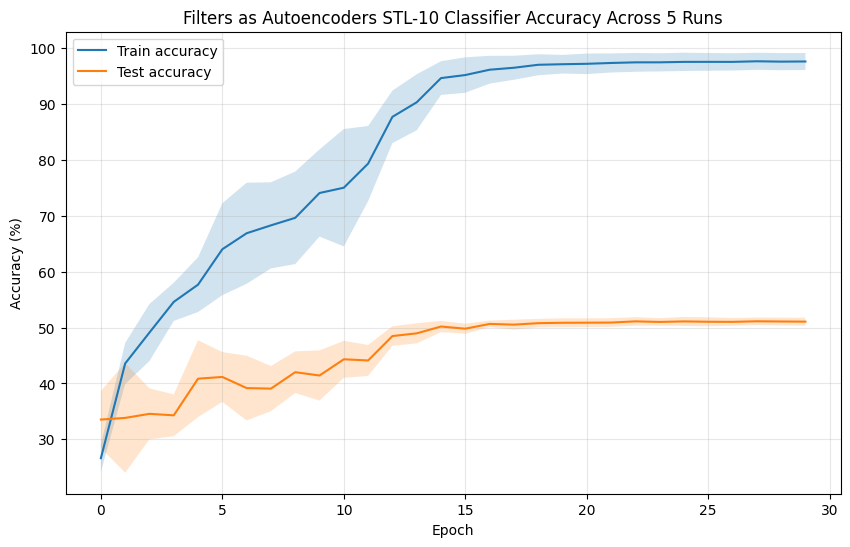

In [46]:
epochs = np.arange(len(mean_acc))



plt.figure(figsize=(10, 6))

plt.plot(epochs, mean_acc, label="Train accuracy")
plt.fill_between(
    epochs,
    mean_acc - std_acc,
    mean_acc + std_acc,
    alpha=0.2
)

plt.plot(epochs, test_mean_acc, label="Test accuracy")
plt.fill_between(
    epochs,
    test_mean_acc - test_std_acc,
    test_mean_acc + test_std_acc,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Filters as Autoencoders STL-10 Classifier Accuracy Across 5 Runs")

plt.legend()
plt.grid(alpha=0.3)
plt.show()

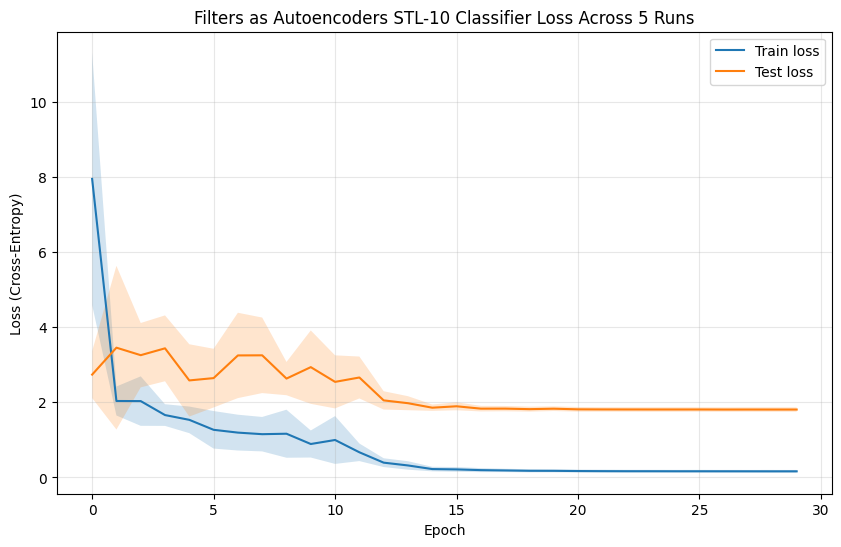

In [47]:

epochs = np.arange(len(task_mean_loss))

plt.figure(figsize=(10, 6))

plt.plot(epochs, task_mean_loss, label="Train loss")
plt.fill_between(
    epochs,
    task_mean_loss - task_std_loss,
    task_mean_loss + task_std_loss,
    alpha=0.2
)

plt.plot(epochs, test_task_mean_loss, label="Test loss")
plt.fill_between(
    epochs,
    test_task_mean_loss - test_task_std_loss,
    test_task_mean_loss + test_task_std_loss,
    alpha=0.2
)

plt.xlabel("Epoch")
plt.ylabel("Loss (Cross-Entropy)")
plt.title("Filters as Autoencoders STL-10 Classifier Loss Across 5 Runs")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [48]:
print(f"Mean max memory allocated: {mean_peak_memory}")
print("All peak memories (including the warm up run):")
peak_memory

Mean max memory allocated: 189.3740234375
All peak memories (including the warm up run):


[187.2099609375,
 189.6787109375,
 189.3662109375,
 189.3662109375,
 189.0849609375]

In [49]:
print(f"Mean training time: {mean_runtime} ")
print(f"All training times:")
print(times) #exluding the first run
print(run_times)

Mean training time: 217.66868761725004 
All training times:
[214.47410902 228.59781894 214.93936431 212.6634582 ]
[215.42054122100035, 214.47410901700005, 228.59781893500076, 214.93936431299971, 212.66345820399965]


In [50]:
print(f"Max avg train accuracy: {classifier_df["mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max (not to be compared with our average best result for the hebb models)

print(" " \
"")
print(f"Max avg test accuracy: {classifier_df["test_mean_accuracy"].max():.2f}") #that is, out of the runs, take the average every epoch, then take the max

print(" " \
"")
print(f"Min train avg Loss: {classifier_df["task_mean_loss"].min():.2f}")

print(" " \
"")
print(f"Min avg Encoder Loss: {ae_df["encoder_mean_loss"].min():.2f} (to 10 dp: {ae_df["encoder_mean_loss"].min():.10f})")

Max avg train accuracy: 97.68
 
Max avg test accuracy: 51.13
 
Min train avg Loss: 0.16
 
Min avg Encoder Loss: 0.09 (to 10 dp: 0.0944171225)


In [51]:
print(f"final train mean accuracy: {classifier_df["mean_accuracy"][29]:.2f}")
print(f"final test mean accuracy: {classifier_df["test_mean_accuracy"][29]:.2f}")


final train mean accuracy: 97.64
final test mean accuracy: 51.06


In [52]:
#where std is deviation across runs
print(f"the above train accuracy with std: {classifier_df['std_accuracy'][29]:.2f}")
print(f"the above test accuracy with std: {classifier_df['test_std_accuracy'][29]:.2f}")

the above train accuracy with std: 1.52
the above test accuracy with std: 0.71


In [53]:
#average over final 10 epochs: (where std is variability of the epoch means)
print(f"average train mean accuracy final 10 epochs: {np.mean(classifier_df["mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["mean_accuracy"][19:29]):.2f}%")
print(f"average test mean accuracy final 10 epochs: {np.mean(classifier_df["test_mean_accuracy"][19:29]):.2f} ± {np.std(classifier_df["test_mean_accuracy"][19:29]):.2f}%")

average train mean accuracy final 10 epochs: 97.47 ± 0.16%
average test mean accuracy final 10 epochs: 51.01 ± 0.10%


In [9]:
runs = np.array([run1, run2, run3, run4, run5])

# Mean accuracy over the final 10 epochs for each run
run_means = np.mean(runs, axis=1)

# Overall mean and standard deviation across runs
mean = np.mean(run_means)
std = np.std(run_means)

print(f"Final 10 epochs: {mean:.2f} ± {std:.2f}%")

Final 10 epochs: 51.03 ± 0.74%
